# Experiment Neural Networks with Dataset with two classes

In [182]:
import pandas as pd
import numpy as np
import tensorflow as tf
import os
import random as rn
from os.path import join, getsize
from tensorflow.keras import layers
from tensorflow.keras import models
from keras.preprocessing import image
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, Callback
from sklearn.preprocessing import MultiLabelBinarizer
from sklearn.preprocessing import LabelBinarizer
from sklearn import metrics
import matplotlib.pyplot as plt
import matplotlib.style as style


from PIL import Image
from tqdm import tqdm

setting dynamic memory

In [183]:
from tensorflow.compat.v1 import ConfigProto
from tensorflow.compat.v1 import InteractiveSession

#InteractiveSession().close

config = ConfigProto()
config.gpu_options.allow_growth = True
session = InteractiveSession(config = config)

c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\tensorflow\python\client\session.py:1771: UserWarning: An interactive session is already active. This can cause out-of-memory errors in some cases. You must explicitly call `InteractiveSession.close()` to release resources held by the other session(s).
  warnings.warn('An interactive session is already active. This can '


## Load Dataset

In [184]:
BATCH_SIZE = 64
CHANNELS = 3
IMG_HEIGHT = 240
IMG_WIDTH = 240
IMG_SIZE=(IMG_HEIGHT, IMG_WIDTH)
INPUT_SHAPE=IMG_SIZE + (3,)  # --> (224,224,3)
NUM_CLASSES=2
AUTOTUNE = tf.data.AUTOTUNE
SHUFFLE_BUFFER_SIZE = 1024

Utilities

In [185]:
def reset_random_seed():
  """ Set the random seed.
   
  """
  # The below is necessary for reproducible results of certain Python hash-based operations.
  os.environ["PYTHONHASHSEED"]=str(2)

  # The below is necessary for starting Numpy generated random numbers in a well-defined initial state.
  np.random.seed(2)

  # The below is necessary for starting core Python generated random numbers in a well-defined state.
  rn.seed(2)

  # The below tf.random.set_seed will make random number generation in TensorFlow have a well-defined initial state.
  tf.random.set_seed(2)
  

def get_dataset(path, img_size = IMG_SIZE, batch_size = BATCH_SIZE, shuffle = True):
    """ Get the dataset given the directory name.
    Args:
    - apth (str): a string representing the name of the directory from which the dataset is retrieved.
    
    Returns:
    - ds (PrefetchDataset): a Dataset containing the elements in the directory.
  """
    return tf.keras.preprocessing.image_dataset_from_directory(
        path,
        seed = 2,
        image_size = img_size,
        batch_size = batch_size,
        shuffle = shuffle
    )


def show_history_fit(history):
  """Show the loss and accuracy on validation and training set.
    Args:
    - history : result of the fit function.
  
  """
  acc = history.history['accuracy']
  val_acc = history.history['val_accuracy']

  loss = history.history['loss']
  val_loss = history.history['val_loss']

  plt.figure(figsize=(9, 9))
  plt.subplot(2, 2, 1)
  plt.plot(acc, label='Training Accuracy')
  plt.plot(val_acc, label='Validation Accuracy')
  plt.legend(loc='lower right')
  plt.ylabel('Accuracy')
  #plt.ylim([min(plt.ylim()),1])
  plt.title('Training and Validation Accuracy')

  plt.subplot(2, 2, 2)
  plt.plot(loss, label='Training Loss')
  plt.plot(val_loss, label='Validation Loss')
  plt.legend(loc='upper right')
  plt.ylabel('Cross Entropy')
  #plt.ylim([0,1.0])
  plt.title('Training and Validation Loss')
  plt.xlabel('epoch')
  plt.show()


def compile_model(model, optimizer = 'adam', learning_rate = 0.0001):
  """ compile the model passed.
    Args:
    - model: model of a Neural Network
    - optimizer (str): specify the type of the optimizer.
    - learning_rate (float): specify the learning rate
    
  """

  if optimizer == 'rmsprop':
    model.compile(
      optimizer = tf.keras.optimizers.RMSprop(learning_rate),
      loss = tf.keras.losses.SparseCategoricalCrossentropy(),
      metrics = ['accuracy']
    )
  elif optimizer == 'adam':
    model.compile(
      optimizer = tf.keras.optimizers.Adam(learning_rate),
      loss = tf.keras.losses.SparseCategoricalCrossentropy(),
      metrics = ['accuracy']
    )
  
  model.summary()


def fit_model(model, train, validation, path_model, epochs_par = 30, patience_par = 6):
  """ fit the model.
    Args:
    - model: neural network model.
    - train: training set.
    - validation: validation set.
    - path_model: path in which the best model will be saved.
    - epoch_par: number of epochs.
    - patience_par: max number of epochs in which not have improvements.    
    Returns:
    - history: history of the training.
    - model: the last model trained during the fit.
  """

  earlystopping = EarlyStopping(monitor='val_loss', mode='min', patience= patience_par, verbose=1)

  checkpoint = ModelCheckpoint(path_model,   
        monitor='val_loss', mode='min', verbose=1, 
        save_best_only=True, save_freq='epoch'
  )

  history = model.fit(train, epochs= epochs_par,
                        validation_data=validation,
                        verbose=1,
                        shuffle=True, 
                        callbacks=[earlystopping, checkpoint])

  return history, model


def load_best_model_and_evaluate(path, test, optimizer = 'adam', learning_rate = 0.0001, compile = False):
  """ load the best model saved and evaluate it.
    Args:
    - path: path of the best model.
    - test: test set.
    - optimizer: type of optimizer.
    - learning_rate: specify the learning rate.
    - compile: boolean if compile or not the model.
     
  
  """

  model = tf.keras.models.load_model(path)

  if compile:
    compile_model(model, optimizer, learning_rate)

  model.evaluate(test)


  y_pred = []  # store predicted labels
  y_true = []  # store true labels
  y_score = []
  # iterate over the dataset
  for image_batch, label_batch in test:   # use dataset.unbatch() with repeat
    # append true labels
    y_true.append(label_batch)
    # compute predictions
    preds = model.predict(image_batch)
    y_score.append(preds)
    # append predicted labels
    y_pred.append(np.argmax(preds, axis = 1))

  # convert the true and predicted labels into tensors
  correct_labels = tf.concat([item for item in y_true], axis = 0)
  predicted_labels = tf.concat([item for item in y_pred], axis = 0)

  print(predicted_labels)
  print(correct_labels)
  #print(y_score)
  y_score_curve= tf.concat([item for item in y_score], axis = 0)
  y_score_curve_2= tf.concat([item[1] for item in y_score_curve], axis = 0)
  #print(y_score_curve_2)
  #y_score_curve = np.squeeze(y_score_curve, axis = 1)
  print(y_score_curve_2.shape, correct_labels.shape)
  print("Classification report: ")
  print(metrics.classification_report(correct_labels,predicted_labels,digits = 4))
  metrics.ConfusionMatrixDisplay.from_predictions(correct_labels, predicted_labels)

 
  fpr,tpr,th = metrics.roc_curve(correct_labels,y_score_curve_2)
  roc_auc = metrics.roc_auc_score(correct_labels,y_score_curve_2)
  print("ROC Curve:")
  plt.figure()
  plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
  plt.plot([0, 1], [0, 1], color='navy', linestyle='--')
  plt.xlim([0.0, 1.0])
  plt.ylim([0.0, 1.0])
  plt.xlabel('False Positive Rate')
  plt.ylabel('True Positive Rate')
  plt.title('Receiver operating characteristic example')
  plt.legend(loc="lower right")
  plt.show()


def plot_class_distribution(path, name):
  """ Plot in a bar char the class distribution of data contained in the directory passed as parameter."""
  
  classes = [name for name in os.listdir(path)] 
  class_distribution = {}
  for dir in classes:
    CURR_DIR = path + "/" + dir
    class_distribution[dir] = len([name for name in os.listdir(CURR_DIR) if os.path.isfile(os.path.join(CURR_DIR, name))])

  total = 0
  for class_ in class_distribution:
    print(f'{class_}: {class_distribution[class_]}')
    total += class_distribution[class_]

  print()
  print(f'Total:{total}')

  fig, axes = plt.subplots(figsize=(10,len(class_distribution)))
  plt.bar(class_distribution.keys(), height=class_distribution.values())
  plt.title(f'Barplot of class distribution of {name} dataset');


  

In [186]:
path_dataset = './binary_dataset_splitted_balanced/'
path_train = path_dataset + 'train/'
path_validation = path_dataset + 'validation/'
path_test = path_dataset + 'test/'
general_path_models = './models/'


In [187]:
reset_random_seed()
train_ds = get_dataset(path_train)
val_ds = get_dataset(path_validation)
test_ds = get_dataset(path_test)

Found 40080 files belonging to 2 classes.
Found 10572 files belonging to 2 classes.
Found 10532 files belonging to 2 classes.


Negative: 20040
Positive: 20040

Total:40080
Negative: 4878
Positive: 5694

Total:10572
Negative: 4858
Positive: 5674

Total:10532


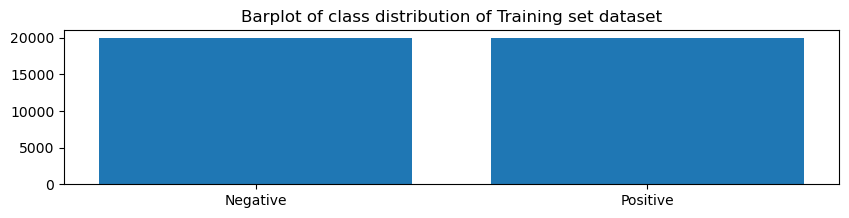

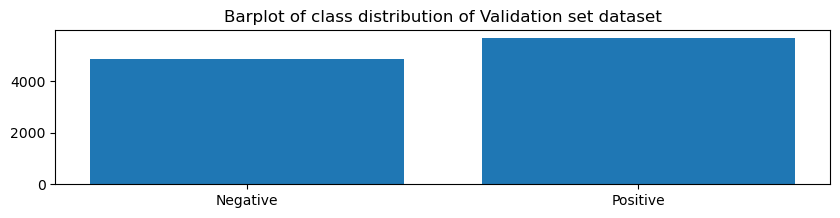

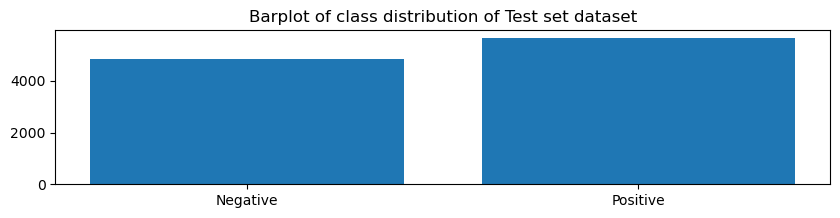

In [188]:
plot_class_distribution(path_train, 'Training set')

plot_class_distribution(path_validation, 'Validation set')

plot_class_distribution(path_test, 'Test set')

In [189]:
print(train_ds.class_names)


['Negative', 'Positive']


tf.Tensor(
[0 0 0 1 1 1 0 0 1 0 1 0 0 0 0 1 0 1 0 0 1 1 1 0 0 1 0 0 1 1 1 1 0 1 0 1 1
 0 1 1 0 1 0 1 1 1 0 1 1 0 0 0 0 0 0 0 1 0 0 0 0 1 0 1], shape=(64,), dtype=int32)


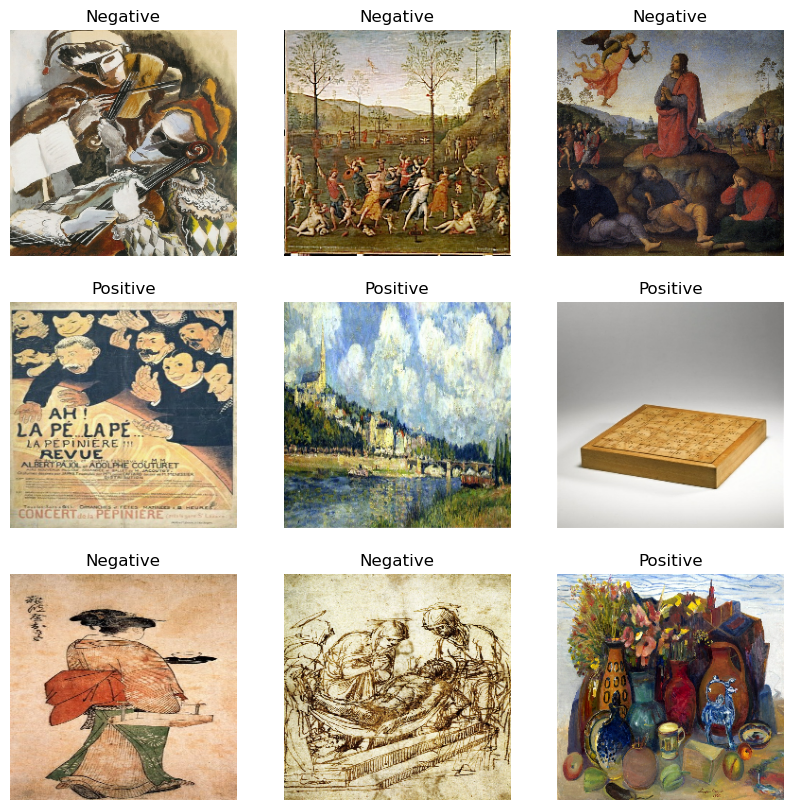

In [190]:
#visualize train samples
tf.random.set_seed(123)
plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
  print(labels)
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(train_ds.class_names[labels[i]])
    plt.axis("off")

In [191]:
train_ds = train_ds.prefetch(buffer_size = AUTOTUNE)
val_ds = val_ds.prefetch(buffer_size = AUTOTUNE)
test_ds = test_ds.prefetch(buffer_size = AUTOTUNE)

## FROM SCRATCH CNN

### Experiment 0 

Tiny example

In [20]:
input = tf.keras.Input(shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS))
x = layers.Rescaling(1./255)(input)
x = layers.Conv2D(32, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((5, 5))(x)
x = layers.Conv2D(64, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((5, 5))(x)
x = layers.Conv2D(128, (3, 3), activation='relu')(x)
x = layers.Flatten()(x)
x = layers.Dense(128, activation='relu')(x)
x = layers.Dropout(0.3)(x)
output = layers.Dense(NUM_CLASSES, activation='softmax')(x)
model = tf.keras.Model(inputs=input, outputs = output)

In [21]:
compile_model(model, 'adam', 0.0001)

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 rescaling (Rescaling)       (None, 250, 250, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 248, 248, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 49, 49, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 47, 47, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 9, 9, 64)         0         
 2D)                                                         

In [22]:
path_model = general_path_models+'/binary_models_sc/ex0_scratch_32_128_epoch_30_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model)

Epoch 1/30
627/627 [==============================] - ETA: 0s - loss: 0.6743 - accuracy: 0.5704
Epoch 00001: val_loss improved from inf to 0.65590, saving model to ./binary_models_sc\ex0_scratch_32_128_epoch_30_adam_1e-4.h5
627/627 [==============================] - 96s 140ms/step - loss: 0.6743 - accuracy: 0.5704 - val_loss: 0.6559 - val_accuracy: 0.6071
Epoch 2/30
626/627 [============================>.] - ETA: 0s - loss: 0.6512 - accuracy: 0.6132
Epoch 00002: val_loss improved from 0.65590 to 0.64159, saving model to ./binary_models_sc\ex0_scratch_32_128_epoch_30_adam_1e-4.h5
627/627 [==============================] - 90s 142ms/step - loss: 0.6512 - accuracy: 0.6132 - val_loss: 0.6416 - val_accuracy: 0.6245
Epoch 3/30
626/627 [============================>.] - ETA: 0s - loss: 0.6435 - accuracy: 0.6247
Epoch 00003: val_loss improved from 0.64159 to 0.64069, saving model to ./binary_models_sc\ex0_scratch_32_128_epoch_30_adam_1e-4.h5
627/627 [==============================] - 90s 143ms

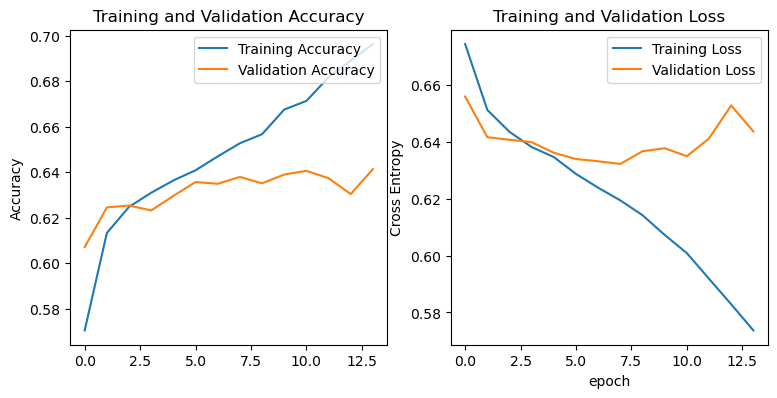

In [23]:
show_history_fit(history)

165/165 [==============================] - 18s 105ms/step - loss: 0.6354 - accuracy: 0.6335
tf.Tensor([0 0 1 ... 1 0 0], shape=(10532,), dtype=int64)
tf.Tensor([0 1 1 ... 1 0 0], shape=(10532,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.6056    0.5889    0.5972      4858
           1     0.6562    0.6717    0.6638      5674

    accuracy                         0.6335     10532
   macro avg     0.6309    0.6303    0.6305     10532
weighted avg     0.6329    0.6335    0.6331     10532



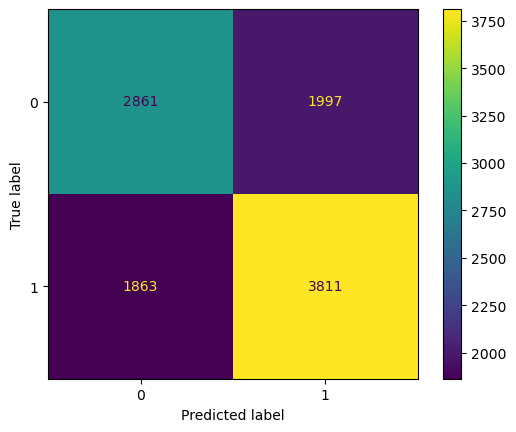

In [24]:
path_model = general_path_models+'/binary_models_sc/ex0_scratch_32_128_epoch_30_adam_1e-4.h5'
load_best_model_and_evaluate(path_model, test_ds)

### Experiment 1 -- Add 2 layers of 256 filters

In [30]:
input = tf.keras.Input(shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS))
x = layers.Rescaling(1./255)(input)


x = layers.Conv2D(32, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(64, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(128, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
x = layers.Flatten()(x)
output = layers.Dense(NUM_CLASSES, activation='softmax')(x)

model = tf.keras.Model(inputs=input, outputs = output)

In [31]:
compile_model(model, 'adam', 0.0001)

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 rescaling_2 (Rescaling)     (None, 250, 250, 3)       0         
                                                                 
 conv2d_8 (Conv2D)           (None, 248, 248, 32)      896       
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 124, 124, 32)     0         
 2D)                                                             
                                                                 
 conv2d_9 (Conv2D)           (None, 122, 122, 64)      18496     
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 61, 61, 64)       0         
 2D)                                                       

In [27]:
path_model = general_path_models+'/binary_models_sc/ex1_scratch_32_2x256_epoch_30_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model)

Epoch 1/30
627/627 [==============================] - ETA: 0s - loss: 0.6792 - accuracy: 0.5674
Epoch 00001: val_loss improved from inf to 0.66369, saving model to ./binary_models_sc\ex1_scratch_32_2x256_epoch_30_adam_1e-4.h5
627/627 [==============================] - 95s 147ms/step - loss: 0.6792 - accuracy: 0.5674 - val_loss: 0.6637 - val_accuracy: 0.5880
Epoch 2/30
626/627 [============================>.] - ETA: 0s - loss: 0.6589 - accuracy: 0.6045
Epoch 00002: val_loss improved from 0.66369 to 0.64935, saving model to ./binary_models_sc\ex1_scratch_32_2x256_epoch_30_adam_1e-4.h5
627/627 [==============================] - 95s 150ms/step - loss: 0.6589 - accuracy: 0.6045 - val_loss: 0.6493 - val_accuracy: 0.6201
Epoch 3/30
626/627 [============================>.] - ETA: 0s - loss: 0.6466 - accuracy: 0.6197
Epoch 00003: val_loss improved from 0.64935 to 0.63720, saving model to ./binary_models_sc\ex1_scratch_32_2x256_epoch_30_adam_1e-4.h5
627/627 [==============================] - 97s

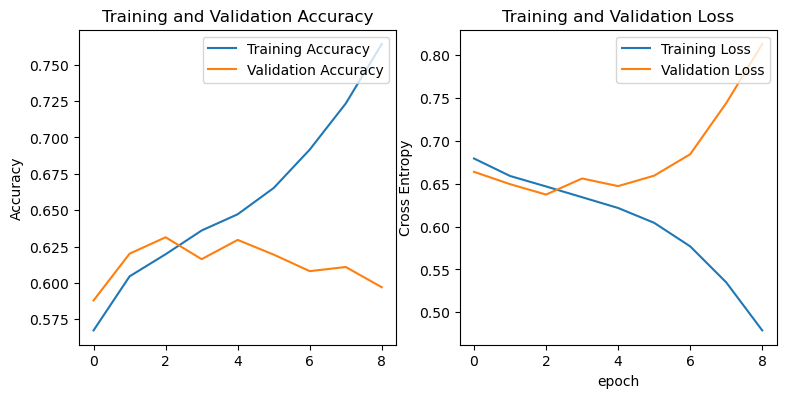

In [28]:
show_history_fit(history)

165/165 [==============================] - 35s 198ms/step - loss: 0.6445 - accuracy: 0.6175
tf.Tensor([1 0 1 ... 1 1 1], shape=(10532,), dtype=int64)
tf.Tensor([0 1 0 ... 0 0 1], shape=(10532,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.6064    0.4868    0.5401      4858
           1     0.6241    0.7295    0.6727      5674

    accuracy                         0.6175     10532
   macro avg     0.6153    0.6081    0.6064     10532
weighted avg     0.6159    0.6175    0.6115     10532



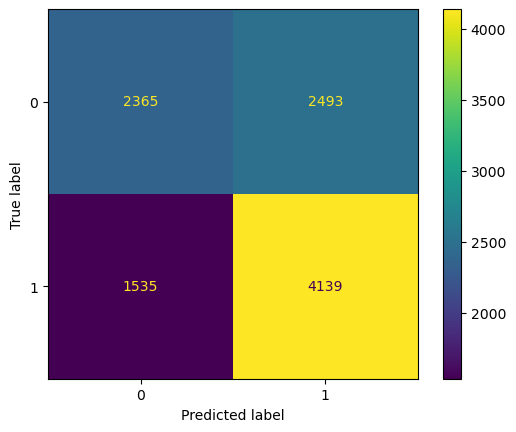

In [29]:
load_best_model_and_evaluate(path_model, test_ds)

### Experiment 2 -- Add 1 layer of 512 filters

Add Dense Layer and Dropout

In [32]:
input = tf.keras.Input(shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS))
x = layers.Rescaling(1./255)(input)
x = layers.Conv2D(32, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(64, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(128, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(512, (3, 3), activation='relu')(x)
x = layers.Flatten()(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.3)(x)
output = layers.Dense(NUM_CLASSES, activation='softmax')(x)

model = tf.keras.Model(inputs=input, outputs = output)

In [33]:
compile_model(model, 'adam', 0.0001)

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 rescaling_3 (Rescaling)     (None, 250, 250, 3)       0         
                                                                 
 conv2d_13 (Conv2D)          (None, 248, 248, 32)      896       
                                                                 
 max_pooling2d_8 (MaxPooling  (None, 124, 124, 32)     0         
 2D)                                                             
                                                                 
 conv2d_14 (Conv2D)          (None, 122, 122, 64)      18496     
                                                                 
 max_pooling2d_9 (MaxPooling  (None, 61, 61, 64)       0         
 2D)                                                       

In [34]:
path_model = general_path_models+'/binary_models_sc/ex2_scratch_32_2x256_512_dp_epoch_30_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model)

Epoch 1/30
627/627 [==============================] - ETA: 0s - loss: 0.6711 - accuracy: 0.5820
Epoch 00001: val_loss improved from inf to 0.65211, saving model to ./binary_models_sc\ex2_scratch_32_2x256_512_dp_epoch_30_adam_1e-4.h5
627/627 [==============================] - 96s 151ms/step - loss: 0.6711 - accuracy: 0.5820 - val_loss: 0.6521 - val_accuracy: 0.6126
Epoch 2/30
626/627 [============================>.] - ETA: 0s - loss: 0.6500 - accuracy: 0.6152
Epoch 00002: val_loss improved from 0.65211 to 0.63832, saving model to ./binary_models_sc\ex2_scratch_32_2x256_512_dp_epoch_30_adam_1e-4.h5
627/627 [==============================] - 99s 156ms/step - loss: 0.6500 - accuracy: 0.6152 - val_loss: 0.6383 - val_accuracy: 0.6312
Epoch 3/30
626/627 [============================>.] - ETA: 0s - loss: 0.6428 - accuracy: 0.6258
Epoch 00003: val_loss did not improve from 0.63832
627/627 [==============================] - 99s 156ms/step - loss: 0.6428 - accuracy: 0.6257 - val_loss: 0.6421 - va

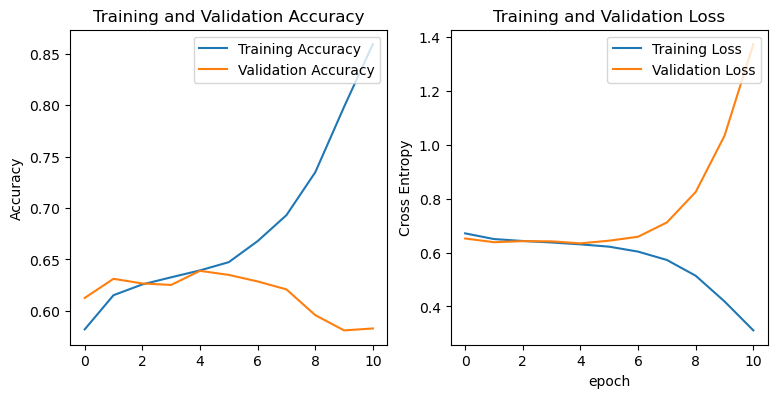

In [35]:
show_history_fit(history)

165/165 [==============================] - 37s 209ms/step - loss: 0.6377 - accuracy: 0.6241
tf.Tensor([1 0 0 ... 1 0 1], shape=(10532,), dtype=int64)
tf.Tensor([1 0 1 ... 1 0 1], shape=(10532,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.6011    0.5500    0.5744      4858
           1     0.6409    0.6875    0.6634      5674

    accuracy                         0.6241     10532
   macro avg     0.6210    0.6188    0.6189     10532
weighted avg     0.6225    0.6241    0.6224     10532



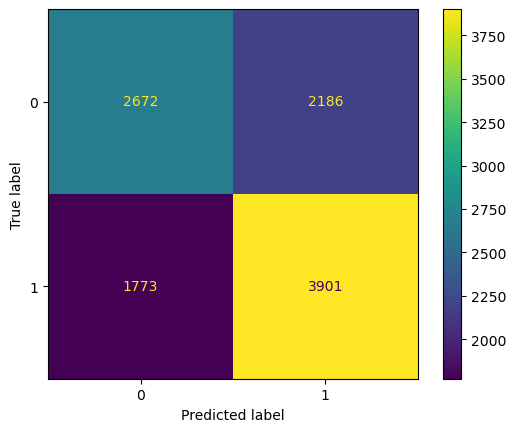

In [36]:
load_best_model_and_evaluate(path_model, test_ds)

### Experiment 3

More deep Network

In [42]:
input = tf.keras.Input(shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS))
x = layers.Rescaling(1./255)(input)
x = layers.Conv2D(32, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(64, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(128, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(512, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(1024, (3, 3), activation='relu')(x)
x = layers.Flatten()(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.4)(x)
output = layers.Dense(NUM_CLASSES, activation='softmax')(x)

model = tf.keras.Model(inputs=input, outputs = output)

In [43]:
compile_model(model, 'adam', 0.0001)

Model: "model_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 rescaling_5 (Rescaling)     (None, 250, 250, 3)       0         
                                                                 
 conv2d_26 (Conv2D)          (None, 248, 248, 32)      896       
                                                                 
 max_pooling2d_17 (MaxPoolin  (None, 124, 124, 32)     0         
 g2D)                                                            
                                                                 
 conv2d_27 (Conv2D)          (None, 122, 122, 64)      18496     
                                                                 
 max_pooling2d_18 (MaxPoolin  (None, 61, 61, 64)       0         
 g2D)                                                      

In [44]:
path_model = general_path_models+'/binary_models_sc/ex3_scratch_32_2x256_1024_dp_epoch_30_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model)

Epoch 1/30
626/627 [============================>.] - ETA: 0s - loss: 0.6798 - accuracy: 0.5686
Epoch 00001: val_loss improved from inf to 0.67135, saving model to ./binary_models_sc\ex3_scratch_32_2x256_1024_dp_epoch_30_adam_1e-4.h5
627/627 [==============================] - 96s 150ms/step - loss: 0.6797 - accuracy: 0.5686 - val_loss: 0.6713 - val_accuracy: 0.5829
Epoch 2/30
626/627 [============================>.] - ETA: 0s - loss: 0.6583 - accuracy: 0.6046
Epoch 00002: val_loss improved from 0.67135 to 0.64395, saving model to ./binary_models_sc\ex3_scratch_32_2x256_1024_dp_epoch_30_adam_1e-4.h5
627/627 [==============================] - 99s 156ms/step - loss: 0.6583 - accuracy: 0.6045 - val_loss: 0.6439 - val_accuracy: 0.6293
Epoch 3/30
626/627 [============================>.] - ETA: 0s - loss: 0.6455 - accuracy: 0.6222
Epoch 00003: val_loss improved from 0.64395 to 0.63919, saving model to ./binary_models_sc\ex3_scratch_32_2x256_1024_dp_epoch_30_adam_1e-4.h5
627/627 [=============

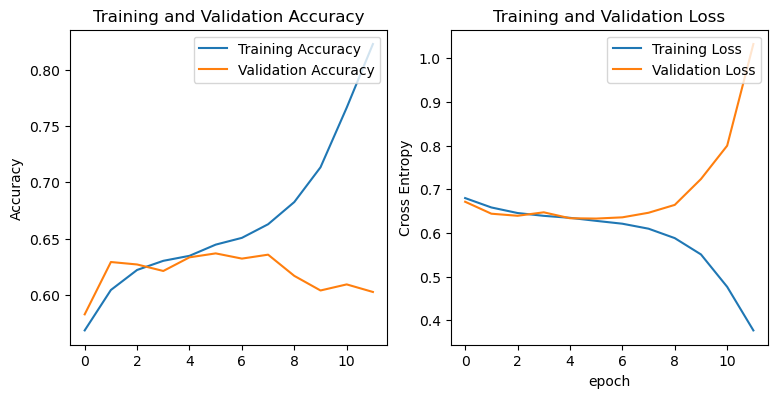

In [45]:
show_history_fit(history)

165/165 [==============================] - 20s 111ms/step - loss: 0.6405 - accuracy: 0.6274
tf.Tensor([0 1 0 ... 1 0 1], shape=(10532,), dtype=int64)
tf.Tensor([0 1 0 ... 1 0 1], shape=(10532,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.6015    0.5698    0.5852      4858
           1     0.6476    0.6768    0.6618      5674

    accuracy                         0.6274     10532
   macro avg     0.6245    0.6233    0.6235     10532
weighted avg     0.6263    0.6274    0.6265     10532



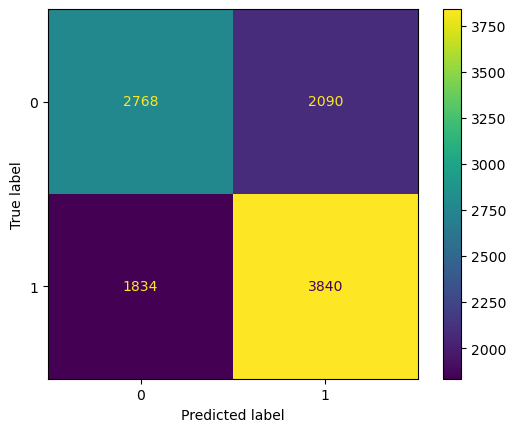

In [46]:
load_best_model_and_evaluate(path_model, test_ds)

### Experiment 4 

Insert GlobalAveragingPooling and Another dropout (to mitigate the overfit)

In [47]:
input = tf.keras.Input(shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS))
x = layers.Rescaling(1./255)(input)
x = layers.Conv2D(32, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(64, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(128, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(512, (3, 3), activation='relu')(x)
x = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(x)

x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(1024, (3, 3), activation='relu')(x)

x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.3)(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.4)(x)
output = layers.Dense(NUM_CLASSES, activation='softmax')(x)

model = tf.keras.Model(inputs=input, outputs = output)

In [48]:
compile_model(model, 'adam', 0.0001)

Model: "model_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_7 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 rescaling_6 (Rescaling)     (None, 250, 250, 3)       0         
                                                                 
 conv2d_33 (Conv2D)          (None, 248, 248, 32)      896       
                                                                 
 max_pooling2d_22 (MaxPoolin  (None, 124, 124, 32)     0         
 g2D)                                                            
                                                                 
 conv2d_34 (Conv2D)          (None, 122, 122, 64)      18496     
                                                                 
 max_pooling2d_23 (MaxPoolin  (None, 61, 61, 64)       0         
 g2D)                                                      

In [49]:
path_model = general_path_models+'/binary_models_sc/ex4_scratch_32_2x256_1024_dpx2_epoch_30_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model)

Epoch 1/30
627/627 [==============================] - ETA: 0s - loss: 0.6807 - accuracy: 0.5612
Epoch 00001: val_loss improved from inf to 0.67357, saving model to ./binary_models_sc\ex4_scratch_32_2x256_1024_dpx2_epoch_30_adam_1e-4.h5
627/627 [==============================] - 162s 255ms/step - loss: 0.6807 - accuracy: 0.5612 - val_loss: 0.6736 - val_accuracy: 0.5844
Epoch 2/30
626/627 [============================>.] - ETA: 0s - loss: 0.6629 - accuracy: 0.6003
Epoch 00002: val_loss improved from 0.67357 to 0.65145, saving model to ./binary_models_sc\ex4_scratch_32_2x256_1024_dpx2_epoch_30_adam_1e-4.h5
627/627 [==============================] - 168s 265ms/step - loss: 0.6629 - accuracy: 0.6004 - val_loss: 0.6514 - val_accuracy: 0.6154
Epoch 3/30
626/627 [============================>.] - ETA: 0s - loss: 0.6501 - accuracy: 0.6182
Epoch 00003: val_loss improved from 0.65145 to 0.64131, saving model to ./binary_models_sc\ex4_scratch_32_2x256_1024_dpx2_epoch_30_adam_1e-4.h5
627/627 [=====

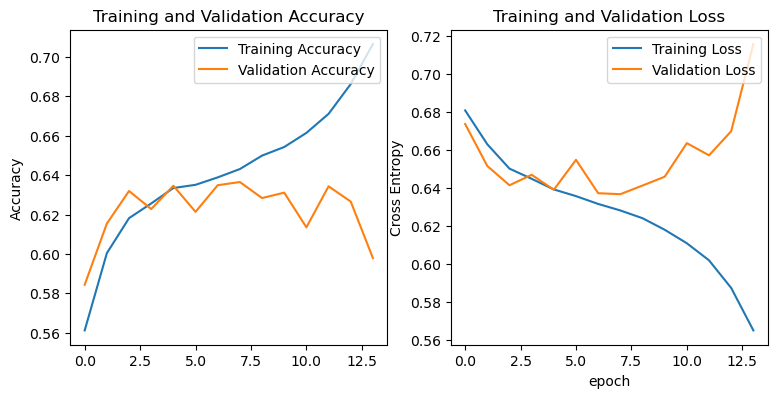

In [50]:
show_history_fit(history)

165/165 [==============================] - 19s 110ms/step - loss: 0.6415 - accuracy: 0.6276
tf.Tensor([0 1 0 ... 0 1 0], shape=(10532,), dtype=int64)
tf.Tensor([0 1 1 ... 1 1 0], shape=(10532,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.5846    0.6659    0.6226      4858
           1     0.6753    0.5948    0.6325      5674

    accuracy                         0.6276     10532
   macro avg     0.6299    0.6304    0.6275     10532
weighted avg     0.6334    0.6276    0.6279     10532



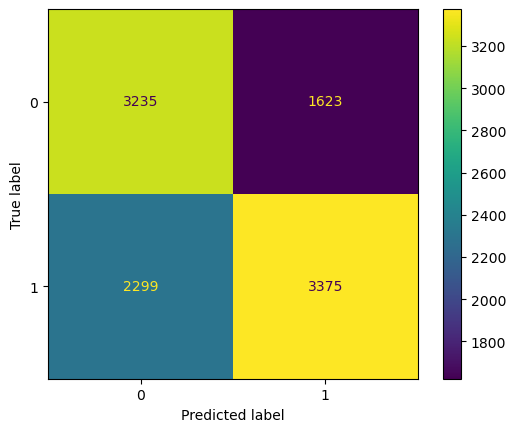

In [51]:
load_best_model_and_evaluate(path_model, test_ds)

### Experiment 5 

Dropout + Regularization L2 (on Conv Layers)

In [52]:
input = tf.keras.Input(shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS))
x = layers.Rescaling(1./255)(input)
x = layers.Conv2D(32, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(64, (3, 3), activation='relu', kernel_regularizer = tf.keras.regularizers.l2(0.001))(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(128, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(256, (3, 3), activation='relu', padding='same', kernel_regularizer = tf.keras.regularizers.l2(0.001))(x)
x = layers.Conv2D(256, (3, 3), activation='relu', padding='same', kernel_regularizer = tf.keras.regularizers.l2(0.001))(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(512, (3, 3), activation='relu')(x)
x = layers.Conv2D(512, (3, 3), activation='relu', padding='same', kernel_regularizer = tf.keras.regularizers.l2(0.001))(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(1024, (3, 3), activation='relu')(x)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.3)(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.4)(x)
output = layers.Dense(NUM_CLASSES, activation='softmax')(x)

model = tf.keras.Model(inputs=input, outputs = output)

In [53]:
compile_model(model, 'adam', 0.0001)

Model: "model_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_8 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 rescaling_7 (Rescaling)     (None, 250, 250, 3)       0         
                                                                 
 conv2d_41 (Conv2D)          (None, 248, 248, 32)      896       
                                                                 
 max_pooling2d_27 (MaxPoolin  (None, 124, 124, 32)     0         
 g2D)                                                            
                                                                 
 conv2d_42 (Conv2D)          (None, 122, 122, 64)      18496     
                                                                 
 max_pooling2d_28 (MaxPoolin  (None, 61, 61, 64)       0         
 g2D)                                                      

In [54]:
path_model = general_path_models+'/binary_models_sc/ex5_scratch_32_2x256_1024_dpx2_regulariz_epoch_30_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model)

Epoch 1/30
626/627 [============================>.] - ETA: 0s - loss: 0.8822 - accuracy: 0.5526
Epoch 00001: val_loss improved from inf to 0.69039, saving model to ./binary_models_sc\ex5_scratch_32_2x256_1024_dpx2_regulariz_epoch_30_adam_1e-4.h5
627/627 [==============================] - 100s 156ms/step - loss: 0.8821 - accuracy: 0.5527 - val_loss: 0.6904 - val_accuracy: 0.6030
Epoch 2/30
626/627 [============================>.] - ETA: 0s - loss: 0.6833 - accuracy: 0.6008
Epoch 00002: val_loss improved from 0.69039 to 0.66629, saving model to ./binary_models_sc\ex5_scratch_32_2x256_1024_dpx2_regulariz_epoch_30_adam_1e-4.h5
627/627 [==============================] - 98s 155ms/step - loss: 0.6833 - accuracy: 0.6008 - val_loss: 0.6663 - val_accuracy: 0.6210
Epoch 3/30
626/627 [============================>.] - ETA: 0s - loss: 0.6679 - accuracy: 0.6140
Epoch 00003: val_loss improved from 0.66629 to 0.66618, saving model to ./binary_models_sc\ex5_scratch_32_2x256_1024_dpx2_regulariz_epoch_3

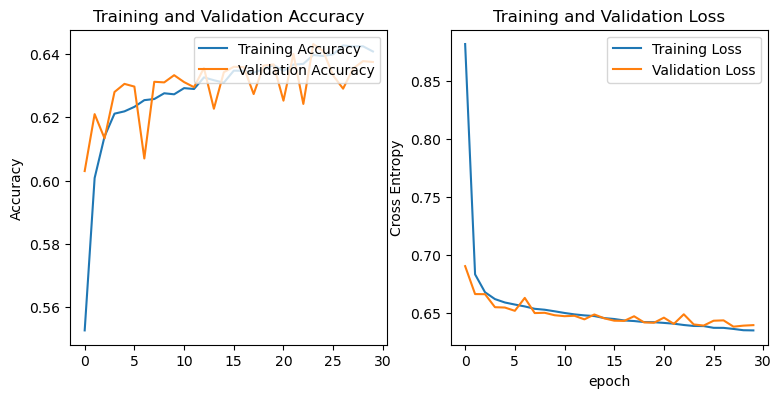

In [55]:
show_history_fit(history)

165/165 [==============================] - 19s 106ms/step - loss: 0.6407 - accuracy: 0.6297
tf.Tensor([1 0 1 ... 1 0 1], shape=(10532,), dtype=int64)
tf.Tensor([1 0 1 ... 0 0 1], shape=(10532,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.5951    0.6169    0.6058      4858
           1     0.6614    0.6406    0.6509      5674

    accuracy                         0.6297     10532
   macro avg     0.6283    0.6288    0.6283     10532
weighted avg     0.6308    0.6297    0.6301     10532



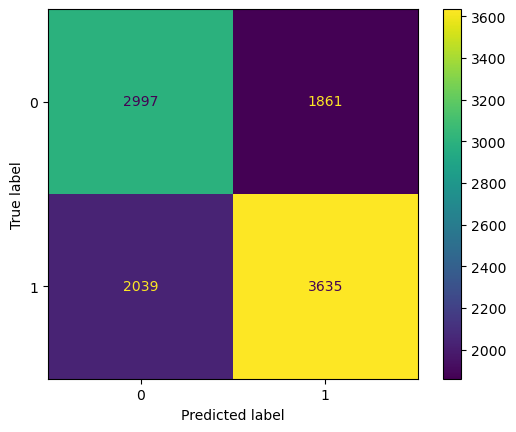

In [56]:
load_best_model_and_evaluate(path_model, test_ds)

### Experiment 6

Remove some conv layers

In [17]:
input = tf.keras.Input(shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS))
x = layers.Rescaling(1./255)(input)
x = layers.Conv2D(32, (3, 3), activation='relu')(x)

x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(64, (3, 3), activation='relu', kernel_regularizer = tf.keras.regularizers.l2(0.001))(x)

x = layers.Conv2D(128, (3, 3), activation='relu')(x)

x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(256, (3, 3), activation='relu', padding='same', kernel_regularizer = tf.keras.regularizers.l2(0.001))(x)
x = layers.Conv2D(256, (3, 3), activation='relu', padding='same', kernel_regularizer = tf.keras.regularizers.l2(0.001))(x)

x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(512, (3, 3), activation='relu')(x)
x = layers.Conv2D(512, (3, 3), activation='relu', padding='same', kernel_regularizer = tf.keras.regularizers.l2(0.001))(x)

x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(1024, (3, 3), activation='relu')(x)

x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.3)(x)
x = layers.Dense(512, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.001))(x)
x = layers.Dropout(0.4)(x)
output = layers.Dense(NUM_CLASSES, activation='softmax')(x)

model = tf.keras.Model(inputs=input, outputs = output)

In [18]:
compile_model(model, 'adam', 0.001)

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 rescaling_1 (Rescaling)     (None, 250, 250, 3)       0         
                                                                 
 conv2d_8 (Conv2D)           (None, 248, 248, 32)      896       
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 124, 124, 32)     0         
 2D)                                                             
                                                                 
 conv2d_9 (Conv2D)           (None, 122, 122, 64)      18496     
                                                                 
 conv2d_10 (Conv2D)          (None, 120, 120, 128)     73856     
                                                           

In [19]:
path_model = general_path_models+'/binary_models_sc/ex6_scratch_32_2x256_1024_dpx2_regulariz_batchNorm_epoch_30_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model)

Epoch 1/30
627/627 [==============================] - ETA: 0s - loss: 0.7409 - accuracy: 0.5000
Epoch 00001: val_loss improved from inf to 0.69338, saving model to ./binary_models_sc\ex6_scratch_32_2x256_1024_dpx2_regulariz_batchNorm_epoch_30_adam_1e-4.h5
627/627 [==============================] - 233s 368ms/step - loss: 0.7409 - accuracy: 0.5000 - val_loss: 0.6934 - val_accuracy: 0.4614
Epoch 2/30
627/627 [==============================] - ETA: 0s - loss: 0.6932 - accuracy: 0.4994
Epoch 00002: val_loss did not improve from 0.69338
627/627 [==============================] - 230s 366ms/step - loss: 0.6932 - accuracy: 0.4994 - val_loss: 0.6936 - val_accuracy: 0.4614
Epoch 3/30
627/627 [==============================] - ETA: 0s - loss: 0.6932 - accuracy: 0.4995
Epoch 00003: val_loss improved from 0.69338 to 0.69330, saving model to ./binary_models_sc\ex6_scratch_32_2x256_1024_dpx2_regulariz_batchNorm_epoch_30_adam_1e-4.h5
627/627 [==============================] - 229s 364ms/step - loss: 

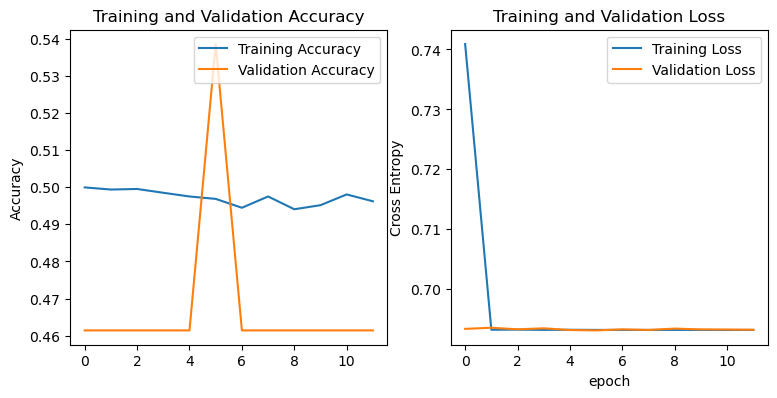

In [20]:
show_history_fit(history)

165/165 [==============================] - 20s 114ms/step - loss: 0.6931 - accuracy: 0.5387
tf.Tensor([1 1 1 ... 1 1 1], shape=(10532,), dtype=int64)
tf.Tensor([0 1 0 ... 0 0 1], shape=(10532,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.0000    0.0000    0.0000      4858
           1     0.5387    1.0000    0.7002      5674

    accuracy                         0.5387     10532
   macro avg     0.2694    0.5000    0.3501     10532
weighted avg     0.2902    0.5387    0.3772     10532



c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


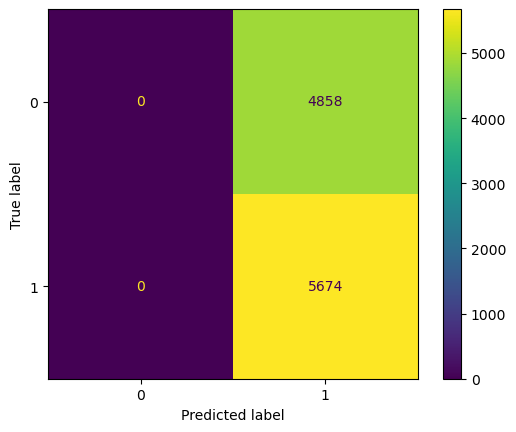

In [21]:
load_best_model_and_evaluate(path_model, test_ds)

### Experiment 7 

As in experiment 6 but with some modification

In [14]:
input = tf.keras.Input(shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS))
x = layers.Rescaling(1./255)(input)
x = layers.Conv2D(32, (3, 3), activation='relu')(x)

x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(64, (3, 3), activation='relu', kernel_regularizer = tf.keras.regularizers.l2(0.001))(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(128, (3, 3), activation='relu')(x)
x = layers.BatchNormalization()(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(256, (3, 3), activation='relu', padding='same', kernel_regularizer = tf.keras.regularizers.l2(0.001))(x)
x = layers.Conv2D(256, (3, 3), activation='relu', padding='same', kernel_regularizer = tf.keras.regularizers.l2(0.001))(x)
x = layers.BatchNormalization()(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(512, (3, 3), activation='relu')(x)
x = layers.Conv2D(512, (3, 3), activation='relu', padding='same', kernel_regularizer = tf.keras.regularizers.l2(0.001))(x)
x = layers.BatchNormalization()(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(1024, (3, 3), activation='relu')(x)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.3)(x)
x = layers.Dense(512, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.001))(x)
x = layers.Dropout(0.4)(x)
output = layers.Dense(NUM_CLASSES, activation='softmax')(x)

model = tf.keras.Model(inputs=input, outputs = output)

In [15]:
compile_model(model, 'adam', 0.0001)

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 rescaling_1 (Rescaling)     (None, 250, 250, 3)       0         
                                                                 
 conv2d_8 (Conv2D)           (None, 248, 248, 32)      896       
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 124, 124, 32)     0         
 2D)                                                             
                                                                 
 conv2d_9 (Conv2D)           (None, 122, 122, 64)      18496     
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 61, 61, 64)       0         
 2D)                                                       

In [16]:
path_model = general_path_models+'/binary_models_sc/ex7_scratch_32_2x256_1024_dpx2_regulariz_batchNorm_epoch_30_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model)

Epoch 1/30
627/627 [==============================] - ETA: 0s - loss: 2.1793 - accuracy: 0.5609
Epoch 00001: val_loss improved from inf to 1.94030, saving model to ./binary_models_sc\ex7_scratch_32_2x256_1024_dpx2_regulariz_batchNorm_epoch_30_adam_1e-4.h5
627/627 [==============================] - 120s 184ms/step - loss: 2.1793 - accuracy: 0.5609 - val_loss: 1.9403 - val_accuracy: 0.5698
Epoch 2/30
626/627 [============================>.] - ETA: 0s - loss: 1.7551 - accuracy: 0.5970
Epoch 00002: val_loss improved from 1.94030 to 1.60846, saving model to ./binary_models_sc\ex7_scratch_32_2x256_1024_dpx2_regulariz_batchNorm_epoch_30_adam_1e-4.h5
627/627 [==============================] - 116s 183ms/step - loss: 1.7551 - accuracy: 0.5970 - val_loss: 1.6085 - val_accuracy: 0.5453
Epoch 3/30
626/627 [============================>.] - ETA: 0s - loss: 1.4344 - accuracy: 0.6101
Epoch 00003: val_loss improved from 1.60846 to 1.30696, saving model to ./binary_models_sc\ex7_scratch_32_2x256_1024_d

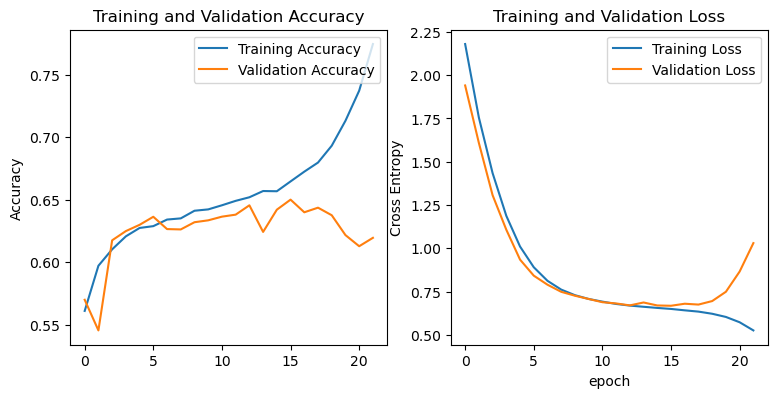

In [17]:
show_history_fit(history)

165/165 [==============================] - 20s 111ms/step - loss: 0.6729 - accuracy: 0.6396
tf.Tensor([0 1 1 ... 1 0 0], shape=(10532,), dtype=int64)
tf.Tensor([0 1 1 ... 1 0 0], shape=(10532,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.6370    0.5076    0.5650      4858
           1     0.6409    0.7524    0.6922      5674

    accuracy                         0.6395     10532
   macro avg     0.6390    0.6300    0.6286     10532
weighted avg     0.6391    0.6395    0.6335     10532



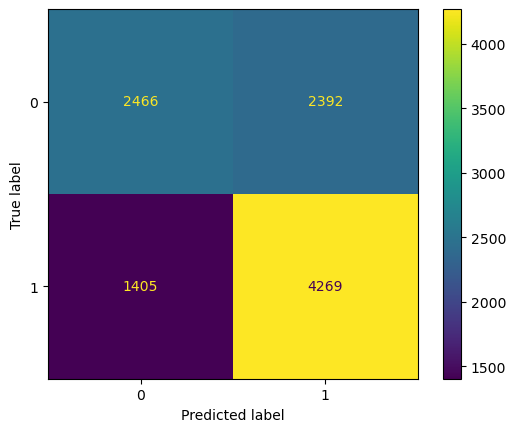

In [18]:
load_best_model_and_evaluate(path_model, test_ds)

### Experiment 8 

Network with less layers and Regularization L2

In [11]:
input = tf.keras.Input(shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS))
x = layers.Rescaling(1./255)(input)
x = layers.Conv2D(32, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(64, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(128, (3, 3), activation='relu')(x)
x = layers.BatchNormalization()(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(256, (3, 3), activation='relu', padding='same', kernel_regularizer=tf.keras.regularizers.l2(0.01))(x)
x = layers.Conv2D(256, (3, 3), activation='relu', padding='same', kernel_regularizer=tf.keras.regularizers.l2(0.01))(x)
x = layers.BatchNormalization()(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(512, (3, 3), activation='relu')(x)

x = layers.Flatten()(x)
x = layers.Dense(512, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01))(x)
x = layers.Dropout(0.4)(x)
output = layers.Dense(NUM_CLASSES, activation='softmax')(x)

model = tf.keras.Model(inputs=input, outputs = output)

In [12]:
compile_model(model, 'adam', 0.0001)

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 rescaling (Rescaling)       (None, 250, 250, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 248, 248, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 124, 124, 32)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 122, 122, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 61, 61, 64)       0         
 2D)                                                         

In [13]:
path_model = general_path_models+'/binary_models_sc/ex8_scratch_32_2x256_512_dp_regular_batchnorm_epoch_30_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model)

Epoch 1/30
627/627 [==============================] - ETA: 0s - loss: 6.1496 - accuracy: 0.5872
Epoch 00001: val_loss improved from inf to 2.50277, saving model to ./binary_models_sc\ex8_scratch_32_2x256_512_dp_regular_batchnorm_epoch_30_adam_1e-4.h5
627/627 [==============================] - 115s 173ms/step - loss: 6.1496 - accuracy: 0.5872 - val_loss: 2.5028 - val_accuracy: 0.5807
Epoch 2/30
626/627 [============================>.] - ETA: 0s - loss: 1.5891 - accuracy: 0.6067
Epoch 00002: val_loss improved from 2.50277 to 1.07392, saving model to ./binary_models_sc\ex8_scratch_32_2x256_512_dp_regular_batchnorm_epoch_30_adam_1e-4.h5
627/627 [==============================] - 106s 167ms/step - loss: 1.5889 - accuracy: 0.6067 - val_loss: 1.0739 - val_accuracy: 0.5975
Epoch 3/30
626/627 [============================>.] - ETA: 0s - loss: 0.8684 - accuracy: 0.6213
Epoch 00003: val_loss improved from 1.07392 to 0.75082, saving model to ./binary_models_sc\ex8_scratch_32_2x256_512_dp_regular_b

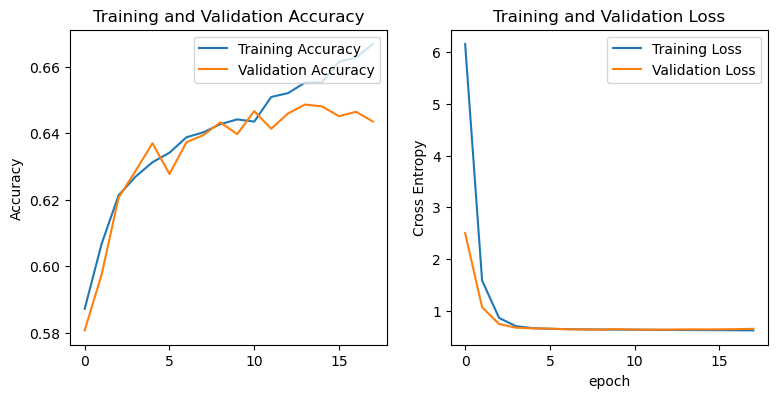

In [14]:
show_history_fit(history)

165/165 [==============================] - 19s 105ms/step - loss: 0.6449 - accuracy: 0.6385
tf.Tensor([0 0 1 ... 1 0 0], shape=(10532,), dtype=int64)
tf.Tensor([0 1 1 ... 1 0 0], shape=(10532,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.6224    0.5502    0.5841      4858
           1     0.6497    0.7141    0.6804      5674

    accuracy                         0.6385     10532
   macro avg     0.6360    0.6322    0.6322     10532
weighted avg     0.6371    0.6385    0.6360     10532



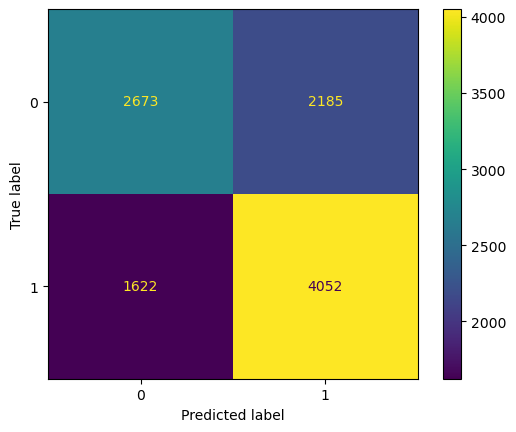

In [15]:
load_best_model_and_evaluate(path_model, test_ds)

### Experiment 9 

Add BatchNormalization and use Regularization L1

In [12]:
input = tf.keras.Input(shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS))
x = layers.Rescaling(1./255)(input)
x = layers.Conv2D(32, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(64, (3, 3), activation='relu', kernel_regularizer = tf.keras.regularizers.L1(0.001))(x)
x = layers.Conv2D(128, (3, 3), activation='relu')(x)
x = layers.BatchNormalization()(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(256, (3, 3), activation='relu', padding='same', kernel_regularizer = tf.keras.regularizers.L1(0.001))(x)
x = layers.Conv2D(256, (3, 3), activation='relu', padding='same', kernel_regularizer = tf.keras.regularizers.L1(0.001))(x)
x = layers.BatchNormalization()(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(512, (3, 3), activation='relu')(x)
x = layers.Conv2D(512, (3, 3), activation='relu', padding='same', kernel_regularizer = tf.keras.regularizers.L1(0.001))(x)
x = layers.BatchNormalization()(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(1024, (3, 3), activation='relu')(x)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.3)(x)
x = layers.Dense(512, activation='relu', kernel_regularizer=tf.keras.regularizers.L1(0.001))(x)
x = layers.Dropout(0.4)(x)
output = layers.Dense(NUM_CLASSES, activation='softmax')(x)

model = tf.keras.Model(inputs=input, outputs = output)

In [13]:
compile_model(model, 'adam', 0.0001)

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 240, 240, 3)]     0         
                                                                 
 rescaling (Rescaling)       (None, 240, 240, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 238, 238, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 119, 119, 32)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 117, 117, 64)      18496     
                                                                 
 conv2d_2 (Conv2D)           (None, 115, 115, 128)     73856     
                                                             

In [14]:
path_model = general_path_models+'/binary_models_sc/ex9_scratch_32_2x256_512_1024_dp_regularL1_batchnorm_epoch_35_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model, 35, 10)

Epoch 1/35
627/627 [==============================] - ETA: 0s - loss: 24.1419 - accuracy: 0.5728
Epoch 00001: val_loss improved from inf to 6.51481, saving model to ./binary_models_sc\ex9_scratch_32_2x256_512_1024_dp_regularL1_batchnorm_epoch_35_adam_1e-4.h5
627/627 [==============================] - 263s 406ms/step - loss: 24.1419 - accuracy: 0.5728 - val_loss: 6.5148 - val_accuracy: 0.4614
Epoch 2/35
627/627 [==============================] - ETA: 0s - loss: 3.2073 - accuracy: 0.6141
Epoch 00002: val_loss improved from 6.51481 to 1.61916, saving model to ./binary_models_sc\ex9_scratch_32_2x256_512_1024_dp_regularL1_batchnorm_epoch_35_adam_1e-4.h5
627/627 [==============================] - 257s 408ms/step - loss: 3.2073 - accuracy: 0.6141 - val_loss: 1.6192 - val_accuracy: 0.6087
Epoch 3/35
627/627 [==============================] - ETA: 0s - loss: 1.1187 - accuracy: 0.6186
Epoch 00003: val_loss improved from 1.61916 to 0.86729, saving model to ./binary_models_sc\ex9_scratch_32_2x256_

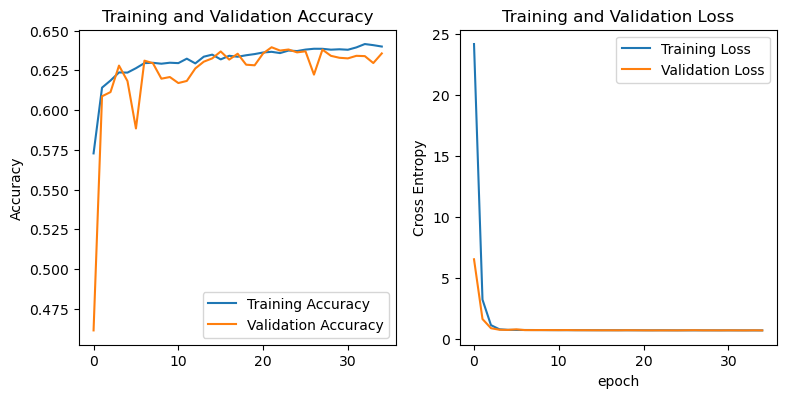

In [20]:
show_history_fit(history)

165/165 [==============================] - 36s 207ms/step - loss: 0.6935 - accuracy: 0.6279
tf.Tensor([0 1 1 ... 1 0 0], shape=(10532,), dtype=int64)
tf.Tensor([0 1 1 ... 1 0 0], shape=(10532,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.5903    0.6315    0.6102      4858
           1     0.6645    0.6248    0.6440      5674

    accuracy                         0.6279     10532
   macro avg     0.6274    0.6282    0.6271     10532
weighted avg     0.6303    0.6279    0.6284     10532



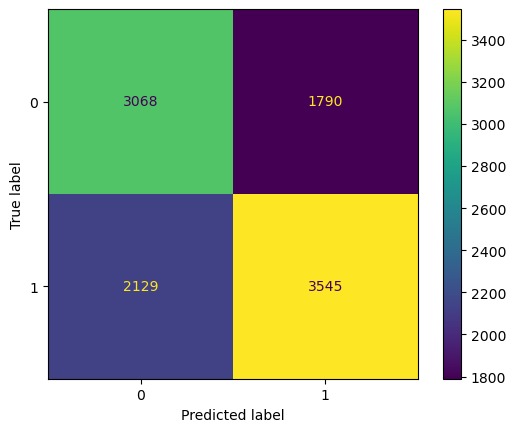

In [16]:
load_best_model_and_evaluate(path_model, test_ds)

Provare ad allenare la rete dell'esperimento 8 però con una patience manggiore per vedere se la rete riesce a migliorare o a trovare una mappatura maggiore

### Experiment 10 

As the network in the experiment 9 but with less Conv Layers

In [21]:
input = tf.keras.Input(shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS))
x = layers.Rescaling(1./255)(input)
x = layers.Conv2D(32, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(64, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(128, (3, 3), activation='relu')(x)
x = layers.BatchNormalization()(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(256, (3, 3), activation='relu', padding='same', kernel_regularizer=tf.keras.regularizers.l2(0.01))(x)
x = layers.Conv2D(256, (3, 3), activation='relu', padding='same', kernel_regularizer=tf.keras.regularizers.l2(0.01))(x)
x = layers.BatchNormalization()(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(512, (3, 3), activation='relu')(x)

x = layers.Flatten()(x)
x = layers.Dense(512, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01))(x)
x = layers.Dropout(0.4)(x)
output = layers.Dense(NUM_CLASSES, activation='softmax')(x)

model = tf.keras.Model(inputs=input, outputs = output)

In [22]:
compile_model(model, 'adam', 0.0001)

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 240, 240, 3)]     0         
                                                                 
 rescaling_1 (Rescaling)     (None, 240, 240, 3)       0         
                                                                 
 conv2d_8 (Conv2D)           (None, 238, 238, 32)      896       
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 119, 119, 32)     0         
 2D)                                                             
                                                                 
 conv2d_9 (Conv2D)           (None, 117, 117, 64)      18496     
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 58, 58, 64)       0         
 2D)                                                       

In [23]:
path_model = general_path_models+'/binary_models_sc/ex10_scratch_32_2x256_512_dp_regular_batchnorm_epoch_30_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model, 35, 10)

Epoch 1/35
627/627 [==============================] - ETA: 0s - loss: 6.2273 - accuracy: 0.5769
Epoch 00001: val_loss improved from inf to 2.44800, saving model to ./binary_models_sc\ex10_scratch_32_2x256_512_dp_regular_batchnorm_epoch_30_adam_1e-4.h5
627/627 [==============================] - 146s 229ms/step - loss: 6.2273 - accuracy: 0.5769 - val_loss: 2.4480 - val_accuracy: 0.5826
Epoch 2/35
626/627 [============================>.] - ETA: 0s - loss: 1.5498 - accuracy: 0.6047
Epoch 00002: val_loss improved from 2.44800 to 1.06008, saving model to ./binary_models_sc\ex10_scratch_32_2x256_512_dp_regular_batchnorm_epoch_30_adam_1e-4.h5
627/627 [==============================] - 184s 291ms/step - loss: 1.5496 - accuracy: 0.6047 - val_loss: 1.0601 - val_accuracy: 0.6102
Epoch 3/35
626/627 [============================>.] - ETA: 0s - loss: 0.8582 - accuracy: 0.6186
Epoch 00003: val_loss improved from 1.06008 to 0.78698, saving model to ./binary_models_sc\ex10_scratch_32_2x256_512_dp_regula

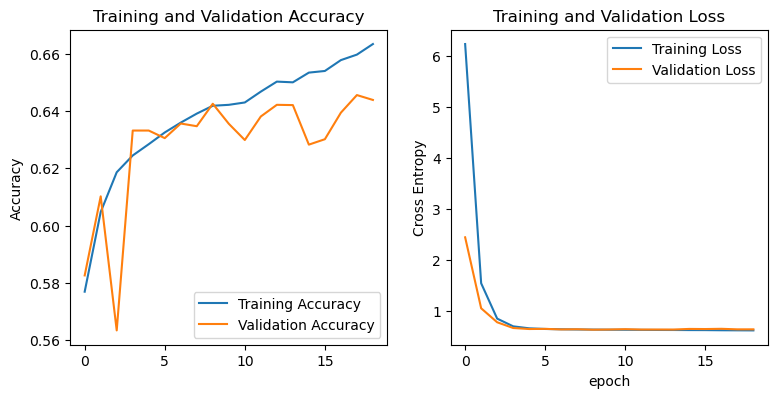

In [24]:
show_history_fit(history)

165/165 [==============================] - 20s 116ms/step - loss: 0.6457 - accuracy: 0.6326
tf.Tensor([0 0 0 ... 1 1 1], shape=(10532,), dtype=int64)
tf.Tensor([0 1 0 ... 0 0 1], shape=(10532,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.6030    0.5959    0.5994      4858
           1     0.6575    0.6641    0.6608      5674

    accuracy                         0.6326     10532
   macro avg     0.6302    0.6300    0.6301     10532
weighted avg     0.6323    0.6326    0.6325     10532



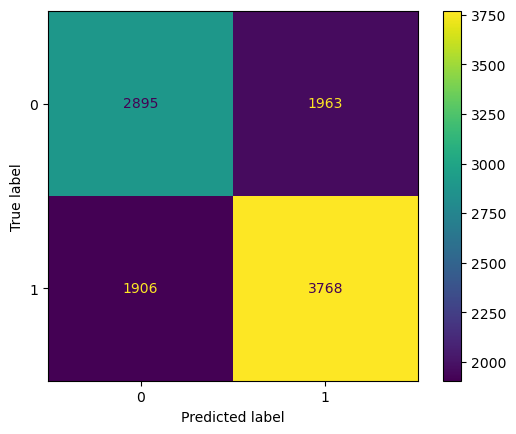

In [25]:
load_best_model_and_evaluate(path_model, test_ds)

### Experiment 11 

Extra experiment -1

In [14]:
input = tf.keras.Input(shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS))
x = layers.Rescaling(1./255)(input)
x = layers.Conv2D(32, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(64, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(128, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
x = layers.Conv2D(256, (3, 3), activation='relu', padding='same', kernel_regularizer = tf.keras.regularizers.l2(0.01))(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(512, (3, 3), activation='relu')(x)
x = layers.Conv2D(512, (3, 3), activation='relu', padding='same', kernel_regularizer = tf.keras.regularizers.l2(0.01))(x)
x = layers.Conv2D(1024, (3, 3), activation='relu')(x)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.3)(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.4)(x)
output = layers.Dense(NUM_CLASSES, activation='softmax')(x)

model = tf.keras.Model(inputs=input, outputs = output)

In [15]:
compile_model(model, 'adam', 0.00001)

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 240, 240, 3)]     0         
                                                                 
 rescaling_1 (Rescaling)     (None, 240, 240, 3)       0         
                                                                 
 conv2d_8 (Conv2D)           (None, 238, 238, 32)      896       
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 119, 119, 32)     0         
 2D)                                                             
                                                                 
 conv2d_9 (Conv2D)           (None, 117, 117, 64)      18496     
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 58, 58, 64)       0         
 2D)                                                       

In [16]:
path_model = general_path_models+'/binary_models_sc/ex11_scratch_32_2x256_1024_dpx2_regulariz_epoch_30_adam_1e-5.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model,40,10)

Epoch 1/40
627/627 [==============================] - ETA: 0s - loss: 6.3355 - accuracy: 0.5409
Epoch 00001: val_loss improved from inf to 4.69013, saving model to ./binary_models_sc\ex11_scratch_32_2x256_1024_dpx2_regulariz_epoch_30_adam_1e-5.h5
627/627 [==============================] - 102s 157ms/step - loss: 6.3355 - accuracy: 0.5409 - val_loss: 4.6901 - val_accuracy: 0.5653
Epoch 2/40
626/627 [============================>.] - ETA: 0s - loss: 3.6253 - accuracy: 0.5671
Epoch 00002: val_loss improved from 4.69013 to 2.76000, saving model to ./binary_models_sc\ex11_scratch_32_2x256_1024_dpx2_regulariz_epoch_30_adam_1e-5.h5
627/627 [==============================] - 99s 157ms/step - loss: 3.6249 - accuracy: 0.5672 - val_loss: 2.7600 - val_accuracy: 0.5808
Epoch 3/40
626/627 [============================>.] - ETA: 0s - loss: 2.2103 - accuracy: 0.5834
Epoch 00003: val_loss improved from 2.76000 to 1.76475, saving model to ./binary_models_sc\ex11_scratch_32_2x256_1024_dpx2_regulariz_epoc

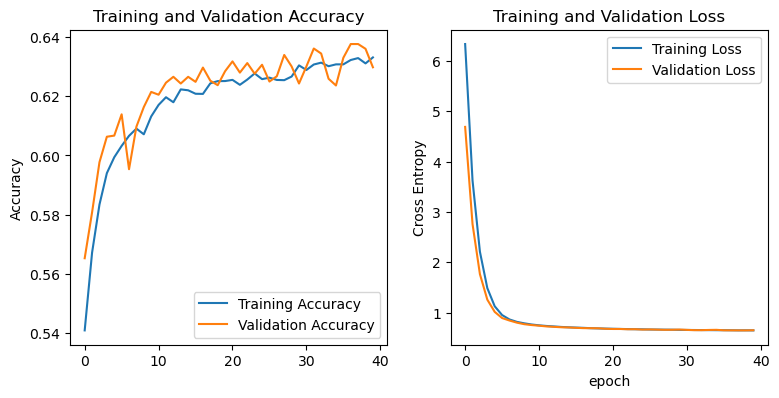

In [17]:
show_history_fit(history)

165/165 [==============================] - 36s 210ms/step - loss: 0.6509 - accuracy: 0.6277
tf.Tensor([0 1 1 ... 1 0 0], shape=(10532,), dtype=int64)
tf.Tensor([0 1 1 ... 1 0 0], shape=(10532,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.6188    0.5025    0.5546      4858
           1     0.6331    0.7349    0.6802      5674

    accuracy                         0.6277     10532
   macro avg     0.6259    0.6187    0.6174     10532
weighted avg     0.6265    0.6277    0.6223     10532



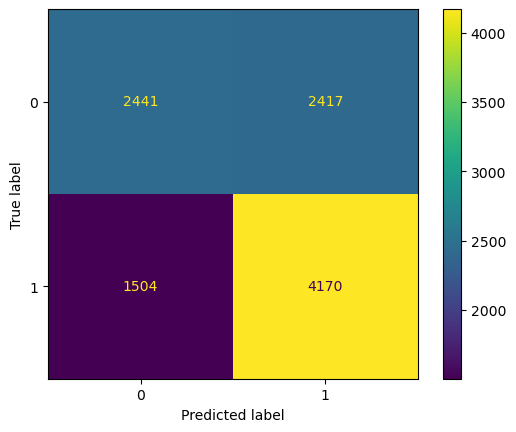

In [18]:
load_best_model_and_evaluate(path_model, test_ds)

### Experiment 12 

Use the network of the experiment 4 with BatchNormalization and regularization and add a dense layer

In [29]:
input = tf.keras.Input(shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS))
x = layers.Rescaling(1./255)(input)
x = layers.Conv2D(32, (5, 5), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(64, (4, 4), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(128, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(256, (3, 3), activation='relu', padding='same', kernel_regularizer=tf.keras.regularizers.L1L2(0.01))(x)
x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(512, (3, 3), activation='relu')(x)
x = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(x)
x = layers.BatchNormalization()(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(1024, (3, 3), activation='relu')(x)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.3)(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.4)(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.4)(x)
output = layers.Dense(NUM_CLASSES, activation='softmax')(x)

model = tf.keras.Model(inputs=input, outputs = output)

In [30]:
compile_model(model, 'adam', 0.0001)

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 240, 240, 3)]     0         
                                                                 
 rescaling_2 (Rescaling)     (None, 240, 240, 3)       0         
                                                                 
 conv2d_16 (Conv2D)          (None, 236, 236, 32)      2432      
                                                                 
 max_pooling2d_8 (MaxPooling  (None, 118, 118, 32)     0         
 2D)                                                             
                                                                 
 conv2d_17 (Conv2D)          (None, 115, 115, 64)      32832     
                                                                 
 max_pooling2d_9 (MaxPooling  (None, 57, 57, 64)       0         
 2D)                                                       

In [31]:
path_model = general_path_models+'/binary_models_sc/ex12_scratch_32_2x256_1024_dpx2_regulariz_batch_moreDense_epoch_30_adam_1e-5.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model,40,10)

Epoch 1/40
627/627 [==============================] - ETA: 0s - loss: 14.4737 - accuracy: 0.5797
Epoch 00001: val_loss improved from inf to 0.73706, saving model to ./binary_models_sc\ex12_scratch_32_2x256_1024_dpx2_regulariz_batch_moreDense_epoch_30_adam_1e-5.h5
627/627 [==============================] - 253s 395ms/step - loss: 14.4737 - accuracy: 0.5797 - val_loss: 0.7371 - val_accuracy: 0.5402
Epoch 2/40
627/627 [==============================] - ETA: 0s - loss: 0.7028 - accuracy: 0.6020
Epoch 00002: val_loss did not improve from 0.73706
627/627 [==============================] - 212s 332ms/step - loss: 0.7028 - accuracy: 0.6020 - val_loss: 0.7436 - val_accuracy: 0.5606
Epoch 3/40
627/627 [==============================] - ETA: 0s - loss: 0.6946 - accuracy: 0.6100
Epoch 00003: val_loss did not improve from 0.73706
627/627 [==============================] - 200s 317ms/step - loss: 0.6946 - accuracy: 0.6100 - val_loss: 0.7920 - val_accuracy: 0.5486
Epoch 4/40
627/627 [================

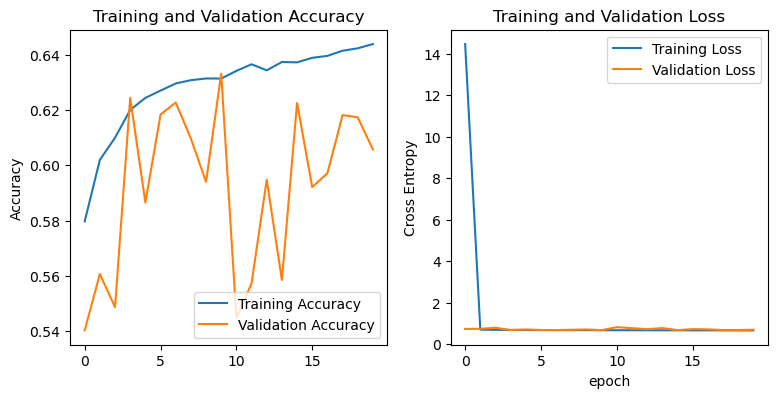

In [32]:
show_history_fit(history)

165/165 [==============================] - 35s 196ms/step - loss: 0.6798 - accuracy: 0.6255
tf.Tensor([0 0 1 ... 1 0 0], shape=(10532,), dtype=int64)
tf.Tensor([0 1 1 ... 1 0 0], shape=(10532,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.6165    0.4979    0.5509      4858
           1     0.6309    0.7348    0.6789      5674

    accuracy                         0.6255     10532
   macro avg     0.6237    0.6163    0.6149     10532
weighted avg     0.6242    0.6255    0.6198     10532



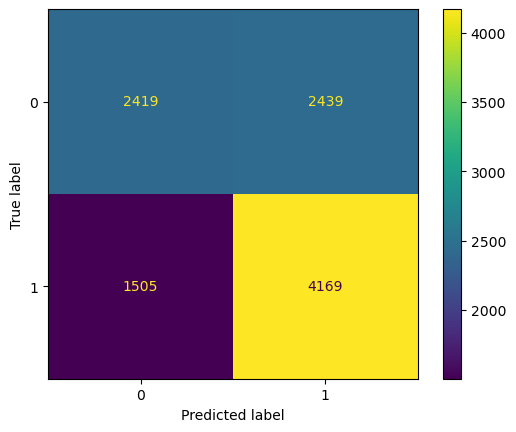

In [33]:
load_best_model_and_evaluate(path_model, test_ds)

## Evaluation on more relevant From Scratch Networks 

### Experiment 0

tf.Tensor([0 0 1 ... 0 1 1], shape=(10532,), dtype=int64)
tf.Tensor([1 0 0 ... 1 0 1], shape=(10532,), dtype=int32)
(10532,) (10532,)
Classification report: 
              precision    recall  f1-score   support

           0     0.6099    0.5939    0.6018      4858
           1     0.6599    0.6748    0.6673      5674

    accuracy                         0.6375     10532
   macro avg     0.6349    0.6343    0.6345     10532
weighted avg     0.6369    0.6375    0.6371     10532

ROC Curve:


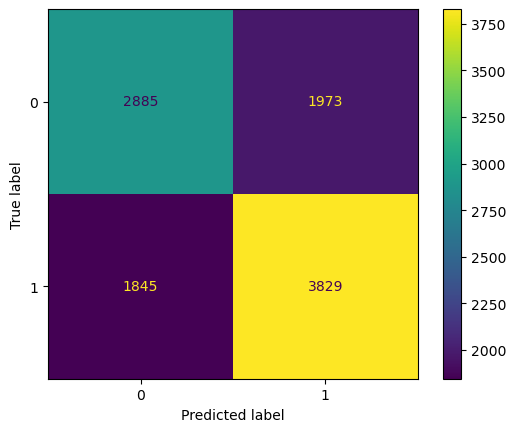

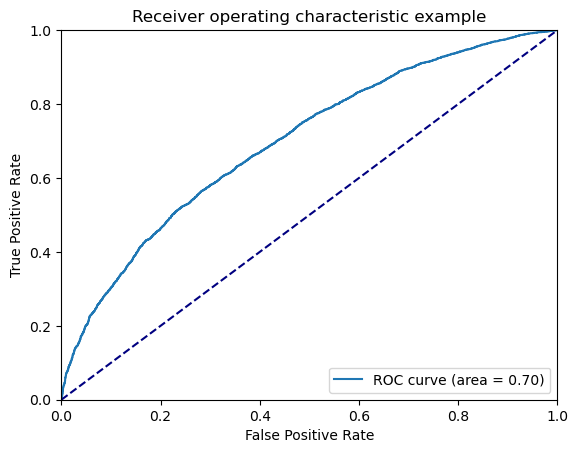

In [57]:
path_model = general_path_models+'/extra_binary_models_sc/ex0_scratch_dpplus2_32_128_epoch_30_adam_1e-4.h5' 
load_best_model_and_evaluate(path_model, test_ds)

### Experiment 1

tf.Tensor([1 1 0 ... 0 1 0], shape=(10532,), dtype=int64)
tf.Tensor([1 0 0 ... 0 1 0], shape=(10532,), dtype=int32)
(10532,) (10532,)
Classification report: 
              precision    recall  f1-score   support

           0     0.6009    0.6136    0.6072      4858
           1     0.6631    0.6510    0.6570      5674

    accuracy                         0.6338     10532
   macro avg     0.6320    0.6323    0.6321     10532
weighted avg     0.6344    0.6338    0.6340     10532

ROC Curve:


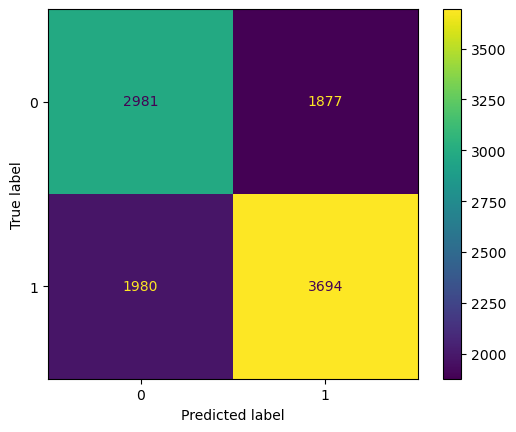

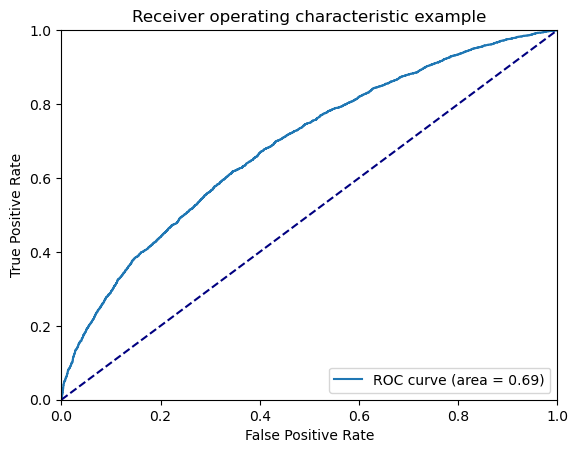

In [59]:
path_model = general_path_models+'/extra_binary_models_sc/ex1_bis_scratch_32_2x256_epoch_30_adam_1e-4.h5'
load_best_model_and_evaluate(path_model, test_ds)

### Experiment 2

tf.Tensor([0 1 1 ... 1 0 1], shape=(10532,), dtype=int64)
tf.Tensor([0 1 1 ... 0 1 1], shape=(10532,), dtype=int32)
(10532,) (10532,)
Classification report: 
              precision    recall  f1-score   support

           0     0.6275    0.5663    0.5953      4858
           1     0.6573    0.7122    0.6836      5674

    accuracy                         0.6449     10532
   macro avg     0.6424    0.6392    0.6395     10532
weighted avg     0.6436    0.6449    0.6429     10532

ROC Curve:


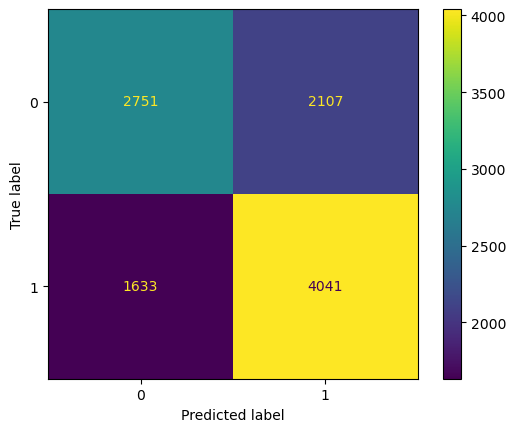

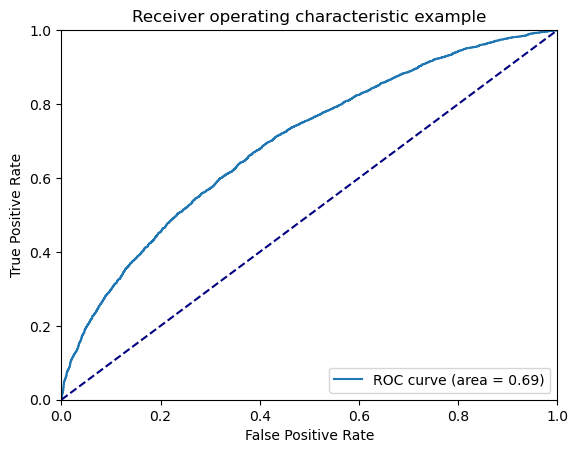

In [60]:
path_model = general_path_models+'/extra_binary_models_sc/ex2_scratch_DP_32_2x256_512_dp_epoch_30_adam_1e-4.h5'
load_best_model_and_evaluate(path_model, test_ds)

### ACNN

tf.Tensor([1 0 1 ... 1 1 1], shape=(10532,), dtype=int64)
tf.Tensor([0 0 1 ... 1 0 0], shape=(10532,), dtype=int32)
(10532,) (10532,)
Classification report: 
              precision    recall  f1-score   support

           0     0.5957    0.6822    0.6360      4858
           1     0.6893    0.6036    0.6436      5674

    accuracy                         0.6399     10532
   macro avg     0.6425    0.6429    0.6398     10532
weighted avg     0.6461    0.6399    0.6401     10532

ROC Curve:


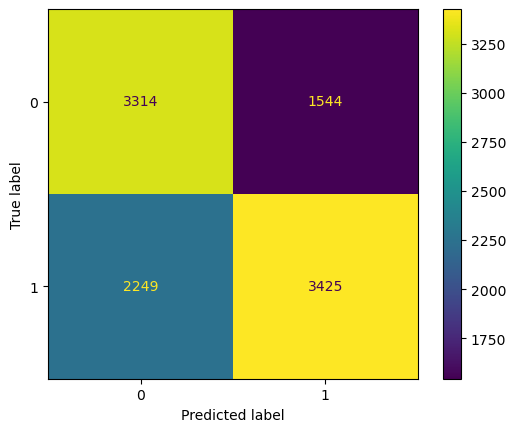

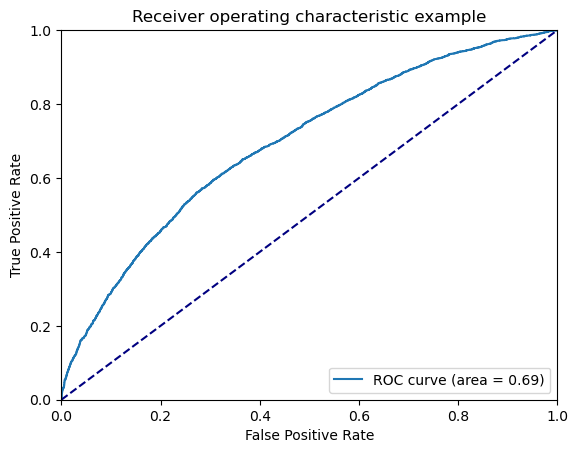

In [61]:
path_model = general_path_models+'/extra_binary_models_sc/ACNN_GLOBAL_scratch_DP_bis_32_2x256_512_dp_epoch_30_adam_1e-4.h5'
load_best_model_and_evaluate(path_model, test_ds)

### Experiment 9

tf.Tensor([1 1 1 ... 1 0 0], shape=(10532,), dtype=int64)
tf.Tensor([0 0 1 ... 1 0 1], shape=(10532,), dtype=int32)
(10532,) (10532,)
Classification report: 
              precision    recall  f1-score   support

           0     0.5903    0.6315    0.6102      4858
           1     0.6645    0.6248    0.6440      5674

    accuracy                         0.6279     10532
   macro avg     0.6274    0.6282    0.6271     10532
weighted avg     0.6303    0.6279    0.6284     10532

ROC Curve:


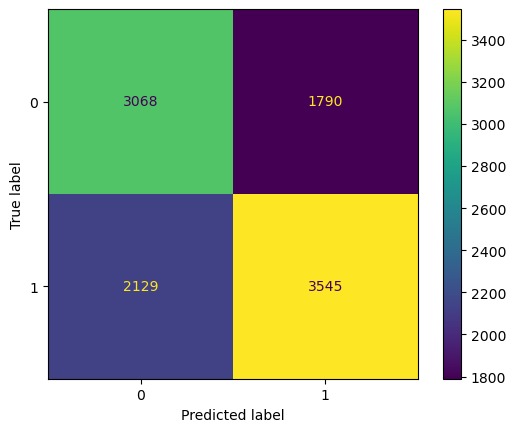

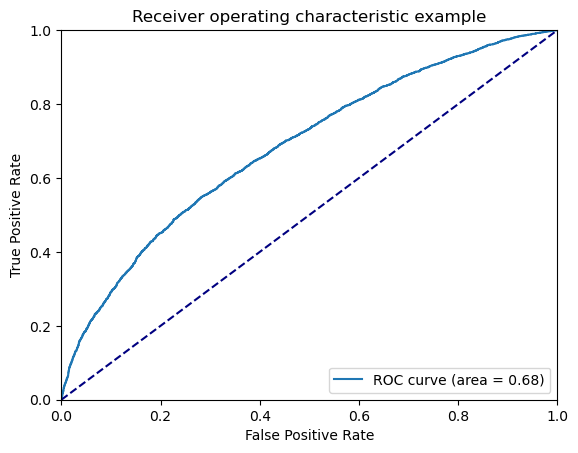

In [74]:
path_model = general_path_models+'/binary_models_sc/ex9_scratch_32_2x256_512_1024_dp_regularL1_batchnorm_epoch_35_adam_1e-4.h5'
load_best_model_and_evaluate(path_model, test_ds)

### Experiment 10

tf.Tensor([1 1 0 ... 1 1 1], shape=(10532,), dtype=int64)
tf.Tensor([1 1 0 ... 1 1 1], shape=(10532,), dtype=int32)
(10532,) (10532,)
Classification report: 
              precision    recall  f1-score   support

           0     0.6030    0.5959    0.5994      4858
           1     0.6575    0.6641    0.6608      5674

    accuracy                         0.6326     10532
   macro avg     0.6302    0.6300    0.6301     10532
weighted avg     0.6323    0.6326    0.6325     10532

ROC Curve:


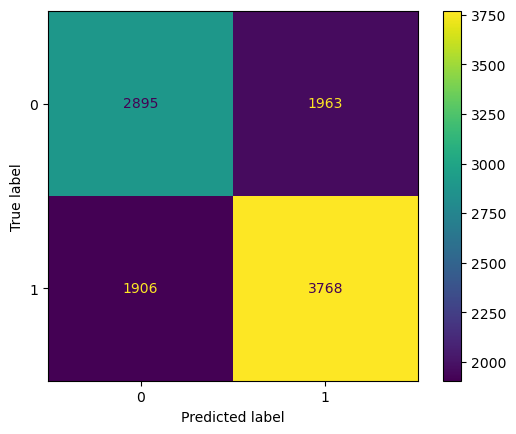

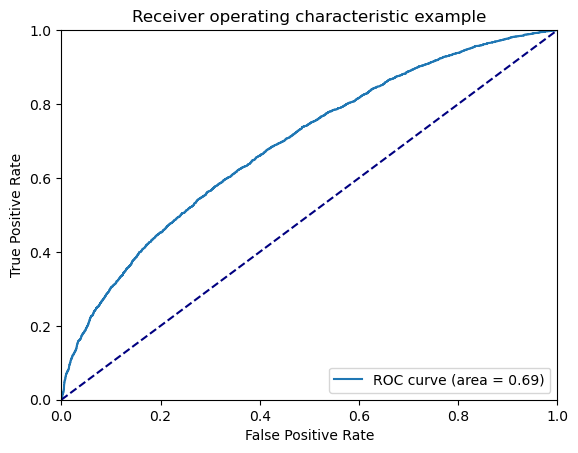

In [73]:
path_model = general_path_models+'/binary_models_sc/ex10_scratch_32_2x256_512_dp_regular_batchnorm_epoch_30_adam_1e-4.h5'
load_best_model_and_evaluate(path_model, test_ds)

## Other trials: From Scratch 2 (Little Networks + Architecture of networks seen in the papers)

### Experiment 1_bis:try with little network but different dimension of the filters

In [11]:
input = tf.keras.Input(shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS))
x = layers.Rescaling(1./255)(input)
x = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(x)
x = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(x)
x = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Flatten()(x)
#x = layers.Dropout(0.3)(x)
#x = layers.Dense(512, activation='relu')(x)
#x = layers.Dropout(0.4)(x)
#x = layers.Dense(512, activation='relu')(x)
#x = layers.Dropout(0.4)(x)
output = layers.Dense(NUM_CLASSES, activation='softmax')(x)

model = tf.keras.Model(inputs=input, outputs = output)

In [12]:
compile_model(model, 'adam', 0.0001)

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 200, 200, 3)]     0         
                                                                 
 rescaling (Rescaling)       (None, 200, 200, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 200, 200, 64)      1792      
                                                                 
 conv2d_1 (Conv2D)           (None, 200, 200, 64)      36928     
                                                                 
 max_pooling2d (MaxPooling2D  (None, 100, 100, 64)     0         
 )                                                               
                                                                 
 conv2d_2 (Conv2D)           (None, 100, 100, 128)     73856     
                                                             

In [13]:
path_model = general_path_models+'/binary_models_sc/ex1_bis_scratchv2_32_2x256_35_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model,35,10)

Epoch 1/35
627/627 [==============================] - ETA: 0s - loss: 0.6719 - accuracy: 0.5798
Epoch 00001: val_loss improved from inf to 0.65780, saving model to ./binary_models_sc\ex1_bis_scratchv2_32_2x256_35_adam_1e-4.h5
627/627 [==============================] - 238s 366ms/step - loss: 0.6719 - accuracy: 0.5798 - val_loss: 0.6578 - val_accuracy: 0.6065
Epoch 2/35
627/627 [==============================] - ETA: 0s - loss: 0.6527 - accuracy: 0.6136
Epoch 00002: val_loss improved from 0.65780 to 0.63916, saving model to ./binary_models_sc\ex1_bis_scratchv2_32_2x256_35_adam_1e-4.h5
627/627 [==============================] - 228s 362ms/step - loss: 0.6527 - accuracy: 0.6136 - val_loss: 0.6392 - val_accuracy: 0.6257
Epoch 3/35
627/627 [==============================] - ETA: 0s - loss: 0.6412 - accuracy: 0.6271
Epoch 00003: val_loss did not improve from 0.63916
627/627 [==============================] - 228s 363ms/step - loss: 0.6412 - accuracy: 0.6271 - val_loss: 0.6430 - val_accuracy:

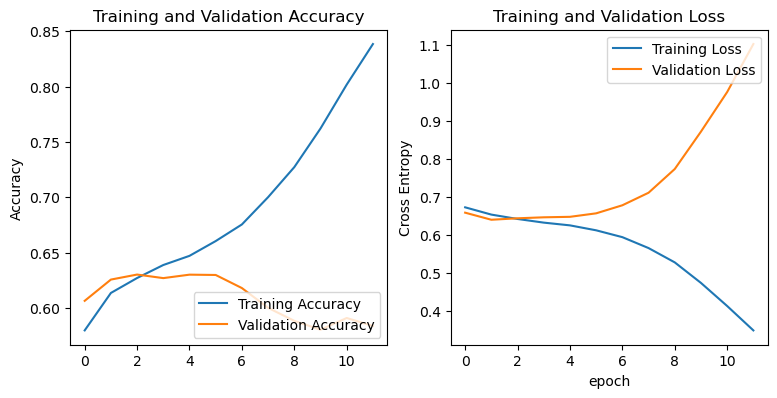

In [14]:
show_history_fit(history)

165/165 [==============================] - 20s 115ms/step - loss: 0.6468 - accuracy: 0.6204
tf.Tensor([0 0 1 ... 1 0 0], shape=(10532,), dtype=int64)
tf.Tensor([0 1 1 ... 1 0 0], shape=(10532,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.6063    0.5047    0.5509      4858
           1     0.6292    0.7194    0.6713      5674

    accuracy                         0.6204     10532
   macro avg     0.6177    0.6121    0.6111     10532
weighted avg     0.6186    0.6204    0.6157     10532



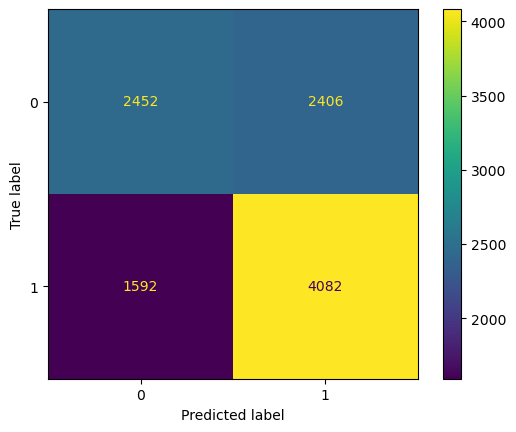

In [15]:
load_best_model_and_evaluate(path_model, test_ds)

### Experiment 2_bis: try with a A-CNN (network inspired to the AlexNet Network)

In [17]:
input = tf.keras.Input(shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS))
x = layers.Rescaling(1./255)(input)
x = layers.Conv2D(filters=96, kernel_size=(11,11), strides=(4,4), activation='relu')(x)
x = layers.BatchNormalization()(x)
x = layers.MaxPool2D(pool_size=(3,3), strides=(2,2))(x)
x = layers.Conv2D(filters=256, kernel_size=(5,5), strides=(1,1), activation='relu', padding="same")(x)
x = layers.MaxPool2D(pool_size=(3,3), strides=(2,2))(x)
x = layers.Conv2D(filters=384, kernel_size=(3,3), strides=(1,1), activation='relu', padding="same")(x)
x = layers.BatchNormalization()(x)
x = layers.Conv2D(filters=384, kernel_size=(3,3), strides=(1,1), activation='relu', padding="same")(x)
x = layers.Flatten()(x)
x = layers.Dense(1000, activation='relu')(x)
x = layers.Dense(256, activation='relu')(x)

output = layers.Dense(NUM_CLASSES, activation='softmax')(x)

model = tf.keras.Model(inputs=input, outputs = output)



In [18]:
compile_model(model, 'adam', 0.0001)

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 rescaling (Rescaling)       (None, 250, 250, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 60, 60, 96)        34944     
                                                                 
 batch_normalization (BatchN  (None, 60, 60, 96)       384       
 ormalization)                                                   
                                                                 
 max_pooling2d (MaxPooling2D  (None, 29, 29, 96)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 29, 29, 256)       614656

In [19]:
path_model = general_path_models+'/binary_models_sc/ex2_bis_scratchv2_alex_4ly_35_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model,35,10)

Epoch 1/35
627/627 [==============================] - ETA: 0s - loss: 0.7102 - accuracy: 0.5719
Epoch 00001: val_loss improved from inf to 0.65711, saving model to ./binary_models_sc\ex2_bis_scratchv2_alex_4ly_35_adam_1e-4.h5
627/627 [==============================] - 96s 144ms/step - loss: 0.7102 - accuracy: 0.5719 - val_loss: 0.6571 - val_accuracy: 0.6014
Epoch 2/35
626/627 [============================>.] - ETA: 0s - loss: 0.6576 - accuracy: 0.6082
Epoch 00002: val_loss did not improve from 0.65711
627/627 [==============================] - 90s 142ms/step - loss: 0.6576 - accuracy: 0.6083 - val_loss: 0.6653 - val_accuracy: 0.6059
Epoch 3/35
626/627 [============================>.] - ETA: 0s - loss: 0.6458 - accuracy: 0.6256
Epoch 00003: val_loss improved from 0.65711 to 0.65158, saving model to ./binary_models_sc\ex2_bis_scratchv2_alex_4ly_35_adam_1e-4.h5
627/627 [==============================] - 92s 145ms/step - loss: 0.6458 - accuracy: 0.6256 - val_loss: 0.6516 - val_accuracy: 0.

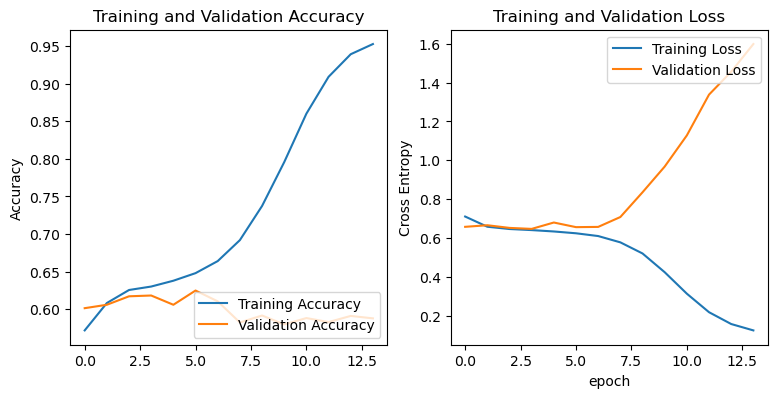

In [20]:
show_history_fit(history)

165/165 [==============================] - 18s 103ms/step - loss: 0.6479 - accuracy: 0.6186
tf.Tensor([0 0 1 ... 1 0 0], shape=(10532,), dtype=int64)
tf.Tensor([0 1 1 ... 1 0 0], shape=(10532,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.5893    0.5716    0.5804      4858
           1     0.6424    0.6590    0.6506      5674

    accuracy                         0.6187     10532
   macro avg     0.6159    0.6153    0.6155     10532
weighted avg     0.6179    0.6187    0.6182     10532



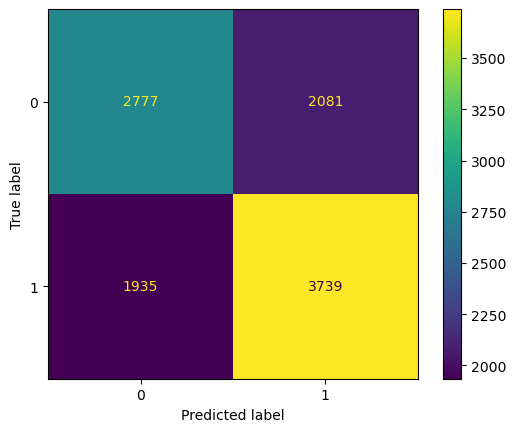

In [21]:
load_best_model_and_evaluate(path_model, test_ds)

Another trial with some modifications

In [11]:
input = tf.keras.Input(shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS))
x = layers.Rescaling(1./255)(input)
x = layers.Conv2D(filters=96, kernel_size=(11,11), strides=(4,4), activation='relu')(x)
x = layers.BatchNormalization()(x)
x = layers.MaxPool2D(pool_size=(3,3), strides=(2,2))(x)
x = layers.Conv2D(filters=256, kernel_size=(5,5), strides=(1,1), activation='relu', padding="same")(x)
x = layers.MaxPool2D(pool_size=(3,3), strides=(2,2))(x)
x = layers.Conv2D(filters=384, kernel_size=(3,3), strides=(1,1), activation='relu', padding="same")(x)
x = layers.BatchNormalization()(x)
x = layers.Conv2D(filters=384, kernel_size=(3,3), strides=(1,1), activation='relu', padding="same")(x)

x = layers.Flatten()(x)

x = layers.Dense(1000, activation='relu')(x)
x = layers.Dropout(0.4)(x)
x = layers.Dense(256, activation='relu')(x)
x = layers.Dropout(0.3)(x)
output = layers.Dense(NUM_CLASSES, activation='softmax')(x)

model = tf.keras.Model(inputs=input, outputs = output)

In [12]:
compile_model(model, 'adam', 0.0001)

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 rescaling (Rescaling)       (None, 250, 250, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 60, 60, 96)        34944     
                                                                 
 batch_normalization (BatchN  (None, 60, 60, 96)       384       
 ormalization)                                                   
                                                                 
 max_pooling2d (MaxPooling2D  (None, 29, 29, 96)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 29, 29, 256)       614656

In [13]:
path_model = general_path_models+'/binary_models_sc/ex2_bis_dropout_scratchv2_alex_4ly_35_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model,35,10)

Epoch 1/35
627/627 [==============================] - ETA: 0s - loss: 0.7327 - accuracy: 0.5537
Epoch 00001: val_loss improved from inf to 0.69549, saving model to ./binary_models_sc\ex2_bis_dropout_scratchv2_alex_4ly_35_adam_1e-4.h5
627/627 [==============================] - 97s 144ms/step - loss: 0.7327 - accuracy: 0.5537 - val_loss: 0.6955 - val_accuracy: 0.5654
Epoch 2/35
626/627 [============================>.] - ETA: 0s - loss: 0.6717 - accuracy: 0.5815
Epoch 00002: val_loss improved from 0.69549 to 0.65917, saving model to ./binary_models_sc\ex2_bis_dropout_scratchv2_alex_4ly_35_adam_1e-4.h5
627/627 [==============================] - 92s 145ms/step - loss: 0.6717 - accuracy: 0.5815 - val_loss: 0.6592 - val_accuracy: 0.5956
Epoch 3/35
626/627 [============================>.] - ETA: 0s - loss: 0.6700 - accuracy: 0.5867
Epoch 00003: val_loss did not improve from 0.65917
627/627 [==============================] - 94s 148ms/step - loss: 0.6699 - accuracy: 0.5868 - val_loss: 0.6863 - 

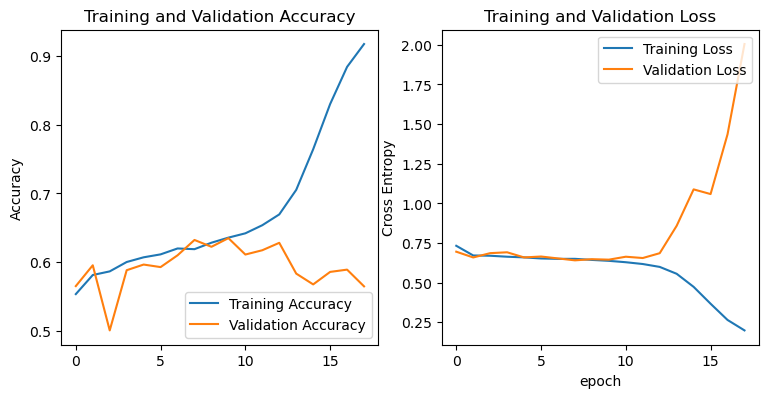

In [14]:
show_history_fit(history)

165/165 [==============================] - 19s 108ms/step - loss: 0.6409 - accuracy: 0.6242
tf.Tensor([0 0 1 ... 1 0 0], shape=(10532,), dtype=int64)
tf.Tensor([0 1 1 ... 1 0 0], shape=(10532,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.5868    0.6262    0.6059      4858
           1     0.6604    0.6225    0.6409      5674

    accuracy                         0.6242     10532
   macro avg     0.6236    0.6243    0.6234     10532
weighted avg     0.6265    0.6242    0.6247     10532



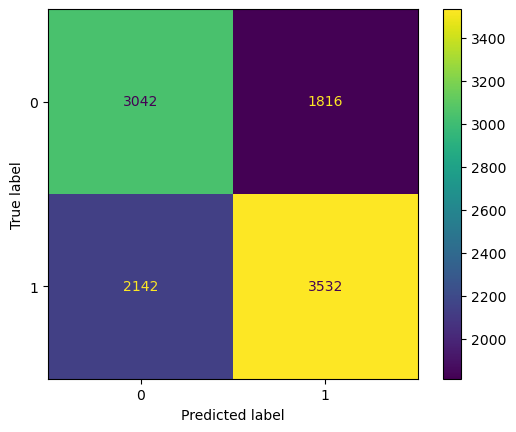

In [15]:
load_best_model_and_evaluate(path_model, test_ds)

### Experiment 3_bis: Network that merge the output coming from different levels of the network 

In [11]:
input = tf.keras.Input(shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS))
l1 = layers.Rescaling(1./255)(input)
l1 = layers.Conv2D(filters=128, kernel_size=(11,11), activation='relu')(l1) 
l1 = layers.Conv2D(filters=128, kernel_size=(1,1), activation='relu')(l1)
l1 = layers.MaxPool2D(pool_size=(3,3))(l1)

l1_out = layers.Conv2D(filters=128, kernel_size=(1,1), activation='relu')(l1)
l1_out = layers.GlobalAveragePooling2D()(l1_out)
l1_out = layers.Dense(512, activation='relu')(l1_out)
l1_out = layers.Dense(256, activation='relu')(l1_out)

l2 = layers.Conv2D(filters=256, kernel_size=(5,5), activation='relu')(l1)
l2 = layers.Conv2D(filters=256, kernel_size=(1,1), activation='relu')(l2)
l2 = layers.MaxPool2D(pool_size=(3,3))(l2)

l2_out = layers.Conv2D(filters=128, kernel_size=(1,1), activation='relu')(l2)
l2_out = layers.GlobalAveragePooling2D()(l2_out)
l2_out = layers.Dense(512, activation='relu')(l2_out)
l2_out = layers.Dense(256, activation='relu')(l2_out)

l3 = layers.Conv2D(filters=384, kernel_size=(5,5), activation='relu')(l2)
l3 = layers.Conv2D(filters=384, kernel_size=(1,1), activation='relu')(l3)
l3 = layers.MaxPool2D(pool_size=(3,3))(l3)

l3_out = layers.Conv2D(filters=128, kernel_size=(1,1), activation='relu')(l3)
l3_out = layers.GlobalAveragePooling2D()(l3_out)
l3_out = layers.Dense(512, activation='relu')(l3_out)
l3_out = layers.Dense(256, activation='relu')(l3_out)

l4 = layers.Conv2D(filters=512, kernel_size=(5,5), activation='relu')(l3)
l4 = layers.Conv2D(filters=512, kernel_size=(1,1), activation='relu')(l4)
l4 = layers.MaxPool2D(pool_size=(3,3))(l4)

l4_out = layers.Conv2D(filters=128, kernel_size=(1,1), activation='relu')(l4)
l4_out = layers.GlobalAveragePooling2D()(l4_out)
l4_out = layers.Dense(512, activation='relu')(l4_out)
l4_out = layers.Dense(256, activation='relu')(l4_out)


merge = layers.Average()([l1_out, l2_out, l3_out, l4_out])

output = layers.Dense(NUM_CLASSES, activation='softmax')(merge)

model = tf.keras.Model(inputs=input, outputs = output)

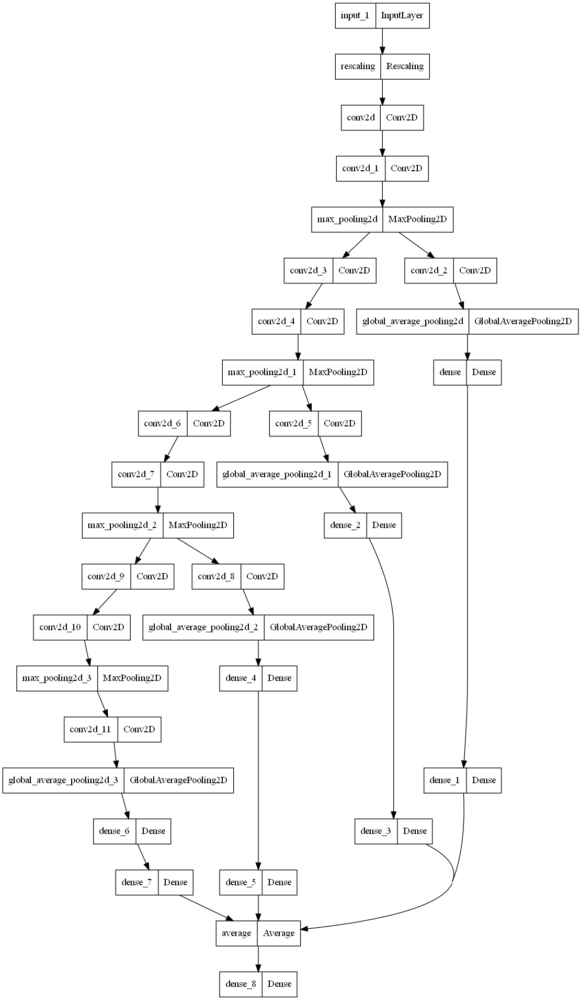

In [15]:
#tf.keras.utils.plot_model(model)

In [12]:
compile_model(model, 'adam', 0.0001)

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 250, 250, 3  0           []                               
                                )]                                                                
                                                                                                  
 rescaling (Rescaling)          (None, 250, 250, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv2d (Conv2D)                (None, 240, 240, 12  46592       ['rescaling[0][0]']              
                                8)                                                                
                                                                                              

In [13]:
path_model = general_path_models+'/binary_models_sc/ex3_bis_dropout_scratchv2_alex_middleinfo_35_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model,35,10)

Epoch 1/35
2227/2227 [==============================] - ETA: 0s - loss: 0.6851 - accuracy: 0.5508
Epoch 00001: val_loss improved from inf to 0.67271, saving model to ./binary_models_sc\ex3_bis_dropout_scratchv2_alex_middleinfo_35_adam_1e-4.h5
2227/2227 [==============================] - 386s 170ms/step - loss: 0.6851 - accuracy: 0.5508 - val_loss: 0.6727 - val_accuracy: 0.5942
Epoch 2/35


c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\engine\functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


2227/2227 [==============================] - ETA: 0s - loss: 0.6672 - accuracy: 0.5919
Epoch 00002: val_loss improved from 0.67271 to 0.65439, saving model to ./binary_models_sc\ex3_bis_dropout_scratchv2_alex_middleinfo_35_adam_1e-4.h5
2227/2227 [==============================] - 352s 158ms/step - loss: 0.6672 - accuracy: 0.5919 - val_loss: 0.6544 - val_accuracy: 0.6182
Epoch 3/35
2227/2227 [==============================] - ETA: 0s - loss: 0.6558 - accuracy: 0.6086
Epoch 00003: val_loss improved from 0.65439 to 0.64888, saving model to ./binary_models_sc\ex3_bis_dropout_scratchv2_alex_middleinfo_35_adam_1e-4.h5
2227/2227 [==============================] - 353s 158ms/step - loss: 0.6558 - accuracy: 0.6086 - val_loss: 0.6489 - val_accuracy: 0.6208
Epoch 4/35
2227/2227 [==============================] - ETA: 0s - loss: 0.6491 - accuracy: 0.6200
Epoch 00004: val_loss improved from 0.64888 to 0.64260, saving model to ./binary_models_sc\ex3_bis_dropout_scratchv2_alex_middleinfo_35_adam_1e-4

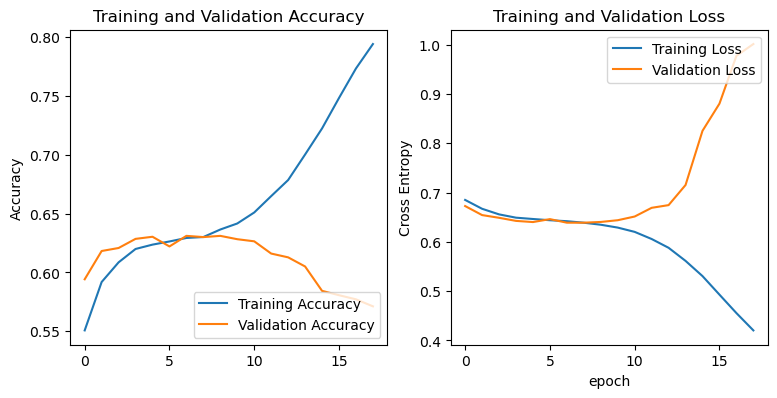

In [14]:
show_history_fit(history)

586/586 [==============================] - 36s 61ms/step - loss: 0.6427 - accuracy: 0.6180
tf.Tensor([1 1 0 ... 1 1 0], shape=(10532,), dtype=int64)
tf.Tensor([1 1 1 ... 1 1 1], shape=(10532,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.5911    0.5574    0.5738      4858
           1     0.6387    0.6699    0.6539      5674

    accuracy                         0.6180     10532
   macro avg     0.6149    0.6137    0.6139     10532
weighted avg     0.6168    0.6180    0.6170     10532



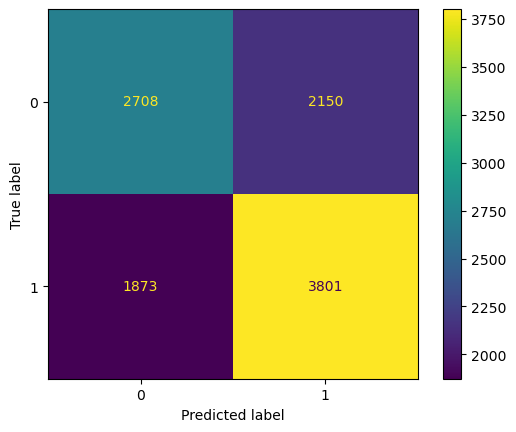

In [15]:
load_best_model_and_evaluate(path_model, test_ds)

## Pre-Trained Networks

### VGG16

#### Experiment Features Extraction - Add one Dense layer + dropout

In [11]:
base_model = tf.keras.applications.vgg16.VGG16(input_shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS),
        weights='imagenet',  # load the network pretrained on ImageNet1K
        include_top=False)
        
base_model.trainable = False

base_model.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 240, 240, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 240, 240, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 240, 240, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 120, 120, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 120, 120, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 120, 120, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 60, 60, 128)       0     

In [12]:
inputs = tf.keras.Input(shape=INPUT_SHAPE)
x = tf.keras.applications.vgg16.preprocess_input(inputs)
x = base_model(x)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.3)(x)
outputs = layers.Dense(NUM_CLASSES, activation="softmax")(x)
model = tf.keras.Model(inputs, outputs)

In [13]:
LR = 0.0001
compile_model(model, 'adam', LR)

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 240, 240, 3)]     0         
                                                                 
 tf.__operators__.getitem (S  (None, 240, 240, 3)      0         
 licingOpLambda)                                                 
                                                                 
 tf.nn.bias_add (TFOpLambda)  (None, 240, 240, 3)      0         
                                                                 
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 global_average_pooling2d (G  (None, 512)              0         
 lobalAveragePooling2D)                                          
                                                                 
 dense (Dense)               (None, 512)               262656

In [14]:
path_model = general_path_models+'/binary_models_sc/pretrained_vgg16_no_tuning_512_dp_epoch_40_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model,40,10)

Epoch 1/40
627/627 [==============================] - ETA: 0s - loss: 1.1050 - accuracy: 0.5916
Epoch 00001: val_loss improved from inf to 0.69270, saving model to ./binary_models_sc\pretrained_vgg16_no_tuning_512_dp_epoch_40_adam_1e-4.h5
627/627 [==============================] - 184s 275ms/step - loss: 1.1050 - accuracy: 0.5916 - val_loss: 0.6927 - val_accuracy: 0.6473
Epoch 2/40
627/627 [==============================] - ETA: 0s - loss: 0.7025 - accuracy: 0.6369
Epoch 00002: val_loss improved from 0.69270 to 0.63782, saving model to ./binary_models_sc\pretrained_vgg16_no_tuning_512_dp_epoch_40_adam_1e-4.h5
627/627 [==============================] - 170s 268ms/step - loss: 0.7025 - accuracy: 0.6369 - val_loss: 0.6378 - val_accuracy: 0.6566
Epoch 3/40
627/627 [==============================] - ETA: 0s - loss: 0.6308 - accuracy: 0.6624
Epoch 00003: val_loss improved from 0.63782 to 0.62274, saving model to ./binary_models_sc\pretrained_vgg16_no_tuning_512_dp_epoch_40_adam_1e-4.h5
627/6

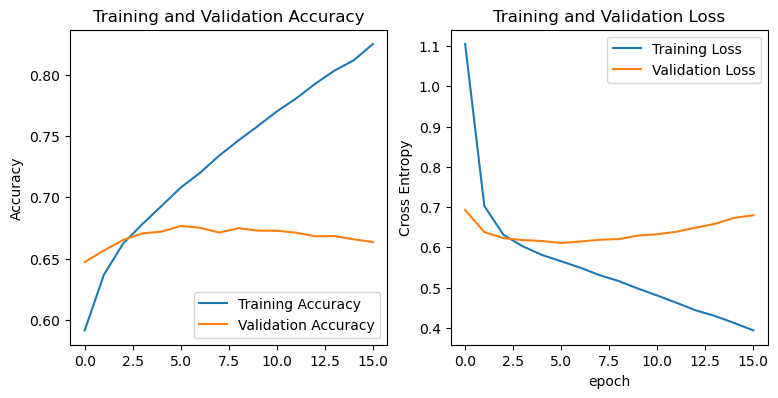

In [15]:

show_history_fit(history)

165/165 [==============================] - 47s 250ms/step - loss: 0.6128 - accuracy: 0.6704
tf.Tensor([0 0 1 ... 1 1 0], shape=(10532,), dtype=int64)
tf.Tensor([1 0 0 ... 1 1 0], shape=(10532,), dtype=int32)
(10532,) (10532,)
Classification report: 
              precision    recall  f1-score   support

           0     0.6392    0.6556    0.6473      4858
           1     0.6985    0.6831    0.6907      5674

    accuracy                         0.6704     10532
   macro avg     0.6688    0.6694    0.6690     10532
weighted avg     0.6711    0.6704    0.6707     10532

ROC Curve:


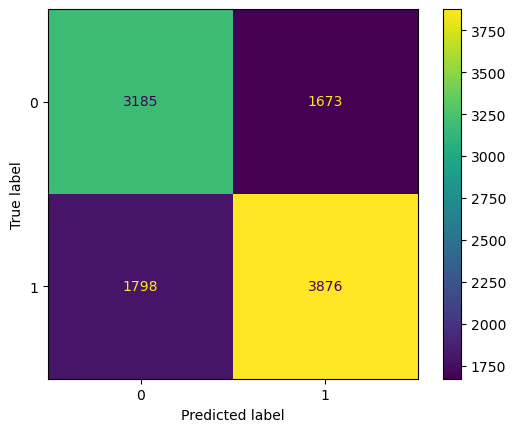

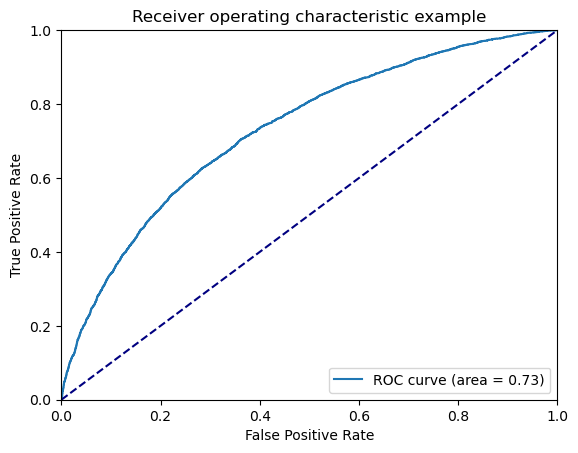

In [13]:
path_model = general_path_models+'/binary_models_sc/pretrained_vgg16_no_tuning_512_dp_epoch_40_adam_1e-4.h5'
load_best_model_and_evaluate(path_model, test_ds)

#### Experiment Features Extraction 2 -- Add another dropout

In [27]:
base_model = tf.keras.applications.vgg16.VGG16(input_shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS),
        weights='imagenet',  # load the network pretrained on ImageNet1K
        include_top=False)
        
base_model.trainable = False

base_model.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 250, 250, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 250, 250, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 125, 125, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 125, 125, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 125, 125, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 62, 62, 128)       0     

In [28]:
inputs = tf.keras.Input(shape=INPUT_SHAPE)
x = tf.keras.applications.vgg16.preprocess_input(inputs)
x = base_model(x)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.4)(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.3)(x)
outputs = layers.Dense(NUM_CLASSES, activation="softmax")(x)
model = tf.keras.Model(inputs, outputs)

In [29]:
LR = 0.0001
compile_model(model, 'adam', LR)

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.__operators__.getitem (S  (None, 250, 250, 3)      0         
 licingOpLambda)                                                 
                                                                 
 tf.nn.bias_add (TFOpLambda)  (None, 250, 250, 3)      0         
                                                                 
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 global_average_pooling2d_3   (None, 512)              0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dropout_7 (Dropout)         (None, 512)               0   

In [30]:
path_model = general_path_models+'/extra_binary_models_sc/pretrained_vgg16_no_tuning_512_dp_epoch_40_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model,40,10)

Epoch 1/40
627/627 [==============================] - ETA: 0s - loss: 1.6664 - accuracy: 0.5645
Epoch 00001: val_loss improved from inf to 0.73883, saving model to ./extra_binary_models_sc\pretrained_vgg16_no_tuning_512_dp_epoch_40_adam_1e-4.h5
627/627 [==============================] - 180s 278ms/step - loss: 1.6664 - accuracy: 0.5645 - val_loss: 0.7388 - val_accuracy: 0.6373
Epoch 2/40
627/627 [==============================] - ETA: 0s - loss: 1.0269 - accuracy: 0.5794
Epoch 00002: val_loss improved from 0.73883 to 0.65407, saving model to ./extra_binary_models_sc\pretrained_vgg16_no_tuning_512_dp_epoch_40_adam_1e-4.h5
627/627 [==============================] - 172s 272ms/step - loss: 1.0269 - accuracy: 0.5794 - val_loss: 0.6541 - val_accuracy: 0.6337
Epoch 3/40
627/627 [==============================] - ETA: 0s - loss: 0.7944 - accuracy: 0.5979
Epoch 00003: val_loss improved from 0.65407 to 0.63985, saving model to ./extra_binary_models_sc\pretrained_vgg16_no_tuning_512_dp_epoch_40_

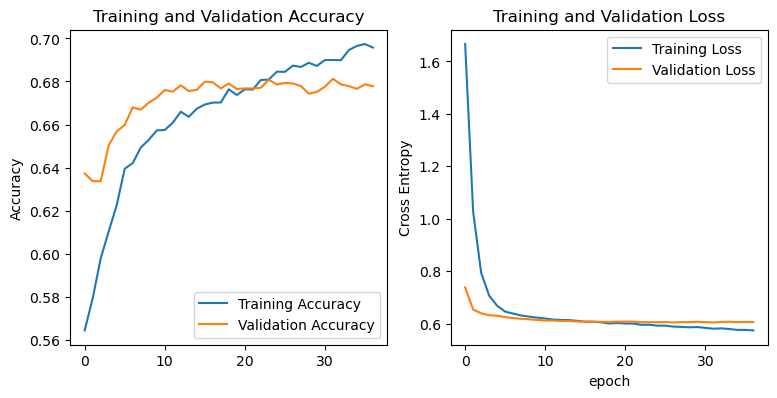

In [31]:
show_history_fit(history)

165/165 [==============================] - 51s 276ms/step - loss: 0.6054 - accuracy: 0.6723
tf.Tensor([0 1 1 ... 0 0 0], shape=(10532,), dtype=int64)
tf.Tensor([0 1 1 ... 1 0 0], shape=(10532,), dtype=int32)
(10532,) (10532,)
Classification report: 
              precision    recall  f1-score   support

           0     0.6461    0.6404    0.6432      4858
           1     0.6944    0.6997    0.6970      5674

    accuracy                         0.6723     10532
   macro avg     0.6703    0.6700    0.6701     10532
weighted avg     0.6721    0.6723    0.6722     10532

ROC Curve:


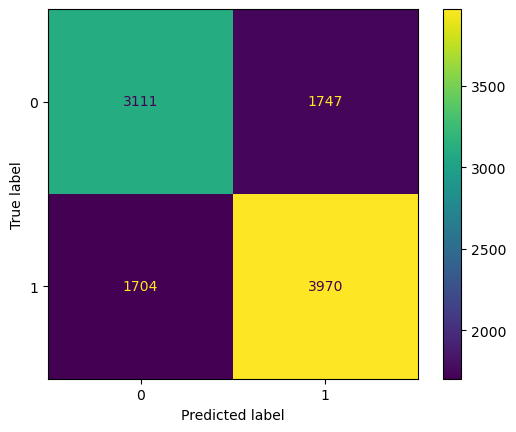

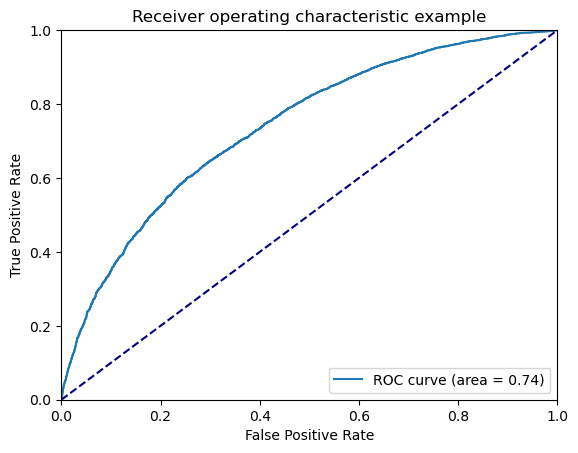

In [25]:
path_model = general_path_models+'/extra_binary_models_sc/pretrained_vgg16_no_tuning_512_dp_epoch_40_adam_1e-4.h5'
load_best_model_and_evaluate(path_model, test_ds)

#### Experiment Features Extraction 3 -- Add more layers


In [11]:
base_model = tf.keras.applications.vgg16.VGG16(input_shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS),
        weights='imagenet',  # load the network pretrained on ImageNet1K
        include_top=False)
        
base_model.trainable = False

base_model.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 240, 240, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 240, 240, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 240, 240, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 120, 120, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 120, 120, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 120, 120, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 60, 60, 128)       0     

In [12]:
inputs = tf.keras.Input(shape=INPUT_SHAPE)
x = tf.keras.applications.vgg16.preprocess_input(inputs)
x = base_model(x)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.4)(x)
x = layers.Dense(1024, activation='relu')(x)
x = layers.Dropout(0.4)(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.4)(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dense(256, activation='relu')(x)
outputs = layers.Dense(NUM_CLASSES, activation="softmax")(x)
model = tf.keras.Model(inputs, outputs)

In [13]:
LR = 0.0001
compile_model(model, 'adam', LR)

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 240, 240, 3)]     0         
                                                                 
 tf.__operators__.getitem (S  (None, 240, 240, 3)      0         
 licingOpLambda)                                                 
                                                                 
 tf.nn.bias_add (TFOpLambda)  (None, 240, 240, 3)      0         
                                                                 
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 global_average_pooling2d (G  (None, 512)              0         
 lobalAveragePooling2D)                                          
                                                                 
 dropout (Dropout)           (None, 512)               0     

In [14]:
path_model = general_path_models+'/binary_models_sc/pretrained_vgg16_no_tuning_experiment_3_epoch_40_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model,40,10)

Epoch 1/40
627/627 [==============================] - ETA: 0s - loss: 0.8250 - accuracy: 0.5491
Epoch 00001: val_loss improved from inf to 0.65556, saving model to ./binary_models_sc\pretrained_vgg16_no_tuning_experiment_3_epoch_40_adam_1e-4.h5
627/627 [==============================] - 204s 310ms/step - loss: 0.8250 - accuracy: 0.5491 - val_loss: 0.6556 - val_accuracy: 0.6211
Epoch 2/40
627/627 [==============================] - ETA: 0s - loss: 0.6934 - accuracy: 0.5851
Epoch 00002: val_loss improved from 0.65556 to 0.63935, saving model to ./binary_models_sc\pretrained_vgg16_no_tuning_experiment_3_epoch_40_adam_1e-4.h5
627/627 [==============================] - 188s 299ms/step - loss: 0.6934 - accuracy: 0.5851 - val_loss: 0.6394 - val_accuracy: 0.6451
Epoch 3/40
627/627 [==============================] - ETA: 0s - loss: 0.6677 - accuracy: 0.6068
Epoch 00003: val_loss improved from 0.63935 to 0.62703, saving model to ./binary_models_sc\pretrained_vgg16_no_tuning_experiment_3_epoch_40_

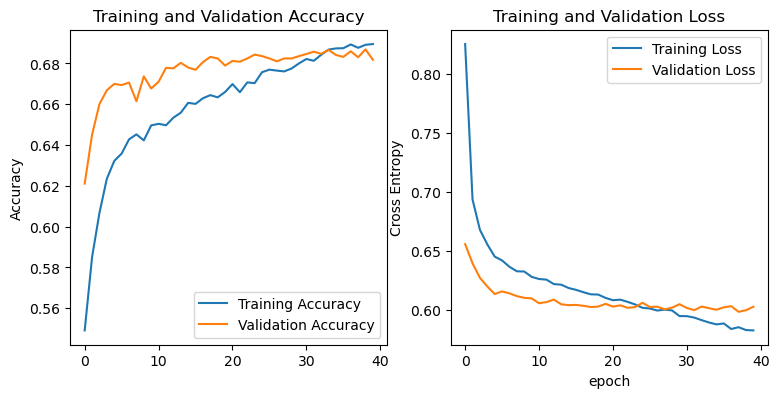

In [15]:
show_history_fit(history)

165/165 [==============================] - 41s 238ms/step - loss: 0.5987 - accuracy: 0.6830
tf.Tensor([1 1 1 ... 0 0 0], shape=(10532,), dtype=int64)
tf.Tensor([0 1 1 ... 1 0 0], shape=(10532,), dtype=int32)
(10532,) (10532,)
Classification report: 
              precision    recall  f1-score   support

           0     0.6581    0.6509    0.6545      4858
           1     0.7039    0.7104    0.7071      5674

    accuracy                         0.6830     10532
   macro avg     0.6810    0.6807    0.6808     10532
weighted avg     0.6827    0.6830    0.6828     10532

ROC Curve:


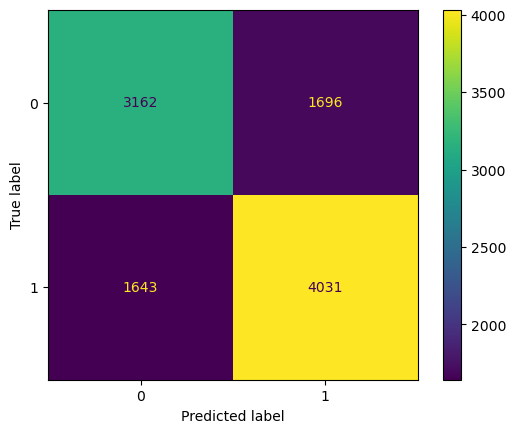

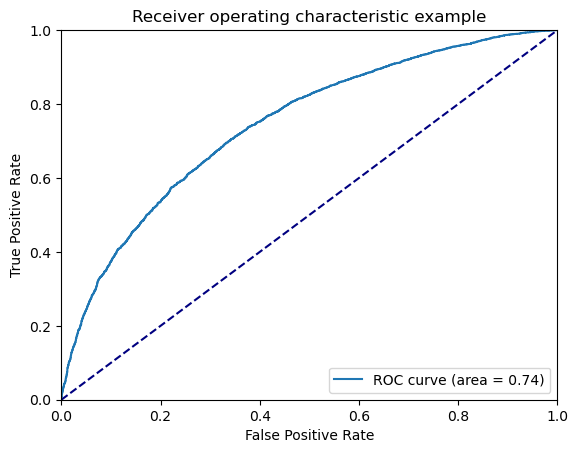

In [37]:
path_model = general_path_models+'/binary_models_sc/pretrained_vgg16_no_tuning_experiment_3_epoch_40_adam_1e-4.h5'
load_best_model_and_evaluate(path_model, test_ds)

#### Experiment Fine Tuning ---> Block 1

In [79]:
path_model = general_path_models+'/binary_models_sc/pretrained_vgg16_no_tuning_experiment_3_epoch_40_adam_1e-4.h5'
model_finetune = tf.keras.models.load_model(path_model)
model_finetune.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 240, 240, 3)]     0         
                                                                 
 tf.__operators__.getitem (S  (None, 240, 240, 3)      0         
 licingOpLambda)                                                 
                                                                 
 tf.nn.bias_add (TFOpLambda)  (None, 240, 240, 3)      0         
                                                                 
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 global_average_pooling2d (G  (None, 512)              0         
 lobalAveragePooling2D)                                          
                                                                 
 dropout (Dropout)           (None, 512)               0     

In [80]:
model_finetune.trainable = True

base_model_vgg16 = model_finetune.get_layer("vgg16") # change the name looking at the summary IMPORTANT!
print("Number of layers in the base model: ", len(base_model_vgg16.layers))
base_model_vgg16.summary()

Number of layers in the base model:  19
Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 240, 240, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 240, 240, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 240, 240, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 120, 120, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 120, 120, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 120, 120, 128)     147584    
                                                                 
 block2_pool (MaxPool

In [81]:
set_trainable = False
for layer in base_model_vgg16.layers:
    if layer.name == 'block5_conv1': # è buona pratica indicare da dove si parte a sfreezare la rete
        set_trainable = True
    if set_trainable: # fine a che la variabile booleana è a False allora setto i layer non traininabili altrimenti li setto come trainabili
        layer.trainable = True
    else:
        layer.trainable = False



model_finetune.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 240, 240, 3)]     0         
                                                                 
 tf.__operators__.getitem (S  (None, 240, 240, 3)      0         
 licingOpLambda)                                                 
                                                                 
 tf.nn.bias_add (TFOpLambda)  (None, 240, 240, 3)      0         
                                                                 
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 global_average_pooling2d (G  (None, 512)              0         
 lobalAveragePooling2D)                                          
                                                                 
 dropout (Dropout)           (None, 512)               0     

In [82]:
path_model_tuned = general_path_models+'/binary_models_sc/pretrained_vgg16_FINE_tuning_exp1_block5_conv1_512_dp_epoch_40_adam_1e-4.h5'
history_tune, model_fitted_tuned = fit_model(model_finetune, train_ds, val_ds, path_model_tuned,40,10)

Epoch 1/40
627/627 [==============================] - ETA: 0s - loss: 0.5827 - accuracy: 0.6905
Epoch 00001: val_loss improved from inf to 0.60411, saving model to ./binary_models_sc\pretrained_vgg16_FINE_tuning_exp1_block5_conv1_512_dp_epoch_40_adam_1e-4.h5
627/627 [==============================] - 166s 263ms/step - loss: 0.5827 - accuracy: 0.6905 - val_loss: 0.6041 - val_accuracy: 0.6823
Epoch 2/40
626/627 [============================>.] - ETA: 0s - loss: 0.5792 - accuracy: 0.6939
Epoch 00002: val_loss improved from 0.60411 to 0.60359, saving model to ./binary_models_sc\pretrained_vgg16_FINE_tuning_exp1_block5_conv1_512_dp_epoch_40_adam_1e-4.h5
627/627 [==============================] - 151s 239ms/step - loss: 0.5793 - accuracy: 0.6939 - val_loss: 0.6036 - val_accuracy: 0.6826
Epoch 3/40
626/627 [============================>.] - ETA: 0s - loss: 0.5783 - accuracy: 0.6948
Epoch 00003: val_loss improved from 0.60359 to 0.60236, saving model to ./binary_models_sc\pretrained_vgg16_FINE

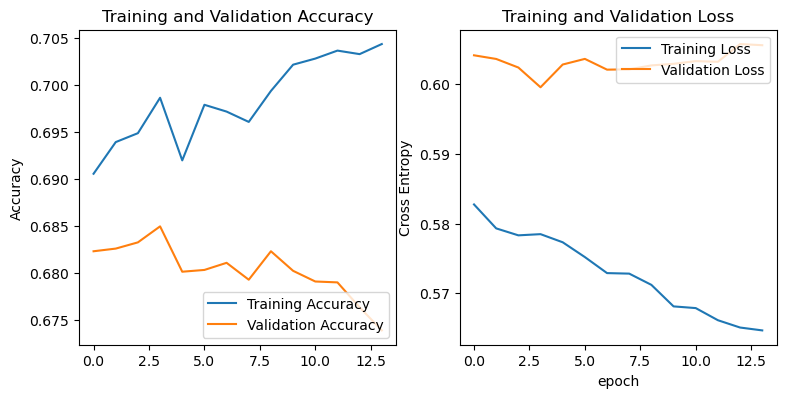

In [83]:
show_history_fit(history_tune)

165/165 [==============================] - 31s 182ms/step - loss: 0.5985 - accuracy: 0.6847
tf.Tensor([0 1 0 ... 0 1 1], shape=(10532,), dtype=int64)
tf.Tensor([0 1 0 ... 0 0 1], shape=(10532,), dtype=int32)
(10532,) (10532,)
Classification report: 
              precision    recall  f1-score   support

           0     0.6633    0.6427    0.6528      4858
           1     0.7020    0.7207    0.7112      5674

    accuracy                         0.6847     10532
   macro avg     0.6826    0.6817    0.6820     10532
weighted avg     0.6841    0.6847    0.6843     10532

ROC Curve:


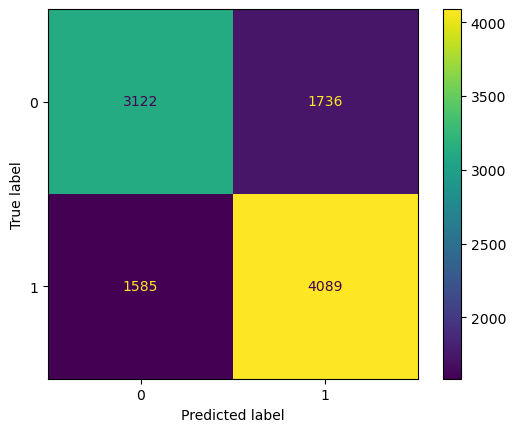

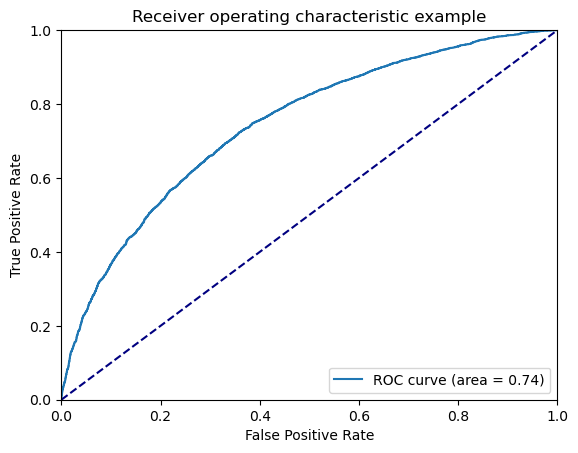

In [84]:
load_best_model_and_evaluate(path_model_tuned, test_ds)

#### Experiment Fine Tunining ---> Block 2

In [85]:
path_model = general_path_models+'/binary_models_sc/pretrained_vgg16_no_tuning_experiment_3_epoch_40_adam_1e-4.h5'
model_finetune = tf.keras.models.load_model(path_model)
model_finetune.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 240, 240, 3)]     0         
                                                                 
 tf.__operators__.getitem (S  (None, 240, 240, 3)      0         
 licingOpLambda)                                                 
                                                                 
 tf.nn.bias_add (TFOpLambda)  (None, 240, 240, 3)      0         
                                                                 
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 global_average_pooling2d (G  (None, 512)              0         
 lobalAveragePooling2D)                                          
                                                                 
 dropout (Dropout)           (None, 512)               0     

In [86]:
model_finetune.trainable = True

base_model_vgg16 = model_finetune.get_layer("vgg16") # change the name looking at the summary IMPORTANT!
print("Number of layers in the base model: ", len(base_model_vgg16.layers))
base_model_vgg16.summary()

Number of layers in the base model:  19
Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 240, 240, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 240, 240, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 240, 240, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 120, 120, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 120, 120, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 120, 120, 128)     147584    
                                                                 
 block2_pool (MaxPool

In [87]:
set_trainable = False
for layer in base_model_vgg16.layers:
    if layer.name == 'block4_conv1': # è buona pratica indicare da dove si parte a sfreezare la rete
        set_trainable = True
    if set_trainable: # fine a che la variabile booleana è a False allora setto i layer non traininabili altrimenti li setto come trainabili
        layer.trainable = True
    else:
        layer.trainable = False



model_finetune.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 240, 240, 3)]     0         
                                                                 
 tf.__operators__.getitem (S  (None, 240, 240, 3)      0         
 licingOpLambda)                                                 
                                                                 
 tf.nn.bias_add (TFOpLambda)  (None, 240, 240, 3)      0         
                                                                 
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 global_average_pooling2d (G  (None, 512)              0         
 lobalAveragePooling2D)                                          
                                                                 
 dropout (Dropout)           (None, 512)               0     

In [88]:
path_model_tuned = general_path_models+'/binary_models_sc/pretrained_vgg16_FINE_tuning_block4REALE_conv1_512_dp_epoch_40_adam_1e-4.h5'
history_tune, model_fitted_tuned = fit_model(model_finetune, train_ds, val_ds, path_model_tuned,40,10)

Epoch 1/40
626/627 [============================>.] - ETA: 0s - loss: 0.5813 - accuracy: 0.6922
Epoch 00001: val_loss improved from inf to 0.60265, saving model to ./binary_models_sc\pretrained_vgg16_FINE_tuning_block4REALE_conv1_512_dp_epoch_40_adam_1e-4.h5
627/627 [==============================] - 148s 234ms/step - loss: 0.5813 - accuracy: 0.6922 - val_loss: 0.6026 - val_accuracy: 0.6809
Epoch 2/40
626/627 [============================>.] - ETA: 0s - loss: 0.5815 - accuracy: 0.6921
Epoch 00002: val_loss improved from 0.60265 to 0.60027, saving model to ./binary_models_sc\pretrained_vgg16_FINE_tuning_block4REALE_conv1_512_dp_epoch_40_adam_1e-4.h5
627/627 [==============================] - 148s 234ms/step - loss: 0.5815 - accuracy: 0.6921 - val_loss: 0.6003 - val_accuracy: 0.6870
Epoch 3/40
626/627 [============================>.] - ETA: 0s - loss: 0.5785 - accuracy: 0.6927
Epoch 00003: val_loss did not improve from 0.60027
627/627 [==============================] - 148s 234ms/step - 

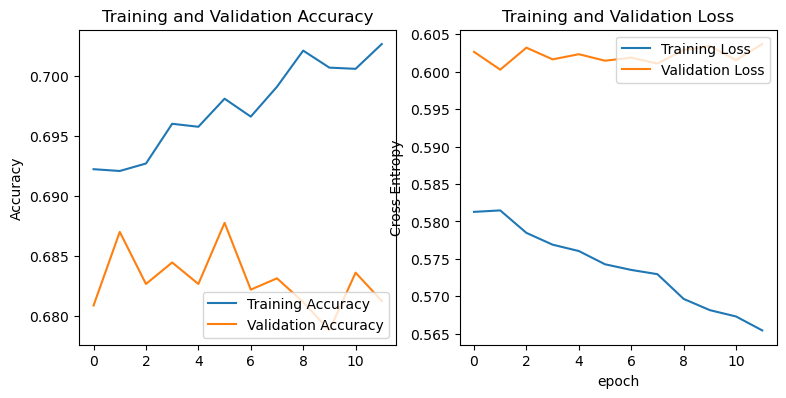

In [89]:
show_history_fit(history_tune)

165/165 [==============================] - 31s 183ms/step - loss: 0.6006 - accuracy: 0.6801
tf.Tensor([1 0 1 ... 1 0 0], shape=(10532,), dtype=int64)
tf.Tensor([1 0 1 ... 1 0 1], shape=(10532,), dtype=int32)
(10532,) (10532,)
Classification report: 
              precision    recall  f1-score   support

           0     0.6563    0.6435    0.6498      4858
           1     0.6998    0.7115    0.7056      5674

    accuracy                         0.6801     10532
   macro avg     0.6780    0.6775    0.6777     10532
weighted avg     0.6797    0.6801    0.6799     10532

ROC Curve:


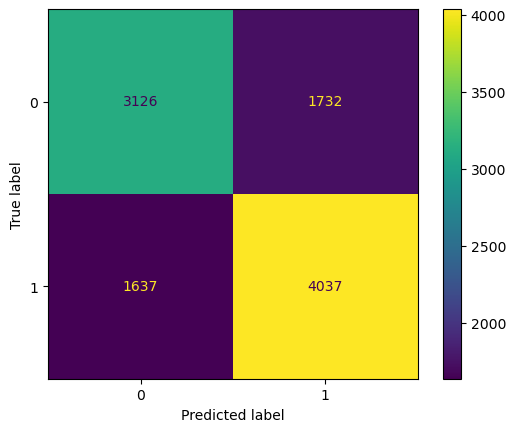

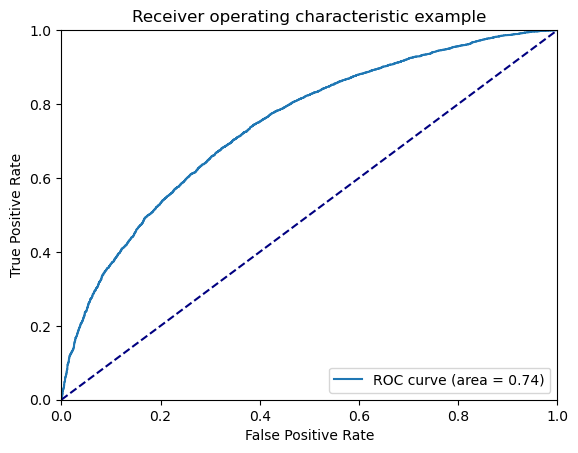

In [90]:
load_best_model_and_evaluate(path_model_tuned, test_ds)

#### Experiment Fine Tuning ---> Block 3

In [91]:
path_model = general_path_models+'/binary_models_sc/pretrained_vgg16_no_tuning_experiment_3_epoch_40_adam_1e-4.h5'
model_finetune = tf.keras.models.load_model(path_model)
model_finetune.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 240, 240, 3)]     0         
                                                                 
 tf.__operators__.getitem (S  (None, 240, 240, 3)      0         
 licingOpLambda)                                                 
                                                                 
 tf.nn.bias_add (TFOpLambda)  (None, 240, 240, 3)      0         
                                                                 
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 global_average_pooling2d (G  (None, 512)              0         
 lobalAveragePooling2D)                                          
                                                                 
 dropout (Dropout)           (None, 512)               0     

In [92]:
model_finetune.trainable = True

base_model_vgg16 = model_finetune.get_layer("vgg16") # change the name looking at the summary IMPORTANT!
print("Number of layers in the base model: ", len(base_model_vgg16.layers))
base_model_vgg16.summary()

Number of layers in the base model:  19
Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 240, 240, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 240, 240, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 240, 240, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 120, 120, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 120, 120, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 120, 120, 128)     147584    
                                                                 
 block2_pool (MaxPool

In [93]:
set_trainable = False
for layer in base_model_vgg16.layers:
    if layer.name == 'block3_conv1': # è buona pratica indicare da dove si parte a sfreezare la rete
        set_trainable = True
    if set_trainable: # fine a che la variabile booleana è a False allora setto i layer non traininabili altrimenti li setto come trainabili
        layer.trainable = True
    else:
        layer.trainable = False



model_finetune.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 240, 240, 3)]     0         
                                                                 
 tf.__operators__.getitem (S  (None, 240, 240, 3)      0         
 licingOpLambda)                                                 
                                                                 
 tf.nn.bias_add (TFOpLambda)  (None, 240, 240, 3)      0         
                                                                 
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 global_average_pooling2d (G  (None, 512)              0         
 lobalAveragePooling2D)                                          
                                                                 
 dropout (Dropout)           (None, 512)               0     

In [94]:
path_model_tuned = general_path_models+'/binary_models_sc/pretrained_vgg16_FINE_tuning_block3REALE_conv1_512_dp_epoch_40_adam_1e-4.h5'
history_tune, model_fitted_tuned = fit_model(model_finetune, train_ds, val_ds, path_model_tuned,40,10)

Epoch 1/40
626/627 [============================>.] - ETA: 0s - loss: 0.5837 - accuracy: 0.6891
Epoch 00001: val_loss improved from inf to 0.60019, saving model to ./binary_models_sc\pretrained_vgg16_FINE_tuning_block3REALE_conv1_512_dp_epoch_40_adam_1e-4.h5
627/627 [==============================] - 149s 235ms/step - loss: 0.5837 - accuracy: 0.6891 - val_loss: 0.6002 - val_accuracy: 0.6858
Epoch 2/40
626/627 [============================>.] - ETA: 0s - loss: 0.5815 - accuracy: 0.6892
Epoch 00002: val_loss did not improve from 0.60019
627/627 [==============================] - 147s 233ms/step - loss: 0.5815 - accuracy: 0.6892 - val_loss: 0.6011 - val_accuracy: 0.6850
Epoch 3/40
627/627 [==============================] - ETA: 0s - loss: 0.5815 - accuracy: 0.6914
Epoch 00003: val_loss improved from 0.60019 to 0.59904, saving model to ./binary_models_sc\pretrained_vgg16_FINE_tuning_block3REALE_conv1_512_dp_epoch_40_adam_1e-4.h5
627/627 [==============================] - 158s 250ms/step - 

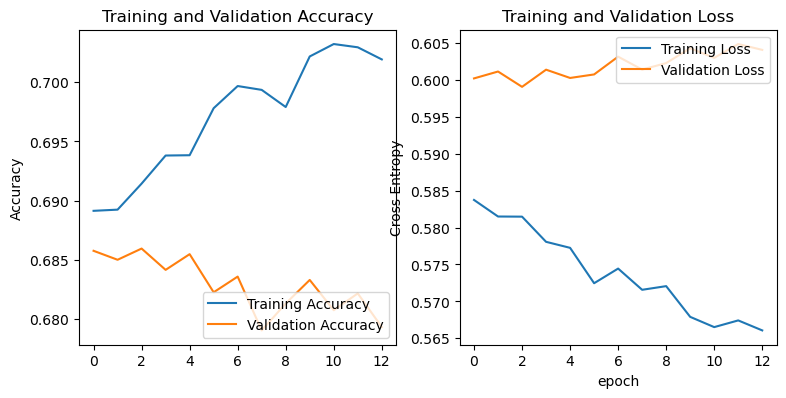

In [95]:
show_history_fit(history_tune)

165/165 [==============================] - 32s 184ms/step - loss: 0.5995 - accuracy: 0.6804
tf.Tensor([1 1 1 ... 1 0 1], shape=(10532,), dtype=int64)
tf.Tensor([1 1 1 ... 1 0 1], shape=(10532,), dtype=int32)
(10532,) (10532,)
Classification report: 
              precision    recall  f1-score   support

           0     0.6593    0.6350    0.6470      4858
           1     0.6971    0.7191    0.7079      5674

    accuracy                         0.6803     10532
   macro avg     0.6782    0.6771    0.6774     10532
weighted avg     0.6797    0.6803    0.6798     10532

ROC Curve:


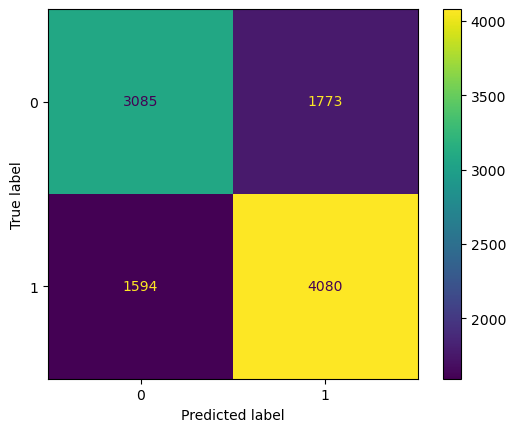

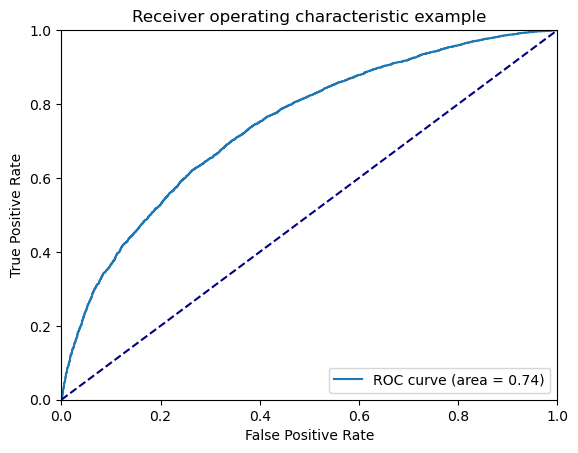

In [96]:
load_best_model_and_evaluate(path_model_tuned, test_ds)

#### Experiment Fine Tuning extra

In [17]:
model_finetune = tf.keras.models.load_model(path_model)
model_finetune.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 240, 240, 3)]     0         
                                                                 
 tf.__operators__.getitem (S  (None, 240, 240, 3)      0         
 licingOpLambda)                                                 
                                                                 
 tf.nn.bias_add (TFOpLambda)  (None, 240, 240, 3)      0         
                                                                 
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 global_average_pooling2d (G  (None, 512)              0         
 lobalAveragePooling2D)                                          
                                                                 
 dense (Dense)               (None, 512)               262656

In [18]:
model_finetune.trainable = True

base_model_vgg16 = model_finetune.get_layer("vgg16") # change the name looking at the summary IMPORTANT!
print("Number of layers in the base model: ", len(base_model_vgg16.layers))
base_model_vgg16.summary()

Number of layers in the base model:  19
Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 240, 240, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 240, 240, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 240, 240, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 120, 120, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 120, 120, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 120, 120, 128)     147584    
                                                                 
 block2_pool (MaxPool

In [19]:
set_trainable = False
for layer in base_model_vgg16.layers:
    if layer.name == 'block4_conv1': # è buona pratica indicare da dove si parte a sfreezare la rete
        set_trainable = True
    if set_trainable: # fine a che la variabile booleana è a False allora setto i layer non traininabili altrimenti li setto come trainabili
        layer.trainable = True
    else:
        layer.trainable = False



model_finetune.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 240, 240, 3)]     0         
                                                                 
 tf.__operators__.getitem (S  (None, 240, 240, 3)      0         
 licingOpLambda)                                                 
                                                                 
 tf.nn.bias_add (TFOpLambda)  (None, 240, 240, 3)      0         
                                                                 
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 global_average_pooling2d (G  (None, 512)              0         
 lobalAveragePooling2D)                                          
                                                                 
 dense (Dense)               (None, 512)               262656

In [20]:
compile_model(model_finetune, 'adam', LR)

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 240, 240, 3)]     0         
                                                                 
 tf.__operators__.getitem (S  (None, 240, 240, 3)      0         
 licingOpLambda)                                                 
                                                                 
 tf.nn.bias_add (TFOpLambda)  (None, 240, 240, 3)      0         
                                                                 
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 global_average_pooling2d (G  (None, 512)              0         
 lobalAveragePooling2D)                                          
                                                                 
 dense (Dense)               (None, 512)               262656

In [21]:
path_model_tuned = general_path_models+'/binary_models_sc/pretrained_vgg16_FINE_tuning_block4_conv1_512_dp_epoch_40_adam_1e-4.h5'
history_tune, model_fitted_tuned = fit_model(model_finetune, train_ds, val_ds, path_model_tuned,40,10)

Epoch 1/40
627/627 [==============================] - ETA: 0s - loss: 0.6512 - accuracy: 0.6272
Epoch 00001: val_loss improved from inf to 0.62702, saving model to ./binary_models_sc\pretrained_vgg16_FINE_tuning_block4_conv1_512_dp_epoch_40_adam_1e-4.h5
627/627 [==============================] - 213s 335ms/step - loss: 0.6512 - accuracy: 0.6272 - val_loss: 0.6270 - val_accuracy: 0.6591
Epoch 2/40
627/627 [==============================] - ETA: 0s - loss: 0.6149 - accuracy: 0.6632
Epoch 00002: val_loss improved from 0.62702 to 0.62205, saving model to ./binary_models_sc\pretrained_vgg16_FINE_tuning_block4_conv1_512_dp_epoch_40_adam_1e-4.h5
627/627 [==============================] - 205s 325ms/step - loss: 0.6149 - accuracy: 0.6632 - val_loss: 0.6221 - val_accuracy: 0.6542
Epoch 3/40
627/627 [==============================] - ETA: 0s - loss: 0.5941 - accuracy: 0.6844
Epoch 00003: val_loss improved from 0.62205 to 0.61401, saving model to ./binary_models_sc\pretrained_vgg16_FINE_tuning_bl

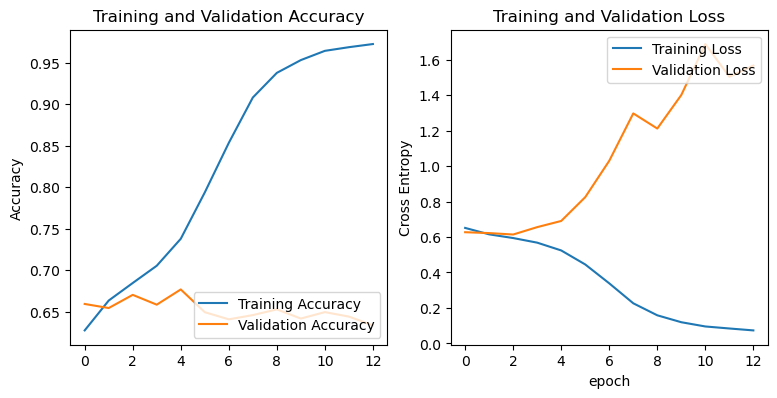

In [22]:
show_history_fit(history_tune)

165/165 [==============================] - 31s 179ms/step - loss: 0.6197 - accuracy: 0.6627
tf.Tensor([0 0 0 ... 1 0 1], shape=(10532,), dtype=int64)
tf.Tensor([0 1 0 ... 0 0 1], shape=(10532,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.6127    0.7305    0.6665      4858
           1     0.7238    0.6047    0.6589      5674

    accuracy                         0.6627     10532
   macro avg     0.6683    0.6676    0.6627     10532
weighted avg     0.6726    0.6627    0.6624     10532



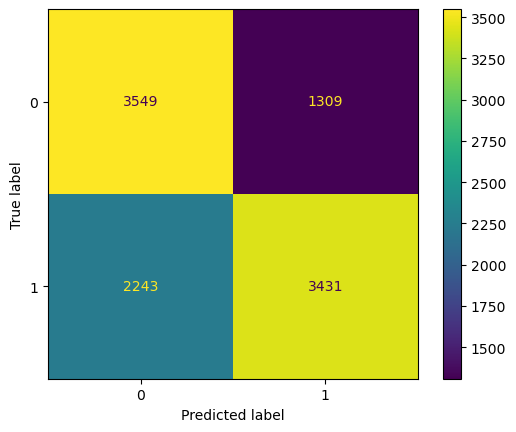

In [23]:
load_best_model_and_evaluate(path_model_tuned, test_ds)

#### Experiment Remove some layers + Fine tunining ---> Block 2

In [ ]:
base_model = tf.keras.applications.vgg16.VGG16(input_shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS),
        weights='imagenet',  # load the network pretrained on ImageNet1K
        include_top=False)
        
base_model.trainable = False

base_model.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 250, 250, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 250, 250, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 125, 125, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 125, 125, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 125, 125, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 62, 62, 128)       0     

In [ ]:
base_model_cutted = tf.keras.Sequential()
for layer in base_model.layers:
    if layer.name == "block4_conv1":
        break
    base_model_cutted.add(layer)

base_model_cutted.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 block1_conv1 (Conv2D)       (None, 250, 250, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 250, 250, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 125, 125, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 125, 125, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 125, 125, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 62, 62, 128)       0         
                                                                 
 block3_conv1 (Conv2D)       (None, 62, 62, 256)       2

In [ ]:
inputs = tf.keras.Input(shape=INPUT_SHAPE)
x = tf.keras.applications.vgg16.preprocess_input(inputs)
x = base_model_cutted(x)
x = layers.GlobalAveragePooling2D()(x)

x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.3)(x)
outputs = layers.Dense(NUM_CLASSES, activation="softmax")(x)
model = tf.keras.Model(inputs, outputs)

In [ ]:
LR = 0.0001
compile_model(model, 'adam', LR)

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.__operators__.getitem (S  (None, 250, 250, 3)      0         
 licingOpLambda)                                                 
                                                                 
 tf.nn.bias_add (TFOpLambda)  (None, 250, 250, 3)      0         
                                                                 
 sequential (Sequential)     (None, 31, 31, 256)       1735488   
                                                                 
 global_average_pooling2d (G  (None, 256)              0         
 lobalAveragePooling2D)                                          
                                                                 
 dense (Dense)               (None, 512)               131584

In [ ]:
path_model = general_path_models+'/binary_models_sc/pretrained_REMOVE_LAYER_vgg16_no_tuning_512_dp_epoch_40_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model,40,10)

Epoch 1/40
627/627 [==============================] - ETA: 0s - loss: 34.8079 - accuracy: 0.5596
Epoch 00001: val_loss improved from inf to 5.00817, saving model to ./binary_models_sc\pretrained_REMOVE_LAYER_vgg16_no_tuning_512_dp_epoch_40_adam_1e-4.h5
627/627 [==============================] - 227s 322ms/step - loss: 34.8079 - accuracy: 0.5596 - val_loss: 5.0082 - val_accuracy: 0.6121
Epoch 2/40
626/627 [============================>.] - ETA: 0s - loss: 3.1095 - accuracy: 0.5689
Epoch 00002: val_loss improved from 5.00817 to 1.45216, saving model to ./binary_models_sc\pretrained_REMOVE_LAYER_vgg16_no_tuning_512_dp_epoch_40_adam_1e-4.h5
627/627 [==============================] - 181s 286ms/step - loss: 3.1085 - accuracy: 0.5690 - val_loss: 1.4522 - val_accuracy: 0.5962
Epoch 3/40
626/627 [============================>.] - ETA: 0s - loss: 1.2546 - accuracy: 0.5899
Epoch 00003: val_loss improved from 1.45216 to 1.01161, saving model to ./binary_models_sc\pretrained_REMOVE_LAYER_vgg16_no_

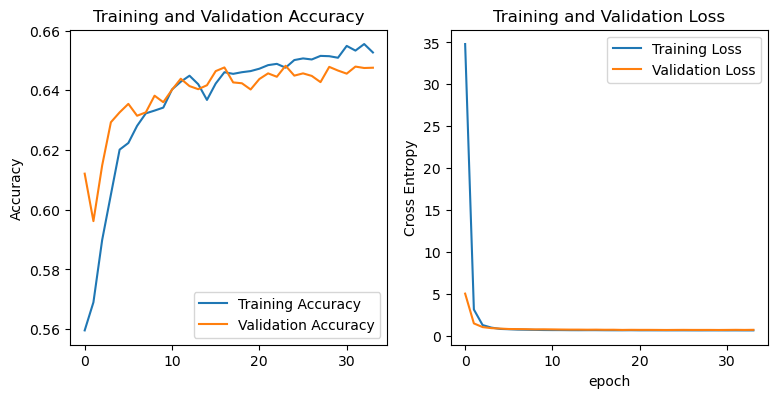

In [16]:
show_history_fit(history)

165/165 [==============================] - 31s 180ms/step - loss: 0.7189 - accuracy: 0.6398
tf.Tensor([0 1 1 ... 1 0 0], shape=(10532,), dtype=int64)
tf.Tensor([0 1 1 ... 1 0 0], shape=(10532,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.5974    0.6719    0.6324      4858
           1     0.6855    0.6123    0.6468      5674

    accuracy                         0.6398     10532
   macro avg     0.6414    0.6421    0.6396     10532
weighted avg     0.6448    0.6398    0.6402     10532



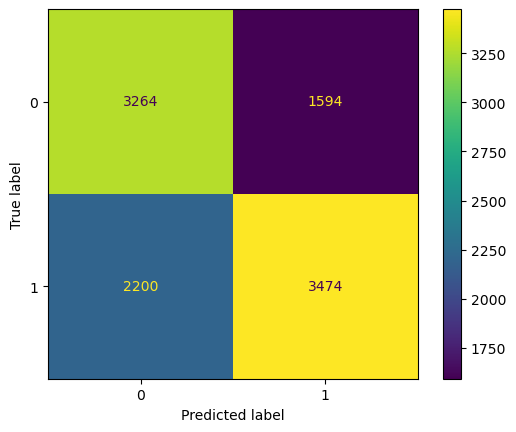

In [17]:
load_best_model_and_evaluate(path_model, test_ds)

In [18]:
model_finetune = tf.keras.models.load_model(path_model)
model_finetune.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.__operators__.getitem (S  (None, 250, 250, 3)      0         
 licingOpLambda)                                                 
                                                                 
 tf.nn.bias_add (TFOpLambda)  (None, 250, 250, 3)      0         
                                                                 
 sequential (Sequential)     (None, 31, 31, 256)       1735488   
                                                                 
 global_average_pooling2d (G  (None, 256)              0         
 lobalAveragePooling2D)                                          
                                                                 
 dense (Dense)               (None, 512)               131584

In [19]:
model_finetune.trainable = True

base_model_vgg16 = model_finetune.get_layer("sequential") # change the name looking at the summary IMPORTANT!
print("Number of layers in the base model: ", len(base_model_vgg16.layers))
base_model_vgg16.summary()

Number of layers in the base model:  10
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 block1_conv1 (Conv2D)       (None, 250, 250, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 250, 250, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 125, 125, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 125, 125, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 125, 125, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 62, 62, 128)       0         
                                                                 
 block3_conv1 (C

In [20]:
set_trainable = False
for layer in base_model_vgg16.layers:
    if layer.name == 'block3_conv1': # è buona pratica indicare da dove si parte a sfreezare la rete
        set_trainable = True
    if set_trainable: # fine a che la variabile booleana è a False allora setto i layer non traininabili altrimenti li setto come trainabili
        layer.trainable = True
    else:
        layer.trainable = False


In [21]:
model_finetune.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.__operators__.getitem (S  (None, 250, 250, 3)      0         
 licingOpLambda)                                                 
                                                                 
 tf.nn.bias_add (TFOpLambda)  (None, 250, 250, 3)      0         
                                                                 
 sequential (Sequential)     (None, 31, 31, 256)       1735488   
                                                                 
 global_average_pooling2d (G  (None, 256)              0         
 lobalAveragePooling2D)                                          
                                                                 
 dense (Dense)               (None, 512)               131584

In [22]:
path_model_tuned = general_path_models+'/binary_models_sc/pretrained_REMOVED_LAYER_vgg16_FINE_tuning_block4_conv1_512_dp_epoch_40_adam_1e-4.h5'
history_tune, model_fitted_tuned = fit_model(model_finetune, train_ds, val_ds, path_model_tuned,40,10)

Epoch 1/40
626/627 [============================>.] - ETA: 0s - loss: 0.6221 - accuracy: 0.6493
Epoch 00001: val_loss improved from inf to 0.66840, saving model to ./binary_models_sc\pretrained_REMOVED_LAYER_vgg16_FINE_tuning_block4_conv1_512_dp_epoch_40_adam_1e-4.h5
627/627 [==============================] - 142s 224ms/step - loss: 0.6221 - accuracy: 0.6493 - val_loss: 0.6684 - val_accuracy: 0.6465
Epoch 2/40
626/627 [============================>.] - ETA: 0s - loss: 0.6223 - accuracy: 0.6498
Epoch 00002: val_loss did not improve from 0.66840
627/627 [==============================] - 141s 223ms/step - loss: 0.6223 - accuracy: 0.6498 - val_loss: 0.6715 - val_accuracy: 0.6431
Epoch 3/40
626/627 [============================>.] - ETA: 0s - loss: 0.6242 - accuracy: 0.6507
Epoch 00003: val_loss did not improve from 0.66840
627/627 [==============================] - 141s 223ms/step - loss: 0.6242 - accuracy: 0.6507 - val_loss: 0.6842 - val_accuracy: 0.6459
Epoch 4/40
626/627 [=============

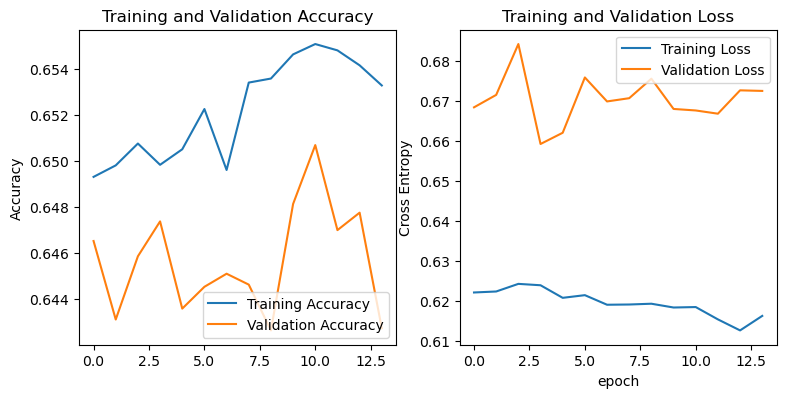

In [23]:
show_history_fit(history_tune)

165/165 [==============================] - 30s 172ms/step - loss: 0.7172 - accuracy: 0.6378
tf.Tensor([0 0 0 ... 0 1 1], shape=(10532,), dtype=int64)
tf.Tensor([0 1 0 ... 0 0 1], shape=(10532,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.5962    0.6655    0.6289      4858
           1     0.6819    0.6140    0.6462      5674

    accuracy                         0.6378     10532
   macro avg     0.6390    0.6398    0.6376     10532
weighted avg     0.6424    0.6378    0.6382     10532



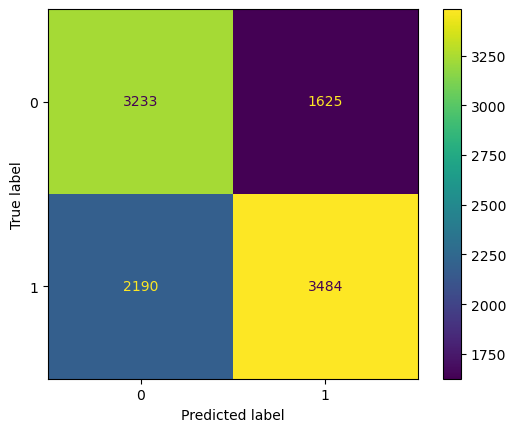

In [24]:
load_best_model_and_evaluate(path_model_tuned, test_ds)

#### Experiment remove some layers + Fine tunining---> Block 1

In [25]:
base_model = tf.keras.applications.vgg16.VGG16(input_shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS),
        weights='imagenet',  # load the network pretrained on ImageNet1K
        include_top=False)
        
base_model.trainable = False

base_model.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 250, 250, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 250, 250, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 125, 125, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 125, 125, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 125, 125, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 62, 62, 128)       0     

In [26]:
base_model_cutted = tf.keras.Sequential()
for layer in base_model.layers:
    if layer.name == "block5_conv1":
        break
    base_model_cutted.add(layer)

base_model_cutted.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 block1_conv1 (Conv2D)       (None, 250, 250, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 250, 250, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 125, 125, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 125, 125, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 125, 125, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 62, 62, 128)       0         
                                                                 
 block3_conv1 (Conv2D)       (None, 62, 62, 256)      

In [27]:
inputs = tf.keras.Input(shape=INPUT_SHAPE)
x = tf.keras.applications.vgg16.preprocess_input(inputs)
x = base_model_cutted(x)
x = layers.GlobalAveragePooling2D()(x)

x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.3)(x)
outputs = layers.Dense(NUM_CLASSES, activation="softmax")(x)
model = tf.keras.Model(inputs, outputs)

In [28]:
LR = 0.0002
compile_model(model, 'rmsprop', LR)

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.__operators__.getitem_1   (None, 250, 250, 3)      0         
 (SlicingOpLambda)                                               
                                                                 
 tf.nn.bias_add_1 (TFOpLambd  (None, 250, 250, 3)      0         
 a)                                                              
                                                                 
 sequential_1 (Sequential)   (None, 15, 15, 512)       7635264   
                                                                 
 global_average_pooling2d_1   (None, 512)              0         
 (GlobalAveragePooling2D)                                        
                                                           

In [29]:
path_model = general_path_models+'/binary_models_sc/pretrained_REMOVE_LAYER_block5_vgg16_no_tuning_512_dp_epoch_40_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model,40,10)

Epoch 1/40
627/627 [==============================] - ETA: 0s - loss: 5.2241 - accuracy: 0.5865
Epoch 00001: val_loss improved from inf to 0.70492, saving model to ./binary_models_sc\pretrained_REMOVE_LAYER_block5_vgg16_no_tuning_512_dp_epoch_40_adam_1e-4.h5
627/627 [==============================] - 175s 275ms/step - loss: 5.2241 - accuracy: 0.5865 - val_loss: 0.7049 - val_accuracy: 0.6352
Epoch 2/40
626/627 [============================>.] - ETA: 0s - loss: 0.6849 - accuracy: 0.6396
Epoch 00002: val_loss improved from 0.70492 to 0.67623, saving model to ./binary_models_sc\pretrained_REMOVE_LAYER_block5_vgg16_no_tuning_512_dp_epoch_40_adam_1e-4.h5
627/627 [==============================] - 172s 272ms/step - loss: 0.6848 - accuracy: 0.6396 - val_loss: 0.6762 - val_accuracy: 0.6429
Epoch 3/40
626/627 [============================>.] - ETA: 0s - loss: 0.6529 - accuracy: 0.6477
Epoch 00003: val_loss improved from 0.67623 to 0.65668, saving model to ./binary_models_sc\pretrained_REMOVE_LAY

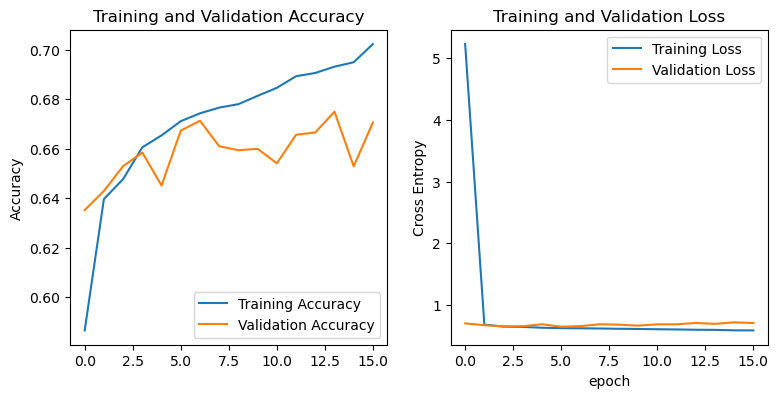

In [30]:
show_history_fit(history)

165/165 [==============================] - 36s 214ms/step - loss: 0.6544 - accuracy: 0.6602
tf.Tensor([1 0 1 ... 1 0 1], shape=(10532,), dtype=int64)
tf.Tensor([1 0 1 ... 1 0 1], shape=(10532,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.6391    0.6052    0.6217      4858
           1     0.6767    0.7074    0.6917      5674

    accuracy                         0.6603     10532
   macro avg     0.6579    0.6563    0.6567     10532
weighted avg     0.6594    0.6603    0.6594     10532



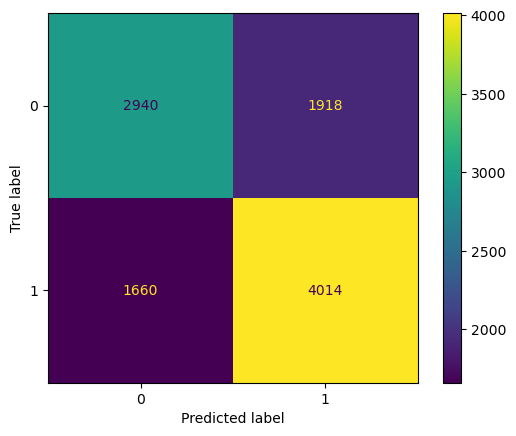

In [31]:
load_best_model_and_evaluate(path_model, test_ds)

In [13]:
path_model = general_path_models+'/binary_models_sc/pretrained_REMOVE_LAYER_block5_vgg16_no_tuning_512_dp_epoch_40_adam_1e-4.h5'
model_finetune = tf.keras.models.load_model(path_model)
model_finetune.trainable = True
model_finetune.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.__operators__.getitem_1   (None, 250, 250, 3)      0         
 (SlicingOpLambda)                                               
                                                                 
 tf.nn.bias_add_1 (TFOpLambd  (None, 250, 250, 3)      0         
 a)                                                              
                                                                 
 sequential_1 (Sequential)   (None, 15, 15, 512)       7635264   
                                                                 
 global_average_pooling2d_1   (None, 512)              0         
 (GlobalAveragePooling2D)                                        
                                                           

In [14]:
set_trainable = False
for layer in model_finetune.get_layer("sequential_1").layers:
    if layer.name == 'block4_conv1': # è buona pratica indicare da dove si parte a sfreezare la rete
        set_trainable = True
    if set_trainable: # fine a che la variabile booleana è a False allora setto i layer non traininabili altrimenti li setto come trainabili
        layer.trainable = True
    else:
        layer.trainable = False

model_finetune.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.__operators__.getitem_1   (None, 250, 250, 3)      0         
 (SlicingOpLambda)                                               
                                                                 
 tf.nn.bias_add_1 (TFOpLambd  (None, 250, 250, 3)      0         
 a)                                                              
                                                                 
 sequential_1 (Sequential)   (None, 15, 15, 512)       7635264   
                                                                 
 global_average_pooling2d_1   (None, 512)              0         
 (GlobalAveragePooling2D)                                        
                                                           

In [15]:
path_model_tuned = general_path_models+'/binary_models_sc/pretrained_REMOVED_LAYER_block5_vgg16_FINE_tuning_block4_conv1_512_dp_epoch_40_adam_1e-4.h5'
history_tune, model_fitted_tuned = fit_model(model_finetune, train_ds, val_ds, path_model_tuned,40,10)

Epoch 1/40
627/627 [==============================] - ETA: 0s - loss: 0.6263 - accuracy: 0.6721
Epoch 00001: val_loss improved from inf to 0.66359, saving model to ./binary_models_sc\pretrained_REMOVED_LAYER_block5_vgg16_FINE_tuning_block4_conv1_512_dp_epoch_40_adam_1e-4.h5
627/627 [==============================] - 173s 261ms/step - loss: 0.6263 - accuracy: 0.6721 - val_loss: 0.6636 - val_accuracy: 0.6644
Epoch 2/40
626/627 [============================>.] - ETA: 0s - loss: 0.6176 - accuracy: 0.6798
Epoch 00002: val_loss did not improve from 0.66359
627/627 [==============================] - 164s 259ms/step - loss: 0.6176 - accuracy: 0.6798 - val_loss: 0.6832 - val_accuracy: 0.6655
Epoch 3/40
626/627 [============================>.] - ETA: 0s - loss: 0.6137 - accuracy: 0.6802
Epoch 00003: val_loss did not improve from 0.66359
627/627 [==============================] - 162s 257ms/step - loss: 0.6137 - accuracy: 0.6802 - val_loss: 0.6785 - val_accuracy: 0.6681
Epoch 4/40
626/627 [======

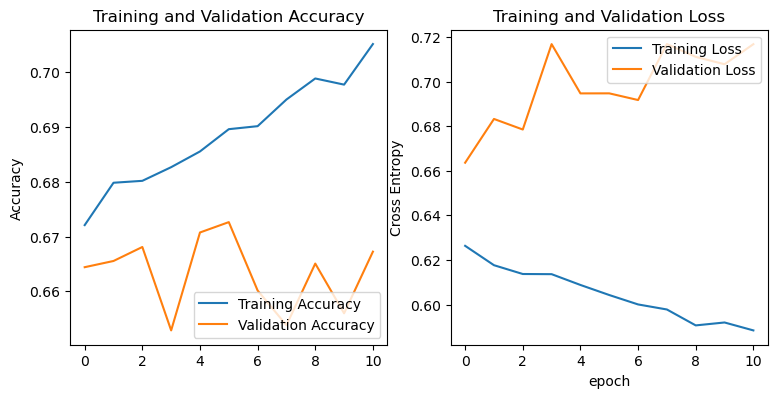

In [16]:
show_history_fit(history_tune)

165/165 [==============================] - 36s 211ms/step - loss: 0.6658 - accuracy: 0.6597
tf.Tensor([1 1 1 ... 1 0 0], shape=(10532,), dtype=int64)
tf.Tensor([0 1 1 ... 1 0 0], shape=(10532,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.6515    0.5640    0.6046      4858
           1     0.6652    0.7416    0.7013      5674

    accuracy                         0.6597     10532
   macro avg     0.6583    0.6528    0.6530     10532
weighted avg     0.6589    0.6597    0.6567     10532



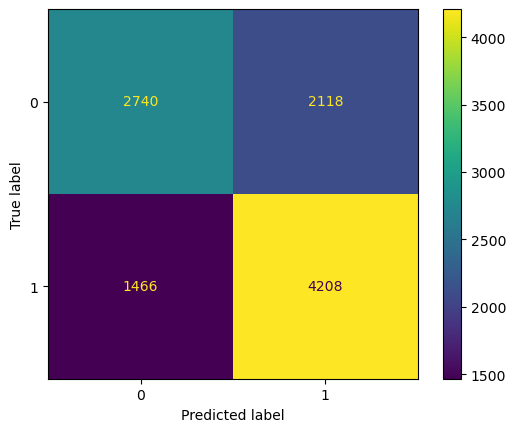

In [17]:
load_best_model_and_evaluate(path_model_tuned, test_ds)

#### Extra Experiment -- uso batch più piccolo ma dimensioni immagini più grandi

In [22]:
base_model = tf.keras.applications.vgg16.VGG16(input_shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS),
        weights='imagenet',  # load the network pretrained on ImageNet1K
        include_top=False)
        
base_model.trainable = False

base_model.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 380, 380, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 380, 380, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 380, 380, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 190, 190, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 190, 190, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 190, 190, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 95, 95, 128)       0     

In [27]:
inputs = tf.keras.Input(shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS))
x = tf.keras.applications.vgg16.preprocess_input(inputs)
x = base_model(x)
x = layers.GlobalAveragePooling2D()(x)
#x = layers.Flatten()(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.4)(x)
outputs = layers.Dense(NUM_CLASSES, activation="softmax")(x)
model = tf.keras.Model(inputs, outputs)

In [28]:
LR = 0.0001

In [29]:

compile_model(model, 'adam', LR)

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 380, 380, 3)]     0         
                                                                 
 tf.__operators__.getitem_1   (None, 380, 380, 3)      0         
 (SlicingOpLambda)                                               
                                                                 
 tf.nn.bias_add_1 (TFOpLambd  (None, 380, 380, 3)      0         
 a)                                                              
                                                                 
 vgg16 (Functional)          (None, 11, 11, 512)       14714688  
                                                                 
 global_average_pooling2d_1   (None, 512)              0         
 (GlobalAveragePooling2D)                                        
                                                           

In [30]:
path_model = general_path_models+'/binary_models_sc/pretrained_vgg16(400x400)_no_tuning_512_dp_epoch_40_adam_1e-4.h5'

In [31]:
history, model_fitted = fit_model(model, train_ds, val_ds, path_model,40,10)

Epoch 1/40
1253/1253 [==============================] - ETA: 0s - loss: 0.9222 - accuracy: 0.6030
Epoch 00001: val_loss improved from inf to 0.63407, saving model to ./binary_models_sc\pretrained_vgg16(400x400)_no_tuning_512_dp_epoch_40_adam_1e-4.h5
1253/1253 [==============================] - 803s 628ms/step - loss: 0.9222 - accuracy: 0.6030 - val_loss: 0.6341 - val_accuracy: 0.6608
Epoch 2/40
1253/1253 [==============================] - ETA: 0s - loss: 0.6364 - accuracy: 0.6560
Epoch 00002: val_loss improved from 0.63407 to 0.61113, saving model to ./binary_models_sc\pretrained_vgg16(400x400)_no_tuning_512_dp_epoch_40_adam_1e-4.h5
1253/1253 [==============================] - 768s 612ms/step - loss: 0.6364 - accuracy: 0.6560 - val_loss: 0.6111 - val_accuracy: 0.6741
Epoch 3/40
1253/1253 [==============================] - ETA: 0s - loss: 0.6060 - accuracy: 0.6738
Epoch 00003: val_loss improved from 0.61113 to 0.60252, saving model to ./binary_models_sc\pretrained_vgg16(400x400)_no_tuni

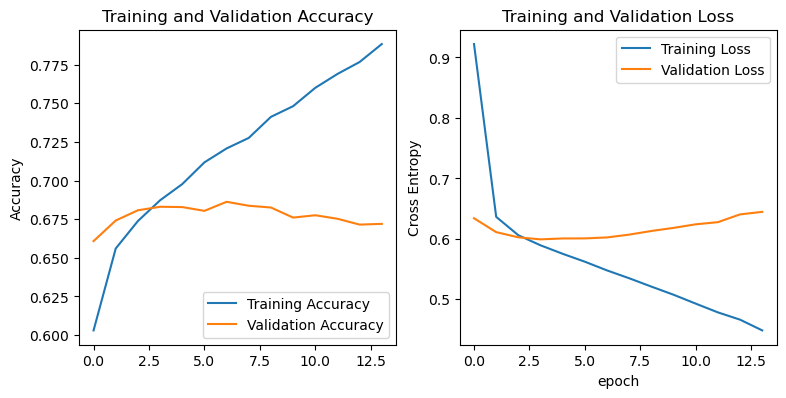

In [32]:
show_history_fit(history)

330/330 [==============================] - 80s 239ms/step - loss: 0.6019 - accuracy: 0.6749
tf.Tensor([0 0 1 ... 0 1 0], shape=(10532,), dtype=int64)
tf.Tensor([0 0 1 ... 1 1 1], shape=(10532,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.6486    0.6441    0.6464      4858
           1     0.6971    0.7013    0.6992      5674

    accuracy                         0.6749     10532
   macro avg     0.6729    0.6727    0.6728     10532
weighted avg     0.6747    0.6749    0.6748     10532



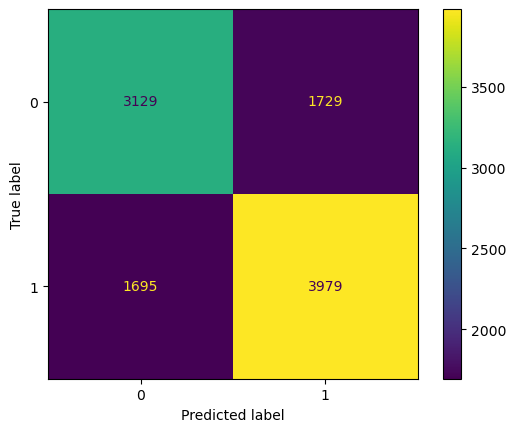

In [33]:
load_best_model_and_evaluate(path_model, test_ds)

#### Extra Experiment 2 --  Finetuning Extra experiment

In [34]:
model_finetune = tf.keras.models.load_model(path_model)
model_finetune.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 380, 380, 3)]     0         
                                                                 
 tf.__operators__.getitem_1   (None, 380, 380, 3)      0         
 (SlicingOpLambda)                                               
                                                                 
 tf.nn.bias_add_1 (TFOpLambd  (None, 380, 380, 3)      0         
 a)                                                              
                                                                 
 vgg16 (Functional)          (None, 11, 11, 512)       14714688  
                                                                 
 global_average_pooling2d_1   (None, 512)              0         
 (GlobalAveragePooling2D)                                        
                                                           

In [35]:
model_finetune.trainable = True

base_model_vgg16 = model_finetune.get_layer("vgg16") # change the name looking at the summary IMPORTANT!
print("Number of layers in the base model: ", len(base_model_vgg16.layers))
base_model_vgg16.summary()

Number of layers in the base model:  19
Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 380, 380, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 380, 380, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 380, 380, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 190, 190, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 190, 190, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 190, 190, 128)     147584    
                                                                 
 block2_pool (MaxPool

In [36]:
set_trainable = False
for layer in base_model_vgg16.layers:
    if layer.name == 'block4_conv1': # è buona pratica indicare da dove si parte a sfreezare la rete
        set_trainable = True
    if set_trainable: # fine a che la variabile booleana è a False allora setto i layer non traininabili altrimenti li setto come trainabili
        layer.trainable = True
    else:
        layer.trainable = False



model_finetune.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 380, 380, 3)]     0         
                                                                 
 tf.__operators__.getitem_1   (None, 380, 380, 3)      0         
 (SlicingOpLambda)                                               
                                                                 
 tf.nn.bias_add_1 (TFOpLambd  (None, 380, 380, 3)      0         
 a)                                                              
                                                                 
 vgg16 (Functional)          (None, 11, 11, 512)       14714688  
                                                                 
 global_average_pooling2d_1   (None, 512)              0         
 (GlobalAveragePooling2D)                                        
                                                           

In [37]:
compile_model(model_finetune, 'adam', LR)

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 380, 380, 3)]     0         
                                                                 
 tf.__operators__.getitem_1   (None, 380, 380, 3)      0         
 (SlicingOpLambda)                                               
                                                                 
 tf.nn.bias_add_1 (TFOpLambd  (None, 380, 380, 3)      0         
 a)                                                              
                                                                 
 vgg16 (Functional)          (None, 11, 11, 512)       14714688  
                                                                 
 global_average_pooling2d_1   (None, 512)              0         
 (GlobalAveragePooling2D)                                        
                                                           

In [38]:
path_model_tuned = general_path_models+'/binary_models_sc/pretrained_vgg16(400x400)_FINE_tuning_block4_conv1_512_dp_epoch_40_adam_1e-4.h5'
history_tune, model_fitted_tuned = fit_model(model_finetune, train_ds, val_ds, path_model_tuned,40,10)

Epoch 1/40
1253/1253 [==============================] - ETA: 0s - loss: 0.6790 - accuracy: 0.5695
Epoch 00001: val_loss improved from inf to 0.63739, saving model to ./binary_models_sc\pretrained_vgg16(400x400)_FINE_tuning_block4_conv1_512_dp_epoch_40_adam_1e-4.h5
1253/1253 [==============================] - 509s 404ms/step - loss: 0.6790 - accuracy: 0.5695 - val_loss: 0.6374 - val_accuracy: 0.6331
Epoch 2/40
1253/1253 [==============================] - ETA: 0s - loss: 0.6430 - accuracy: 0.6323
Epoch 00002: val_loss improved from 0.63739 to 0.62634, saving model to ./binary_models_sc\pretrained_vgg16(400x400)_FINE_tuning_block4_conv1_512_dp_epoch_40_adam_1e-4.h5
1253/1253 [==============================] - 507s 404ms/step - loss: 0.6430 - accuracy: 0.6323 - val_loss: 0.6263 - val_accuracy: 0.6483
Epoch 3/40
1253/1253 [==============================] - ETA: 0s - loss: 0.6295 - accuracy: 0.6471
Epoch 00003: val_loss improved from 0.62634 to 0.61646, saving model to ./binary_models_sc\pre

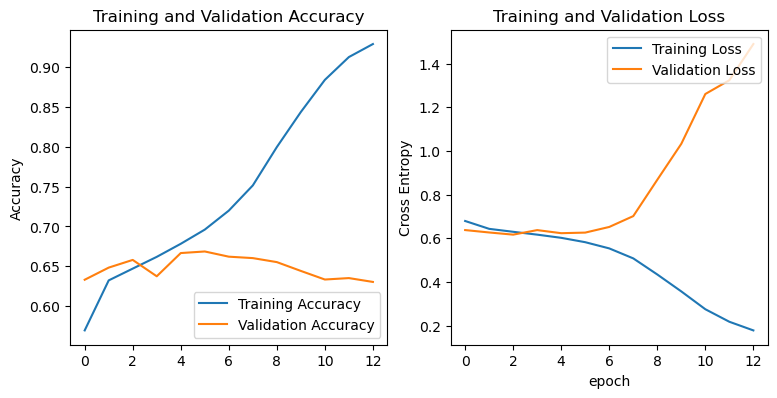

In [41]:
show_history_fit(history_tune)

330/330 [==============================] - 79s 238ms/step - loss: 0.6233 - accuracy: 0.6456
tf.Tensor([0 1 0 ... 1 0 1], shape=(10532,), dtype=int64)
tf.Tensor([1 0 1 ... 1 0 1], shape=(10532,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.6209    0.5947    0.6075      4858
           1     0.6651    0.6891    0.6769      5674

    accuracy                         0.6456     10532
   macro avg     0.6430    0.6419    0.6422     10532
weighted avg     0.6447    0.6456    0.6449     10532



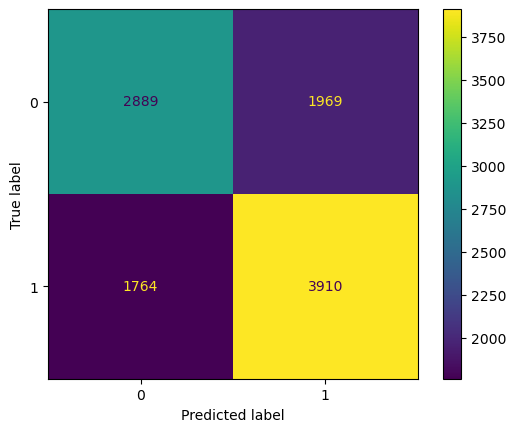

In [42]:
path_model_tuned = general_path_models+'/binary_models_sc/pretrained_vgg16(400x400)_FINE_tuning_block4_conv1_512_dp_epoch_40_adam_1e-4.h5'
load_best_model_and_evaluate(path_model_tuned, test_ds)

### RESNET50

#### Experiment Features Extraction -- Add one layer

In [21]:
base_model = tf.keras.applications.resnet50.ResNet50(input_shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS),
        weights='imagenet',  # load the network pretrained on ImageNet1K
        include_top=False)
        
base_model.trainable = False

base_model.summary()

94781440/94765736 [==============================] - 8s 0us/step
Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 250, 250, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 256, 256, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 125, 125, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                          

In [22]:
inputs = tf.keras.Input(shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS))
x = tf.keras.applications.resnet.preprocess_input(inputs)
x = base_model(x)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.3)(x)
outputs = layers.Dense(NUM_CLASSES, activation="softmax")(x)
model = tf.keras.Model(inputs, outputs)

In [23]:
LR = 0.0001
compile_model(model, 'adam', LR)

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.__operators__.getitem (S  (None, 250, 250, 3)      0         
 licingOpLambda)                                                 
                                                                 
 tf.nn.bias_add (TFOpLambda)  (None, 250, 250, 3)      0         
                                                                 
 resnet50 (Functional)       (None, 8, 8, 2048)        23587712  
                                                                 
 global_average_pooling2d (G  (None, 2048)             0         
 lobalAveragePooling2D)                                          
                                                                 
 dense (Dense)               (None, 512)               104908

In [24]:
path_model = general_path_models+'/binary_models_sc/pretrained_RESNET_no_tuning_512_dp_epoch_40_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model,40,10)

Epoch 1/40
627/627 [==============================] - ETA: 0s - loss: 0.6463 - accuracy: 0.6496
Epoch 00001: val_loss improved from inf to 0.58911, saving model to ./binary_models_sc\pretrained_RESNET_no_tuning_512_dp_epoch_40_adam_1e-4.h5


c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\engine\functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


627/627 [==============================] - 221s 334ms/step - loss: 0.6463 - accuracy: 0.6496 - val_loss: 0.5891 - val_accuracy: 0.6841
Epoch 2/40
627/627 [==============================] - ETA: 0s - loss: 0.5865 - accuracy: 0.6879
Epoch 00002: val_loss improved from 0.58911 to 0.58481, saving model to ./binary_models_sc\pretrained_RESNET_no_tuning_512_dp_epoch_40_adam_1e-4.h5
627/627 [==============================] - 208s 331ms/step - loss: 0.5865 - accuracy: 0.6879 - val_loss: 0.5848 - val_accuracy: 0.6829
Epoch 3/40
627/627 [==============================] - ETA: 0s - loss: 0.5659 - accuracy: 0.7051
Epoch 00003: val_loss improved from 0.58481 to 0.58039, saving model to ./binary_models_sc\pretrained_RESNET_no_tuning_512_dp_epoch_40_adam_1e-4.h5
627/627 [==============================] - 208s 330ms/step - loss: 0.5659 - accuracy: 0.7051 - val_loss: 0.5804 - val_accuracy: 0.6888
Epoch 4/40
627/627 [==============================] - ETA: 0s - loss: 0.5463 - accuracy: 0.7223
Epoch 00004

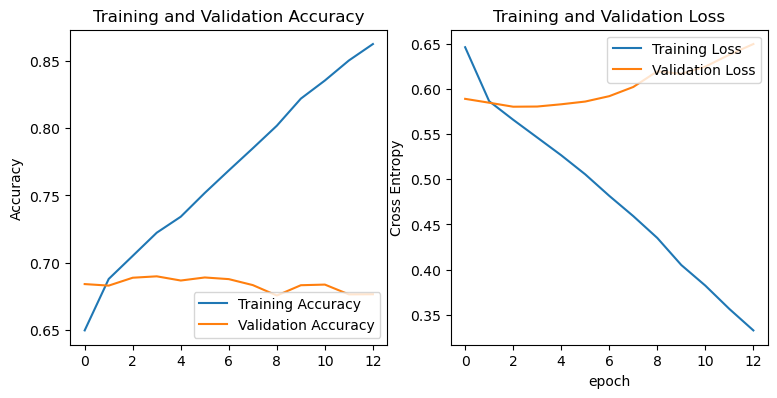

In [25]:
show_history_fit(history)

165/165 [==============================] - 31s 175ms/step - loss: 0.5904 - accuracy: 0.6828
tf.Tensor([1 0 0 ... 1 1 1], shape=(10532,), dtype=int64)
tf.Tensor([1 0 0 ... 1 1 1], shape=(10532,), dtype=int32)
(10532,) (10532,)
Classification report: 
              precision    recall  f1-score   support

           0     0.6636    0.6334    0.6481      4858
           1     0.6979    0.7251    0.7112      5674

    accuracy                         0.6828     10532
   macro avg     0.6807    0.6792    0.6797     10532
weighted avg     0.6821    0.6828    0.6821     10532

ROC Curve:


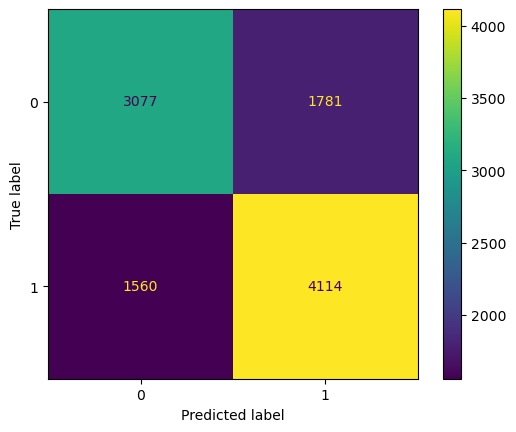

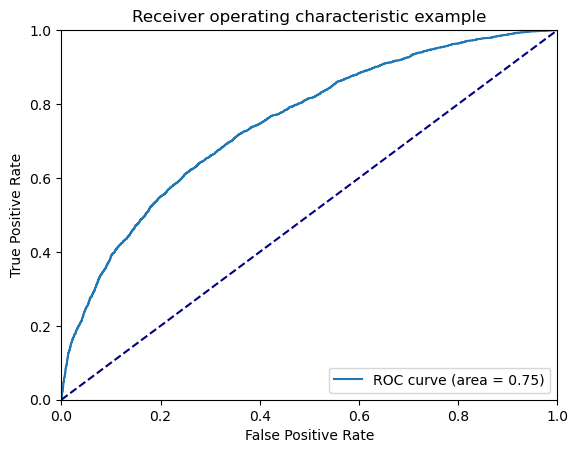

In [62]:
path_model = general_path_models+'/binary_models_sc/pretrained_RESNET_no_tuning_512_dp_epoch_40_adam_1e-4.h5'
load_best_model_and_evaluate(path_model, test_ds)

#### Experiment Feature Extraction -- Add regularization to previous configuration

In [27]:
inputs = tf.keras.Input(shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS))
x = tf.keras.applications.resnet.preprocess_input(inputs)
x = base_model(x)
x = layers.GlobalAveragePooling2D()(x)
#x = layers.Flatten()(x)
x = layers.Dense(512, activation='relu', kernel_regularizer=tf.keras.regularizers.L2(0.001))(x)
x = layers.Dropout(0.4)(x)
outputs = layers.Dense(NUM_CLASSES, activation="softmax")(x)
model = tf.keras.Model(inputs, outputs)

In [28]:
LR = 0.0001
compile_model(model, 'adam', LR)

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.__operators__.getitem_1   (None, 250, 250, 3)      0         
 (SlicingOpLambda)                                               
                                                                 
 tf.nn.bias_add_1 (TFOpLambd  (None, 250, 250, 3)      0         
 a)                                                              
                                                                 
 resnet50 (Functional)       (None, 8, 8, 2048)        23587712  
                                                                 
 global_average_pooling2d_1   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                           

In [29]:
path_model = general_path_models+'/binary_models_sc/pretrained_RESNET_no_tuning_512_dp_regularization_epoch_40_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model,40,10)

Epoch 1/40
626/627 [============================>.] - ETA: 0s - loss: 1.3767 - accuracy: 0.6453
Epoch 00001: val_loss improved from inf to 1.23514, saving model to ./binary_models_sc\pretrained_RESNET_no_tuning_512_dp_regularization_epoch_40_adam_1e-4.h5
627/627 [==============================] - 129s 202ms/step - loss: 1.3766 - accuracy: 0.6454 - val_loss: 1.2351 - val_accuracy: 0.6753


c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\engine\functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


Epoch 2/40
626/627 [============================>.] - ETA: 0s - loss: 1.1640 - accuracy: 0.6852
Epoch 00002: val_loss improved from 1.23514 to 1.09987, saving model to ./binary_models_sc\pretrained_RESNET_no_tuning_512_dp_regularization_epoch_40_adam_1e-4.h5
627/627 [==============================] - 125s 198ms/step - loss: 1.1640 - accuracy: 0.6852 - val_loss: 1.0999 - val_accuracy: 0.6832
Epoch 3/40
626/627 [============================>.] - ETA: 0s - loss: 1.0397 - accuracy: 0.6998
Epoch 00003: val_loss improved from 1.09987 to 1.00520, saving model to ./binary_models_sc\pretrained_RESNET_no_tuning_512_dp_regularization_epoch_40_adam_1e-4.h5
627/627 [==============================] - 125s 198ms/step - loss: 1.0396 - accuracy: 0.6999 - val_loss: 1.0052 - val_accuracy: 0.6882
Epoch 4/40
626/627 [============================>.] - ETA: 0s - loss: 0.9443 - accuracy: 0.7086
Epoch 00004: val_loss improved from 1.00520 to 0.93215, saving model to ./binary_models_sc\pretrained_RESNET_no_tuni

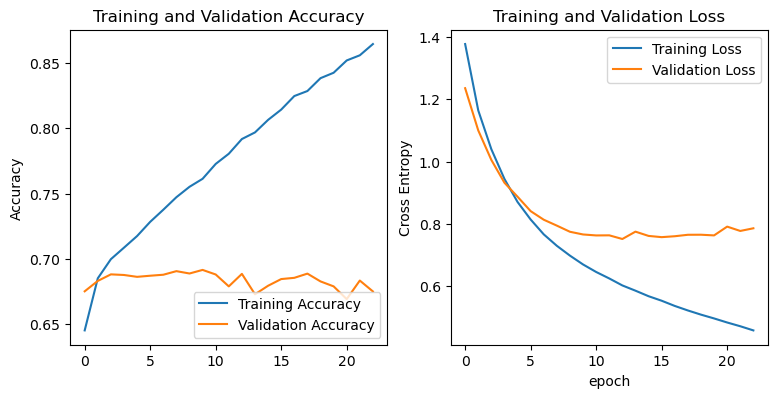

In [31]:
show_history_fit(history)

165/165 [==============================] - 32s 181ms/step - loss: 0.7640 - accuracy: 0.6799
tf.Tensor([1 0 1 ... 0 1 0], shape=(10532,), dtype=int64)
tf.Tensor([1 1 1 ... 0 1 1], shape=(10532,), dtype=int32)
(10532,) (10532,)
Classification report: 
              precision    recall  f1-score   support

           0     0.6552    0.6462    0.6506      4858
           1     0.7006    0.7088    0.7047      5674

    accuracy                         0.6799     10532
   macro avg     0.6779    0.6775    0.6777     10532
weighted avg     0.6796    0.6799    0.6798     10532

ROC Curve:


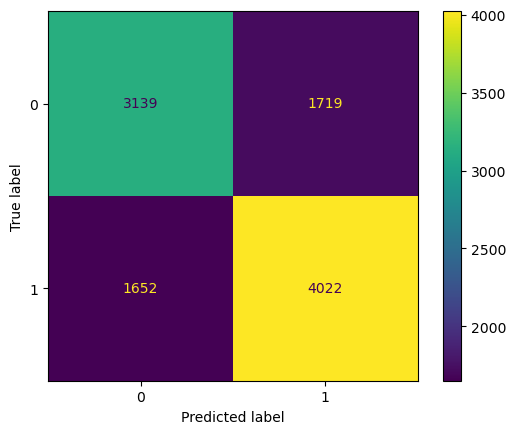

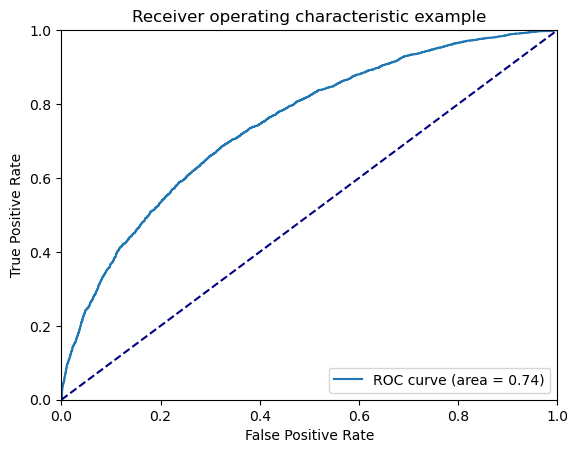

In [61]:
path_model = general_path_models+'/binary_models_sc/pretrained_RESNET_no_tuning_512_dp_regularization_epoch_40_adam_1e-4.h5'
load_best_model_and_evaluate(path_model, test_ds)

#### Experiment Features Extraction -- Add another dropout

In [39]:
base_model = tf.keras.applications.resnet50.ResNet50(input_shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS),
        weights='imagenet',  # load the network pretrained on ImageNet1K
        include_top=False)
        
base_model.trainable = False

base_model.summary()

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_6 (InputLayer)           [(None, 250, 250, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 256, 256, 3)  0           ['input_6[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 125, 125, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                           

In [40]:
inputs = tf.keras.Input(shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS))
x = tf.keras.applications.resnet.preprocess_input(inputs)
x = base_model(x)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.4)(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.3)(x)
outputs = layers.Dense(NUM_CLASSES, activation="softmax")(x)
model = tf.keras.Model(inputs, outputs)

In [41]:
LR = 0.0001
compile_model(model, 'adam', LR)

Model: "model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_7 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.__operators__.getitem_1   (None, 250, 250, 3)      0         
 (SlicingOpLambda)                                               
                                                                 
 tf.nn.bias_add_1 (TFOpLambd  (None, 250, 250, 3)      0         
 a)                                                              
                                                                 
 resnet50 (Functional)       (None, 8, 8, 2048)        23587712  
                                                                 
 global_average_pooling2d_4   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                           

In [42]:
path_model = general_path_models+'/extra_binary_models_sc/pretrained_RESNET_no_tuning_512_dp_epoch_40_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model,50,15)

Epoch 1/50
627/627 [==============================] - ETA: 0s - loss: 0.7095 - accuracy: 0.6205
Epoch 00001: val_loss improved from inf to 0.60601, saving model to ./extra_binary_models_sc\pretrained_RESNET_no_tuning_512_dp_epoch_40_adam_1e-4.h5


c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\engine\functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


627/627 [==============================] - 164s 255ms/step - loss: 0.7095 - accuracy: 0.6205 - val_loss: 0.6060 - val_accuracy: 0.6738
Epoch 2/50
626/627 [============================>.] - ETA: 0s - loss: 0.6200 - accuracy: 0.6582
Epoch 00002: val_loss improved from 0.60601 to 0.59756, saving model to ./extra_binary_models_sc\pretrained_RESNET_no_tuning_512_dp_epoch_40_adam_1e-4.h5
627/627 [==============================] - 174s 273ms/step - loss: 0.6200 - accuracy: 0.6582 - val_loss: 0.5976 - val_accuracy: 0.6827
Epoch 3/50
626/627 [============================>.] - ETA: 0s - loss: 0.6062 - accuracy: 0.6698
Epoch 00003: val_loss improved from 0.59756 to 0.59559, saving model to ./extra_binary_models_sc\pretrained_RESNET_no_tuning_512_dp_epoch_40_adam_1e-4.h5
627/627 [==============================] - 153s 241ms/step - loss: 0.6062 - accuracy: 0.6699 - val_loss: 0.5956 - val_accuracy: 0.6844
Epoch 4/50
626/627 [============================>.] - ETA: 0s - loss: 0.5967 - accuracy: 0.6780

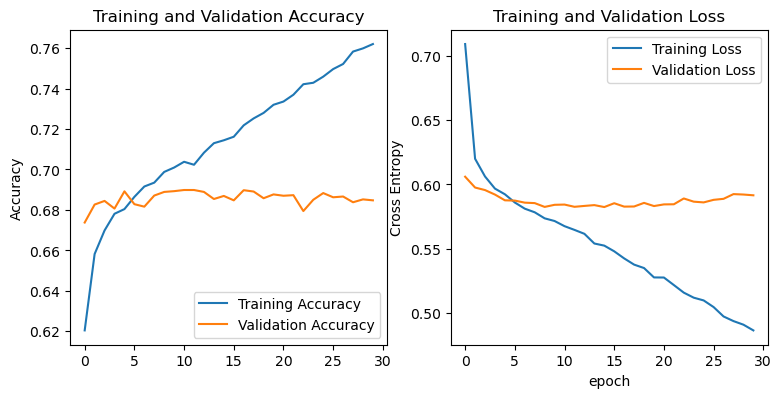

In [43]:
show_history_fit(history)

165/165 [==============================] - 31s 177ms/step - loss: 0.5865 - accuracy: 0.6855
tf.Tensor([1 1 1 ... 1 0 1], shape=(10532,), dtype=int64)
tf.Tensor([1 0 0 ... 1 0 1], shape=(10532,), dtype=int32)
(10532,) (10532,)
Classification report: 
              precision    recall  f1-score   support

           0     0.6610    0.6525    0.6567      4858
           1     0.7057    0.7134    0.7096      5674

    accuracy                         0.6853     10532
   macro avg     0.6833    0.6830    0.6831     10532
weighted avg     0.6851    0.6853    0.6852     10532

ROC Curve:


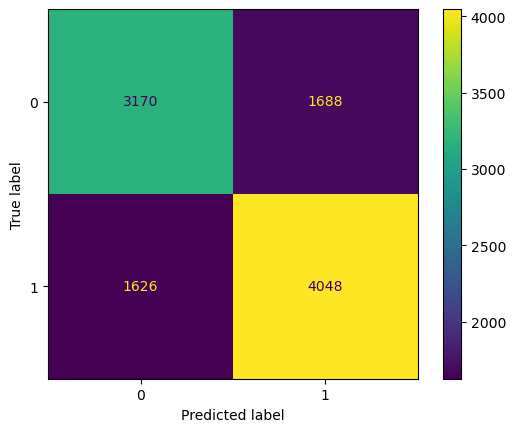

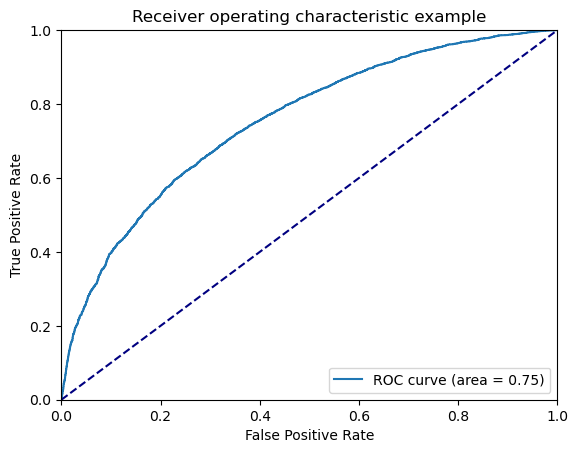

In [60]:
path_model = general_path_models+'/extra_binary_models_sc/pretrained_RESNET_no_tuning_512_dp_epoch_40_adam_1e-4.h5'
load_best_model_and_evaluate(path_model, test_ds)

#### Experiment Feature Extraction -- Add another layers

In [17]:
base_model = tf.keras.applications.resnet50.ResNet50(input_shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS),
        weights='imagenet',  # load the network pretrained on ImageNet1K
        include_top=False)
        
base_model.trainable = False

In [18]:
inputs = tf.keras.Input(shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS))
x = tf.keras.applications.resnet.preprocess_input(inputs)
x = base_model(x)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(1024, activation='relu')(x)
x = layers.Dropout(0.4)(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.4)(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dense(256, activation='relu')(x)
outputs = layers.Dense(NUM_CLASSES, activation="softmax")(x)
model = tf.keras.Model(inputs, outputs)

In [19]:
LR = 0.0001
compile_model(model, 'adam', LR)

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 240, 240, 3)]     0         
                                                                 
 tf.__operators__.getitem_1   (None, 240, 240, 3)      0         
 (SlicingOpLambda)                                               
                                                                 
 tf.nn.bias_add_1 (TFOpLambd  (None, 240, 240, 3)      0         
 a)                                                              
                                                                 
 resnet50 (Functional)       (None, 8, 8, 2048)        23587712  
                                                                 
 global_average_pooling2d_1   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                           

In [20]:
path_model = general_path_models+'/binary_models_sc/pretrained_RESNET_no_tuning_Experiment_3_epoch_40_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model,40,20)

Epoch 1/40
627/627 [==============================] - ETA: 0s - loss: 0.6389 - accuracy: 0.6357
Epoch 00001: val_loss improved from inf to 0.61049, saving model to ./binary_models_sc\pretrained_RESNET_no_tuning_Experiment_3_epoch_40_adam_1e-4.h5


c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\engine\functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


627/627 [==============================] - 131s 202ms/step - loss: 0.6389 - accuracy: 0.6357 - val_loss: 0.6105 - val_accuracy: 0.6603
Epoch 2/40
626/627 [============================>.] - ETA: 0s - loss: 0.6079 - accuracy: 0.6692
Epoch 00002: val_loss improved from 0.61049 to 0.58776, saving model to ./binary_models_sc\pretrained_RESNET_no_tuning_Experiment_3_epoch_40_adam_1e-4.h5
627/627 [==============================] - 126s 198ms/step - loss: 0.6078 - accuracy: 0.6692 - val_loss: 0.5878 - val_accuracy: 0.6845
Epoch 3/40
626/627 [============================>.] - ETA: 0s - loss: 0.5957 - accuracy: 0.6806
Epoch 00003: val_loss did not improve from 0.58776
627/627 [==============================] - 118s 187ms/step - loss: 0.5956 - accuracy: 0.6807 - val_loss: 0.5906 - val_accuracy: 0.6849
Epoch 4/40
626/627 [============================>.] - ETA: 0s - loss: 0.5866 - accuracy: 0.6878
Epoch 00004: val_loss improved from 0.58776 to 0.58494, saving model to ./binary_models_sc\pretrained_

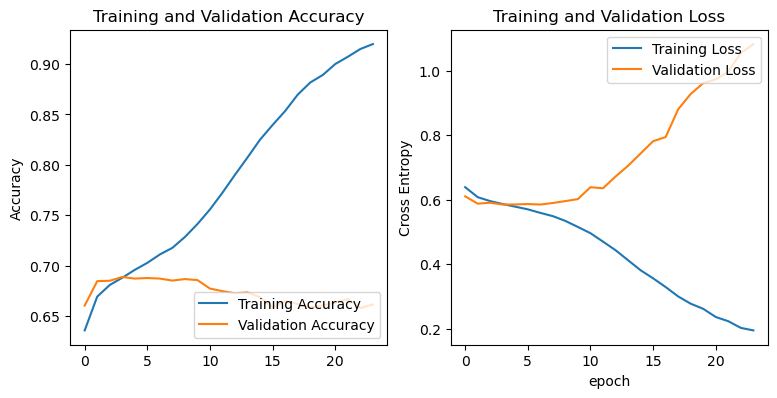

In [21]:
show_history_fit(history)

165/165 [==============================] - 29s 165ms/step - loss: 0.5920 - accuracy: 0.6792
tf.Tensor([0 1 1 ... 1 0 0], shape=(10532,), dtype=int64)
tf.Tensor([0 1 1 ... 1 0 0], shape=(10532,), dtype=int32)
(10532,) (10532,)
Classification report: 
              precision    recall  f1-score   support

           0     0.6446    0.6787    0.6612      4858
           1     0.7118    0.6796    0.6953      5674

    accuracy                         0.6792     10532
   macro avg     0.6782    0.6791    0.6783     10532
weighted avg     0.6808    0.6792    0.6796     10532

ROC Curve:


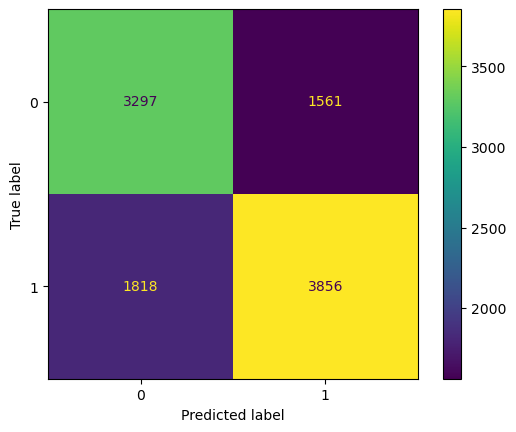

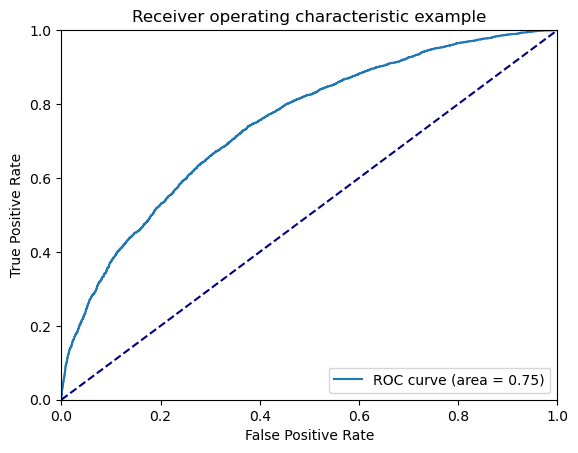

In [74]:
path_model = general_path_models+'/binary_models_sc/pretrained_RESNET_no_tuning_Experiment_3_epoch_40_adam_1e-4.h5'
load_best_model_and_evaluate(path_model, test_ds)

#### Experiment Fine Tuning ---> Block 1

In [111]:
path_model = general_path_models+'/extra_binary_models_sc/pretrained_RESNET_no_tuning_512_dp_epoch_40_adam_1e-4.h5'
model_finetune = tf.keras.models.load_model(path_model)

In [112]:
model_finetune.trainable = True

base_model_resnet50 = model_finetune.get_layer("resnet50") # change the name looking at the summary IMPORTANT!
print("Number of layers in the base model: ", len(base_model_resnet50.layers))
base_model_resnet50.summary()

Number of layers in the base model:  175
Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_6 (InputLayer)           [(None, 250, 250, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 256, 256, 3)  0           ['input_6[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 125, 125, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                  

In [113]:
set_trainable = False
for layer in base_model_resnet50.layers:
    if layer.name == 'conv5_block1_1_conv': # è buona pratica indicare da dove si parte a sfreezare la rete
        set_trainable = True
    if set_trainable:
        if layer.name.endswith('bn'): # fine a che la variabile booleana è a False allora setto i layer non traininabili altrimenti li setto come trainabili
            layer.trainable = False
        else:
            layer.trainable = True
    else:
        layer.trainable = False

In [114]:
path_model_tuned = general_path_models+'/binary_models_sc/pretrained_RESNET_FINE_tuning_block1_epoch_40_adam_1e-4.h5'
history_tune, model_fitted_tuned = fit_model(model_finetune, train_ds, val_ds, path_model_tuned,40,10)

Epoch 1/40
627/627 [==============================] - ETA: 0s - loss: 0.5466 - accuracy: 0.7185
Epoch 00001: val_loss improved from inf to 0.58194, saving model to ./binary_models_sc\pretrained_RESNET_FINE_tuning_block1_epoch_40_adam_1e-4.h5


c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\engine\functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


627/627 [==============================] - 126s 197ms/step - loss: 0.5466 - accuracy: 0.7185 - val_loss: 0.5819 - val_accuracy: 0.6896
Epoch 2/40
626/627 [============================>.] - ETA: 0s - loss: 0.5444 - accuracy: 0.7208
Epoch 00002: val_loss did not improve from 0.58194
627/627 [==============================] - 122s 193ms/step - loss: 0.5444 - accuracy: 0.7209 - val_loss: 0.5829 - val_accuracy: 0.6885
Epoch 3/40
626/627 [============================>.] - ETA: 0s - loss: 0.5389 - accuracy: 0.7257
Epoch 00003: val_loss did not improve from 0.58194
627/627 [==============================] - 122s 193ms/step - loss: 0.5389 - accuracy: 0.7257 - val_loss: 0.5835 - val_accuracy: 0.6899
Epoch 4/40
626/627 [============================>.] - ETA: 0s - loss: 0.5342 - accuracy: 0.7261
Epoch 00004: val_loss did not improve from 0.58194
627/627 [==============================] - 123s 194ms/step - loss: 0.5343 - accuracy: 0.7260 - val_loss: 0.5846 - val_accuracy: 0.6901
Epoch 5/40
626/627 

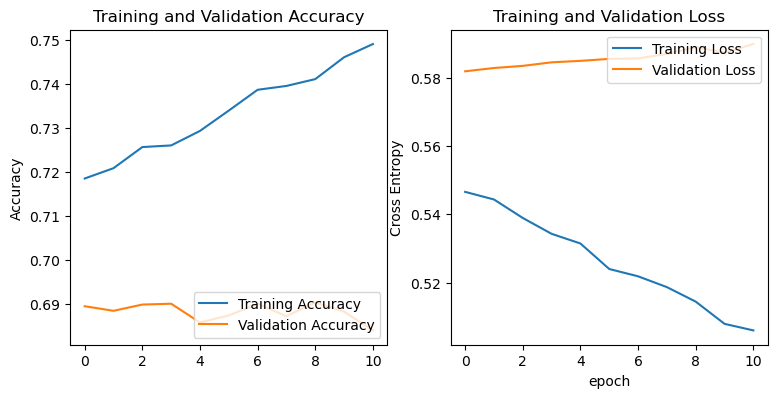

In [115]:
show_history_fit(history_tune)

165/165 [==============================] - 27s 150ms/step - loss: 0.5854 - accuracy: 0.6849
tf.Tensor([1 1 1 ... 1 0 0], shape=(10532,), dtype=int64)
tf.Tensor([0 1 1 ... 1 0 0], shape=(10532,), dtype=int32)
(10532,) (10532,)
Classification report: 
              precision    recall  f1-score   support

           0     0.6643    0.6400    0.6519      4858
           1     0.7011    0.7231    0.7120      5674

    accuracy                         0.6848     10532
   macro avg     0.6827    0.6815    0.6819     10532
weighted avg     0.6841    0.6848    0.6843     10532

ROC Curve:


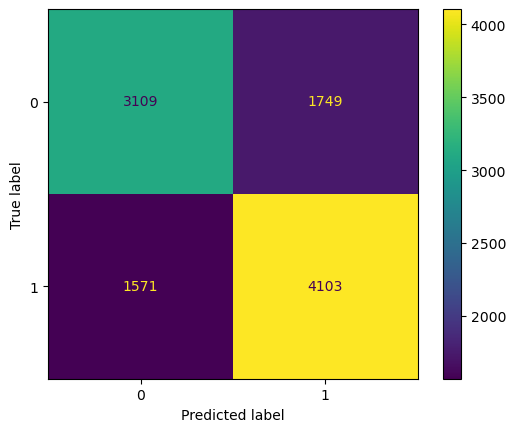

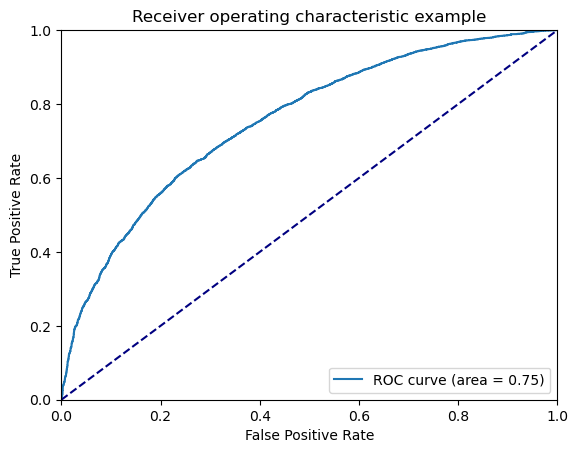

In [116]:
load_best_model_and_evaluate(path_model_tuned, test_ds)

#### Experiment Fine Tuning ---> Block 2

In [117]:
path_model = general_path_models+'/extra_binary_models_sc/pretrained_RESNET_no_tuning_512_dp_epoch_40_adam_1e-4.h5'
model_finetune = tf.keras.models.load_model(path_model)

In [118]:
model_finetune.trainable = True

base_model_resnet50 = model_finetune.get_layer("resnet50") # change the name looking at the summary IMPORTANT!
print("Number of layers in the base model: ", len(base_model_resnet50.layers))
base_model_resnet50.summary()

Number of layers in the base model:  175
Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_6 (InputLayer)           [(None, 250, 250, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 256, 256, 3)  0           ['input_6[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 125, 125, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                  

In [119]:
set_trainable = False
for layer in base_model_resnet50.layers:
    if layer.name == 'conv4_block1_1_conv': # è buona pratica indicare da dove si parte a sfreezare la rete
        set_trainable = True
    if set_trainable:
        if layer.name.endswith('bn'): # fine a che la variabile booleana è a False allora setto i layer non traininabili altrimenti li setto come trainabili
            layer.trainable = False
        else:
            layer.trainable = True
    else:
        layer.trainable = False

In [120]:
path_model_tuned = general_path_models+'/binary_models_sc/pretrained_RESNET_FINE_tuning_block2_epoch_40_adam_1e-4.h5'
history_tune, model_fitted_tuned = fit_model(model_finetune, train_ds, val_ds, path_model_tuned,40,10)

Epoch 1/40
626/627 [============================>.] - ETA: 0s - loss: 0.5471 - accuracy: 0.7193
Epoch 00001: val_loss improved from inf to 0.58264, saving model to ./binary_models_sc\pretrained_RESNET_FINE_tuning_block2_epoch_40_adam_1e-4.h5


c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\engine\functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


627/627 [==============================] - 124s 194ms/step - loss: 0.5471 - accuracy: 0.7194 - val_loss: 0.5826 - val_accuracy: 0.6903
Epoch 2/40
626/627 [============================>.] - ETA: 0s - loss: 0.5445 - accuracy: 0.7186
Epoch 00002: val_loss did not improve from 0.58264
627/627 [==============================] - 122s 193ms/step - loss: 0.5445 - accuracy: 0.7186 - val_loss: 0.5844 - val_accuracy: 0.6899
Epoch 3/40
626/627 [============================>.] - ETA: 0s - loss: 0.5408 - accuracy: 0.7217
Epoch 00003: val_loss did not improve from 0.58264
627/627 [==============================] - 122s 193ms/step - loss: 0.5407 - accuracy: 0.7217 - val_loss: 0.5839 - val_accuracy: 0.6885
Epoch 4/40
626/627 [============================>.] - ETA: 0s - loss: 0.5351 - accuracy: 0.7280
Epoch 00004: val_loss did not improve from 0.58264
627/627 [==============================] - 122s 192ms/step - loss: 0.5351 - accuracy: 0.7280 - val_loss: 0.5865 - val_accuracy: 0.6879
Epoch 5/40
626/627 

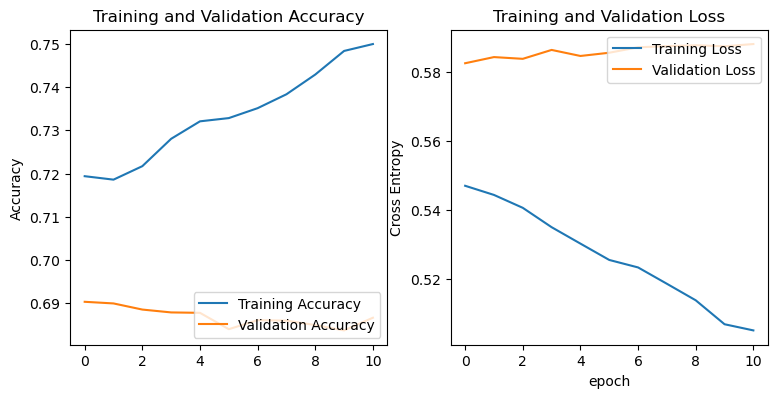

In [121]:
show_history_fit(history_tune)

165/165 [==============================] - 27s 149ms/step - loss: 0.5869 - accuracy: 0.6843
tf.Tensor([0 0 0 ... 0 0 1], shape=(10532,), dtype=int64)
tf.Tensor([0 1 0 ... 0 0 1], shape=(10532,), dtype=int32)
(10532,) (10532,)
Classification report: 
              precision    recall  f1-score   support

           0     0.6725    0.6163    0.6432      4858
           1     0.6934    0.7430    0.7174      5674

    accuracy                         0.6846     10532
   macro avg     0.6830    0.6797    0.6803     10532
weighted avg     0.6838    0.6846    0.6832     10532

ROC Curve:


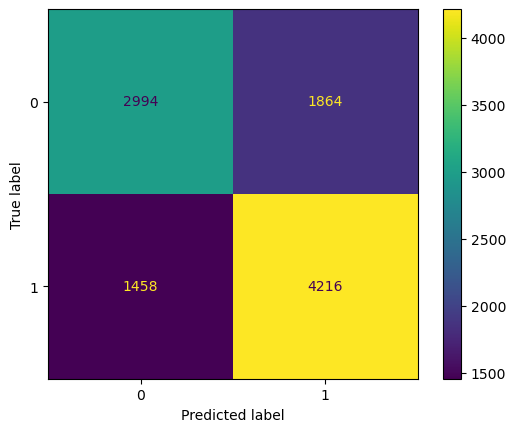

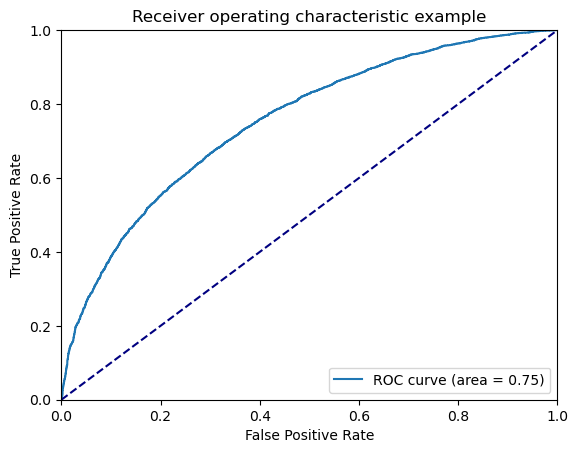

In [122]:
load_best_model_and_evaluate(path_model_tuned, test_ds)

#### Experiment Fine Tuning ---> Block 3

In [123]:
path_model = general_path_models+'/extra_binary_models_sc/pretrained_RESNET_no_tuning_512_dp_epoch_40_adam_1e-4.h5'
model_finetune = tf.keras.models.load_model(path_model)

In [124]:
model_finetune.trainable = True

base_model_resnet50 = model_finetune.get_layer("resnet50") # change the name looking at the summary IMPORTANT!
print("Number of layers in the base model: ", len(base_model_resnet50.layers))
base_model_resnet50.summary()

Number of layers in the base model:  175
Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_6 (InputLayer)           [(None, 250, 250, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 256, 256, 3)  0           ['input_6[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 125, 125, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                  

In [125]:
set_trainable = False
for layer in base_model_resnet50.layers:
    if layer.name == 'conv3_block1_1_conv': # è buona pratica indicare da dove si parte a sfreezare la rete
        set_trainable = True
    if set_trainable:
        if layer.name.endswith('bn'): # fine a che la variabile booleana è a False allora setto i layer non traininabili altrimenti li setto come trainabili
            layer.trainable = False
        else:
            layer.trainable = True
    else:
        layer.trainable = False

In [126]:
path_model_tuned = general_path_models+'/binary_models_sc/pretrained_RESNET_FINE_tuning_block3_epoch_40_adam_1e-4.h5'
history_tune, model_fitted_tuned = fit_model(model_finetune, train_ds, val_ds, path_model_tuned,40,10)

Epoch 1/40
626/627 [============================>.] - ETA: 0s - loss: 0.5476 - accuracy: 0.7168
Epoch 00001: val_loss improved from inf to 0.58332, saving model to ./binary_models_sc\pretrained_RESNET_FINE_tuning_block3_epoch_40_adam_1e-4.h5
627/627 [==============================] - 123s 194ms/step - loss: 0.5476 - accuracy: 0.7168 - val_loss: 0.5833 - val_accuracy: 0.6862


c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\engine\functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


Epoch 2/40
626/627 [============================>.] - ETA: 0s - loss: 0.5436 - accuracy: 0.7207
Epoch 00002: val_loss improved from 0.58332 to 0.58267, saving model to ./binary_models_sc\pretrained_RESNET_FINE_tuning_block3_epoch_40_adam_1e-4.h5
627/627 [==============================] - 122s 193ms/step - loss: 0.5436 - accuracy: 0.7207 - val_loss: 0.5827 - val_accuracy: 0.6873
Epoch 3/40
626/627 [============================>.] - ETA: 0s - loss: 0.5393 - accuracy: 0.7232
Epoch 00003: val_loss improved from 0.58267 to 0.58178, saving model to ./binary_models_sc\pretrained_RESNET_FINE_tuning_block3_epoch_40_adam_1e-4.h5
627/627 [==============================] - 122s 193ms/step - loss: 0.5392 - accuracy: 0.7232 - val_loss: 0.5818 - val_accuracy: 0.6904
Epoch 4/40
626/627 [============================>.] - ETA: 0s - loss: 0.5333 - accuracy: 0.7299
Epoch 00004: val_loss did not improve from 0.58178
627/627 [==============================] - 122s 192ms/step - loss: 0.5333 - accuracy: 0.729

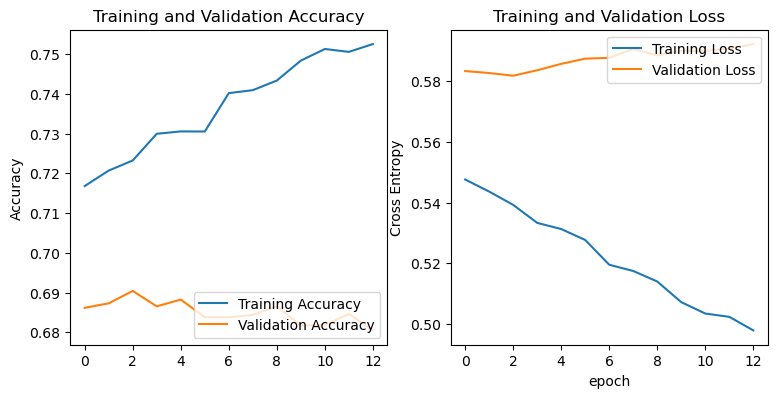

In [127]:
show_history_fit(history_tune)

165/165 [==============================] - 27s 150ms/step - loss: 0.5859 - accuracy: 0.6856
tf.Tensor([1 0 1 ... 1 0 1], shape=(10532,), dtype=int64)
tf.Tensor([1 0 1 ... 1 0 1], shape=(10532,), dtype=int32)
(10532,) (10532,)
Classification report: 
              precision    recall  f1-score   support

           0     0.6683    0.6330    0.6502      4858
           1     0.6994    0.7311    0.7149      5674

    accuracy                         0.6858     10532
   macro avg     0.6839    0.6820    0.6825     10532
weighted avg     0.6851    0.6858    0.6850     10532

ROC Curve:


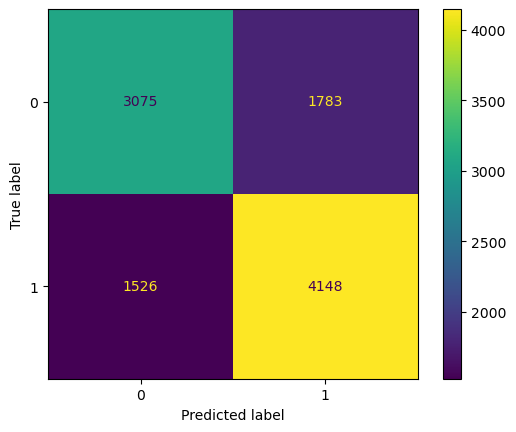

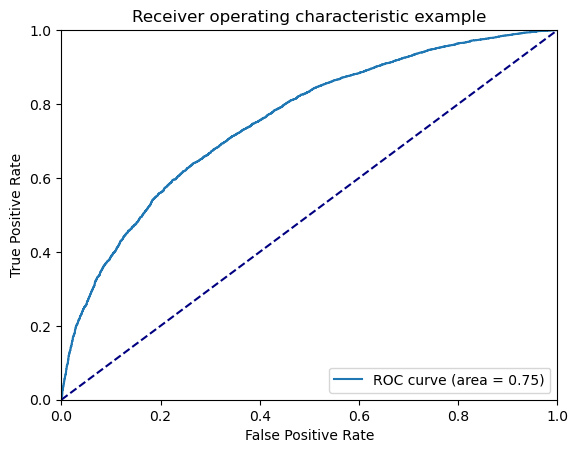

In [128]:
load_best_model_and_evaluate(path_model_tuned, test_ds)

#### Experiment Fine Tunining - EXTRA

##### Esperiemnto normale

In [11]:
LR = 0.0001
path_model = general_path_models+'/binary_models_sc/pretrained_RESNET_no_tuning_512_dp_regularization_epoch_40_adam_1e-4.h5'
model_finetune = tf.keras.models.load_model(path_model)
model_finetune.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.__operators__.getitem_1   (None, 250, 250, 3)      0         
 (SlicingOpLambda)                                               
                                                                 
 tf.nn.bias_add_1 (TFOpLambd  (None, 250, 250, 3)      0         
 a)                                                              
                                                                 
 resnet50 (Functional)       (None, 8, 8, 2048)        23587712  
                                                                 
 global_average_pooling2d_1   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                           

In [12]:
model_finetune.trainable = True

base_model_resnet50 = model_finetune.get_layer("resnet50") # change the name looking at the summary IMPORTANT!
print("Number of layers in the base model: ", len(base_model_resnet50.layers))
base_model_resnet50.summary()

Number of layers in the base model:  175
Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 250, 250, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 256, 256, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 125, 125, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                  

In [13]:
num_layer_trainable = 50

start_layer_to_train = len(base_model_resnet50.layers) - num_layer_trainable

for layer in base_model_resnet50.layers[:start_layer_to_train]:
    #if layer.name.endswith('bn'):
    layer.trainable = False
    #else:
    #    layer.trainable = True

for layer in base_model_resnet50.layers[start_layer_to_train:]:
    if layer.name.endswith('bn'):
        layer.trainable = False


model_finetune.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.__operators__.getitem_1   (None, 250, 250, 3)      0         
 (SlicingOpLambda)                                               
                                                                 
 tf.nn.bias_add_1 (TFOpLambd  (None, 250, 250, 3)      0         
 a)                                                              
                                                                 
 resnet50 (Functional)       (None, 8, 8, 2048)        23587712  
                                                                 
 global_average_pooling2d_1   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                           

In [14]:
compile_model(model_finetune, 'adam', LR)

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.__operators__.getitem_1   (None, 250, 250, 3)      0         
 (SlicingOpLambda)                                               
                                                                 
 tf.nn.bias_add_1 (TFOpLambd  (None, 250, 250, 3)      0         
 a)                                                              
                                                                 
 resnet50 (Functional)       (None, 8, 8, 2048)        23587712  
                                                                 
 global_average_pooling2d_1   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                           

In [15]:
path_model_tuned = general_path_models+'/binary_models_sc/pretrained_RESNET_FINE_tuning_512_dp_epoch_40_adam_1e-4.h5'
history_tune, model_fitted_tuned = fit_model(model_finetune, train_ds, val_ds, path_model_tuned,40,10)

Epoch 1/40
 46/627 [=>............................] - ETA: 2:06 - loss: 0.7615 - accuracy: 0.6804

KeyboardInterrupt: 

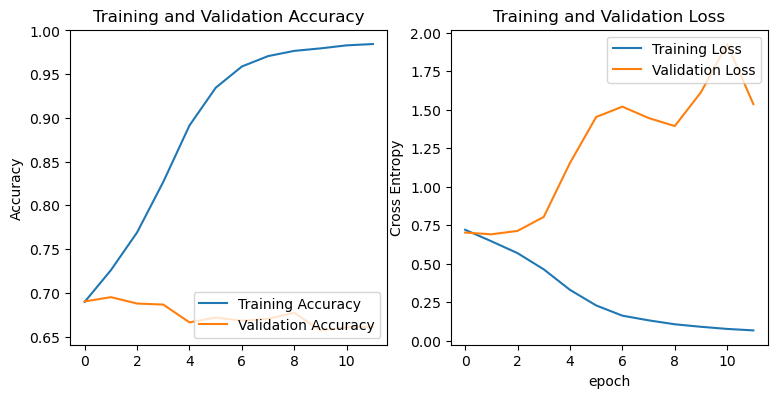

In [ ]:
show_history_fit(history_tune)

165/165 [==============================] - 28s 157ms/step - loss: 0.7024 - accuracy: 0.6868
tf.Tensor([1 1 1 ... 0 0 0], shape=(10532,), dtype=int64)
tf.Tensor([0 1 1 ... 1 0 0], shape=(10532,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.6707    0.6301    0.6498      4858
           1     0.6989    0.7351    0.7165      5674

    accuracy                         0.6867     10532
   macro avg     0.6848    0.6826    0.6831     10532
weighted avg     0.6859    0.6867    0.6857     10532



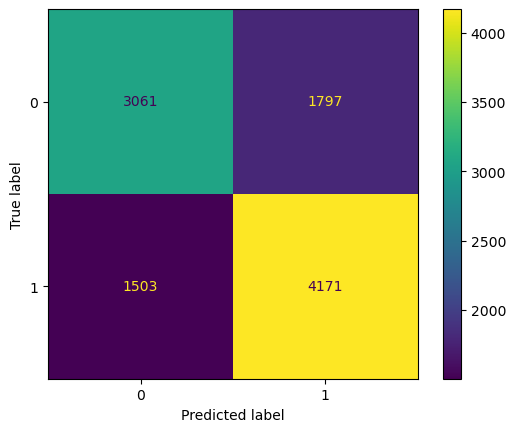

In [ ]:
load_best_model_and_evaluate(path_model_tuned, test_ds)

##### Experiment extra: train more layers

In [17]:
LR = 0.0001
path_model = general_path_models+'/binary_models_sc/pretrained_RESNET_no_tuning_512_dp_regularization_epoch_40_adam_1e-4.h5'
model_finetune = tf.keras.models.load_model(path_model)
model_finetune.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.__operators__.getitem_1   (None, 250, 250, 3)      0         
 (SlicingOpLambda)                                               
                                                                 
 tf.nn.bias_add_1 (TFOpLambd  (None, 250, 250, 3)      0         
 a)                                                              
                                                                 
 resnet50 (Functional)       (None, 8, 8, 2048)        23587712  
                                                                 
 global_average_pooling2d_1   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                           

In [18]:
model_finetune.trainable = True

base_model_resnet50 = model_finetune.get_layer("resnet50") # change the name looking at the summary IMPORTANT!
print("Number of layers in the base model: ", len(base_model_resnet50.layers))
base_model_resnet50.summary()

Number of layers in the base model:  175
Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 250, 250, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 256, 256, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 125, 125, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                  

In [19]:
num_layer_trainable = 35

start_layer_to_train = len(base_model_resnet50.layers) - num_layer_trainable

for layer in base_model_resnet50.layers[:start_layer_to_train]:
    #if layer.name.endswith('bn'):
    layer.trainable = False
    #else:
    #    layer.trainable = True

for layer in base_model_resnet50.layers[start_layer_to_train:]:
    if layer.name.endswith('bn'):
        layer.trainable = False


model_finetune.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.__operators__.getitem_1   (None, 250, 250, 3)      0         
 (SlicingOpLambda)                                               
                                                                 
 tf.nn.bias_add_1 (TFOpLambd  (None, 250, 250, 3)      0         
 a)                                                              
                                                                 
 resnet50 (Functional)       (None, 8, 8, 2048)        23587712  
                                                                 
 global_average_pooling2d_1   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                           

In [20]:
path_model_tuned = general_path_models+'/binary_models_sc/pretrained_RESNET_FINE_EXTRA_tuning_512_dp_epoch_40_adam_1e-4.h5'
history_tune, model_fitted_tuned = fit_model(model_finetune, train_ds, val_ds, path_model_tuned,40,5)

Epoch 1/40
 76/627 [==>...........................] - ETA: 1:43 - loss: 0.6019 - accuracy: 0.7882

KeyboardInterrupt: 

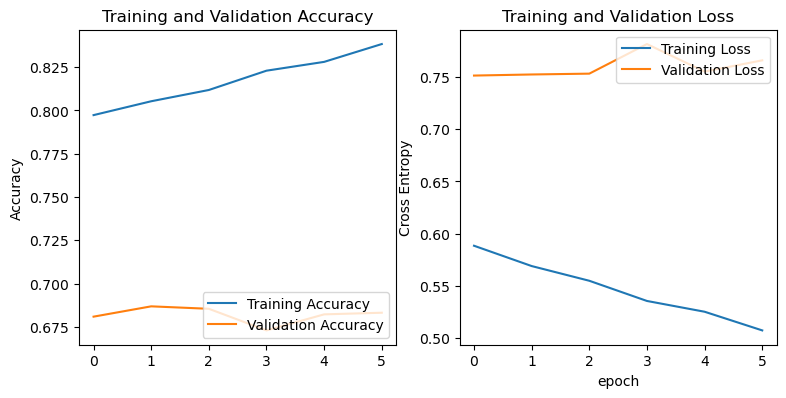

In [15]:
show_history_fit(history_tune)

165/165 [==============================] - 28s 157ms/step - loss: 0.7656 - accuracy: 0.6766
tf.Tensor([1 1 1 ... 0 0 0], shape=(10532,), dtype=int64)
tf.Tensor([0 1 1 ... 1 0 0], shape=(10532,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.6364    0.6966    0.6652      4858
           1     0.7174    0.6593    0.6871      5674

    accuracy                         0.6765     10532
   macro avg     0.6769    0.6780    0.6761     10532
weighted avg     0.6800    0.6765    0.6770     10532



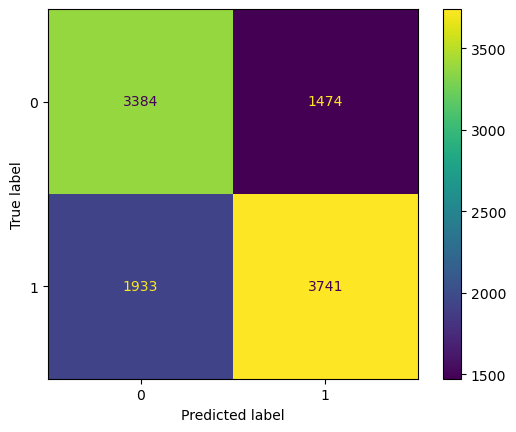

In [16]:
load_best_model_and_evaluate(path_model_tuned, test_ds)

#### Experiment Remove layers ---> Block 1

In [12]:
base_model = tf.keras.applications.resnet50.ResNet50(input_shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS),
        weights='imagenet',  # load the network pretrained on ImageNet1K
        include_top=False)
        
base_model.trainable = False

base_model.summary()

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 250, 250, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 256, 256, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 125, 125, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                           

In [15]:
#base_model_cutted = tf.keras.Sequential()
index = 0
for i, layer in enumerate(base_model.layers):
    if layer.name == "conv3_block4_out":
        index = i
        break

base_model_cutted = tf.keras.Model(base_model.input, base_model.layers[index].output, name='resnet50_cut')

base_model_cutted.summary()

Model: "resnet50_cut"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 250, 250, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 256, 256, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 125, 125, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                       

In [16]:
inputs = tf.keras.Input(shape=INPUT_SHAPE)
x = tf.keras.applications.resnet.preprocess_input(inputs)
x = base_model_cutted(x)
x = layers.GlobalAveragePooling2D()(x)

x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.3)(x)
outputs = layers.Dense(NUM_CLASSES, activation="softmax")(x)
model = tf.keras.Model(inputs, outputs)

In [17]:
LR = 0.0002
compile_model(model, 'adam', LR)

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.__operators__.getitem (S  (None, 250, 250, 3)      0         
 licingOpLambda)                                                 
                                                                 
 tf.nn.bias_add (TFOpLambda)  (None, 250, 250, 3)      0         
                                                                 
 resnet50_cut (Functional)   (None, 32, 32, 512)       1460096   
                                                                 
 global_average_pooling2d (G  (None, 512)              0         
 lobalAveragePooling2D)                                          
                                                                 
 dense (Dense)               (None, 512)               262656

In [18]:
path_model = general_path_models+'/binary_models_sc/pretrained_REMOVE_LAYER_conv4_resnet_no_tuning_512_dp_epoch_40_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model,40,10)

Epoch 1/40
627/627 [==============================] - ETA: 0s - loss: 0.6567 - accuracy: 0.6176
Epoch 00001: val_loss improved from inf to 0.63558, saving model to ./binary_models_sc\pretrained_REMOVE_LAYER_conv4_resnet_no_tuning_512_dp_epoch_40_adam_1e-4.h5
627/627 [==============================] - 110s 160ms/step - loss: 0.6567 - accuracy: 0.6176 - val_loss: 0.6356 - val_accuracy: 0.6362
Epoch 2/40


c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\engine\functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


626/627 [============================>.] - ETA: 0s - loss: 0.6363 - accuracy: 0.6371
Epoch 00002: val_loss improved from 0.63558 to 0.62628, saving model to ./binary_models_sc\pretrained_REMOVE_LAYER_conv4_resnet_no_tuning_512_dp_epoch_40_adam_1e-4.h5
627/627 [==============================] - 132s 210ms/step - loss: 0.6362 - accuracy: 0.6372 - val_loss: 0.6263 - val_accuracy: 0.6472
Epoch 3/40
626/627 [============================>.] - ETA: 0s - loss: 0.6309 - accuracy: 0.6410
Epoch 00003: val_loss improved from 0.62628 to 0.62293, saving model to ./binary_models_sc\pretrained_REMOVE_LAYER_conv4_resnet_no_tuning_512_dp_epoch_40_adam_1e-4.h5
627/627 [==============================] - 139s 219ms/step - loss: 0.6309 - accuracy: 0.6410 - val_loss: 0.6229 - val_accuracy: 0.6514
Epoch 4/40
626/627 [============================>.] - ETA: 0s - loss: 0.6273 - accuracy: 0.6455
Epoch 00004: val_loss did not improve from 0.62293
627/627 [==============================] - 99s 157ms/step - loss: 0.

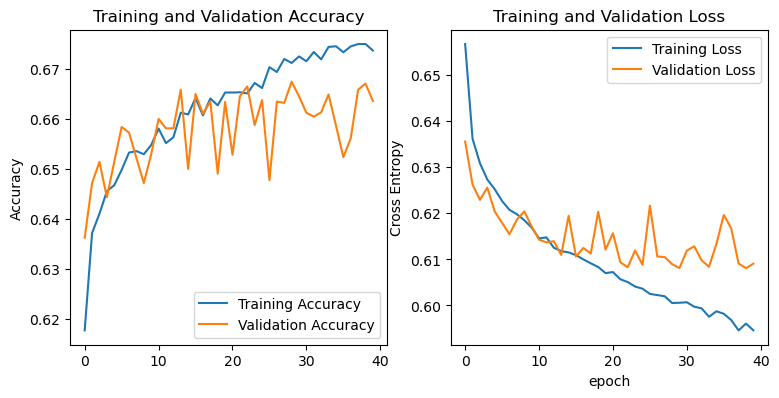

In [19]:
show_history_fit(history)

165/165 [==============================] - 21s 122ms/step - loss: 0.6144 - accuracy: 0.6570
tf.Tensor([0 1 1 ... 1 0 0], shape=(10532,), dtype=int64)
tf.Tensor([0 1 1 ... 1 0 0], shape=(10532,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.6216    0.6560    0.6384      4858
           1     0.6908    0.6581    0.6741      5674

    accuracy                         0.6571     10532
   macro avg     0.6562    0.6571    0.6562     10532
weighted avg     0.6589    0.6571    0.6576     10532



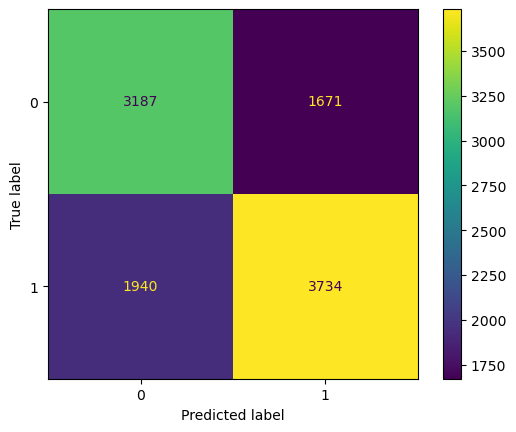

In [20]:
load_best_model_and_evaluate(path_model, test_ds)

#### Experiment Remove Layers ---> Block 2

In [129]:
base_model = tf.keras.applications.resnet50.ResNet50(input_shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS),
        weights='imagenet',  # load the network pretrained on ImageNet1K
        include_top=False)
        
base_model.trainable = False

base_model.summary()

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 250, 250, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 256, 256, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 125, 125, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                           

In [130]:
index = 0
for i, layer in enumerate(base_model.layers):
    if layer.name == "conv2_block3_out":
        index = i
        break

base_model_cutted = tf.keras.Model(base_model.input, base_model.layers[index].output, name='resnet50_cut')

base_model_cutted.summary()

Model: "resnet50_cut"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 250, 250, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 256, 256, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 125, 125, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                       

In [131]:
inputs = tf.keras.Input(shape=INPUT_SHAPE)
x = tf.keras.applications.resnet.preprocess_input(inputs)
x = base_model_cutted(x)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.3)(x)
outputs = layers.Dense(NUM_CLASSES, activation="softmax")(x)
model = tf.keras.Model(inputs, outputs)

In [132]:
LR = 0.0002
compile_model(model, 'adam', LR)

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.__operators__.getitem_2   (None, 250, 250, 3)      0         
 (SlicingOpLambda)                                               
                                                                 
 tf.nn.bias_add_2 (TFOpLambd  (None, 250, 250, 3)      0         
 a)                                                              
                                                                 
 resnet50_cut (Functional)   (None, 63, 63, 256)       229760    
                                                                 
 global_average_pooling2d (G  (None, 256)              0         
 lobalAveragePooling2D)                                          
                                                             

In [133]:
path_model = './_models_sc/pretraibinaryned_REMOVE_LAYER_conv2_resnet_no_tuning_512_dp_epoch_40_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model,40,10)

Epoch 1/40
626/627 [============================>.] - ETA: 0s - loss: 0.6768 - accuracy: 0.5922
Epoch 00001: val_loss improved from inf to 0.64163, saving model to ./_models_sc\pretraibinaryned_REMOVE_LAYER_conv2_resnet_no_tuning_512_dp_epoch_40_adam_1e-4.h5
627/627 [==============================] - 96s 150ms/step - loss: 0.6768 - accuracy: 0.5922 - val_loss: 0.6416 - val_accuracy: 0.6266
Epoch 2/40


c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\engine\functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


626/627 [============================>.] - ETA: 0s - loss: 0.6489 - accuracy: 0.6201
Epoch 00002: val_loss improved from 0.64163 to 0.63947, saving model to ./_models_sc\pretraibinaryned_REMOVE_LAYER_conv2_resnet_no_tuning_512_dp_epoch_40_adam_1e-4.h5
627/627 [==============================] - 95s 150ms/step - loss: 0.6489 - accuracy: 0.6202 - val_loss: 0.6395 - val_accuracy: 0.6300
Epoch 3/40
626/627 [============================>.] - ETA: 0s - loss: 0.6466 - accuracy: 0.6220
Epoch 00003: val_loss improved from 0.63947 to 0.63795, saving model to ./_models_sc\pretraibinaryned_REMOVE_LAYER_conv2_resnet_no_tuning_512_dp_epoch_40_adam_1e-4.h5
627/627 [==============================] - 97s 152ms/step - loss: 0.6465 - accuracy: 0.6220 - val_loss: 0.6380 - val_accuracy: 0.6294
Epoch 4/40
626/627 [============================>.] - ETA: 0s - loss: 0.6420 - accuracy: 0.6259
Epoch 00004: val_loss did not improve from 0.63795
627/627 [==============================] - 94s 149ms/step - loss: 0.64

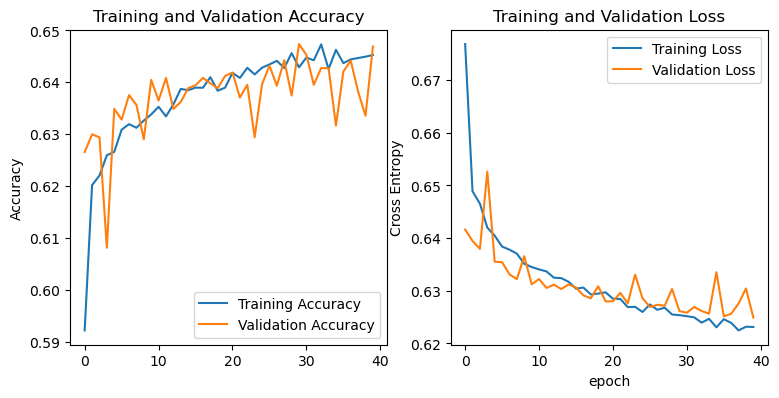

In [134]:
show_history_fit(history)

165/165 [==============================] - 20s 114ms/step - loss: 0.6268 - accuracy: 0.6388
tf.Tensor([1 1 1 ... 1 0 1], shape=(10532,), dtype=int64)
tf.Tensor([1 1 1 ... 1 0 1], shape=(10532,), dtype=int32)
(10532,) (10532,)
Classification report: 
              precision    recall  f1-score   support

           0     0.6085    0.6083    0.6084      4858
           1     0.6647    0.6650    0.6648      5674

    accuracy                         0.6388     10532
   macro avg     0.6366    0.6366    0.6366     10532
weighted avg     0.6388    0.6388    0.6388     10532

ROC Curve:


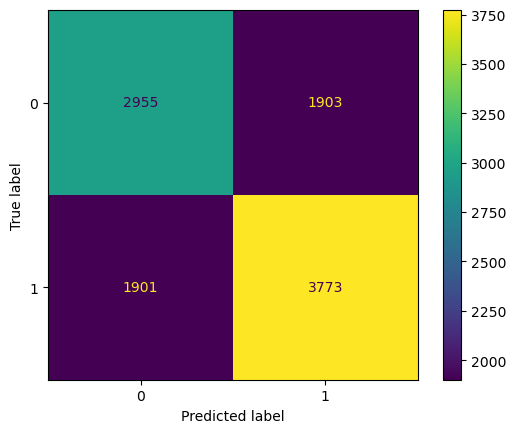

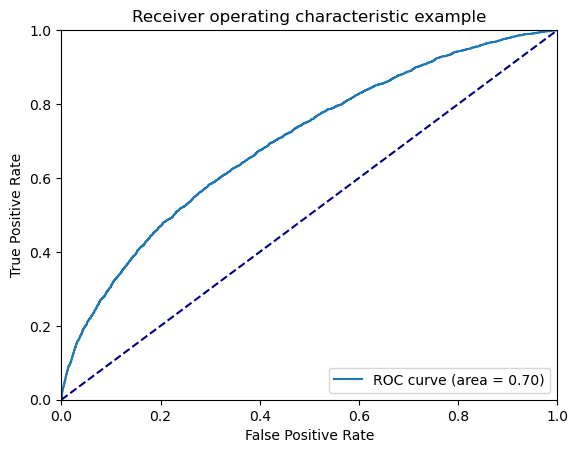

In [135]:
load_best_model_and_evaluate(path_model, test_ds)

### MobilNet 

#### Experiment Features extraction -- Add one layer

In [11]:
base_model = tf.keras.applications.mobilenet_v2.MobileNetV2(input_shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS),
        weights='imagenet',  # load the network pretrained on ImageNet1K
        include_top=False)
        
base_model.trainable = False

base_model.summary()

Model: "mobilenetv2_1.00_224"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 250, 250, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 125, 125, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 125, 125, 32  128         ['Conv1[0][0]']                  
                                )                                              

In [13]:
inputs = tf.keras.Input(shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS))
x = tf.keras.applications.mobilenet_v2.preprocess_input(inputs)
x = base_model(x)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.3)(x)
outputs = layers.Dense(NUM_CLASSES, activation="softmax")(x)
model = tf.keras.Model(inputs, outputs)

In [14]:
LR = 0.0001
compile_model(model, 'adam', LR)

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 sequential (Sequential)     (None, 250, 250, 3)       0         
                                                                 
 tf.math.truediv (TFOpLambda  (None, 250, 250, 3)      0         
 )                                                               
                                                                 
 tf.math.subtract (TFOpLambd  (None, 250, 250, 3)      0         
 a)                                                              
                                                                 
 mobilenetv2_1.00_224 (Funct  (None, 8, 8, 1280)       2257984   
 ional)                                                          
                                                             

In [15]:
path_model = general_path_models+'/binary_models_sc/pretrained_MOBILENETV2_no_tuning_512_dp_regularization_epoch_40_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model,40,5)

Epoch 1/40
627/627 [==============================] - ETA: 0s - loss: 0.6550 - accuracy: 0.6296
Epoch 00001: val_loss improved from inf to 0.61699, saving model to ./binary_models_sc\pretrained_MOBILENETV2_no_tuning_512_dp_regularization_epoch_40_adam_1e-4.h5


c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\engine\functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


627/627 [==============================] - 131s 198ms/step - loss: 0.6550 - accuracy: 0.6296 - val_loss: 0.6170 - val_accuracy: 0.6588
Epoch 2/40
626/627 [============================>.] - ETA: 0s - loss: 0.6168 - accuracy: 0.6579
Epoch 00002: val_loss improved from 0.61699 to 0.60593, saving model to ./binary_models_sc\pretrained_MOBILENETV2_no_tuning_512_dp_regularization_epoch_40_adam_1e-4.h5
627/627 [==============================] - 182s 287ms/step - loss: 0.6168 - accuracy: 0.6579 - val_loss: 0.6059 - val_accuracy: 0.6653
Epoch 3/40
626/627 [============================>.] - ETA: 0s - loss: 0.6064 - accuracy: 0.6672
Epoch 00003: val_loss improved from 0.60593 to 0.60478, saving model to ./binary_models_sc\pretrained_MOBILENETV2_no_tuning_512_dp_regularization_epoch_40_adam_1e-4.h5
627/627 [==============================] - 129s 203ms/step - loss: 0.6064 - accuracy: 0.6672 - val_loss: 0.6048 - val_accuracy: 0.6681
Epoch 4/40
626/627 [============================>.] - ETA: 0s - los

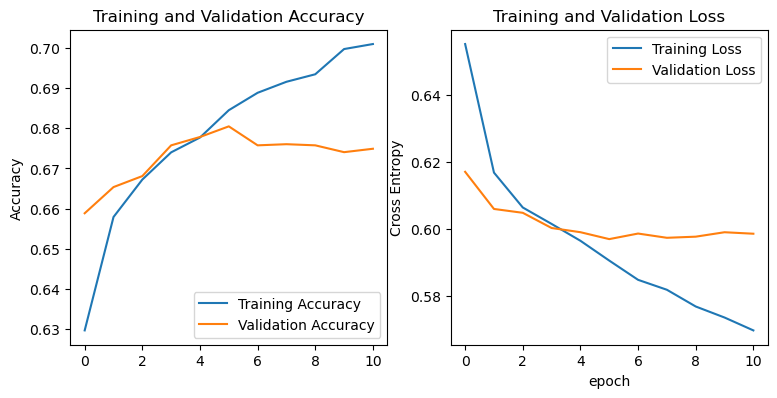

In [16]:
show_history_fit(history)

165/165 [==============================] - 20s 109ms/step - loss: 0.6000 - accuracy: 0.6747
tf.Tensor([0 1 1 ... 1 0 0], shape=(10532,), dtype=int64)
tf.Tensor([0 1 1 ... 1 0 0], shape=(10532,), dtype=int32)
(10532,) (10532,)
Classification report: 
              precision    recall  f1-score   support

           0     0.6661    0.5914    0.6265      4858
           1     0.6808    0.7462    0.7120      5674

    accuracy                         0.6748     10532
   macro avg     0.6735    0.6688    0.6693     10532
weighted avg     0.6740    0.6748    0.6726     10532

ROC Curve:


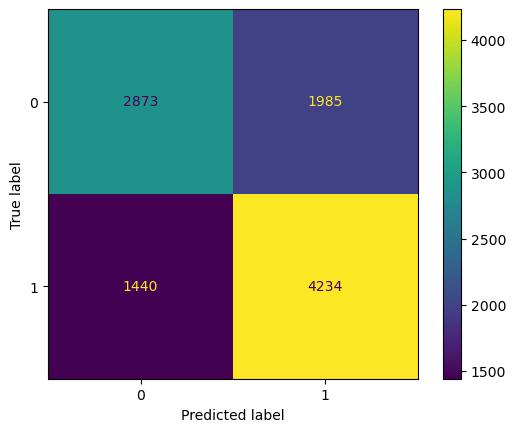

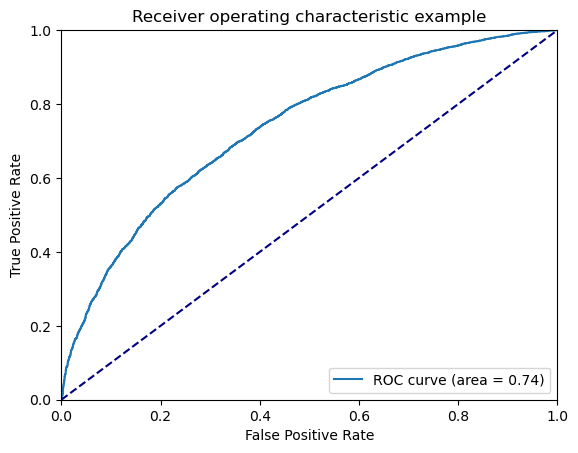

In [51]:
path_model = general_path_models+'/binary_models_sc/pretrained_MOBILENETV2_no_tuning_512_dp_regularization_epoch_40_adam_1e-4.h5'
load_best_model_and_evaluate(path_model, test_ds)

#### Experiment Features Extraction -- Add another dropout

In [51]:
base_model = tf.keras.applications.mobilenet_v2.MobileNetV2(input_shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS),
        weights='imagenet',  # load the network pretrained on ImageNet1K
        include_top=False)
        
base_model.trainable = False

base_model.summary()

Model: "mobilenetv2_1.00_224"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_8 (InputLayer)           [(None, 250, 250, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 125, 125, 32  864         ['input_8[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 125, 125, 32  128         ['Conv1[0][0]']                  
                                )                                              

In [52]:
inputs = tf.keras.Input(shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS))
x = tf.keras.applications.mobilenet_v2.preprocess_input(inputs)
x = base_model(x)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.4)(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.3)(x)
outputs = layers.Dense(NUM_CLASSES, activation="softmax")(x)
model = tf.keras.Model(inputs, outputs)

In [53]:
LR = 0.0001
compile_model(model, 'adam', LR)

Model: "model_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_9 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.math.truediv (TFOpLambda  (None, 250, 250, 3)      0         
 )                                                               
                                                                 
 tf.math.subtract (TFOpLambd  (None, 250, 250, 3)      0         
 a)                                                              
                                                                 
 mobilenetv2_1.00_224 (Funct  (None, 8, 8, 1280)       2257984   
 ional)                                                          
                                                                 
 global_average_pooling2d_5   (None, 1280)             0         
 (GlobalAveragePooling2D)                                  

In [54]:
path_model = general_path_models+'/extra_binary_models_sc/pretrained_MOBILENETV2_no_tuning_512_dp_regularization_epoch_40_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model,50,15)

Epoch 1/50
627/627 [==============================] - ETA: 0s - loss: 0.7006 - accuracy: 0.6122
Epoch 00001: val_loss improved from inf to 0.60894, saving model to ./extra_binary_models_sc\pretrained_MOBILENETV2_no_tuning_512_dp_regularization_epoch_40_adam_1e-4.h5
627/627 [==============================] - 99s 153ms/step - loss: 0.7006 - accuracy: 0.6122 - val_loss: 0.6089 - val_accuracy: 0.6637
Epoch 2/50


c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\engine\functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


626/627 [============================>.] - ETA: 0s - loss: 0.6314 - accuracy: 0.6455
Epoch 00002: val_loss improved from 0.60894 to 0.60744, saving model to ./extra_binary_models_sc\pretrained_MOBILENETV2_no_tuning_512_dp_regularization_epoch_40_adam_1e-4.h5
627/627 [==============================] - 96s 152ms/step - loss: 0.6315 - accuracy: 0.6455 - val_loss: 0.6074 - val_accuracy: 0.6740
Epoch 3/50
626/627 [============================>.] - ETA: 0s - loss: 0.6187 - accuracy: 0.6564
Epoch 00003: val_loss improved from 0.60744 to 0.60544, saving model to ./extra_binary_models_sc\pretrained_MOBILENETV2_no_tuning_512_dp_regularization_epoch_40_adam_1e-4.h5
627/627 [==============================] - 96s 152ms/step - loss: 0.6188 - accuracy: 0.6563 - val_loss: 0.6054 - val_accuracy: 0.6765
Epoch 4/50
626/627 [============================>.] - ETA: 0s - loss: 0.6118 - accuracy: 0.6625
Epoch 00004: val_loss improved from 0.60544 to 0.60318, saving model to ./extra_binary_models_sc\pretrained

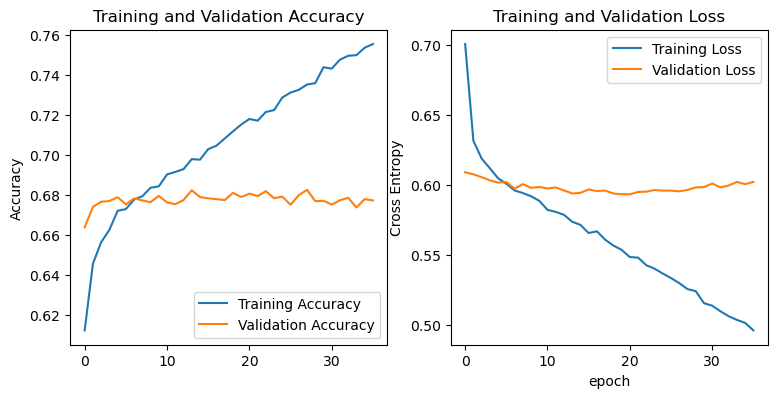

In [55]:
show_history_fit(history)

165/165 [==============================] - 23s 130ms/step - loss: 0.5913 - accuracy: 0.6814
tf.Tensor([0 0 0 ... 1 0 1], shape=(10532,), dtype=int64)
tf.Tensor([0 1 0 ... 0 0 1], shape=(10532,), dtype=int32)
(10532,) (10532,)
Classification report: 
              precision    recall  f1-score   support

           0     0.6547    0.6552    0.6549      4858
           1     0.7046    0.7041    0.7043      5674

    accuracy                         0.6815     10532
   macro avg     0.6796    0.6796    0.6796     10532
weighted avg     0.6816    0.6815    0.6816     10532

ROC Curve:


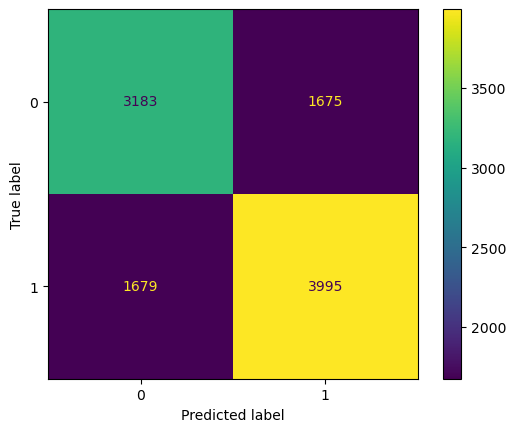

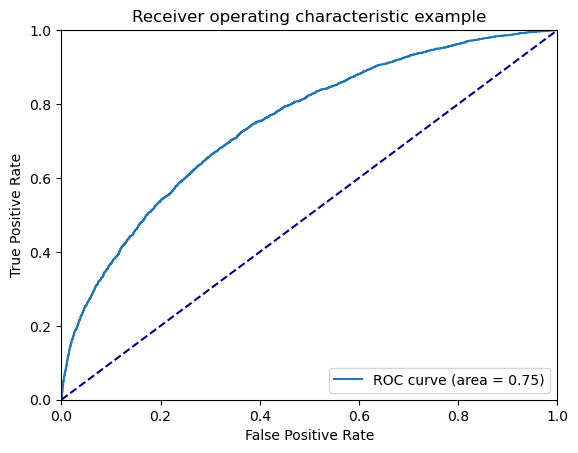

In [52]:
path_model = general_path_models+'/extra_binary_models_sc/pretrained_MOBILENETV2_no_tuning_512_dp_regularization_epoch_40_adam_1e-4.h5'
load_best_model_and_evaluate(path_model, test_ds)

#### Experiment Features Extractio -- Add other layers

In [23]:
base_model = tf.keras.applications.mobilenet_v2.MobileNetV2(input_shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS),
        weights='imagenet',  # load the network pretrained on ImageNet1K
        include_top=False)
        
base_model.trainable = False

In [24]:
inputs = tf.keras.Input(shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS))
x = tf.keras.applications.mobilenet_v2.preprocess_input(inputs)
x = base_model(x)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.4)(x)
x = layers.Dense(1024, activation='relu')(x)
x = layers.Dropout(0.4)(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.4)(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dense(256, activation='relu')(x)
outputs = layers.Dense(NUM_CLASSES, activation="softmax")(x)
model = tf.keras.Model(inputs, outputs)

In [25]:
LR = 0.0001
compile_model(model, 'adam', LR)

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 240, 240, 3)]     0         
                                                                 
 tf.math.truediv (TFOpLambda  (None, 240, 240, 3)      0         
 )                                                               
                                                                 
 tf.math.subtract (TFOpLambd  (None, 240, 240, 3)      0         
 a)                                                              
                                                                 
 mobilenetv2_1.00_224 (Funct  (None, 8, 8, 1280)       2257984   
 ional)                                                          
                                                                 
 global_average_pooling2d_2   (None, 1280)             0         
 (GlobalAveragePooling2D)                                  

In [26]:
path_model = general_path_models+'/binary_models_sc/extra_pretrained_MOBILENETV2_no_tuning_OTHER_LAYERS_dp_epoch_40_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model,40,10)

Epoch 1/40
627/627 [==============================] - ETA: 0s - loss: 0.6629 - accuracy: 0.6027
Epoch 00001: val_loss improved from inf to 0.61426, saving model to ./binary_models_sc\extra_pretrained_MOBILENETV2_no_tuning_OTHER_LAYERS_dp_epoch_40_adam_1e-4.h5


c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\engine\functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


627/627 [==============================] - 102s 157ms/step - loss: 0.6629 - accuracy: 0.6027 - val_loss: 0.6143 - val_accuracy: 0.6593
Epoch 2/40
626/627 [============================>.] - ETA: 0s - loss: 0.6293 - accuracy: 0.6471
Epoch 00002: val_loss improved from 0.61426 to 0.60559, saving model to ./binary_models_sc\extra_pretrained_MOBILENETV2_no_tuning_OTHER_LAYERS_dp_epoch_40_adam_1e-4.h5
627/627 [==============================] - 102s 161ms/step - loss: 0.6293 - accuracy: 0.6471 - val_loss: 0.6056 - val_accuracy: 0.6749
Epoch 3/40
626/627 [============================>.] - ETA: 0s - loss: 0.6219 - accuracy: 0.6532
Epoch 00003: val_loss improved from 0.60559 to 0.60086, saving model to ./binary_models_sc\extra_pretrained_MOBILENETV2_no_tuning_OTHER_LAYERS_dp_epoch_40_adam_1e-4.h5
627/627 [==============================] - 99s 156ms/step - loss: 0.6219 - accuracy: 0.6532 - val_loss: 0.6009 - val_accuracy: 0.6755
Epoch 4/40
626/627 [============================>.] - ETA: 0s - loss

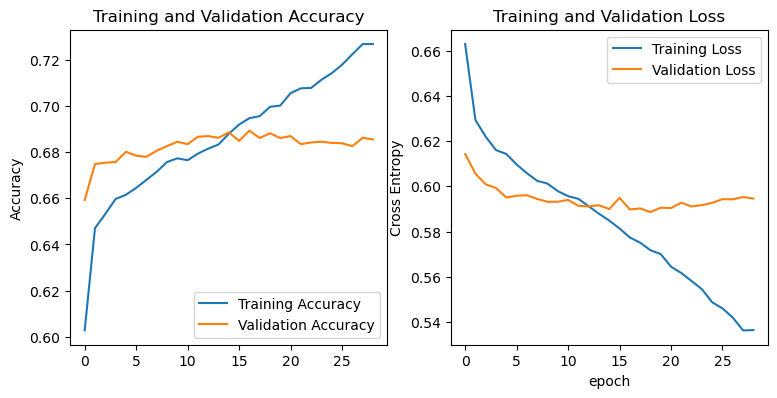

In [27]:
show_history_fit(history)

165/165 [==============================] - 20s 105ms/step - loss: 0.5927 - accuracy: 0.6798
tf.Tensor([1 0 1 ... 1 0 0], shape=(10532,), dtype=int64)
tf.Tensor([1 0 1 ... 1 0 1], shape=(10532,), dtype=int32)
(10532,) (10532,)
Classification report: 
              precision    recall  f1-score   support

           0     0.6594    0.6313    0.6451      4858
           1     0.6955    0.7208    0.7079      5674

    accuracy                         0.6795     10532
   macro avg     0.6774    0.6761    0.6765     10532
weighted avg     0.6788    0.6795    0.6789     10532

ROC Curve:


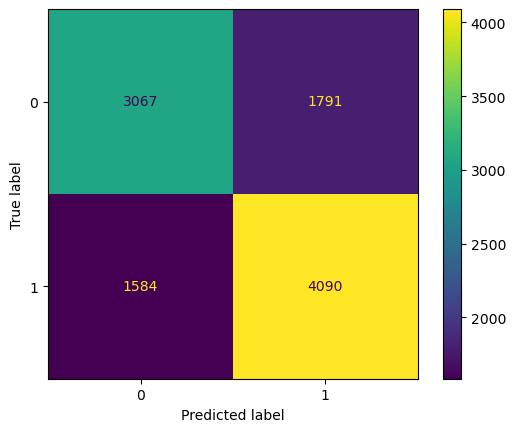

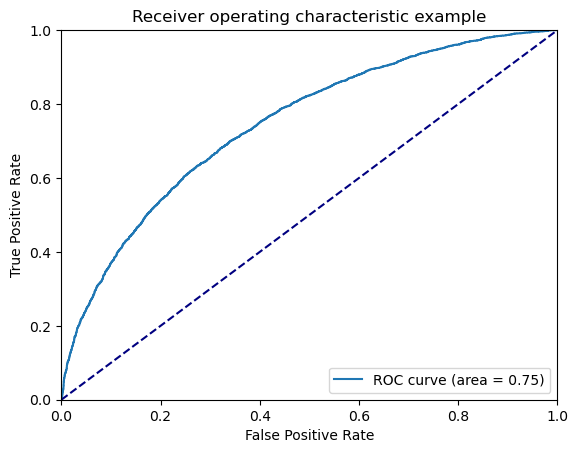

In [39]:
path_model = general_path_models+'/binary_models_sc/extra_pretrained_MOBILENETV2_no_tuning_OTHER_LAYERS_dp_epoch_40_adam_1e-4.h5'
load_best_model_and_evaluate(path_model, test_ds)

#### Experiment Fine Tuning --> Block 1

In [146]:
path_model = general_path_models+'/extra_binary_models_sc/pretrained_MOBILENETV2_no_tuning_512_dp_regularization_epoch_40_adam_1e-4.h5'#general_path_models+'/extra_binary_models_sc/pretrained_MOBILENETV2_no_tuning_512_dp_regularization_epoch_40_adam_1e-4.h5'
model_finetune = tf.keras.models.load_model(path_model)
model_finetune.summary()

Model: "model_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_9 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.math.truediv (TFOpLambda  (None, 250, 250, 3)      0         
 )                                                               
                                                                 
 tf.math.subtract (TFOpLambd  (None, 250, 250, 3)      0         
 a)                                                              
                                                                 
 mobilenetv2_1.00_224 (Funct  (None, 8, 8, 1280)       2257984   
 ional)                                                          
                                                                 
 global_average_pooling2d_5   (None, 1280)             0         
 (GlobalAveragePooling2D)                                  

In [147]:
model_finetune.trainable = True

base_model_mobilenet = model_finetune.get_layer("mobilenetv2_1.00_224") # change the name looking at the summary IMPORTANT!
print("Number of layers in the base model: ", len(base_model_mobilenet.layers))
base_model_mobilenet.summary()

Number of layers in the base model:  154
Model: "mobilenetv2_1.00_224"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_8 (InputLayer)           [(None, 250, 250, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 125, 125, 32  864         ['input_8[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 125, 125, 32  128         ['Conv1[0][0]']                  
                                )     

In [148]:
set_trainable = False
for layer in base_model_mobilenet.layers:
    if layer.name == ' block_15_expand': # è buona pratica indicare da dove si parte a sfreezare la rete
        set_trainable = True
    if set_trainable:
        if layer.name.endswith('BN'): # fine a che la variabile booleana è a False allora setto i layer non traininabili altrimenti li setto come trainabili
            layer.trainable = False
        else:
            layer.trainable = True
    else:
        layer.trainable = False

model_finetune.summary()

Model: "model_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_9 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.math.truediv (TFOpLambda  (None, 250, 250, 3)      0         
 )                                                               
                                                                 
 tf.math.subtract (TFOpLambd  (None, 250, 250, 3)      0         
 a)                                                              
                                                                 
 mobilenetv2_1.00_224 (Funct  (None, 8, 8, 1280)       2257984   
 ional)                                                          
                                                                 
 global_average_pooling2d_5   (None, 1280)             0         
 (GlobalAveragePooling2D)                                  

In [149]:
path_model_tuned = general_path_models+'/binary_models_sc/pretrained_MOBILNETV2_FINE_tuning_block1_dp_epoch_40_adam_1e-4.h5'
history_tune, model_fitted_tuned = fit_model(model_finetune, train_ds, val_ds, path_model_tuned,40,10)

Epoch 1/40
627/627 [==============================] - ETA: 0s - loss: 0.5462 - accuracy: 0.7179
Epoch 00001: val_loss improved from inf to 0.59484, saving model to ./binary_models_sc\pretrained_MOBILNETV2_FINE_tuning_block1_dp_epoch_40_adam_1e-4.h5
627/627 [==============================] - 98s 153ms/step - loss: 0.5462 - accuracy: 0.7179 - val_loss: 0.5948 - val_accuracy: 0.6800
Epoch 2/40


c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\engine\functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


626/627 [============================>.] - ETA: 0s - loss: 0.5431 - accuracy: 0.7215
Epoch 00002: val_loss improved from 0.59484 to 0.59477, saving model to ./binary_models_sc\pretrained_MOBILNETV2_FINE_tuning_block1_dp_epoch_40_adam_1e-4.h5
627/627 [==============================] - 122s 193ms/step - loss: 0.5431 - accuracy: 0.7215 - val_loss: 0.5948 - val_accuracy: 0.6794
Epoch 3/40
626/627 [============================>.] - ETA: 0s - loss: 0.5396 - accuracy: 0.7252
Epoch 00003: val_loss improved from 0.59477 to 0.59350, saving model to ./binary_models_sc\pretrained_MOBILNETV2_FINE_tuning_block1_dp_epoch_40_adam_1e-4.h5
627/627 [==============================] - 125s 198ms/step - loss: 0.5396 - accuracy: 0.7251 - val_loss: 0.5935 - val_accuracy: 0.6823
Epoch 4/40
626/627 [============================>.] - ETA: 0s - loss: 0.5342 - accuracy: 0.7284
Epoch 00004: val_loss did not improve from 0.59350
627/627 [==============================] - 124s 195ms/step - loss: 0.5342 - accuracy: 0.

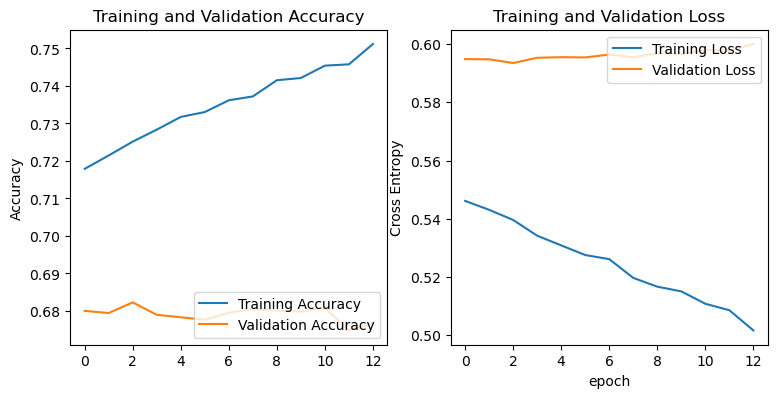

In [150]:
show_history_fit(history_tune)

165/165 [==============================] - 26s 145ms/step - loss: 0.5928 - accuracy: 0.6751
tf.Tensor([0 1 1 ... 1 0 0], shape=(10532,), dtype=int64)
tf.Tensor([0 1 1 ... 1 0 0], shape=(10532,), dtype=int32)
(10532,) (10532,)
Classification report: 
              precision    recall  f1-score   support

           0     0.6520    0.6332    0.6424      4858
           1     0.6935    0.7106    0.7019      5674

    accuracy                         0.6749     10532
   macro avg     0.6727    0.6719    0.6722     10532
weighted avg     0.6743    0.6749    0.6745     10532

ROC Curve:


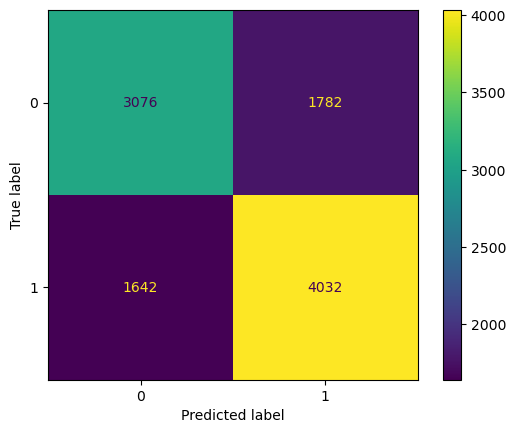

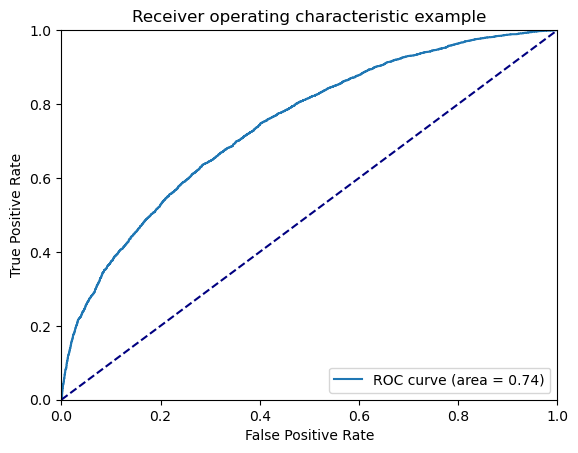

In [151]:
load_best_model_and_evaluate(path_model_tuned, test_ds)

#### Experiment Fine Tuning --> Block 2

In [152]:
path_model = general_path_models+'/extra_binary_models_sc/pretrained_MOBILENETV2_no_tuning_512_dp_regularization_epoch_40_adam_1e-4.h5'
model_finetune = tf.keras.models.load_model(path_model)
model_finetune.summary()

Model: "model_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_9 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.math.truediv (TFOpLambda  (None, 250, 250, 3)      0         
 )                                                               
                                                                 
 tf.math.subtract (TFOpLambd  (None, 250, 250, 3)      0         
 a)                                                              
                                                                 
 mobilenetv2_1.00_224 (Funct  (None, 8, 8, 1280)       2257984   
 ional)                                                          
                                                                 
 global_average_pooling2d_5   (None, 1280)             0         
 (GlobalAveragePooling2D)                                  

In [153]:
model_finetune.trainable = True

base_model_mobilenet = model_finetune.get_layer("mobilenetv2_1.00_224") # change the name looking at the summary IMPORTANT!
print("Number of layers in the base model: ", len(base_model_mobilenet.layers))
base_model_mobilenet.summary()

Number of layers in the base model:  154
Model: "mobilenetv2_1.00_224"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_8 (InputLayer)           [(None, 250, 250, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 125, 125, 32  864         ['input_8[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 125, 125, 32  128         ['Conv1[0][0]']                  
                                )     

In [154]:
set_trainable = False
for layer in base_model_mobilenet.layers:
    if layer.name == ' block_13_expand': # è buona pratica indicare da dove si parte a sfreezare la rete
        set_trainable = True
    if set_trainable:
        if layer.name.endswith('BN'): # fine a che la variabile booleana è a False allora setto i layer non traininabili altrimenti li setto come trainabili
            layer.trainable = False
        else:
            layer.trainable = True
    else:
        layer.trainable = False

model_finetune.summary()

Model: "model_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_9 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.math.truediv (TFOpLambda  (None, 250, 250, 3)      0         
 )                                                               
                                                                 
 tf.math.subtract (TFOpLambd  (None, 250, 250, 3)      0         
 a)                                                              
                                                                 
 mobilenetv2_1.00_224 (Funct  (None, 8, 8, 1280)       2257984   
 ional)                                                          
                                                                 
 global_average_pooling2d_5   (None, 1280)             0         
 (GlobalAveragePooling2D)                                  

In [155]:
path_model_tuned = './majority_multiclass_models_sc/pretrained_MOBILNETV2_FINE_tuning_block2_dp_epoch_40_adam_1e-4.h5'
history_tune, model_fitted_tuned = fit_model(model_finetune, train_ds, val_ds, path_model_tuned,40,10)

Epoch 1/40
626/627 [============================>.] - ETA: 0s - loss: 0.5461 - accuracy: 0.7227
Epoch 00001: val_loss improved from inf to 0.59509, saving model to ./majority_multiclass_models_sc\pretrained_MOBILNETV2_FINE_tuning_block2_dp_epoch_40_adam_1e-4.h5
627/627 [==============================] - 126s 195ms/step - loss: 0.5460 - accuracy: 0.7228 - val_loss: 0.5951 - val_accuracy: 0.6802
Epoch 2/40


c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\engine\functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


626/627 [============================>.] - ETA: 0s - loss: 0.5429 - accuracy: 0.7217
Epoch 00002: val_loss improved from 0.59509 to 0.59365, saving model to ./majority_multiclass_models_sc\pretrained_MOBILNETV2_FINE_tuning_block2_dp_epoch_40_adam_1e-4.h5
627/627 [==============================] - 123s 193ms/step - loss: 0.5428 - accuracy: 0.7218 - val_loss: 0.5936 - val_accuracy: 0.6814
Epoch 3/40
626/627 [============================>.] - ETA: 0s - loss: 0.5398 - accuracy: 0.7263
Epoch 00003: val_loss did not improve from 0.59365
627/627 [==============================] - 123s 194ms/step - loss: 0.5397 - accuracy: 0.7263 - val_loss: 0.5940 - val_accuracy: 0.6809
Epoch 4/40
626/627 [============================>.] - ETA: 0s - loss: 0.5361 - accuracy: 0.7244
Epoch 00004: val_loss did not improve from 0.59365
627/627 [==============================] - 122s 193ms/step - loss: 0.5361 - accuracy: 0.7244 - val_loss: 0.5942 - val_accuracy: 0.6813
Epoch 5/40
626/627 [==========================

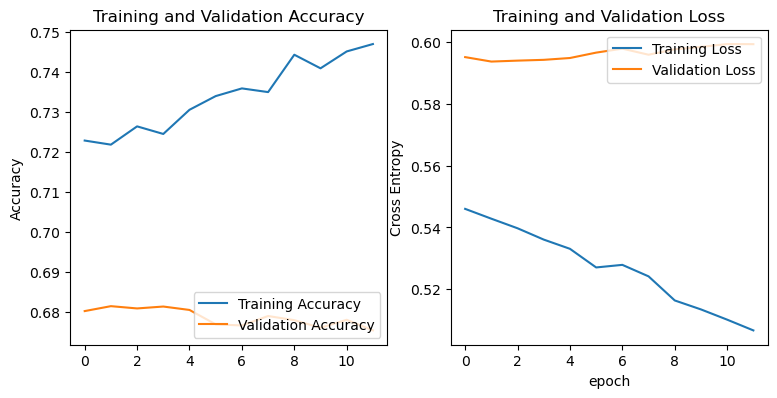

In [156]:
show_history_fit(history_tune)

165/165 [==============================] - 26s 146ms/step - loss: 0.5922 - accuracy: 0.6814
tf.Tensor([0 0 0 ... 1 0 1], shape=(10532,), dtype=int64)
tf.Tensor([0 1 0 ... 0 0 1], shape=(10532,), dtype=int32)
(10532,) (10532,)
Classification report: 
              precision    recall  f1-score   support

           0     0.6565    0.6488    0.6527      4858
           1     0.7023    0.7094    0.7058      5674

    accuracy                         0.6814     10532
   macro avg     0.6794    0.6791    0.6792     10532
weighted avg     0.6812    0.6814    0.6813     10532

ROC Curve:


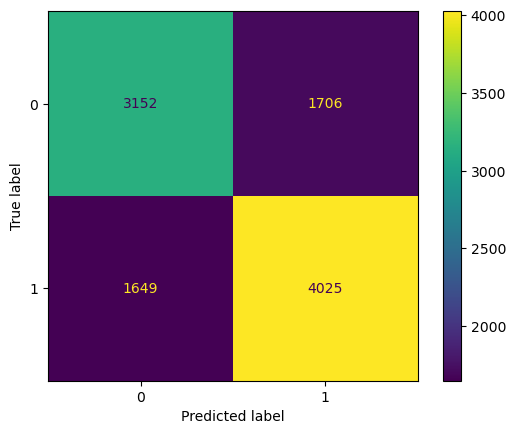

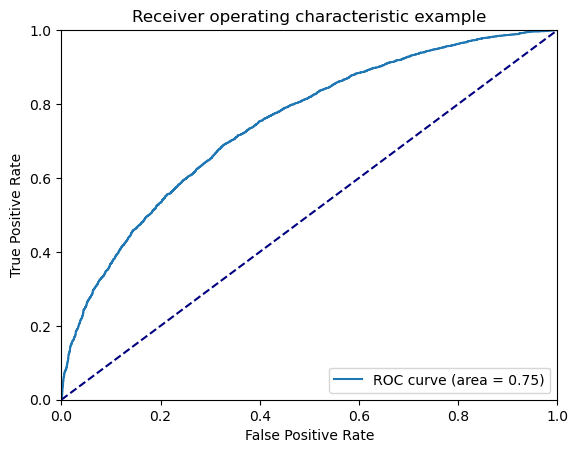

In [157]:
load_best_model_and_evaluate(path_model_tuned, test_ds)

#### Experiment Fine Tuning --> Block 3

In [158]:
path_model = general_path_models+'/extra_binary_models_sc/pretrained_MOBILENETV2_no_tuning_512_dp_regularization_epoch_40_adam_1e-4.h5'
model_finetune = tf.keras.models.load_model(path_model)
model_finetune.summary()

Model: "model_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_9 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.math.truediv (TFOpLambda  (None, 250, 250, 3)      0         
 )                                                               
                                                                 
 tf.math.subtract (TFOpLambd  (None, 250, 250, 3)      0         
 a)                                                              
                                                                 
 mobilenetv2_1.00_224 (Funct  (None, 8, 8, 1280)       2257984   
 ional)                                                          
                                                                 
 global_average_pooling2d_5   (None, 1280)             0         
 (GlobalAveragePooling2D)                                  

In [159]:
model_finetune.trainable = True

base_model_mobilenet = model_finetune.get_layer("mobilenetv2_1.00_224") # change the name looking at the summary IMPORTANT!
print("Number of layers in the base model: ", len(base_model_mobilenet.layers))
base_model_mobilenet.summary()

Number of layers in the base model:  154
Model: "mobilenetv2_1.00_224"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_8 (InputLayer)           [(None, 250, 250, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 125, 125, 32  864         ['input_8[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 125, 125, 32  128         ['Conv1[0][0]']                  
                                )     

In [160]:
set_trainable = False
for layer in base_model_mobilenet.layers:
    if layer.name == ' block_10_expand': # è buona pratica indicare da dove si parte a sfreezare la rete
        set_trainable = True
    if set_trainable:
        if layer.name.endswith('BN'): # fine a che la variabile booleana è a False allora setto i layer non traininabili altrimenti li setto come trainabili
            layer.trainable = False
        else:
            layer.trainable = True
    else:
        layer.trainable = False

model_finetune.summary()

Model: "model_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_9 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.math.truediv (TFOpLambda  (None, 250, 250, 3)      0         
 )                                                               
                                                                 
 tf.math.subtract (TFOpLambd  (None, 250, 250, 3)      0         
 a)                                                              
                                                                 
 mobilenetv2_1.00_224 (Funct  (None, 8, 8, 1280)       2257984   
 ional)                                                          
                                                                 
 global_average_pooling2d_5   (None, 1280)             0         
 (GlobalAveragePooling2D)                                  

In [161]:
path_model_tuned = general_path_models+'/binary_models_sc/pretrained_MOBILNETV2_FINE_tuning_block3_dp_epoch_40_adam_1e-4.h5'
history_tune, model_fitted_tuned = fit_model(model_finetune, train_ds, val_ds, path_model_tuned,40,10)

Epoch 1/40
626/627 [============================>.] - ETA: 0s - loss: 0.5479 - accuracy: 0.7172
Epoch 00001: val_loss improved from inf to 0.59350, saving model to ./binary_models_sc\pretrained_MOBILNETV2_FINE_tuning_block3_dp_epoch_40_adam_1e-4.h5


c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\engine\functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


627/627 [==============================] - 124s 194ms/step - loss: 0.5479 - accuracy: 0.7172 - val_loss: 0.5935 - val_accuracy: 0.6827
Epoch 2/40
626/627 [============================>.] - ETA: 0s - loss: 0.5446 - accuracy: 0.7192
Epoch 00002: val_loss did not improve from 0.59350
627/627 [==============================] - 123s 194ms/step - loss: 0.5446 - accuracy: 0.7193 - val_loss: 0.5951 - val_accuracy: 0.6793
Epoch 3/40
626/627 [============================>.] - ETA: 0s - loss: 0.5402 - accuracy: 0.7235
Epoch 00003: val_loss did not improve from 0.59350
627/627 [==============================] - 123s 193ms/step - loss: 0.5403 - accuracy: 0.7235 - val_loss: 0.5952 - val_accuracy: 0.6771
Epoch 4/40
626/627 [============================>.] - ETA: 0s - loss: 0.5356 - accuracy: 0.7281
Epoch 00004: val_loss did not improve from 0.59350
627/627 [==============================] - 132s 209ms/step - loss: 0.5355 - accuracy: 0.7281 - val_loss: 0.5953 - val_accuracy: 0.6799
Epoch 5/40
626/627 

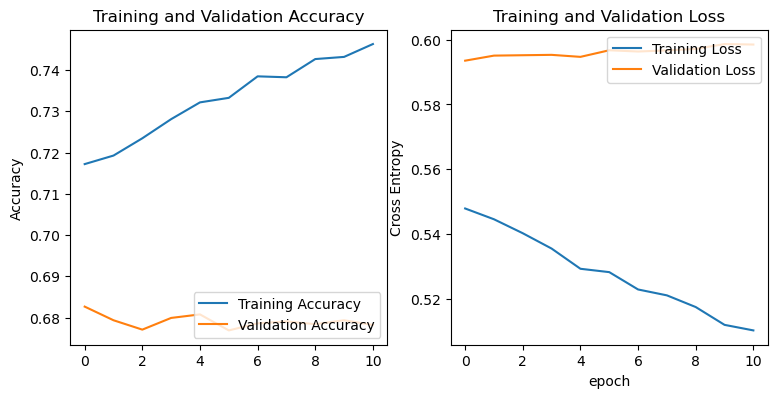

In [162]:
show_history_fit(history_tune)

165/165 [==============================] - 25s 143ms/step - loss: 0.5923 - accuracy: 0.6780
tf.Tensor([1 0 1 ... 1 0 0], shape=(10532,), dtype=int64)
tf.Tensor([1 0 1 ... 1 0 1], shape=(10532,), dtype=int32)
(10532,) (10532,)
Classification report: 
              precision    recall  f1-score   support

           0     0.6570    0.6313    0.6439      4858
           1     0.6946    0.7178    0.7060      5674

    accuracy                         0.6779     10532
   macro avg     0.6758    0.6746    0.6750     10532
weighted avg     0.6773    0.6779    0.6774     10532

ROC Curve:


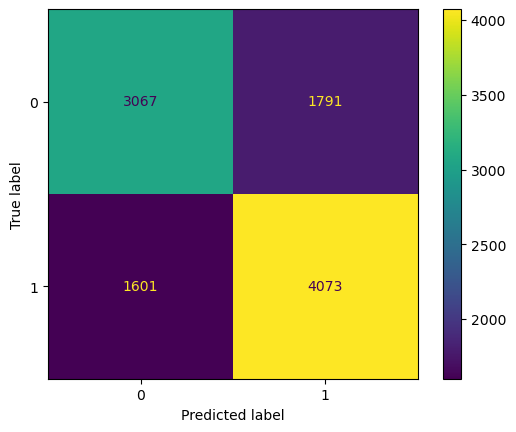

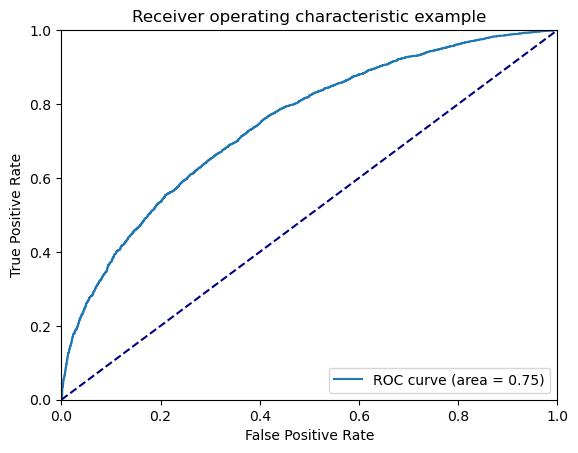

In [163]:
load_best_model_and_evaluate(path_model_tuned, test_ds)

#### Experiment Fine Tuning --- EXTRA

In [18]:
LR = 0.0001
path_model = general_path_models+'/binary_models_sc/pretrained_MOBILENETV2_no_tuning_512_dp_regularization_epoch_40_adam_1e-4.h5'
model_finetune = tf.keras.models.load_model(path_model)
model_finetune.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 sequential (Sequential)     (None, 250, 250, 3)       0         
                                                                 
 tf.math.truediv (TFOpLambda  (None, 250, 250, 3)      0         
 )                                                               
                                                                 
 tf.math.subtract (TFOpLambd  (None, 250, 250, 3)      0         
 a)                                                              
                                                                 
 mobilenetv2_1.00_224 (Funct  (None, 8, 8, 1280)       2257984   
 ional)                                                          
                                                             

In [19]:
model_finetune.trainable = True

base_model_resnet50 = model_finetune.get_layer("mobilenetv2_1.00_224") # change the name looking at the summary IMPORTANT!
print("Number of layers in the base model: ", len(base_model_resnet50.layers))
base_model_resnet50.summary()

Number of layers in the base model:  154
Model: "mobilenetv2_1.00_224"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 250, 250, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 125, 125, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 125, 125, 32  128         ['Conv1[0][0]']                  
                                )     

In [20]:
num_layer_trainable = 134

#start_layer_to_train = len(base_model_resnet50.layers) - num_layer_trainable

for layer in base_model_resnet50.layers[:num_layer_trainable]:
    #if layer.name.endswith('bn'):
    layer.trainable = False
    #else:
    #    layer.trainable = True

for layer in base_model_resnet50.layers[num_layer_trainable:]:
    if layer.name.endswith('BN'):
        layer.trainable = False
    else:
        layer.trainable = True


model_finetune.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 sequential (Sequential)     (None, 250, 250, 3)       0         
                                                                 
 tf.math.truediv (TFOpLambda  (None, 250, 250, 3)      0         
 )                                                               
                                                                 
 tf.math.subtract (TFOpLambd  (None, 250, 250, 3)      0         
 a)                                                              
                                                                 
 mobilenetv2_1.00_224 (Funct  (None, 8, 8, 1280)       2257984   
 ional)                                                          
                                                             

In [21]:
compile_model(model_finetune, 'adam', LR)

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 sequential (Sequential)     (None, 250, 250, 3)       0         
                                                                 
 tf.math.truediv (TFOpLambda  (None, 250, 250, 3)      0         
 )                                                               
                                                                 
 tf.math.subtract (TFOpLambd  (None, 250, 250, 3)      0         
 a)                                                              
                                                                 
 mobilenetv2_1.00_224 (Funct  (None, 8, 8, 1280)       2257984   
 ional)                                                          
                                                             

In [22]:
path_model_tuned = general_path_models+'/binary_models_sc/pretrained_MOBILNETV2_FINE_tuning_512_dp_epoch_40_adam_1e-4.h5'
history_tune, model_fitted_tuned = fit_model(model_finetune, train_ds, val_ds, path_model_tuned,40,5)

Epoch 1/40
627/627 [==============================] - ETA: 0s - loss: 0.6057 - accuracy: 0.6707
Epoch 00001: val_loss improved from inf to 0.61976, saving model to ./binary_models_sc\pretrained_MOBILNETV2_FINE_tuning_512_dp_epoch_40_adam_1e-4.h5
627/627 [==============================] - 95s 146ms/step - loss: 0.6057 - accuracy: 0.6707 - val_loss: 0.6198 - val_accuracy: 0.6779
Epoch 2/40


c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\engine\functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


626/627 [============================>.] - ETA: 0s - loss: 0.5885 - accuracy: 0.6850
Epoch 00002: val_loss did not improve from 0.61976
627/627 [==============================] - 93s 147ms/step - loss: 0.5885 - accuracy: 0.6851 - val_loss: 0.6519 - val_accuracy: 0.6663
Epoch 3/40
626/627 [============================>.] - ETA: 0s - loss: 0.5774 - accuracy: 0.6952
Epoch 00003: val_loss improved from 0.61976 to 0.61456, saving model to ./binary_models_sc\pretrained_MOBILNETV2_FINE_tuning_512_dp_epoch_40_adam_1e-4.h5
627/627 [==============================] - 94s 148ms/step - loss: 0.5774 - accuracy: 0.6952 - val_loss: 0.6146 - val_accuracy: 0.6792
Epoch 4/40
626/627 [============================>.] - ETA: 0s - loss: 0.5640 - accuracy: 0.7042
Epoch 00004: val_loss improved from 0.61456 to 0.60381, saving model to ./binary_models_sc\pretrained_MOBILNETV2_FINE_tuning_512_dp_epoch_40_adam_1e-4.h5
627/627 [==============================] - 95s 150ms/step - loss: 0.5640 - accuracy: 0.7043 - va

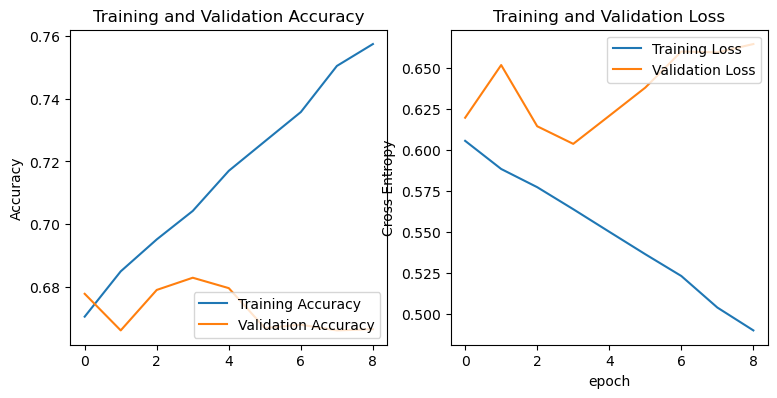

In [23]:
show_history_fit(history_tune)

165/165 [==============================] - 19s 108ms/step - loss: 0.6102 - accuracy: 0.6741
tf.Tensor([0 1 0 ... 0 0 1], shape=(10532,), dtype=int64)
tf.Tensor([0 1 0 ... 0 0 1], shape=(10532,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.6521    0.6293    0.6405      4858
           1     0.6918    0.7125    0.7020      5674

    accuracy                         0.6741     10532
   macro avg     0.6720    0.6709    0.6713     10532
weighted avg     0.6735    0.6741    0.6736     10532



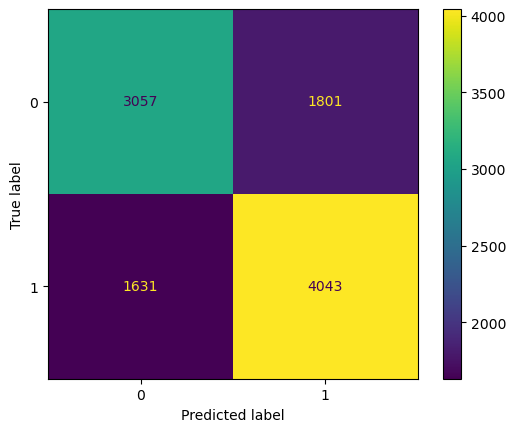

In [24]:
load_best_model_and_evaluate(path_model_tuned, test_ds)

#### Experiment Fine Tunining -- EXTRA 2

In [95]:
path_model =  general_path_models+'/extra_binary_models_sc/pretrained_RESNET_no_tuning_512_dp_epoch_40_adam_1e-4.h5'
model_finetune = tf.keras.models.load_model(path_model)
model_finetune.summary()

Model: "model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_7 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.__operators__.getitem_1   (None, 250, 250, 3)      0         
 (SlicingOpLambda)                                               
                                                                 
 tf.nn.bias_add_1 (TFOpLambd  (None, 250, 250, 3)      0         
 a)                                                              
                                                                 
 resnet50 (Functional)       (None, 8, 8, 2048)        23587712  
                                                                 
 global_average_pooling2d_4   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                           

In [96]:
model_finetune.trainable = True

base_model_resnet50 = model_finetune.get_layer("resnet50") # change the name looking at the summary IMPORTANT!
print("Number of layers in the base model: ", len(base_model_resnet50.layers))
base_model_resnet50.summary()

Number of layers in the base model:  175
Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_6 (InputLayer)           [(None, 250, 250, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 256, 256, 3)  0           ['input_6[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 125, 125, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                  

In [97]:
num_layer_trainable = 7

start_layer_to_train = len(base_model_resnet50.layers) - num_layer_trainable

for layer in base_model_resnet50.layers[:start_layer_to_train]:
    #if layer.name.endswith('bn'):
    layer.trainable = False
    #else:
    #    layer.trainable = True

for layer in base_model_resnet50.layers[start_layer_to_train:]:
    if layer.name.endswith('bn'):
        layer.trainable = False


model_finetune.summary()

Model: "model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_7 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.__operators__.getitem_1   (None, 250, 250, 3)      0         
 (SlicingOpLambda)                                               
                                                                 
 tf.nn.bias_add_1 (TFOpLambd  (None, 250, 250, 3)      0         
 a)                                                              
                                                                 
 resnet50 (Functional)       (None, 8, 8, 2048)        23587712  
                                                                 
 global_average_pooling2d_4   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                           

In [98]:
path_model_tuned = general_path_models+'/extra_binary_models_sc/pretrained_RESNET_FINEv2_tuning_512_dp_epoch_40_adam_1e-4.h5'
history_tune, model_fitted_tuned = fit_model(model_finetune, train_ds, val_ds, path_model_tuned,50,15)

Epoch 1/50
626/627 [============================>.] - ETA: 0s - loss: 0.5465 - accuracy: 0.7200
Epoch 00001: val_loss improved from inf to 0.58291, saving model to ./extra_binary_models_sc\pretrained_RESNET_FINEv2_tuning_512_dp_epoch_40_adam_1e-4.h5
627/627 [==============================] - 135s 212ms/step - loss: 0.5464 - accuracy: 0.7201 - val_loss: 0.5829 - val_accuracy: 0.6891
Epoch 2/50
626/627 [============================>.] - ETA: 0s - loss: 0.5446 - accuracy: 0.7208
Epoch 00002: val_loss did not improve from 0.58291
627/627 [==============================] - 133s 210ms/step - loss: 0.5445 - accuracy: 0.7209 - val_loss: 0.5862 - val_accuracy: 0.6877
Epoch 3/50
627/627 [==============================] - ETA: 0s - loss: 0.5382 - accuracy: 0.7232
Epoch 00003: val_loss did not improve from 0.58291
627/627 [==============================] - 154s 244ms/step - loss: 0.5382 - accuracy: 0.7232 - val_loss: 0.5832 - val_accuracy: 0.6912
Epoch 4/50
626/627 [============================>.]

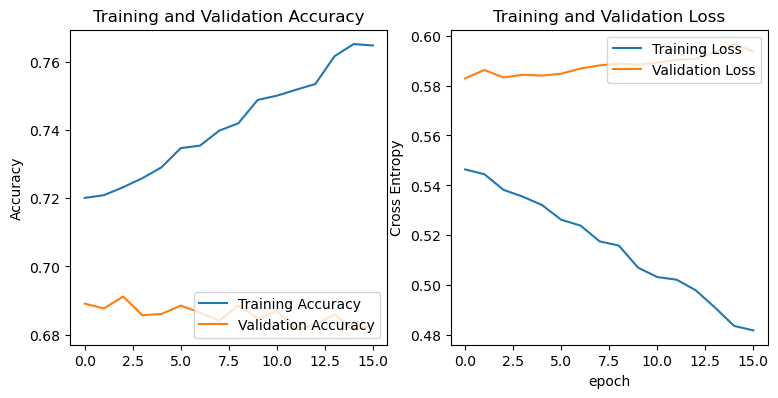

In [99]:
show_history_fit(history_tune)

165/165 [==============================] - 33s 191ms/step - loss: 0.5862 - accuracy: 0.6888
tf.Tensor([1 0 1 ... 1 0 1], shape=(10532,), dtype=int64)
tf.Tensor([1 0 1 ... 1 1 1], shape=(10532,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.6625    0.6622    0.6623      4858
           1     0.7109    0.7111    0.7110      5674

    accuracy                         0.6886     10532
   macro avg     0.6867    0.6867    0.6867     10532
weighted avg     0.6886    0.6886    0.6886     10532



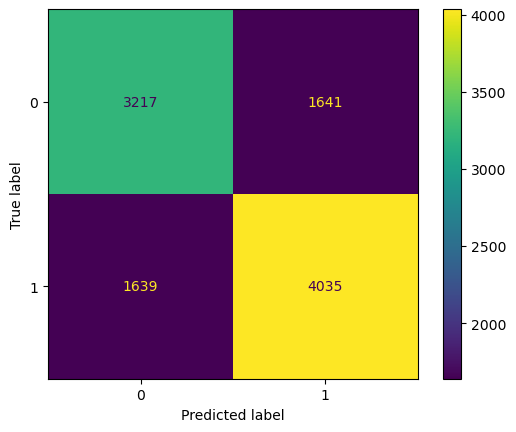

In [100]:
load_best_model_and_evaluate(path_model_tuned, test_ds)

#### Experiment Remove some layer ---> Block 1

In [164]:
base_model = tf.keras.applications.mobilenet_v2.MobileNetV2(input_shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS),
        weights='imagenet',  # load the network pretrained on ImageNet1K
        include_top=False)
        
base_model.trainable = False

base_model.summary()

Model: "mobilenetv2_1.00_224"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 250, 250, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 125, 125, 32  864         ['input_3[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 125, 125, 32  128         ['Conv1[0][0]']                  
                                )                                              

In [165]:
index = 0
for i, layer in enumerate(base_model.layers):
    if layer.name == "block_12_add": #block_8_add
        index = i
        break

base_model_cutted = tf.keras.Model(base_model.input, base_model.layers[index].output, name='mobilenet_cut')

base_model_cutted.summary()

Model: "mobilenet_cut"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 250, 250, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 125, 125, 32  864         ['input_3[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 125, 125, 32  128         ['Conv1[0][0]']                  
                                )                                                     

In [166]:
inputs = tf.keras.Input(shape=INPUT_SHAPE)
x = tf.keras.applications.mobilenet_v2.preprocess_input(inputs)
x = base_model_cutted(x)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.4)(x)
outputs = layers.Dense(NUM_CLASSES, activation="softmax")(x)
model = tf.keras.Model(inputs, outputs)

In [167]:
LR = 0.0002
compile_model(model, 'adam', LR)

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.math.truediv_2 (TFOpLamb  (None, 250, 250, 3)      0         
 da)                                                             
                                                                 
 tf.math.subtract_2 (TFOpLam  (None, 250, 250, 3)      0         
 bda)                                                            
                                                                 
 mobilenet_cut (Functional)  (None, 16, 16, 96)        558656    
                                                                 
 global_average_pooling2d_1   (None, 96)               0         
 (GlobalAveragePooling2D)                                        
                                                           

In [168]:
path_model = general_path_models+'/binary_models_sc/pretrained_REMOVE_LAYER_block12add_mobilenet_no_tuning_dp_epoch_40_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model,40,10)

Epoch 1/40
626/627 [============================>.] - ETA: 0s - loss: 0.6533 - accuracy: 0.6277
Epoch 00001: val_loss improved from inf to 0.60575, saving model to ./binary_models_sc\pretrained_REMOVE_LAYER_block12add_mobilenet_no_tuning_dp_epoch_40_adam_1e-4.h5
627/627 [==============================] - 122s 191ms/step - loss: 0.6532 - accuracy: 0.6278 - val_loss: 0.6057 - val_accuracy: 0.6665
Epoch 2/40


c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\engine\functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


626/627 [============================>.] - ETA: 0s - loss: 0.6192 - accuracy: 0.6558
Epoch 00002: val_loss improved from 0.60575 to 0.60152, saving model to ./binary_models_sc\pretrained_REMOVE_LAYER_block12add_mobilenet_no_tuning_dp_epoch_40_adam_1e-4.h5
627/627 [==============================] - 121s 190ms/step - loss: 0.6191 - accuracy: 0.6558 - val_loss: 0.6015 - val_accuracy: 0.6744
Epoch 3/40
626/627 [============================>.] - ETA: 0s - loss: 0.6062 - accuracy: 0.6695
Epoch 00003: val_loss improved from 0.60152 to 0.59963, saving model to ./binary_models_sc\pretrained_REMOVE_LAYER_block12add_mobilenet_no_tuning_dp_epoch_40_adam_1e-4.h5
627/627 [==============================] - 122s 192ms/step - loss: 0.6062 - accuracy: 0.6695 - val_loss: 0.5996 - val_accuracy: 0.6770
Epoch 4/40
626/627 [============================>.] - ETA: 0s - loss: 0.6010 - accuracy: 0.6725
Epoch 00004: val_loss improved from 0.59963 to 0.59890, saving model to ./binary_models_sc\pretrained_REMOVE_LA

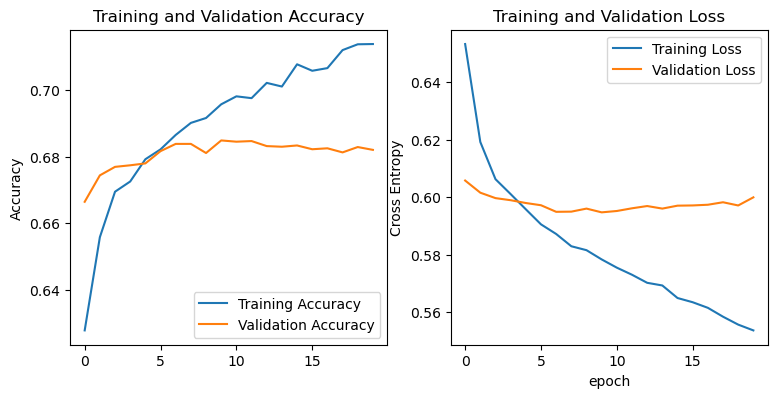

In [169]:
show_history_fit(history)

165/165 [==============================] - 26s 143ms/step - loss: 0.6002 - accuracy: 0.6718
tf.Tensor([1 1 1 ... 0 1 1], shape=(10532,), dtype=int64)
tf.Tensor([1 1 1 ... 1 0 1], shape=(10532,), dtype=int32)
(10532,) (10532,)
Classification report: 
              precision    recall  f1-score   support

           0     0.6361    0.6739    0.6545      4858
           1     0.7058    0.6699    0.6874      5674

    accuracy                         0.6718     10532
   macro avg     0.6710    0.6719    0.6709     10532
weighted avg     0.6737    0.6718    0.6722     10532

ROC Curve:


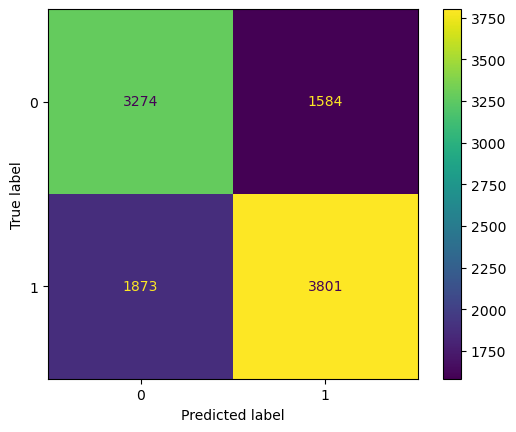

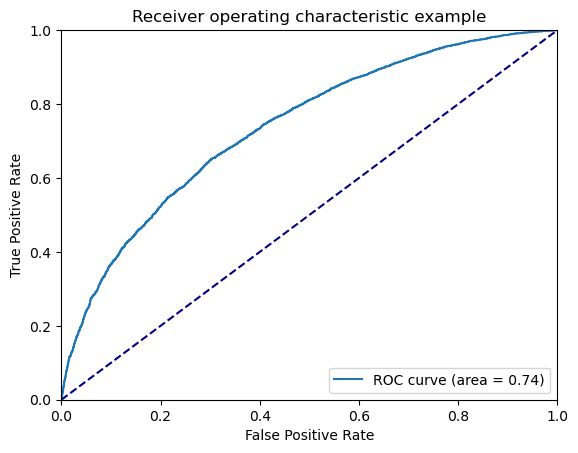

In [170]:
load_best_model_and_evaluate(path_model, test_ds)

#### Experiment Remove some layers ---> Block 2

In [171]:
base_model = tf.keras.applications.mobilenet_v2.MobileNetV2(input_shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS),
        weights='imagenet',  # load the network pretrained on ImageNet1K
        include_top=False)
        
base_model.trainable = False

base_model.summary()

Model: "mobilenetv2_1.00_224"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(None, 250, 250, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 125, 125, 32  864         ['input_5[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 125, 125, 32  128         ['Conv1[0][0]']                  
                                )                                              

In [172]:
index = 0
for i, layer in enumerate(base_model.layers):
    if layer.name == "block_8_add":
        index = i
        break

base_model_cutted = tf.keras.Model(base_model.input, base_model.layers[index].output, name='mobilenet_cut')

base_model_cutted.summary()

Model: "mobilenet_cut"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(None, 250, 250, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 125, 125, 32  864         ['input_5[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 125, 125, 32  128         ['Conv1[0][0]']                  
                                )                                                     

In [173]:
inputs = tf.keras.Input(shape=INPUT_SHAPE)
x = tf.keras.applications.mobilenet_v2.preprocess_input(inputs)
x = base_model_cutted(x)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.4)(x)
outputs = layers.Dense(NUM_CLASSES, activation="softmax")(x)
model = tf.keras.Model(inputs, outputs)

In [174]:
LR = 0.0002
compile_model(model, 'adam', LR)

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.math.truediv_3 (TFOpLamb  (None, 250, 250, 3)      0         
 da)                                                             
                                                                 
 tf.math.subtract_3 (TFOpLam  (None, 250, 250, 3)      0         
 bda)                                                            
                                                                 
 mobilenet_cut (Functional)  (None, 16, 16, 64)        192832    
                                                                 
 global_average_pooling2d_2   (None, 64)               0         
 (GlobalAveragePooling2D)                                        
                                                           

In [175]:
path_model = general_path_models+'/binary_models_sc/pretrained_REMOVE_LAYER_block8add_mobilenet_no_tuning_dp_epoch_40_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model,40,10)

Epoch 1/40
626/627 [============================>.] - ETA: 0s - loss: 0.6863 - accuracy: 0.6103
Epoch 00001: val_loss improved from inf to 0.62215, saving model to ./binary_models_sc\pretrained_REMOVE_LAYER_block8add_mobilenet_no_tuning_dp_epoch_40_adam_1e-4.h5
627/627 [==============================] - 123s 191ms/step - loss: 0.6863 - accuracy: 0.6103 - val_loss: 0.6221 - val_accuracy: 0.6507
Epoch 2/40


c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\engine\functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


626/627 [============================>.] - ETA: 0s - loss: 0.6385 - accuracy: 0.6384
Epoch 00002: val_loss improved from 0.62215 to 0.61614, saving model to ./binary_models_sc\pretrained_REMOVE_LAYER_block8add_mobilenet_no_tuning_dp_epoch_40_adam_1e-4.h5
627/627 [==============================] - 125s 198ms/step - loss: 0.6384 - accuracy: 0.6384 - val_loss: 0.6161 - val_accuracy: 0.6556
Epoch 3/40
626/627 [============================>.] - ETA: 0s - loss: 0.6239 - accuracy: 0.6514
Epoch 00003: val_loss improved from 0.61614 to 0.61403, saving model to ./binary_models_sc\pretrained_REMOVE_LAYER_block8add_mobilenet_no_tuning_dp_epoch_40_adam_1e-4.h5
627/627 [==============================] - 156s 245ms/step - loss: 0.6239 - accuracy: 0.6514 - val_loss: 0.6140 - val_accuracy: 0.6566
Epoch 4/40
626/627 [============================>.] - ETA: 0s - loss: 0.6150 - accuracy: 0.6592
Epoch 00004: val_loss did not improve from 0.61403
627/627 [==============================] - 172s 272ms/step - l

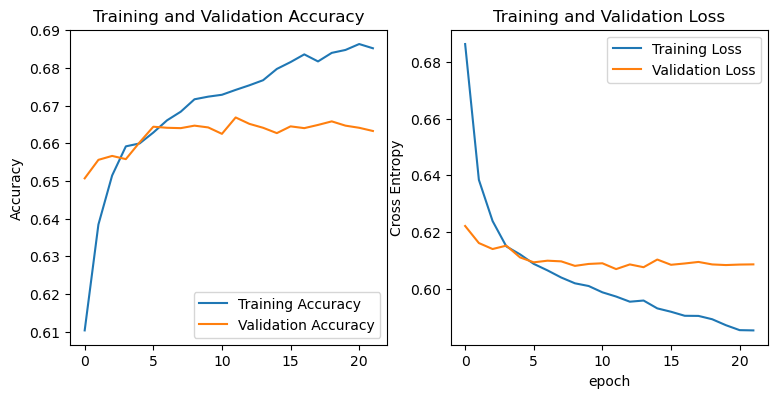

In [176]:
show_history_fit(history)

165/165 [==============================] - 25s 142ms/step - loss: 0.6130 - accuracy: 0.6585
tf.Tensor([0 1 0 ... 1 0 1], shape=(10532,), dtype=int64)
tf.Tensor([0 1 0 ... 1 0 1], shape=(10532,), dtype=int32)
(10532,) (10532,)
Classification report: 
              precision    recall  f1-score   support

           0     0.6206    0.6680    0.6434      4858
           1     0.6958    0.6503    0.6723      5674

    accuracy                         0.6585     10532
   macro avg     0.6582    0.6592    0.6579     10532
weighted avg     0.6611    0.6585    0.6590     10532

ROC Curve:


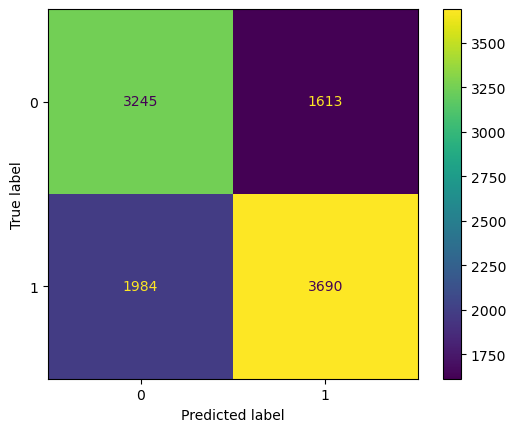

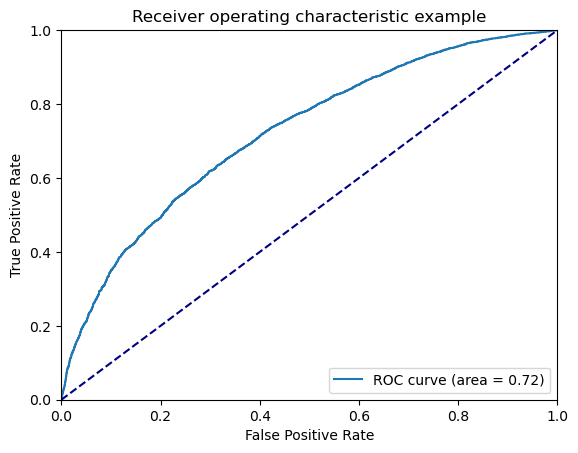

In [177]:
load_best_model_and_evaluate(path_model, test_ds)

### XCEPTION

#### Experiment Features Extractio -- add one dense layer

In [12]:
base_model = tf.keras.applications.xception.Xception(input_shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS),
        weights='imagenet',  # load the network pretrained on ImageNet1K
        include_top=False)

base_model.trainable = False

print('Number of layers Xception: ', len(base_model.layers))
base_model.summary()

Number of layers Xception:  132
Model: "xception"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 250, 250, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 124, 124, 32  864         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv1_bn (BatchNormaliz  (None, 124, 124, 32  128        ['block1_conv1[0][0]']           
 ation)                         )                          

In [13]:
inputs = tf.keras.Input(shape=INPUT_SHAPE)
x = tf.keras.applications.xception.preprocess_input(inputs)
x = base_model(x)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.3)(x)
outputs = layers.Dense(NUM_CLASSES, activation="softmax")(x)
model = tf.keras.Model(inputs, outputs)

model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.math.truediv (TFOpLambda  (None, 250, 250, 3)      0         
 )                                                               
                                                                 
 tf.math.subtract (TFOpLambd  (None, 250, 250, 3)      0         
 a)                                                              
                                                                 
 xception (Functional)       (None, 8, 8, 2048)        20861480  
                                                                 
 global_average_pooling2d (G  (None, 2048)             0         
 lobalAveragePooling2D)                                          
                                                             

In [14]:
LR = 0.0001
compile_model(model, 'adam', LR)

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.math.truediv (TFOpLambda  (None, 250, 250, 3)      0         
 )                                                               
                                                                 
 tf.math.subtract (TFOpLambd  (None, 250, 250, 3)      0         
 a)                                                              
                                                                 
 xception (Functional)       (None, 8, 8, 2048)        20861480  
                                                                 
 global_average_pooling2d (G  (None, 2048)             0         
 lobalAveragePooling2D)                                          
                                                             

In [15]:
path_model = general_path_models+'/binary_models_sc/pretrained_XCEPTION_no_tuning_512_dp_epoch_40_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model,40,5)

Epoch 1/40
627/627 [==============================] - ETA: 0s - loss: 0.6547 - accuracy: 0.6314
Epoch 00001: val_loss improved from inf to 0.62200, saving model to ./binary_models_sc\pretrained_XCEPTION_no_tuning_512_dp_epoch_40_adam_1e-4.h5
627/627 [==============================] - 169s 258ms/step - loss: 0.6547 - accuracy: 0.6314 - val_loss: 0.6220 - val_accuracy: 0.6560


c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\engine\functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


Epoch 2/40
626/627 [============================>.] - ETA: 0s - loss: 0.6274 - accuracy: 0.6560
Epoch 00002: val_loss improved from 0.62200 to 0.61150, saving model to ./binary_models_sc\pretrained_XCEPTION_no_tuning_512_dp_epoch_40_adam_1e-4.h5
627/627 [==============================] - 162s 256ms/step - loss: 0.6274 - accuracy: 0.6561 - val_loss: 0.6115 - val_accuracy: 0.6668
Epoch 3/40
626/627 [============================>.] - ETA: 0s - loss: 0.6188 - accuracy: 0.6635
Epoch 00003: val_loss improved from 0.61150 to 0.60866, saving model to ./binary_models_sc\pretrained_XCEPTION_no_tuning_512_dp_epoch_40_adam_1e-4.h5
627/627 [==============================] - 162s 257ms/step - loss: 0.6187 - accuracy: 0.6636 - val_loss: 0.6087 - val_accuracy: 0.6652
Epoch 4/40
627/627 [==============================] - ETA: 0s - loss: 0.6093 - accuracy: 0.6690
Epoch 00004: val_loss improved from 0.60866 to 0.60845, saving model to ./binary_models_sc\pretrained_XCEPTION_no_tuning_512_dp_epoch_40_adam_

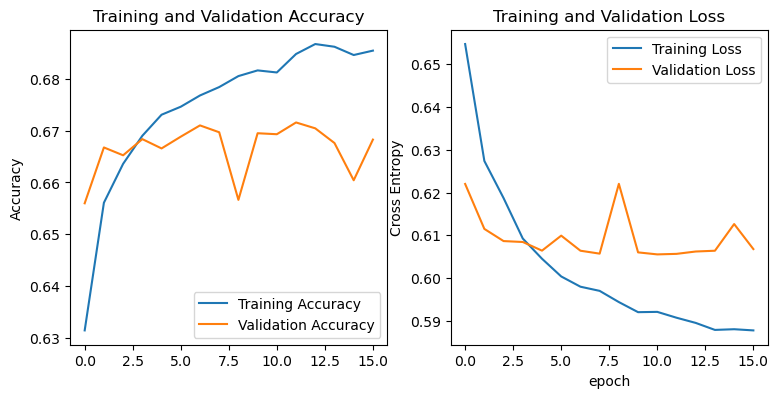

In [16]:
show_history_fit(history)

165/165 [==============================] - 44s 247ms/step - loss: 0.6133 - accuracy: 0.6623
tf.Tensor([1 0 1 ... 1 0 1], shape=(10532,), dtype=int64)
tf.Tensor([1 0 1 ... 1 0 1], shape=(10532,), dtype=int32)
(10532,) (10532,)
Classification report: 
              precision    recall  f1-score   support

           0     0.6421    0.6052    0.6231      4858
           1     0.6778    0.7111    0.6941      5674

    accuracy                         0.6623     10532
   macro avg     0.6599    0.6582    0.6586     10532
weighted avg     0.6613    0.6623    0.6613     10532

ROC Curve:


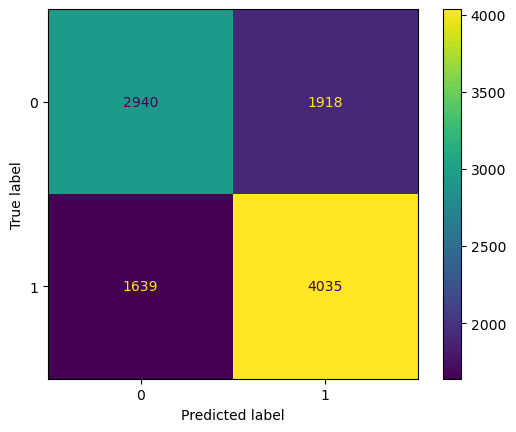

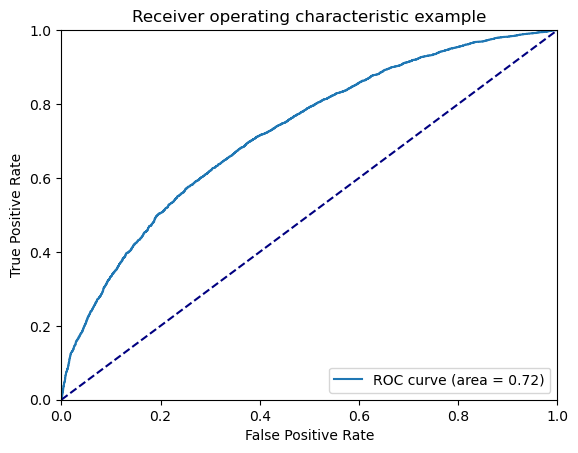

In [53]:
path_model = general_path_models+'/binary_models_sc/pretrained_XCEPTION_no_tuning_512_dp_epoch_40_adam_1e-4.h5'
load_best_model_and_evaluate(path_model, test_ds)

#### Experiment Features Extraction -- Add another  dropout

In [63]:
base_model = tf.keras.applications.xception.Xception(input_shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS),
        weights='imagenet',  # load the network pretrained on ImageNet1K
        include_top=False)

base_model.trainable = False

print('Number of layers Xception: ', len(base_model.layers))
base_model.summary()

Number of layers Xception:  132
Model: "xception"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_10 (InputLayer)          [(None, 250, 250, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 124, 124, 32  864         ['input_10[0][0]']               
                                )                                                                 
                                                                                                  
 block1_conv1_bn (BatchNormaliz  (None, 124, 124, 32  128        ['block1_conv1[0][0]']           
 ation)                         )                          

In [64]:
inputs = tf.keras.Input(shape=INPUT_SHAPE)
x = tf.keras.applications.xception.preprocess_input(inputs)
x = base_model(x)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.4)(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.3)(x)
outputs = layers.Dense(NUM_CLASSES, activation="softmax")(x)
model = tf.keras.Model(inputs, outputs)

model.summary()

Model: "model_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_11 (InputLayer)       [(None, 250, 250, 3)]     0         
                                                                 
 tf.math.truediv_1 (TFOpLamb  (None, 250, 250, 3)      0         
 da)                                                             
                                                                 
 tf.math.subtract_1 (TFOpLam  (None, 250, 250, 3)      0         
 bda)                                                            
                                                                 
 xception (Functional)       (None, 8, 8, 2048)        20861480  
                                                                 
 global_average_pooling2d_6   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                           

In [65]:
LR = 0.0001
compile_model(model, 'adam', LR)

Model: "model_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_11 (InputLayer)       [(None, 250, 250, 3)]     0         
                                                                 
 tf.math.truediv_1 (TFOpLamb  (None, 250, 250, 3)      0         
 da)                                                             
                                                                 
 tf.math.subtract_1 (TFOpLam  (None, 250, 250, 3)      0         
 bda)                                                            
                                                                 
 xception (Functional)       (None, 8, 8, 2048)        20861480  
                                                                 
 global_average_pooling2d_6   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                           

In [66]:
path_model = general_path_models+'/extra_binary_models_sc/pretrained_XCEPTION_no_tuning_512_dp_epoch_40_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model,50,15)

Epoch 1/50
627/627 [==============================] - ETA: 0s - loss: 0.6918 - accuracy: 0.6186
Epoch 00001: val_loss improved from inf to 0.61156, saving model to ./extra_binary_models_sc\pretrained_XCEPTION_no_tuning_512_dp_epoch_40_adam_1e-4.h5
627/627 [==============================] - 161s 251ms/step - loss: 0.6918 - accuracy: 0.6186 - val_loss: 0.6116 - val_accuracy: 0.6666


c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\engine\functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


Epoch 2/50
627/627 [==============================] - ETA: 0s - loss: 0.6596 - accuracy: 0.6340
Epoch 00002: val_loss improved from 0.61156 to 0.60786, saving model to ./extra_binary_models_sc\pretrained_XCEPTION_no_tuning_512_dp_epoch_40_adam_1e-4.h5
627/627 [==============================] - 157s 249ms/step - loss: 0.6596 - accuracy: 0.6340 - val_loss: 0.6079 - val_accuracy: 0.6656
Epoch 3/50
627/627 [==============================] - ETA: 0s - loss: 0.6478 - accuracy: 0.6413
Epoch 00003: val_loss improved from 0.60786 to 0.60753, saving model to ./extra_binary_models_sc\pretrained_XCEPTION_no_tuning_512_dp_epoch_40_adam_1e-4.h5
627/627 [==============================] - 157s 249ms/step - loss: 0.6478 - accuracy: 0.6413 - val_loss: 0.6075 - val_accuracy: 0.6687
Epoch 4/50
626/627 [============================>.] - ETA: 0s - loss: 0.6392 - accuracy: 0.6440
Epoch 00004: val_loss improved from 0.60753 to 0.60450, saving model to ./extra_binary_models_sc\pretrained_XCEPTION_no_tuning_512

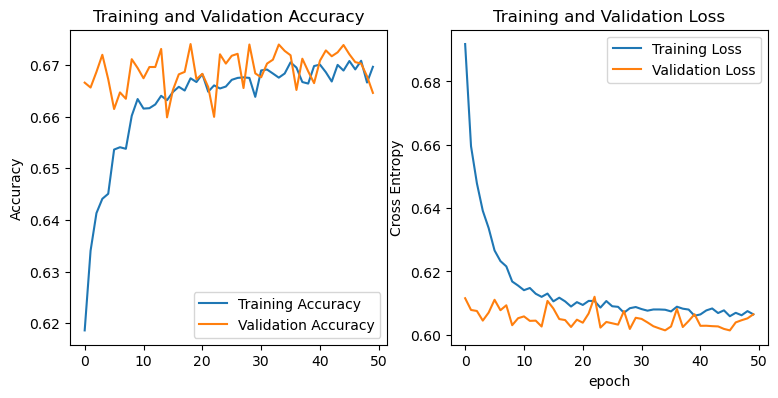

In [67]:
show_history_fit(history)

165/165 [==============================] - 40s 235ms/step - loss: 0.6075 - accuracy: 0.6671
tf.Tensor([1 1 1 ... 1 0 1], shape=(10532,), dtype=int64)
tf.Tensor([1 1 1 ... 1 0 1], shape=(10532,), dtype=int32)
(10532,) (10532,)
Classification report: 
              precision    recall  f1-score   support

           0     0.6462    0.6142    0.6298      4858
           1     0.6831    0.7120    0.6973      5674

    accuracy                         0.6669     10532
   macro avg     0.6646    0.6631    0.6635     10532
weighted avg     0.6661    0.6669    0.6662     10532

ROC Curve:


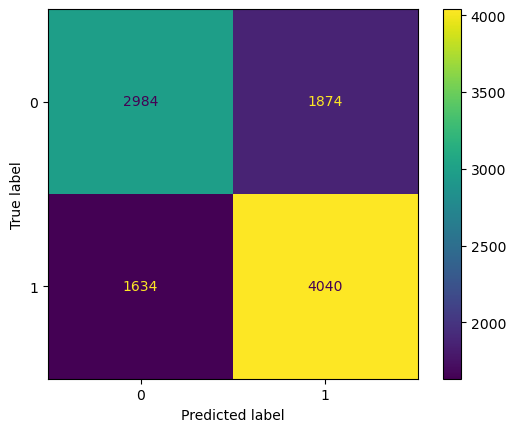

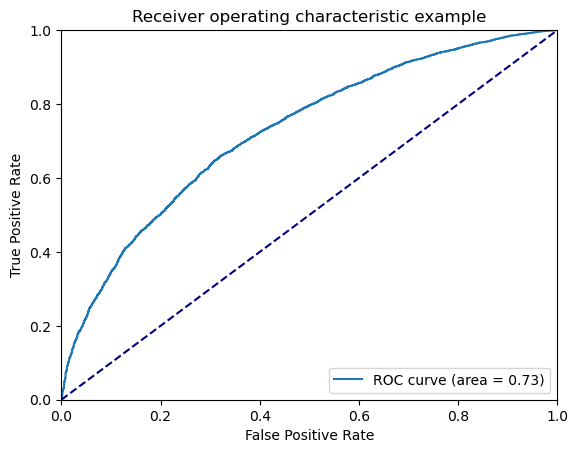

In [54]:
path_model = general_path_models+'/extra_binary_models_sc/pretrained_XCEPTION_no_tuning_512_dp_epoch_40_adam_1e-4.h5'
load_best_model_and_evaluate(path_model, test_ds)

#### Experiment Features Extraction -- Add another dense layer + dropout

In [21]:
base_model = tf.keras.applications.xception.Xception(input_shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS),
        weights='imagenet',  # load the network pretrained on ImageNet1K
        include_top=False)

base_model.trainable = False

print('Number of layers Xception: ', len(base_model.layers))
#base_model.summary()

Number of layers Xception:  132


In [22]:
inputs = tf.keras.Input(shape=INPUT_SHAPE)
x = tf.keras.applications.xception.preprocess_input(inputs)
x = base_model(x)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(2048, activation = 'relu')(x)
x = layers.Dropout(0.3)(x)
x = layers.Dense(1024, activation='relu')(x)
x = layers.Dropout(0.3)(x)
outputs = layers.Dense(NUM_CLASSES, activation="softmax")(x)
model = tf.keras.Model(inputs, outputs)

#model.summary()

In [24]:
LR = 0.0005
compile_model(model, 'adam', LR)

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.math.truediv (TFOpLambda  (None, 250, 250, 3)      0         
 )                                                               
                                                                 
 tf.math.subtract (TFOpLambd  (None, 250, 250, 3)      0         
 a)                                                              
                                                                 
 xception (Functional)       (None, 8, 8, 2048)        20861480  
                                                                 
 global_average_pooling2d_1   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                           

In [25]:
path_model = general_path_models+'/extra_binary_models_sc/pretrained_XCEPTION_vers2_no_tuning_1024_dp_epoch_40_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model,50,15)

Epoch 1/50
627/627 [==============================] - ETA: 0s - loss: 0.6350 - accuracy: 0.6437
Epoch 00001: val_loss improved from inf to 0.60516, saving model to ./extra_binary_models_sc\pretrained_XCEPTION_vers2_no_tuning_1024_dp_epoch_40_adam_1e-4.h5


c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\engine\functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


627/627 [==============================] - 171s 266ms/step - loss: 0.6350 - accuracy: 0.6437 - val_loss: 0.6052 - val_accuracy: 0.6733
Epoch 2/50
627/627 [==============================] - ETA: 0s - loss: 0.6083 - accuracy: 0.6672
Epoch 00002: val_loss improved from 0.60516 to 0.60039, saving model to ./extra_binary_models_sc\pretrained_XCEPTION_vers2_no_tuning_1024_dp_epoch_40_adam_1e-4.h5
627/627 [==============================] - 166s 262ms/step - loss: 0.6083 - accuracy: 0.6672 - val_loss: 0.6004 - val_accuracy: 0.6733
Epoch 3/50
627/627 [==============================] - ETA: 0s - loss: 0.5959 - accuracy: 0.6777
Epoch 00003: val_loss improved from 0.60039 to 0.59913, saving model to ./extra_binary_models_sc\pretrained_XCEPTION_vers2_no_tuning_1024_dp_epoch_40_adam_1e-4.h5
627/627 [==============================] - 164s 258ms/step - loss: 0.5959 - accuracy: 0.6777 - val_loss: 0.5991 - val_accuracy: 0.6758
Epoch 4/50
627/627 [==============================] - ETA: 0s - loss: 0.5876 

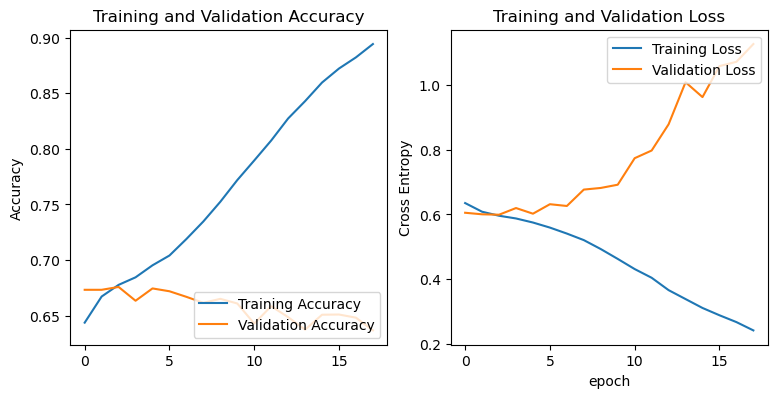

In [26]:
show_history_fit(history)

165/165 [==============================] - 39s 227ms/step - loss: 0.6033 - accuracy: 0.6691
tf.Tensor([1 1 0 ... 1 0 1], shape=(10532,), dtype=int64)
tf.Tensor([0 1 0 ... 1 0 1], shape=(10532,), dtype=int32)
(10532,) (10532,)
Classification report: 
              precision    recall  f1-score   support

           0     0.6432    0.6342    0.6387      4858
           1     0.6905    0.6988    0.6946      5674

    accuracy                         0.6690     10532
   macro avg     0.6669    0.6665    0.6667     10532
weighted avg     0.6687    0.6690    0.6688     10532

ROC Curve:


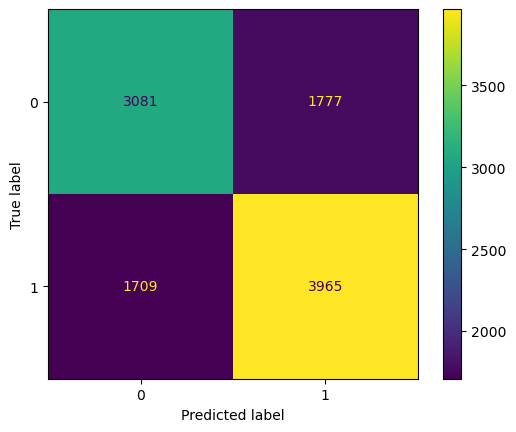

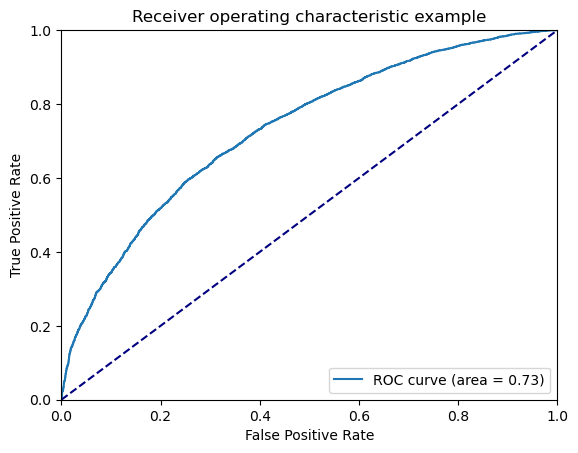

In [55]:
path_model = general_path_models+'/extra_binary_models_sc/pretrained_XCEPTION_vers2_no_tuning_1024_dp_epoch_40_adam_1e-4.h5' #path_model = general_path_models+'/extra_binary_models_sc/pretrained_XCEPTION_vers2_no_tuning_1024_dp_epoch_40_adam_1e-4.h5'
load_best_model_and_evaluate(path_model, test_ds)

#### Experiment Features Extraction -- add other layers

In [29]:
base_model = tf.keras.applications.xception.Xception(input_shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS),
        weights='imagenet',  # load the network pretrained on ImageNet1K
        include_top=False)

base_model.trainable = False

print('Number of layers Xception: ', len(base_model.layers))
base_model.summary()

Number of layers Xception:  132
Model: "xception"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_7 (InputLayer)           [(None, 240, 240, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 119, 119, 32  864         ['input_7[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv1_bn (BatchNormaliz  (None, 119, 119, 32  128        ['block1_conv1[0][0]']           
 ation)                         )                          

In [30]:
inputs = tf.keras.Input(shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS))
x = tf.keras.applications.mobilenet_v2.preprocess_input(inputs)
x = base_model(x)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.4)(x)
x = layers.Dense(1024, activation='relu')(x)
x = layers.Dropout(0.4)(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.4)(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dense(256, activation='relu')(x)
outputs = layers.Dense(NUM_CLASSES, activation="softmax")(x)
model = tf.keras.Model(inputs, outputs)

In [31]:
LR = 0.0001
compile_model(model, 'adam', LR)

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_8 (InputLayer)        [(None, 240, 240, 3)]     0         
                                                                 
 tf.math.truediv_1 (TFOpLamb  (None, 240, 240, 3)      0         
 da)                                                             
                                                                 
 tf.math.subtract_1 (TFOpLam  (None, 240, 240, 3)      0         
 bda)                                                            
                                                                 
 xception (Functional)       (None, 8, 8, 2048)        20861480  
                                                                 
 global_average_pooling2d_3   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                           

In [32]:
path_model = general_path_models+'/binary_models_sc/pretrained_extra_XCEPTION_no_tuning_OTHER_LAYERS_dp_epoch_40_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model,50,10)

Epoch 1/50
627/627 [==============================] - ETA: 0s - loss: 0.6514 - accuracy: 0.6154
Epoch 00001: val_loss improved from inf to 0.60969, saving model to ./binary_models_sc\pretrained_extra_XCEPTION_no_tuning_OTHER_LAYERS_dp_epoch_40_adam_1e-4.h5


c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\engine\functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


627/627 [==============================] - 148s 231ms/step - loss: 0.6514 - accuracy: 0.6154 - val_loss: 0.6097 - val_accuracy: 0.6624
Epoch 2/50
626/627 [============================>.] - ETA: 0s - loss: 0.6279 - accuracy: 0.6468
Epoch 00002: val_loss improved from 0.60969 to 0.60495, saving model to ./binary_models_sc\pretrained_extra_XCEPTION_no_tuning_OTHER_LAYERS_dp_epoch_40_adam_1e-4.h5
627/627 [==============================] - 147s 233ms/step - loss: 0.6279 - accuracy: 0.6468 - val_loss: 0.6050 - val_accuracy: 0.6694
Epoch 3/50
626/627 [============================>.] - ETA: 0s - loss: 0.6187 - accuracy: 0.6558
Epoch 00003: val_loss improved from 0.60495 to 0.60287, saving model to ./binary_models_sc\pretrained_extra_XCEPTION_no_tuning_OTHER_LAYERS_dp_epoch_40_adam_1e-4.h5
627/627 [==============================] - 145s 229ms/step - loss: 0.6186 - accuracy: 0.6559 - val_loss: 0.6029 - val_accuracy: 0.6712
Epoch 4/50
626/627 [============================>.] - ETA: 0s - loss: 0.6

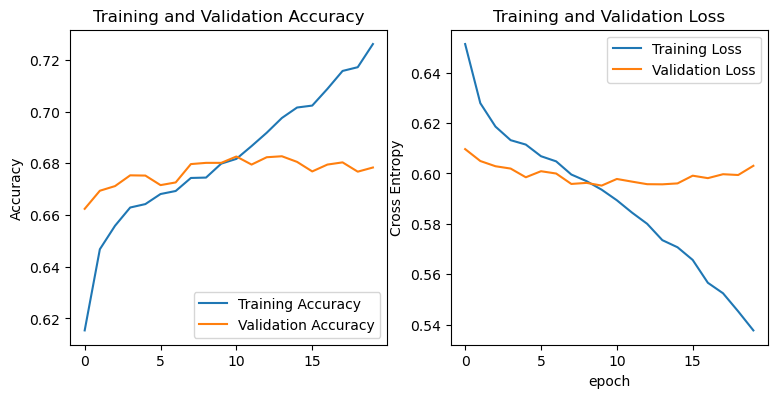

In [33]:
show_history_fit(history)

165/165 [==============================] - 45s 255ms/step - loss: 0.5996 - accuracy: 0.6754
tf.Tensor([1 1 1 ... 1 1 1], shape=(10532,), dtype=int64)
tf.Tensor([1 1 1 ... 1 0 1], shape=(10532,), dtype=int32)
(10532,) (10532,)
Classification report: 
              precision    recall  f1-score   support

           0     0.6569    0.6202    0.6380      4858
           1     0.6897    0.7226    0.7057      5674

    accuracy                         0.6754     10532
   macro avg     0.6733    0.6714    0.6719     10532
weighted avg     0.6745    0.6754    0.6745     10532

ROC Curve:


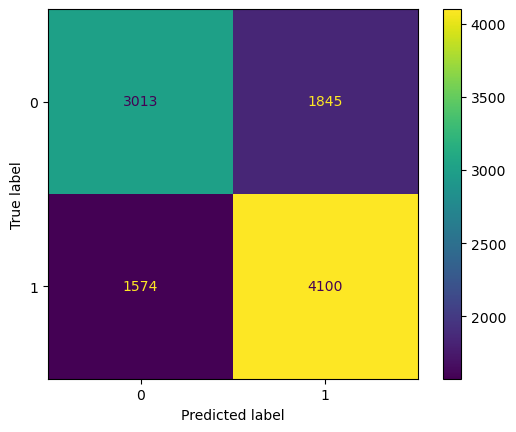

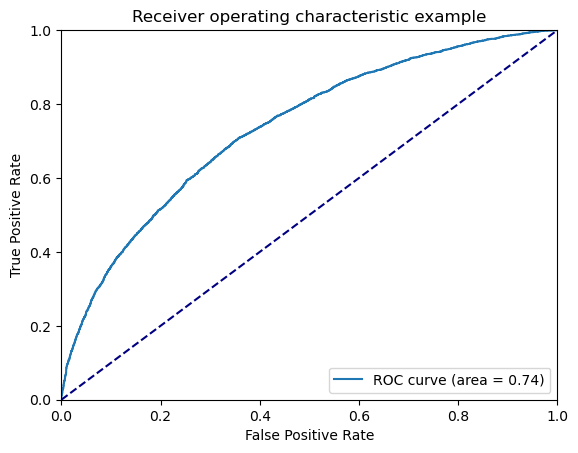

In [40]:
path_model = general_path_models+'/binary_models_sc/pretrained_extra_XCEPTION_no_tuning_OTHER_LAYERS_dp_epoch_40_adam_1e-4.h5'
load_best_model_and_evaluate(path_model, test_ds)

#### Experiment Fine Tuning -- Block 1

In [192]:
path_model = general_path_models+'/binary_models_sc/pretrained_extra_XCEPTION_no_tuning_OTHER_LAYERS_dp_epoch_40_adam_1e-4.h5'
model_finetune = tf.keras.models.load_model(path_model)
model_finetune.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_8 (InputLayer)        [(None, 240, 240, 3)]     0         
                                                                 
 tf.math.truediv_1 (TFOpLamb  (None, 240, 240, 3)      0         
 da)                                                             
                                                                 
 tf.math.subtract_1 (TFOpLam  (None, 240, 240, 3)      0         
 bda)                                                            
                                                                 
 xception (Functional)       (None, 8, 8, 2048)        20861480  
                                                                 
 global_average_pooling2d_3   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                           

In [193]:
model_finetune.trainable = True

base_model_xception = model_finetune.get_layer("xception") # change the name looking at the summary IMPORTANT!
print("Number of layers in the base model: ", len(base_model_xception.layers))
base_model_xception.summary()

Number of layers in the base model:  132
Model: "xception"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_7 (InputLayer)           [(None, 240, 240, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 119, 119, 32  864         ['input_7[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv1_bn (BatchNormaliz  (None, 119, 119, 32  128        ['block1_conv1[0][0]']           
 ation)                         )                 

In [194]:
set_trainable = False
for layer in base_model_xception.layers:
    if layer.name == ' block12_sepconv12_act': # è buona pratica indicare da dove si parte a sfreezare la rete
        set_trainable = True
    if set_trainable:
        if layer.name.endswith('bn'): # fine a che la variabile booleana è a False allora setto i layer non traininabili altrimenti li setto come trainabili
            layer.trainable = False
        else:
            layer.trainable = True
    else:
        layer.trainable = False

model_finetune.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_8 (InputLayer)        [(None, 240, 240, 3)]     0         
                                                                 
 tf.math.truediv_1 (TFOpLamb  (None, 240, 240, 3)      0         
 da)                                                             
                                                                 
 tf.math.subtract_1 (TFOpLam  (None, 240, 240, 3)      0         
 bda)                                                            
                                                                 
 xception (Functional)       (None, 8, 8, 2048)        20861480  
                                                                 
 global_average_pooling2d_3   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                           

In [195]:
path_model_tuned = general_path_models+'/binary_models_sc/pretrained_XCEPTION_FINE_tuning_block12_epoch_40_adam_1e-4.h5'
history_tune, model_fitted_tuned = fit_model(model_finetune, train_ds, val_ds, path_model_tuned,50,15)

Epoch 1/50
627/627 [==============================] - ETA: 0s - loss: 0.5871 - accuracy: 0.6847
Epoch 00001: val_loss improved from inf to 0.59672, saving model to ./binary_models_sc\pretrained_XCEPTION_FINE_tuning_block12_epoch_40_adam_1e-4.h5


c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\engine\functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


627/627 [==============================] - 168s 265ms/step - loss: 0.5871 - accuracy: 0.6847 - val_loss: 0.5967 - val_accuracy: 0.6819
Epoch 2/50
627/627 [==============================] - ETA: 0s - loss: 0.5840 - accuracy: 0.6865
Epoch 00002: val_loss improved from 0.59672 to 0.59666, saving model to ./binary_models_sc\pretrained_XCEPTION_FINE_tuning_block12_epoch_40_adam_1e-4.h5
627/627 [==============================] - 168s 266ms/step - loss: 0.5840 - accuracy: 0.6865 - val_loss: 0.5967 - val_accuracy: 0.6792
Epoch 3/50
627/627 [==============================] - ETA: 0s - loss: 0.5783 - accuracy: 0.6918
Epoch 00003: val_loss did not improve from 0.59666
627/627 [==============================] - 169s 266ms/step - loss: 0.5783 - accuracy: 0.6918 - val_loss: 0.5967 - val_accuracy: 0.6807
Epoch 4/50
627/627 [==============================] - ETA: 0s - loss: 0.5735 - accuracy: 0.6976
Epoch 00004: val_loss improved from 0.59666 to 0.59553, saving model to ./binary_models_sc\pretrained_X

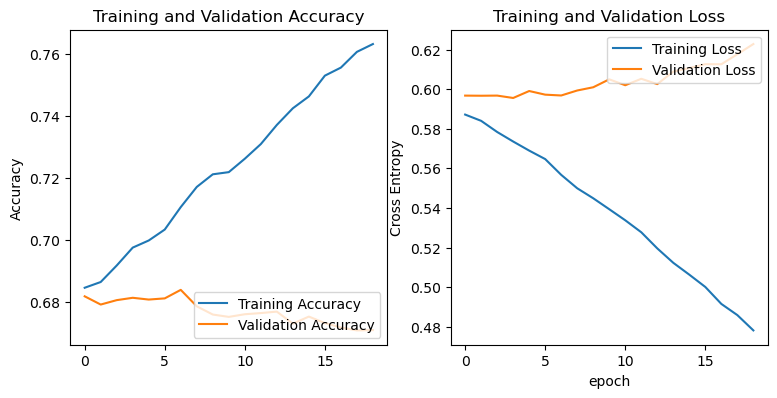

In [196]:
show_history_fit(history_tune)

165/165 [==============================] - 36s 203ms/step - loss: 0.5996 - accuracy: 0.6754
tf.Tensor([1 1 1 ... 1 1 0], shape=(10532,), dtype=int64)
tf.Tensor([0 1 1 ... 1 0 0], shape=(10532,), dtype=int32)
(10532,) (10532,)
Classification report: 
              precision    recall  f1-score   support

           0     0.6569    0.6202    0.6380      4858
           1     0.6897    0.7226    0.7057      5674

    accuracy                         0.6754     10532
   macro avg     0.6733    0.6714    0.6719     10532
weighted avg     0.6745    0.6754    0.6745     10532

ROC Curve:


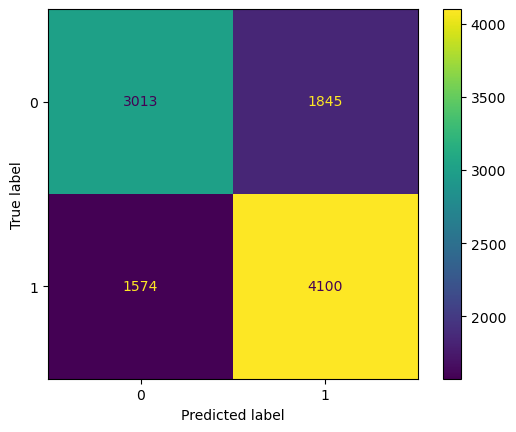

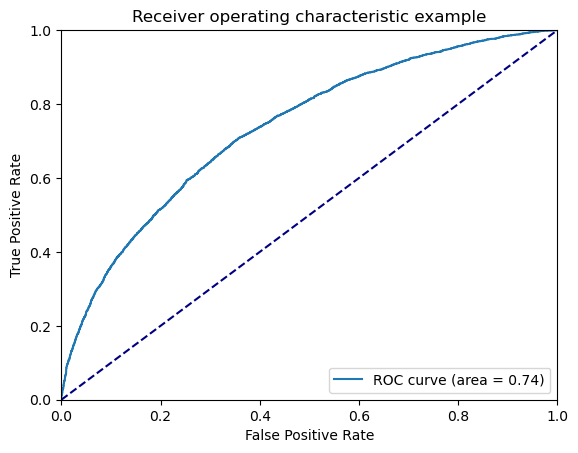

In [197]:
load_best_model_and_evaluate(path_model, test_ds)

#### Experiment Fine Tuning --> Block 2

In [198]:
path_model = general_path_models+'/binary_models_sc/pretrained_extra_XCEPTION_no_tuning_OTHER_LAYERS_dp_epoch_40_adam_1e-4.h5'
model_finetune = tf.keras.models.load_model(path_model)
model_finetune.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_8 (InputLayer)        [(None, 240, 240, 3)]     0         
                                                                 
 tf.math.truediv_1 (TFOpLamb  (None, 240, 240, 3)      0         
 da)                                                             
                                                                 
 tf.math.subtract_1 (TFOpLam  (None, 240, 240, 3)      0         
 bda)                                                            
                                                                 
 xception (Functional)       (None, 8, 8, 2048)        20861480  
                                                                 
 global_average_pooling2d_3   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                           

In [199]:
model_finetune.trainable = True

base_model_xception = model_finetune.get_layer("xception") # change the name looking at the summary IMPORTANT!
print("Number of layers in the base model: ", len(base_model_xception.layers))
base_model_xception.summary()

Number of layers in the base model:  132
Model: "xception"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_7 (InputLayer)           [(None, 240, 240, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 119, 119, 32  864         ['input_7[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv1_bn (BatchNormaliz  (None, 119, 119, 32  128        ['block1_conv1[0][0]']           
 ation)                         )                 

In [200]:
set_trainable = False
for layer in base_model_xception.layers:
    if layer.name == ' block9_sepconv1_act': # è buona pratica indicare da dove si parte a sfreezare la rete
        set_trainable = True
    if set_trainable:
        if layer.name.endswith('bn'): # fine a che la variabile booleana è a False allora setto i layer non traininabili altrimenti li setto come trainabili
            layer.trainable = False
        else:
            layer.trainable = True
    else:
        layer.trainable = False

model_finetune.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_8 (InputLayer)        [(None, 240, 240, 3)]     0         
                                                                 
 tf.math.truediv_1 (TFOpLamb  (None, 240, 240, 3)      0         
 da)                                                             
                                                                 
 tf.math.subtract_1 (TFOpLam  (None, 240, 240, 3)      0         
 bda)                                                            
                                                                 
 xception (Functional)       (None, 8, 8, 2048)        20861480  
                                                                 
 global_average_pooling2d_3   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                           

In [201]:
path_model_tuned = general_path_models+'/binary_models_sc/pretrained_XCEPTION_FINE_tuning_block9_epoch_40_adam_1e-4.h5'
history_tune, model_fitted_tuned = fit_model(model_finetune, train_ds, val_ds, path_model_tuned,50,15)

Epoch 1/50
627/627 [==============================] - ETA: 0s - loss: 0.5885 - accuracy: 0.6839
Epoch 00001: val_loss improved from inf to 0.59767, saving model to ./binary_models_sc\pretrained_XCEPTION_FINE_tuning_block9_epoch_40_adam_1e-4.h5


c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\engine\functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


627/627 [==============================] - 168s 264ms/step - loss: 0.5885 - accuracy: 0.6839 - val_loss: 0.5977 - val_accuracy: 0.6791
Epoch 2/50
627/627 [==============================] - ETA: 0s - loss: 0.5835 - accuracy: 0.6879
Epoch 00002: val_loss improved from 0.59767 to 0.59623, saving model to ./binary_models_sc\pretrained_XCEPTION_FINE_tuning_block9_epoch_40_adam_1e-4.h5
627/627 [==============================] - 166s 263ms/step - loss: 0.5835 - accuracy: 0.6879 - val_loss: 0.5962 - val_accuracy: 0.6811
Epoch 3/50
627/627 [==============================] - ETA: 0s - loss: 0.5793 - accuracy: 0.6926
Epoch 00003: val_loss improved from 0.59623 to 0.59562, saving model to ./binary_models_sc\pretrained_XCEPTION_FINE_tuning_block9_epoch_40_adam_1e-4.h5
627/627 [==============================] - 166s 262ms/step - loss: 0.5793 - accuracy: 0.6926 - val_loss: 0.5956 - val_accuracy: 0.6842
Epoch 4/50
627/627 [==============================] - ETA: 0s - loss: 0.5750 - accuracy: 0.6940
Epo

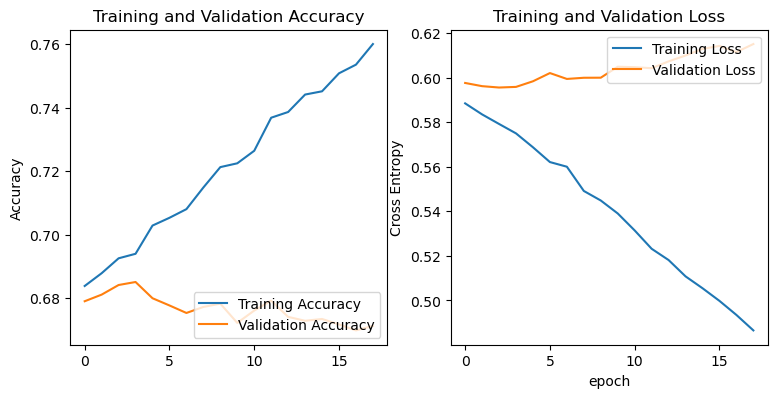

In [202]:
show_history_fit(history_tune)

165/165 [==============================] - 36s 205ms/step - loss: 0.5994 - accuracy: 0.6755
tf.Tensor([0 0 0 ... 0 1 1], shape=(10532,), dtype=int64)
tf.Tensor([0 1 0 ... 0 0 1], shape=(10532,), dtype=int32)
(10532,) (10532,)
Classification report: 
              precision    recall  f1-score   support

           0     0.6664    0.5924    0.6272      4858
           1     0.6813    0.7460    0.7122      5674

    accuracy                         0.6752     10532
   macro avg     0.6738    0.6692    0.6697     10532
weighted avg     0.6744    0.6752    0.6730     10532

ROC Curve:


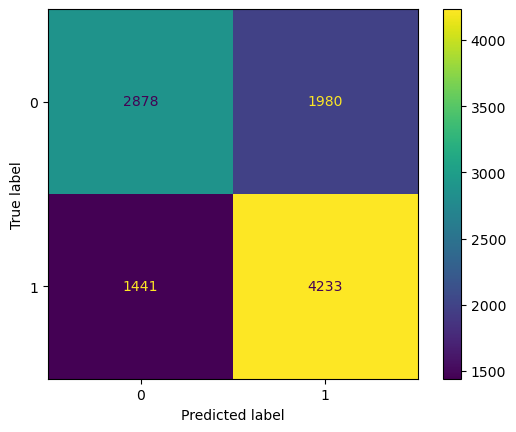

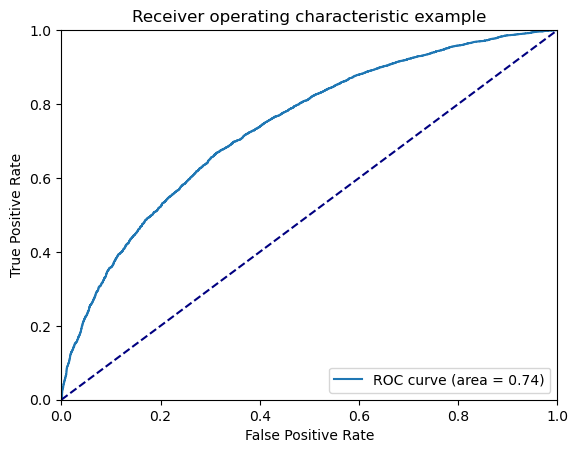

In [203]:
load_best_model_and_evaluate(path_model_tuned, test_ds)

#### Experiment Fine Tuning --> Block3

In [204]:
path_model = general_path_models+'/binary_models_sc/pretrained_extra_XCEPTION_no_tuning_OTHER_LAYERS_dp_epoch_40_adam_1e-4.h5'
model_finetune = tf.keras.models.load_model(path_model)
model_finetune.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_8 (InputLayer)        [(None, 240, 240, 3)]     0         
                                                                 
 tf.math.truediv_1 (TFOpLamb  (None, 240, 240, 3)      0         
 da)                                                             
                                                                 
 tf.math.subtract_1 (TFOpLam  (None, 240, 240, 3)      0         
 bda)                                                            
                                                                 
 xception (Functional)       (None, 8, 8, 2048)        20861480  
                                                                 
 global_average_pooling2d_3   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                           

In [205]:
model_finetune.trainable = True

base_model_xception = model_finetune.get_layer("xception") # change the name looking at the summary IMPORTANT!
print("Number of layers in the base model: ", len(base_model_xception.layers))
base_model_xception.summary()

Number of layers in the base model:  132
Model: "xception"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_7 (InputLayer)           [(None, 240, 240, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 119, 119, 32  864         ['input_7[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv1_bn (BatchNormaliz  (None, 119, 119, 32  128        ['block1_conv1[0][0]']           
 ation)                         )                 

In [206]:
set_trainable = False
for layer in base_model_xception.layers:
    if layer.name == ' block9_sepconv6_act': # è buona pratica indicare da dove si parte a sfreezare la rete
        set_trainable = True
    if set_trainable:
        if layer.name.endswith('bn'): # fine a che la variabile booleana è a False allora setto i layer non traininabili altrimenti li setto come trainabili
            layer.trainable = False
        else:
            layer.trainable = True
    else:
        layer.trainable = False

model_finetune.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_8 (InputLayer)        [(None, 240, 240, 3)]     0         
                                                                 
 tf.math.truediv_1 (TFOpLamb  (None, 240, 240, 3)      0         
 da)                                                             
                                                                 
 tf.math.subtract_1 (TFOpLam  (None, 240, 240, 3)      0         
 bda)                                                            
                                                                 
 xception (Functional)       (None, 8, 8, 2048)        20861480  
                                                                 
 global_average_pooling2d_3   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                           

In [207]:
path_model_tuned = general_path_models+'/binary_models_sc/pretrained_XCEPTION_FINE_tuning_block6_epoch_40_adam_1e-4.h5'
history_tune, model_fitted_tuned = fit_model(model_finetune, train_ds, val_ds, path_model_tuned,50,15)

Epoch 1/50
627/627 [==============================] - ETA: 0s - loss: 0.5878 - accuracy: 0.6847
Epoch 00001: val_loss improved from inf to 0.59690, saving model to ./binary_models_sc\pretrained_XCEPTION_FINE_tuning_block6_epoch_40_adam_1e-4.h5


c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\engine\functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


627/627 [==============================] - 168s 263ms/step - loss: 0.5878 - accuracy: 0.6847 - val_loss: 0.5969 - val_accuracy: 0.6817
Epoch 2/50
627/627 [==============================] - ETA: 0s - loss: 0.5839 - accuracy: 0.6871
Epoch 00002: val_loss improved from 0.59690 to 0.59438, saving model to ./binary_models_sc\pretrained_XCEPTION_FINE_tuning_block6_epoch_40_adam_1e-4.h5
627/627 [==============================] - 164s 259ms/step - loss: 0.5839 - accuracy: 0.6871 - val_loss: 0.5944 - val_accuracy: 0.6814
Epoch 3/50
627/627 [==============================] - ETA: 0s - loss: 0.5794 - accuracy: 0.6923
Epoch 00003: val_loss did not improve from 0.59438
627/627 [==============================] - 165s 262ms/step - loss: 0.5794 - accuracy: 0.6923 - val_loss: 0.5956 - val_accuracy: 0.6844
Epoch 4/50
627/627 [==============================] - ETA: 0s - loss: 0.5742 - accuracy: 0.6965
Epoch 00004: val_loss did not improve from 0.59438
627/627 [==============================] - 167s 264ms

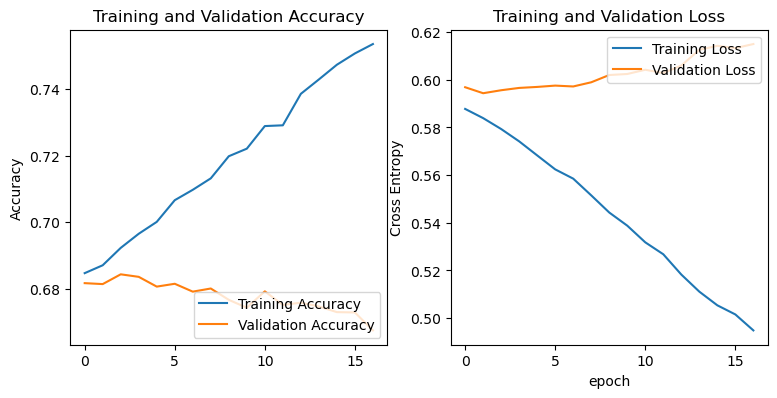

In [208]:
show_history_fit(history_tune)

165/165 [==============================] - 37s 206ms/step - loss: 0.5987 - accuracy: 0.6771
tf.Tensor([1 0 1 ... 1 0 1], shape=(10532,), dtype=int64)
tf.Tensor([1 0 1 ... 1 0 1], shape=(10532,), dtype=int32)
(10532,) (10532,)
Classification report: 
              precision    recall  f1-score   support

           0     0.6601    0.6173    0.6380      4858
           1     0.6896    0.7279    0.7082      5674

    accuracy                         0.6769     10532
   macro avg     0.6749    0.6726    0.6731     10532
weighted avg     0.6760    0.6769    0.6758     10532

ROC Curve:


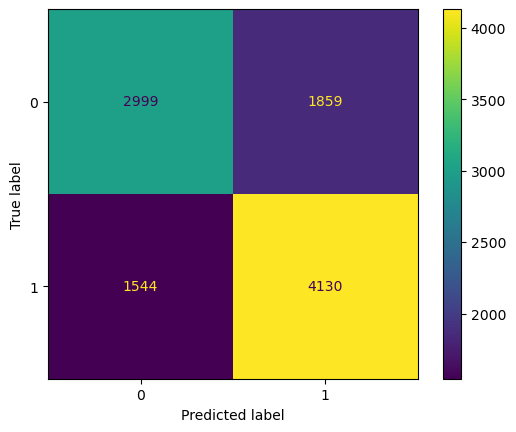

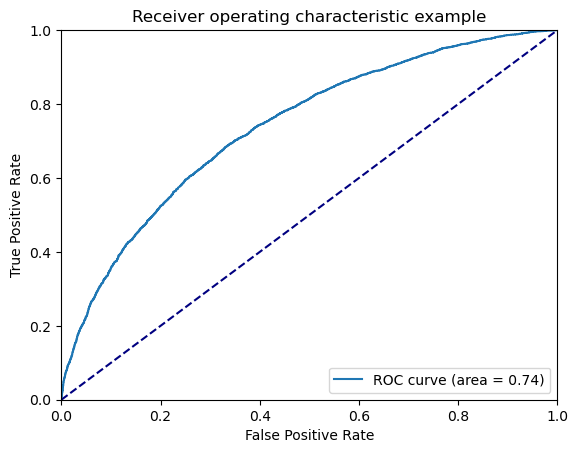

In [209]:
load_best_model_and_evaluate(path_model_tuned, test_ds)

#### Experiment Remove some layers --> Block 1

In [210]:
base_model = tf.keras.applications.xception.Xception(input_shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS),
        weights='imagenet',  # load the network pretrained on ImageNet1K
        include_top=False)

base_model.trainable = False

print('Number of layers Xception: ', len(base_model.layers))
base_model.summary()

Number of layers Xception:  132
Model: "xception"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_7 (InputLayer)           [(None, 240, 240, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 119, 119, 32  864         ['input_7[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv1_bn (BatchNormaliz  (None, 119, 119, 32  128        ['block1_conv1[0][0]']           
 ation)                         )                          

In [211]:
index = 0
for i, layer in enumerate(base_model.layers):
    if layer.name == "block11_sepconv1_act": #block6_sepconv1_act
        index = i
        break

base_model_cutted = tf.keras.Model(base_model.input, base_model.layers[index].output, name='xception_cut')

base_model_cutted.summary()

Model: "xception_cut"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_7 (InputLayer)           [(None, 240, 240, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 119, 119, 32  864         ['input_7[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv1_bn (BatchNormaliz  (None, 119, 119, 32  128        ['block1_conv1[0][0]']           
 ation)                         )                                                      

In [212]:
inputs = tf.keras.Input(shape=INPUT_SHAPE)
x = tf.keras.applications.mobilenet_v2.preprocess_input(inputs)
x = base_model_cutted(x)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.3)(x)
outputs = layers.Dense(NUM_CLASSES, activation="softmax")(x)
model = tf.keras.Model(inputs, outputs)

In [213]:
LR = 0.0002
compile_model(model, 'adam', LR)

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_8 (InputLayer)        [(None, 240, 240, 3)]     0         
                                                                 
 tf.math.truediv_4 (TFOpLamb  (None, 240, 240, 3)      0         
 da)                                                             
                                                                 
 tf.math.subtract_4 (TFOpLam  (None, 240, 240, 3)      0         
 bda)                                                            
                                                                 
 xception_cut (Functional)   (None, 15, 15, 728)       10823688  
                                                                 
 global_average_pooling2d_3   (None, 728)              0         
 (GlobalAveragePooling2D)                                        
                                                           

In [214]:
path_model = './_models_sc/pretrainbinaryed_REMOVE_LAYER_block11sep_xception_no_tuning_dp_epoch_40_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model,40,10)

Epoch 1/40
627/627 [==============================] - ETA: 0s - loss: 0.6358 - accuracy: 0.6393
Epoch 00001: val_loss improved from inf to 0.60355, saving model to ./_models_sc\pretrainbinaryed_REMOVE_LAYER_block11sep_xception_no_tuning_dp_epoch_40_adam_1e-4.h5


c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\engine\functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


627/627 [==============================] - 174s 270ms/step - loss: 0.6358 - accuracy: 0.6393 - val_loss: 0.6036 - val_accuracy: 0.6723
Epoch 2/40
626/627 [============================>.] - ETA: 0s - loss: 0.6114 - accuracy: 0.6638
Epoch 00002: val_loss improved from 0.60355 to 0.59559, saving model to ./_models_sc\pretrainbinaryed_REMOVE_LAYER_block11sep_xception_no_tuning_dp_epoch_40_adam_1e-4.h5
627/627 [==============================] - 169s 266ms/step - loss: 0.6114 - accuracy: 0.6637 - val_loss: 0.5956 - val_accuracy: 0.6764
Epoch 3/40
627/627 [==============================] - ETA: 0s - loss: 0.6025 - accuracy: 0.6705
Epoch 00003: val_loss did not improve from 0.59559
627/627 [==============================] - 168s 265ms/step - loss: 0.6025 - accuracy: 0.6705 - val_loss: 0.6206 - val_accuracy: 0.6545
Epoch 4/40
626/627 [============================>.] - ETA: 0s - loss: 0.5998 - accuracy: 0.6738
Epoch 00004: val_loss improved from 0.59559 to 0.59445, saving model to ./_models_sc\p

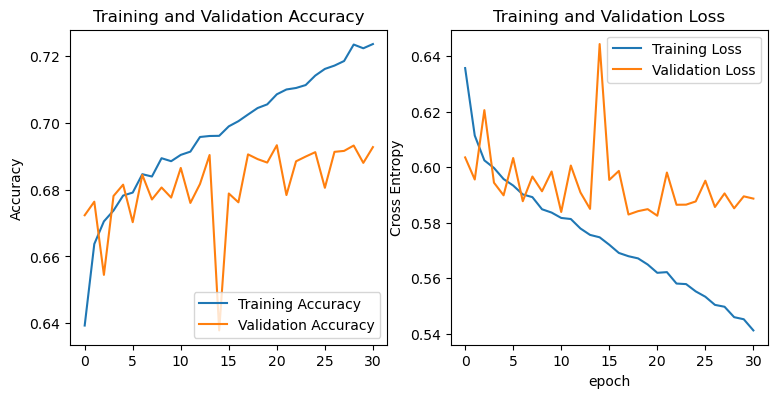

In [215]:
show_history_fit(history)

165/165 [==============================] - 37s 205ms/step - loss: 0.5902 - accuracy: 0.6788
tf.Tensor([1 1 1 ... 1 1 1], shape=(10532,), dtype=int64)
tf.Tensor([1 1 1 ... 1 0 1], shape=(10532,), dtype=int32)
(10532,) (10532,)
Classification report: 
              precision    recall  f1-score   support

           0     0.6664    0.6072    0.6354      4858
           1     0.6875    0.7397    0.7126      5674

    accuracy                         0.6786     10532
   macro avg     0.6769    0.6735    0.6740     10532
weighted avg     0.6777    0.6786    0.6770     10532

ROC Curve:


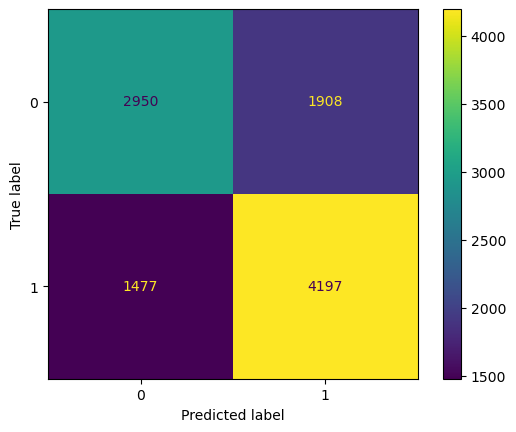

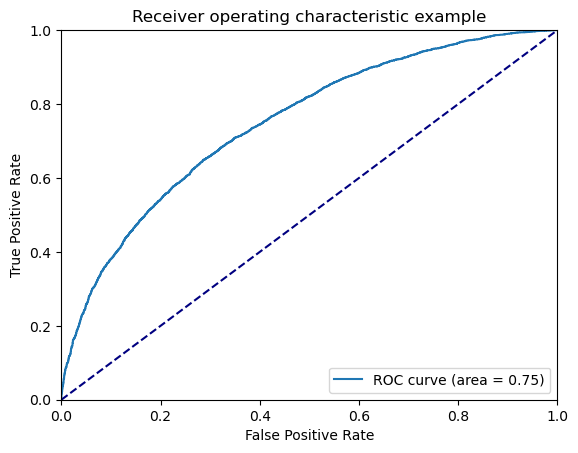

In [216]:
load_best_model_and_evaluate(path_model, test_ds)

#### Experiment Remove some layers ---> Block 2

In [217]:
base_model = tf.keras.applications.xception.Xception(input_shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS),
        weights='imagenet',  # load the network pretrained on ImageNet1K
        include_top=False)

base_model.trainable = False

print('Number of layers Xception: ', len(base_model.layers))
base_model.summary()

Number of layers Xception:  132
Model: "xception"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_9 (InputLayer)           [(None, 240, 240, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 119, 119, 32  864         ['input_9[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv1_bn (BatchNormaliz  (None, 119, 119, 32  128        ['block1_conv1[0][0]']           
 ation)                         )                          

In [218]:
index = 0
for i, layer in enumerate(base_model.layers):
    if layer.name == "block6_sepconv1_act":
        index = i
        break

base_model_cutted = tf.keras.Model(base_model.input, base_model.layers[index].output, name='xception_cut')

base_model_cutted.summary()

Model: "xception_cut"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_9 (InputLayer)           [(None, 240, 240, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 119, 119, 32  864         ['input_9[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv1_bn (BatchNormaliz  (None, 119, 119, 32  128        ['block1_conv1[0][0]']           
 ation)                         )                                                      

In [219]:
inputs = tf.keras.Input(shape=INPUT_SHAPE)
x = tf.keras.applications.mobilenet_v2.preprocess_input(inputs)
x = base_model_cutted(x)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.3)(x)
outputs = layers.Dense(NUM_CLASSES, activation="softmax")(x)
model = tf.keras.Model(inputs, outputs)

In [220]:
LR = 0.0002
compile_model(model, 'adam', LR)

Model: "model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_10 (InputLayer)       [(None, 240, 240, 3)]     0         
                                                                 
 tf.math.truediv_5 (TFOpLamb  (None, 240, 240, 3)      0         
 da)                                                             
                                                                 
 tf.math.subtract_5 (TFOpLam  (None, 240, 240, 3)      0         
 bda)                                                            
                                                                 
 xception_cut (Functional)   (None, 15, 15, 728)       2731968   
                                                                 
 global_average_pooling2d_4   (None, 728)              0         
 (GlobalAveragePooling2D)                                        
                                                           

In [221]:
path_model = general_path_models+'/binary_models_sc/pretrained_REMOVE_LAYER_block6sep_xception_no_tuning_dp_epoch_40_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model,40,10)

Epoch 1/40
626/627 [============================>.] - ETA: 0s - loss: 0.6523 - accuracy: 0.6201
Epoch 00001: val_loss improved from inf to 0.65177, saving model to ./binary_models_sc\pretrained_REMOVE_LAYER_block6sep_xception_no_tuning_dp_epoch_40_adam_1e-4.h5
627/627 [==============================] - 180s 282ms/step - loss: 0.6523 - accuracy: 0.6201 - val_loss: 0.6518 - val_accuracy: 0.6261
Epoch 2/40

c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\engine\functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)



626/627 [============================>.] - ETA: 0s - loss: 0.6299 - accuracy: 0.6418
Epoch 00002: val_loss improved from 0.65177 to 0.61744, saving model to ./binary_models_sc\pretrained_REMOVE_LAYER_block6sep_xception_no_tuning_dp_epoch_40_adam_1e-4.h5
627/627 [==============================] - 178s 281ms/step - loss: 0.6299 - accuracy: 0.6418 - val_loss: 0.6174 - val_accuracy: 0.6571
Epoch 3/40
626/627 [============================>.] - ETA: 0s - loss: 0.6252 - accuracy: 0.6481
Epoch 00003: val_loss improved from 0.61744 to 0.61346, saving model to ./binary_models_sc\pretrained_REMOVE_LAYER_block6sep_xception_no_tuning_dp_epoch_40_adam_1e-4.h5
627/627 [==============================] - 179s 281ms/step - loss: 0.6252 - accuracy: 0.6482 - val_loss: 0.6135 - val_accuracy: 0.6615
Epoch 4/40
626/627 [============================>.] - ETA: 0s - loss: 0.6187 - accuracy: 0.6520
Epoch 00004: val_loss improved from 0.61346 to 0.61007, saving model to ./binary_models_sc\pretrained_REMOVE_LAYER

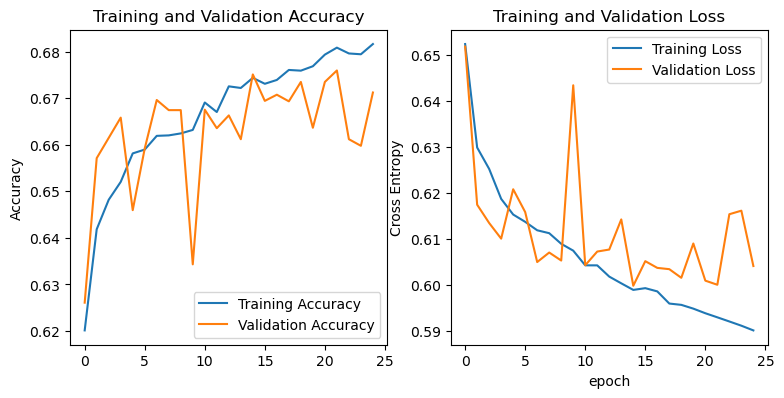

In [222]:
show_history_fit(history)

165/165 [==============================] - 37s 208ms/step - loss: 0.6049 - accuracy: 0.6652
tf.Tensor([1 1 0 ... 1 0 0], shape=(10532,), dtype=int64)
tf.Tensor([0 1 0 ... 1 0 1], shape=(10532,), dtype=int32)
(10532,) (10532,)
Classification report: 
              precision    recall  f1-score   support

           0     0.6349    0.6462    0.6405      4858
           1     0.6924    0.6819    0.6871      5674

    accuracy                         0.6654     10532
   macro avg     0.6636    0.6640    0.6638     10532
weighted avg     0.6659    0.6654    0.6656     10532

ROC Curve:


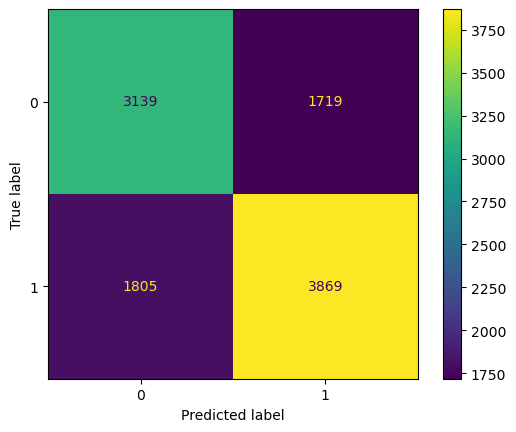

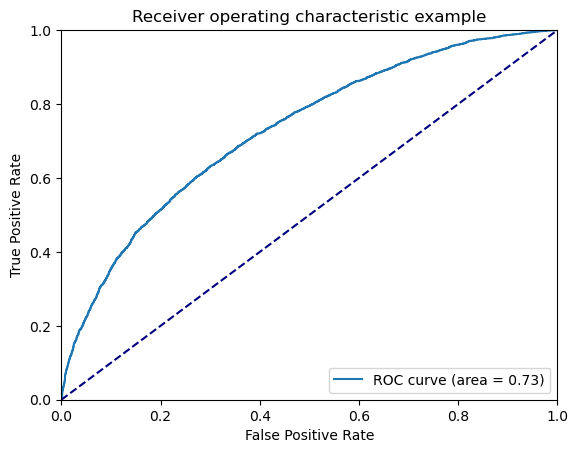

In [223]:
load_best_model_and_evaluate(path_model, test_ds)

#### Experiment Fine Tuning -- EXTRA

In [18]:
LR = 0.0001
path_model = general_path_models+'/binary_models_sc/pretrained_XCEPTION_no_tuning_512_dp_epoch_40_adam_1e-4.h5'
model_finetune = tf.keras.models.load_model(path_model)
model_finetune.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.math.truediv (TFOpLambda  (None, 250, 250, 3)      0         
 )                                                               
                                                                 
 tf.math.subtract (TFOpLambd  (None, 250, 250, 3)      0         
 a)                                                              
                                                                 
 xception (Functional)       (None, 8, 8, 2048)        20861480  
                                                                 
 global_average_pooling2d (G  (None, 2048)             0         
 lobalAveragePooling2D)                                          
                                                             

In [19]:
model_finetune.trainable = True

base_model_xception = model_finetune.get_layer("xception") # change the name looking at the summary IMPORTANT!
print("Number of layers in the base model: ", len(base_model_xception.layers))
base_model_xception.summary()

Number of layers in the base model:  132
Model: "xception"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 250, 250, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 124, 124, 32  864         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv1_bn (BatchNormaliz  (None, 124, 124, 32  128        ['block1_conv1[0][0]']           
 ation)                         )                 

In [20]:
num_layer_trainable = 102

#start_layer_to_train = len(base_model_resnet50.layers) - num_layer_trainable

for layer in base_model_xception.layers[:num_layer_trainable]:
    #if layer.name.endswith('bn'):
    layer.trainable = False
    #else:
    #    layer.trainable = True

for layer in base_model_xception.layers[num_layer_trainable:]:
    if layer.name.endswith('bn'):
        layer.trainable = False
    else:
        layer.trainable = True


model_finetune.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.math.truediv (TFOpLambda  (None, 250, 250, 3)      0         
 )                                                               
                                                                 
 tf.math.subtract (TFOpLambd  (None, 250, 250, 3)      0         
 a)                                                              
                                                                 
 xception (Functional)       (None, 8, 8, 2048)        20861480  
                                                                 
 global_average_pooling2d (G  (None, 2048)             0         
 lobalAveragePooling2D)                                          
                                                             

In [21]:
compile_model(model_finetune, 'adam', LR)

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.math.truediv (TFOpLambda  (None, 250, 250, 3)      0         
 )                                                               
                                                                 
 tf.math.subtract (TFOpLambd  (None, 250, 250, 3)      0         
 a)                                                              
                                                                 
 xception (Functional)       (None, 8, 8, 2048)        20861480  
                                                                 
 global_average_pooling2d (G  (None, 2048)             0         
 lobalAveragePooling2D)                                          
                                                             

In [22]:
path_model_tuned = general_path_models+'/binary_models_sc/pretrained_XCEPTION_FINE_tuning_512_dp_epoch_40_adam_1e-4.h5'
history_tune, model_fitted_tuned = fit_model(model_finetune, train_ds, val_ds, path_model_tuned,40,5)

Epoch 1/40
627/627 [==============================] - ETA: 0s - loss: 0.5960 - accuracy: 0.6810
Epoch 00001: val_loss improved from inf to 0.57763, saving model to ./binary_models_sc\pretrained_XCEPTION_FINE_tuning_512_dp_epoch_40_adam_1e-4.h5


c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\engine\functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


627/627 [==============================] - 219s 344ms/step - loss: 0.5960 - accuracy: 0.6810 - val_loss: 0.5776 - val_accuracy: 0.6950
Epoch 2/40
627/627 [==============================] - ETA: 0s - loss: 0.5038 - accuracy: 0.7489
Epoch 00002: val_loss did not improve from 0.57763
627/627 [==============================] - 206s 326ms/step - loss: 0.5038 - accuracy: 0.7489 - val_loss: 0.6207 - val_accuracy: 0.6795
Epoch 3/40
627/627 [==============================] - ETA: 0s - loss: 0.3084 - accuracy: 0.8613
Epoch 00003: val_loss did not improve from 0.57763
627/627 [==============================] - 205s 326ms/step - loss: 0.3084 - accuracy: 0.8613 - val_loss: 0.7919 - val_accuracy: 0.6632
Epoch 4/40
627/627 [==============================] - ETA: 0s - loss: 0.1246 - accuracy: 0.9526
Epoch 00004: val_loss did not improve from 0.57763
627/627 [==============================] - 209s 332ms/step - loss: 0.1246 - accuracy: 0.9526 - val_loss: 1.1231 - val_accuracy: 0.6474
Epoch 5/40
627/627 

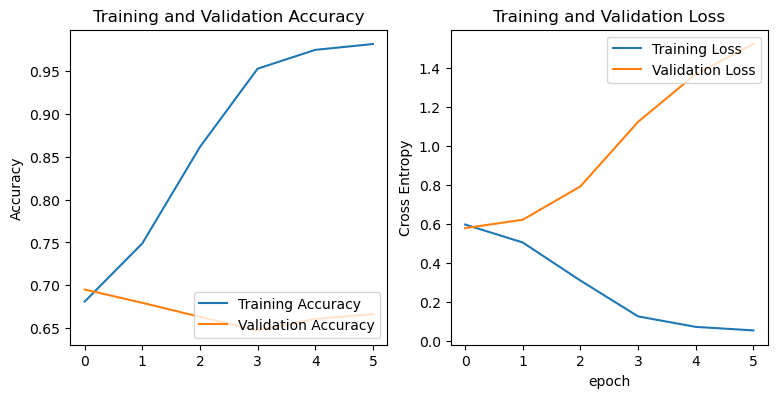

In [23]:
show_history_fit(history_tune)

165/165 [==============================] - 38s 207ms/step - loss: 0.5853 - accuracy: 0.6915
tf.Tensor([0 0 0 ... 0 0 1], shape=(10532,), dtype=int64)
tf.Tensor([0 1 0 ... 0 0 1], shape=(10532,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.6745    0.6404    0.6570      4858
           1     0.7049    0.7355    0.7199      5674

    accuracy                         0.6916     10532
   macro avg     0.6897    0.6879    0.6884     10532
weighted avg     0.6909    0.6916    0.6909     10532



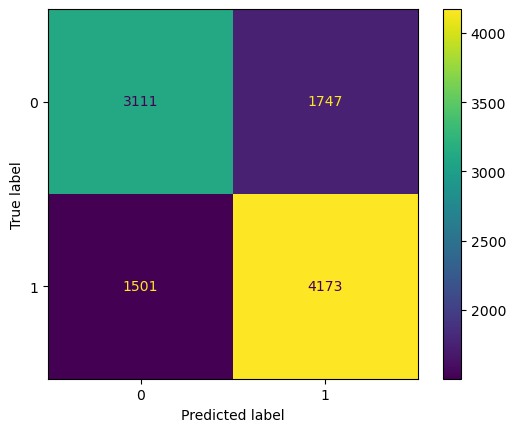

In [24]:
load_best_model_and_evaluate(path_model_tuned, test_ds)

### Extra Pretrained Network

### InceptionV3

#### Experiment 1:

In [11]:
base_model = tf.keras.applications.inception_v3.InceptionV3(input_shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS),
        weights='imagenet',  # load the network pretrained on ImageNet1K
        include_top=False)

base_model.trainable = False

print('Number of layers Xception: ', len(base_model.layers))
base_model.summary()

Number of layers Xception:  311
Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 250, 250, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 124, 124, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 124, 124, 32  96         ['conv2d[0][0]']                 
 alization)                     )                      

In [13]:
inputs = tf.keras.Input(shape=INPUT_SHAPE)
x = tf.keras.applications.inception_v3.preprocess_input(inputs)
x = base_model(x)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(512)(x)
x = layers.Dropout(0.4)(x)
outputs = layers.Dense(NUM_CLASSES, activation="softmax")(x)
model = tf.keras.Model(inputs, outputs)

model.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.math.truediv_1 (TFOpLamb  (None, 250, 250, 3)      0         
 da)                                                             
                                                                 
 tf.math.subtract_1 (TFOpLam  (None, 250, 250, 3)      0         
 bda)                                                            
                                                                 
 inception_v3 (Functional)   (None, 6, 6, 2048)        21802784  
                                                                 
 global_average_pooling2d_1   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                           

In [14]:
LR = 0.0001
compile_model(model, 'adam', LR)

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.math.truediv_1 (TFOpLamb  (None, 250, 250, 3)      0         
 da)                                                             
                                                                 
 tf.math.subtract_1 (TFOpLam  (None, 250, 250, 3)      0         
 bda)                                                            
                                                                 
 inception_v3 (Functional)   (None, 6, 6, 2048)        21802784  
                                                                 
 global_average_pooling2d_1   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                           

In [15]:
path_model = general_path_models+'/binary_models_sc/pretrained_INCEPTIONV3_no_tuning_512_dp_epoch_40_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model,40,5)

Epoch 1/40
627/627 [==============================] - ETA: 0s - loss: 0.7754 - accuracy: 0.6110
Epoch 00001: val_loss improved from inf to 0.63968, saving model to ./binary_models_sc\pretrained_INCEPTIONV3_no_tuning_512_dp_epoch_40_adam_1e-4.h5
627/627 [==============================] - 108s 157ms/step - loss: 0.7754 - accuracy: 0.6110 - val_loss: 0.6397 - val_accuracy: 0.6565
Epoch 2/40
626/627 [============================>.] - ETA: 0s - loss: 0.6982 - accuracy: 0.6347
Epoch 00002: val_loss improved from 0.63968 to 0.61578, saving model to ./binary_models_sc\pretrained_INCEPTIONV3_no_tuning_512_dp_epoch_40_adam_1e-4.h5
627/627 [==============================] - 101s 159ms/step - loss: 0.6981 - accuracy: 0.6349 - val_loss: 0.6158 - val_accuracy: 0.6698
Epoch 3/40
626/627 [============================>.] - ETA: 0s - loss: 0.6686 - accuracy: 0.6418
Epoch 00003: val_loss did not improve from 0.61578
627/627 [==============================] - 101s 159ms/step - loss: 0.6686 - accuracy: 0.6

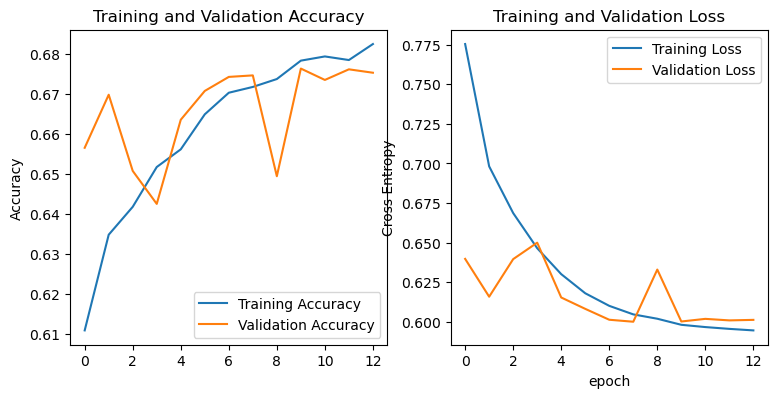

In [16]:
show_history_fit(history)

165/165 [==============================] - 23s 125ms/step - loss: 0.6072 - accuracy: 0.6634
tf.Tensor([1 1 1 ... 0 1 0], shape=(10532,), dtype=int64)
tf.Tensor([0 1 1 ... 1 0 0], shape=(10532,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.6499    0.5858    0.6162      4858
           1     0.6730    0.7298    0.7003      5674

    accuracy                         0.6634     10532
   macro avg     0.6615    0.6578    0.6582     10532
weighted avg     0.6624    0.6634    0.6615     10532



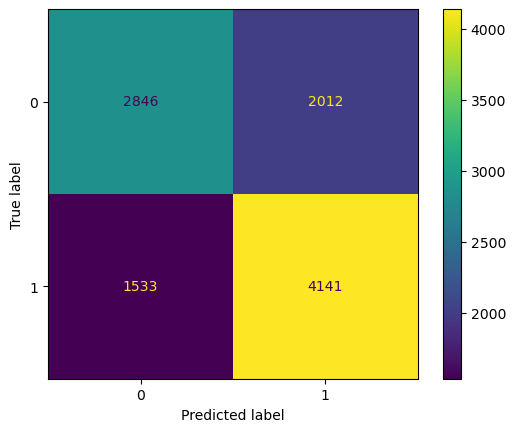

In [17]:
load_best_model_and_evaluate(path_model, test_ds)

#### Experiment 2:

In [11]:
LR = 0.0001
path_model = general_path_models+'/binary_models_sc/pretrained_INCEPTIONV3_no_tuning_512_dp_epoch_40_adam_1e-4.h5'
model_finetune = tf.keras.models.load_model(path_model)
model_finetune.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.math.truediv_1 (TFOpLamb  (None, 250, 250, 3)      0         
 da)                                                             
                                                                 
 tf.math.subtract_1 (TFOpLam  (None, 250, 250, 3)      0         
 bda)                                                            
                                                                 
 inception_v3 (Functional)   (None, 6, 6, 2048)        21802784  
                                                                 
 global_average_pooling2d_1   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                           

In [12]:
model_finetune.trainable = True

base_model_inception_v3 = model_finetune.get_layer("inception_v3") # change the name looking at the summary IMPORTANT!
print("Number of layers in the base model: ", len(base_model_inception_v3.layers))
base_model_inception_v3.summary()

Number of layers in the base model:  311
Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 250, 250, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 124, 124, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 124, 124, 32  96         ['conv2d[0][0]']                 
 alization)                     )             

In [13]:
num_layer_trainable = 300

#start_layer_to_train = len(base_model_resnet50.layers) - num_layer_trainable

for layer in base_model_inception_v3.layers[:num_layer_trainable]:
    #if layer.name.endswith('bn'):
    layer.trainable = False
    #else:
    #    layer.trainable = True

for layer in base_model_inception_v3.layers[num_layer_trainable:]:
    if layer.name.endswith('BN'):
        layer.trainable = False
    else:
        layer.trainable = True


model_finetune.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.math.truediv_1 (TFOpLamb  (None, 250, 250, 3)      0         
 da)                                                             
                                                                 
 tf.math.subtract_1 (TFOpLam  (None, 250, 250, 3)      0         
 bda)                                                            
                                                                 
 inception_v3 (Functional)   (None, 6, 6, 2048)        21802784  
                                                                 
 global_average_pooling2d_1   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                           

In [14]:
compile_model(model_finetune, 'adam', LR)

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.math.truediv_1 (TFOpLamb  (None, 250, 250, 3)      0         
 da)                                                             
                                                                 
 tf.math.subtract_1 (TFOpLam  (None, 250, 250, 3)      0         
 bda)                                                            
                                                                 
 inception_v3 (Functional)   (None, 6, 6, 2048)        21802784  
                                                                 
 global_average_pooling2d_1   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                           

In [15]:
path_model_tuned = general_path_models+'/binary_models_sc/pretrained_INCEPTIONV3_FINE_tuning_512_dp_epoch_40_adam_1e-4.h5'
history_tune, model_fitted_tuned = fit_model(model_finetune, train_ds, val_ds, path_model_tuned,40,5)

Epoch 1/40
627/627 [==============================] - ETA: 0s - loss: 0.5975 - accuracy: 0.6757
Epoch 00001: val_loss improved from inf to 0.60732, saving model to ./binary_models_sc\pretrained_INCEPTIONV3_FINE_tuning_512_dp_epoch_40_adam_1e-4.h5
627/627 [==============================] - 166s 249ms/step - loss: 0.5975 - accuracy: 0.6757 - val_loss: 0.6073 - val_accuracy: 0.6687
Epoch 2/40
626/627 [============================>.] - ETA: 0s - loss: 0.5932 - accuracy: 0.6815
Epoch 00002: val_loss improved from 0.60732 to 0.60210, saving model to ./binary_models_sc\pretrained_INCEPTIONV3_FINE_tuning_512_dp_epoch_40_adam_1e-4.h5
627/627 [==============================] - 164s 258ms/step - loss: 0.5931 - accuracy: 0.6816 - val_loss: 0.6021 - val_accuracy: 0.6750
Epoch 3/40
626/627 [============================>.] - ETA: 0s - loss: 0.5923 - accuracy: 0.6847
Epoch 00003: val_loss did not improve from 0.60210
627/627 [==============================] - 152s 241ms/step - loss: 0.5923 - accuracy:

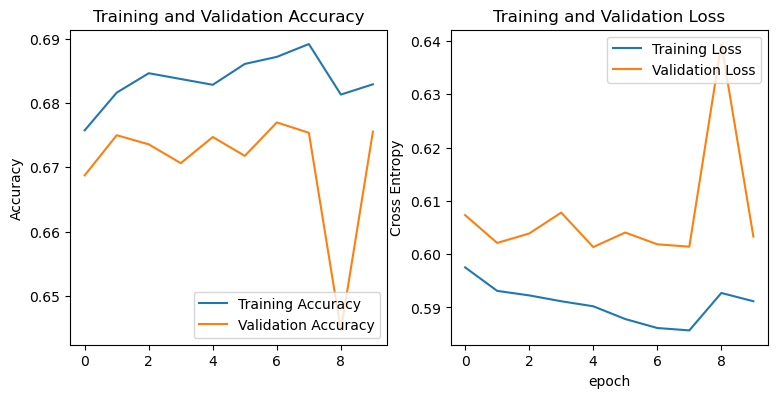

In [16]:
show_history_fit(history_tune)

165/165 [==============================] - 22s 123ms/step - loss: 0.6077 - accuracy: 0.6639
tf.Tensor([1 1 1 ... 0 1 0], shape=(10532,), dtype=int64)
tf.Tensor([0 1 1 ... 1 0 0], shape=(10532,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.6406    0.6190    0.6296      4858
           1     0.6829    0.7027    0.6927      5674

    accuracy                         0.6641     10532
   macro avg     0.6618    0.6608    0.6611     10532
weighted avg     0.6634    0.6641    0.6636     10532



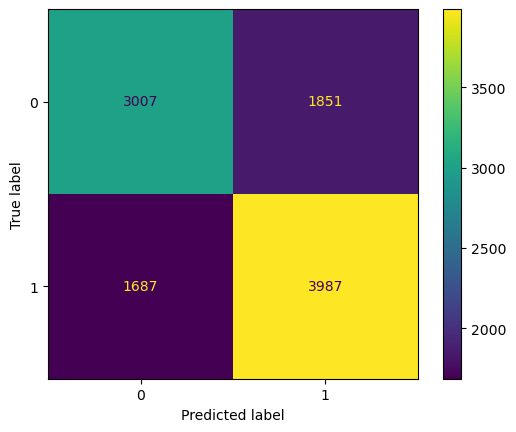

In [17]:
load_best_model_and_evaluate(path_model_tuned, test_ds)

## Experiment on From Scratch Networks to mitigate the Overfitting

Use the same Networks seen in previous section but adding some layers or applying dropout on other layers

### Experiment 0

In [20]:
input = tf.keras.Input(shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS))
x = layers.Rescaling(1./255)(input)
x = layers.Conv2D(32, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((5, 5))(x)
x = layers.Conv2D(64, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((5, 5))(x)
x = layers.Conv2D(128, (3, 3), activation='relu')(x)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.4)(x)
x = layers.Dense(128, activation='relu')(x)
x = layers.Dropout(0.4)(x)
output = layers.Dense(NUM_CLASSES, activation='softmax')(x)
model = tf.keras.Model(inputs=input, outputs = output)

compile_model(model, 'adam', 0.0001)

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 rescaling_2 (Rescaling)     (None, 250, 250, 3)       0         
                                                                 
 conv2d_6 (Conv2D)           (None, 248, 248, 32)      896       
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 49, 49, 32)       0         
 2D)                                                             
                                                                 
 conv2d_7 (Conv2D)           (None, 47, 47, 64)        18496     
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 9, 9, 64)         0         
 2D)                                                       

In [16]:
path_model = general_path_models+'/extra_binary_models_sc/ex0_scratch_dpplus_32_128_epoch_30_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model, epochs_par=40, patience_par=5)

Epoch 1/40
626/627 [============================>.] - ETA: 0s - loss: 0.6889 - accuracy: 0.5375
Epoch 00001: val_loss improved from inf to 0.67525, saving model to ./extra_binary_models_sc\ex0_scratch_dpplus_32_128_epoch_30_adam_1e-4.h5
627/627 [==============================] - 87s 136ms/step - loss: 0.6889 - accuracy: 0.5375 - val_loss: 0.6753 - val_accuracy: 0.5842
Epoch 2/40
626/627 [============================>.] - ETA: 0s - loss: 0.6716 - accuracy: 0.5866
Epoch 00002: val_loss improved from 0.67525 to 0.65933, saving model to ./extra_binary_models_sc\ex0_scratch_dpplus_32_128_epoch_30_adam_1e-4.h5
627/627 [==============================] - 85s 135ms/step - loss: 0.6715 - accuracy: 0.5866 - val_loss: 0.6593 - val_accuracy: 0.6117
Epoch 3/40
626/627 [============================>.] - ETA: 0s - loss: 0.6605 - accuracy: 0.6056
Epoch 00003: val_loss improved from 0.65933 to 0.65083, saving model to ./extra_binary_models_sc\ex0_scratch_dpplus_32_128_epoch_30_adam_1e-4.h5
627/627 [====

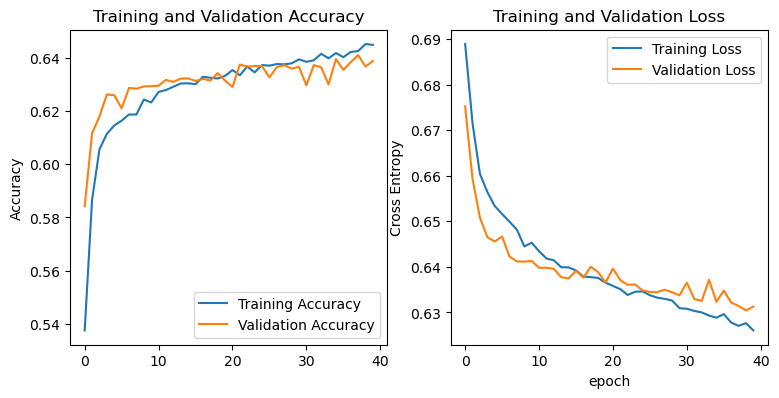

In [17]:
show_history_fit(history)

165/165 [==============================] - 18s 102ms/step - loss: 0.6323 - accuracy: 0.6331
tf.Tensor([0 0 0 ... 0 1 1], shape=(10532,), dtype=int64)
tf.Tensor([0 1 0 ... 0 0 1], shape=(10532,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.5951    0.6404    0.6169      4858
           1     0.6706    0.6269    0.6480      5674

    accuracy                         0.6331     10532
   macro avg     0.6328    0.6336    0.6325     10532
weighted avg     0.6358    0.6331    0.6337     10532



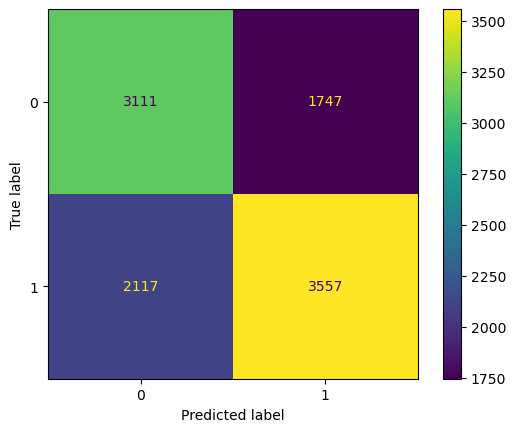

In [18]:
load_best_model_and_evaluate(path_model, test_ds)

In [21]:
path_model = general_path_models+'/extra_binary_models_sc/ex0_scratch_dpplus2_32_128_epoch_30_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model, epochs_par=60, patience_par=8)

Epoch 1/60
626/627 [============================>.] - ETA: 0s - loss: 0.6871 - accuracy: 0.5431
Epoch 00001: val_loss improved from inf to 0.67126, saving model to ./extra_binary_models_sc\ex0_scratch_dpplus2_32_128_epoch_30_adam_1e-4.h5
627/627 [==============================] - 89s 139ms/step - loss: 0.6871 - accuracy: 0.5431 - val_loss: 0.6713 - val_accuracy: 0.5911
Epoch 2/60
626/627 [============================>.] - ETA: 0s - loss: 0.6687 - accuracy: 0.5906
Epoch 00002: val_loss improved from 0.67126 to 0.65719, saving model to ./extra_binary_models_sc\ex0_scratch_dpplus2_32_128_epoch_30_adam_1e-4.h5
627/627 [==============================] - 88s 139ms/step - loss: 0.6686 - accuracy: 0.5906 - val_loss: 0.6572 - val_accuracy: 0.6115
Epoch 3/60
626/627 [============================>.] - ETA: 0s - loss: 0.6599 - accuracy: 0.6044
Epoch 00003: val_loss improved from 0.65719 to 0.64917, saving model to ./extra_binary_models_sc\ex0_scratch_dpplus2_32_128_epoch_30_adam_1e-4.h5
627/627 [=

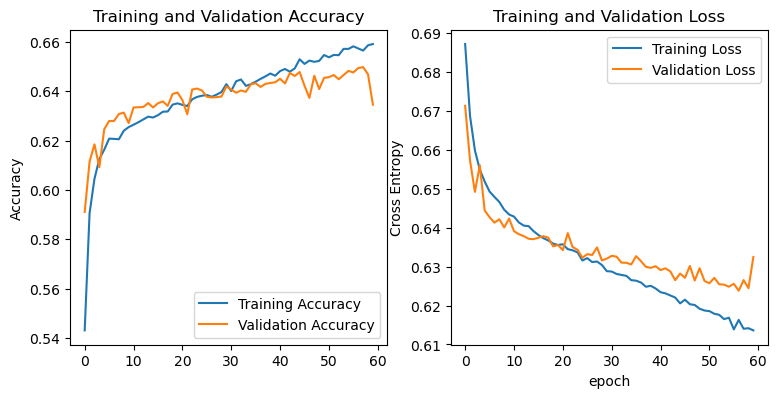

In [24]:
show_history_fit(history)

165/165 [==============================] - 18s 102ms/step - loss: 0.6284 - accuracy: 0.6375
tf.Tensor([1 0 0 ... 1 0 1], shape=(10532,), dtype=int64)
tf.Tensor([1 0 1 ... 1 0 1], shape=(10532,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.6099    0.5939    0.6018      4858
           1     0.6599    0.6748    0.6673      5674

    accuracy                         0.6375     10532
   macro avg     0.6349    0.6343    0.6345     10532
weighted avg     0.6369    0.6375    0.6371     10532



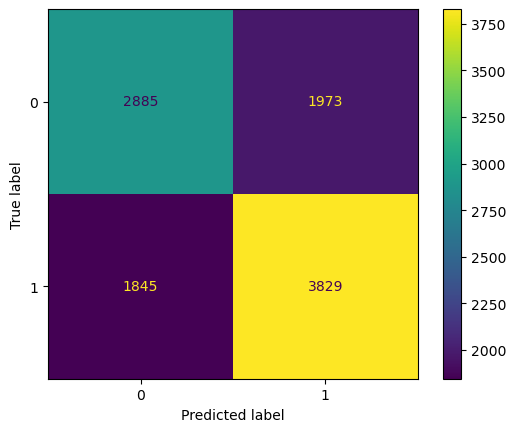

In [23]:
load_best_model_and_evaluate(path_model, test_ds)

### Experiment 1

In [25]:
input = tf.keras.Input(shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS))
x = layers.Rescaling(1./255)(input)


x = layers.Conv2D(32, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(64, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(128, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.4)(x)
output = layers.Dense(NUM_CLASSES, activation='softmax')(x)

model = tf.keras.Model(inputs=input, outputs = output)

compile_model(model, 'adam', 0.0001)

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 rescaling_3 (Rescaling)     (None, 250, 250, 3)       0         
                                                                 
 conv2d_9 (Conv2D)           (None, 248, 248, 32)      896       
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 124, 124, 32)     0         
 2D)                                                             
                                                                 
 conv2d_10 (Conv2D)          (None, 122, 122, 64)      18496     
                                                                 
 max_pooling2d_7 (MaxPooling  (None, 61, 61, 64)       0         
 2D)                                                       

In [26]:
path_model = general_path_models+'/extra_binary_models_sc/ex1_scratch_32_2x256_epoch_30_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model)

Epoch 1/30
627/627 [==============================] - ETA: 0s - loss: 0.6764 - accuracy: 0.5718
Epoch 00001: val_loss improved from inf to 0.66415, saving model to ./extra_binary_models_sc\ex1_scratch_32_2x256_epoch_30_adam_1e-4.h5
627/627 [==============================] - 97s 151ms/step - loss: 0.6764 - accuracy: 0.5718 - val_loss: 0.6641 - val_accuracy: 0.5977
Epoch 2/30
626/627 [============================>.] - ETA: 0s - loss: 0.6624 - accuracy: 0.5998
Epoch 00002: val_loss improved from 0.66415 to 0.65555, saving model to ./extra_binary_models_sc\ex1_scratch_32_2x256_epoch_30_adam_1e-4.h5
627/627 [==============================] - 100s 158ms/step - loss: 0.6624 - accuracy: 0.5999 - val_loss: 0.6555 - val_accuracy: 0.6155
Epoch 3/30
626/627 [============================>.] - ETA: 0s - loss: 0.6570 - accuracy: 0.6073
Epoch 00003: val_loss did not improve from 0.65555
627/627 [==============================] - 101s 160ms/step - loss: 0.6570 - accuracy: 0.6072 - val_loss: 0.6664 - va

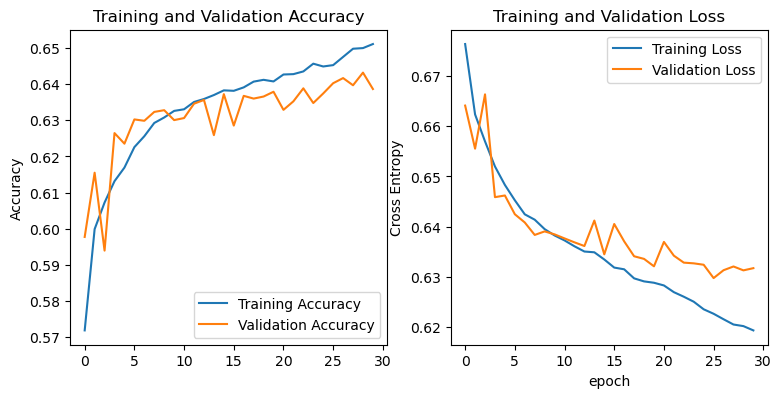

In [27]:
show_history_fit(history)

165/165 [==============================] - 21s 117ms/step - loss: 0.6356 - accuracy: 0.6326
tf.Tensor([1 1 1 ... 0 0 1], shape=(10532,), dtype=int64)
tf.Tensor([1 1 1 ... 1 0 1], shape=(10532,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.5983    0.6198    0.6088      4858
           1     0.6641    0.6436    0.6537      5674

    accuracy                         0.6326     10532
   macro avg     0.6312    0.6317    0.6313     10532
weighted avg     0.6337    0.6326    0.6330     10532



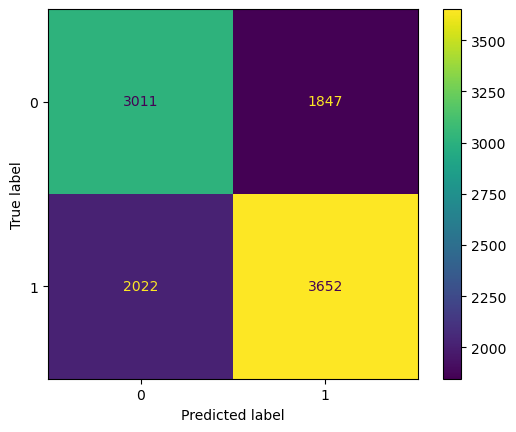

In [28]:
load_best_model_and_evaluate(path_model, test_ds)

In [12]:
input = tf.keras.Input(shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS))
x = layers.Rescaling(1./255)(input)


x = layers.Conv2D(32, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(64, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(128, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.4)(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.3)(x)
output = layers.Dense(NUM_CLASSES, activation='softmax')(x)

model = tf.keras.Model(inputs=input, outputs = output)

compile_model(model, 'adam', 0.0001)

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 rescaling (Rescaling)       (None, 250, 250, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 248, 248, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 124, 124, 32)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 122, 122, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 61, 61, 64)       0         
 2D)                                                         

In [15]:
path_model = general_path_models+'/extra_binary_models_sc/ex1_bis_scratch_32_2x256_epoch_30_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model)

Epoch 1/30
627/627 [==============================] - ETA: 0s - loss: 0.6768 - accuracy: 0.5663
Epoch 00001: val_loss improved from inf to 0.66361, saving model to ./extra_binary_models_sc\ex1_bis_scratch_32_2x256_epoch_30_adam_1e-4.h5
627/627 [==============================] - 103s 159ms/step - loss: 0.6768 - accuracy: 0.5663 - val_loss: 0.6636 - val_accuracy: 0.6005
Epoch 2/30
626/627 [============================>.] - ETA: 0s - loss: 0.6622 - accuracy: 0.6027
Epoch 00002: val_loss improved from 0.66361 to 0.65392, saving model to ./extra_binary_models_sc\ex1_bis_scratch_32_2x256_epoch_30_adam_1e-4.h5
627/627 [==============================] - 102s 161ms/step - loss: 0.6622 - accuracy: 0.6027 - val_loss: 0.6539 - val_accuracy: 0.6166
Epoch 3/30
626/627 [============================>.] - ETA: 0s - loss: 0.6553 - accuracy: 0.6134
Epoch 00003: val_loss improved from 0.65392 to 0.65096, saving model to ./extra_binary_models_sc\ex1_bis_scratch_32_2x256_epoch_30_adam_1e-4.h5
627/627 [=====

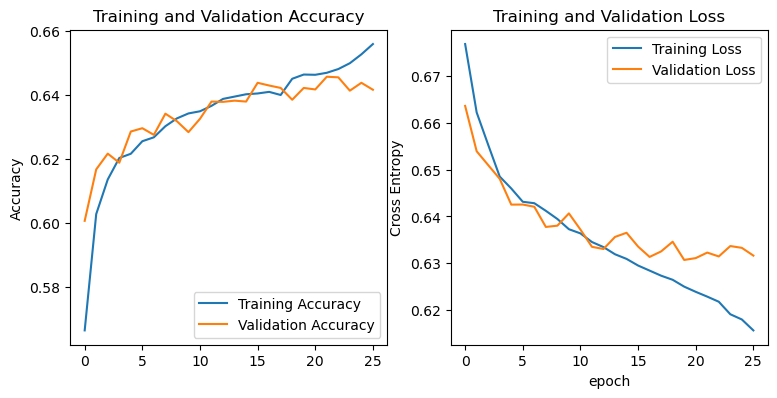

In [16]:
show_history_fit(history)

165/165 [==============================] - 19s 109ms/step - loss: 0.6358 - accuracy: 0.6338
tf.Tensor([0 0 0 ... 0 1 1], shape=(10532,), dtype=int64)
tf.Tensor([0 1 0 ... 0 0 1], shape=(10532,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.6009    0.6136    0.6072      4858
           1     0.6631    0.6510    0.6570      5674

    accuracy                         0.6338     10532
   macro avg     0.6320    0.6323    0.6321     10532
weighted avg     0.6344    0.6338    0.6340     10532



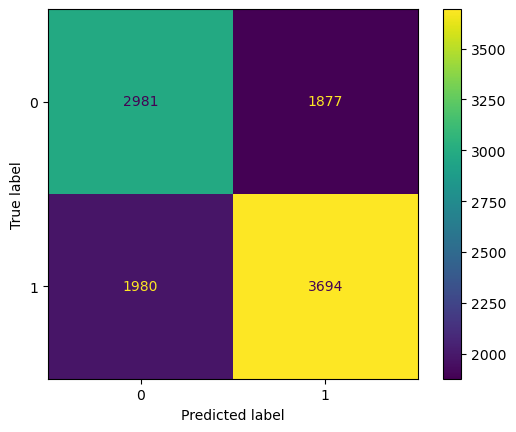

In [17]:
load_best_model_and_evaluate(path_model, test_ds)

### Experiment 2

In [18]:
input = tf.keras.Input(shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS))
x = layers.Rescaling(1./255)(input)
x = layers.Conv2D(32, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(64, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(128, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(512, (3, 3), activation='relu')(x)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.4)(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.3)(x)
output = layers.Dense(NUM_CLASSES, activation='softmax')(x)

model = tf.keras.Model(inputs=input, outputs = output)

compile_model(model, 'adam', 0.0001)

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 rescaling_1 (Rescaling)     (None, 250, 250, 3)       0         
                                                                 
 conv2d_5 (Conv2D)           (None, 248, 248, 32)      896       
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 124, 124, 32)     0         
 2D)                                                             
                                                                 
 conv2d_6 (Conv2D)           (None, 122, 122, 64)      18496     
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 61, 61, 64)       0         
 2D)                                                       

In [19]:
path_model = general_path_models+'/extra_binary_models_sc/ex2_scratch_DP_32_2x256_512_dp_epoch_30_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model)

Epoch 1/30
627/627 [==============================] - ETA: 0s - loss: 0.6784 - accuracy: 0.5659
Epoch 00001: val_loss improved from inf to 0.67022, saving model to ./extra_binary_models_sc\ex2_scratch_DP_32_2x256_512_dp_epoch_30_adam_1e-4.h5
627/627 [==============================] - 154s 242ms/step - loss: 0.6784 - accuracy: 0.5659 - val_loss: 0.6702 - val_accuracy: 0.5851
Epoch 2/30
626/627 [============================>.] - ETA: 0s - loss: 0.6635 - accuracy: 0.5986
Epoch 00002: val_loss improved from 0.67022 to 0.65327, saving model to ./extra_binary_models_sc\ex2_scratch_DP_32_2x256_512_dp_epoch_30_adam_1e-4.h5
627/627 [==============================] - 175s 276ms/step - loss: 0.6635 - accuracy: 0.5987 - val_loss: 0.6533 - val_accuracy: 0.6081
Epoch 3/30
626/627 [============================>.] - ETA: 0s - loss: 0.6528 - accuracy: 0.6127
Epoch 00003: val_loss improved from 0.65327 to 0.64204, saving model to ./extra_binary_models_sc\ex2_scratch_DP_32_2x256_512_dp_epoch_30_adam_1e-4

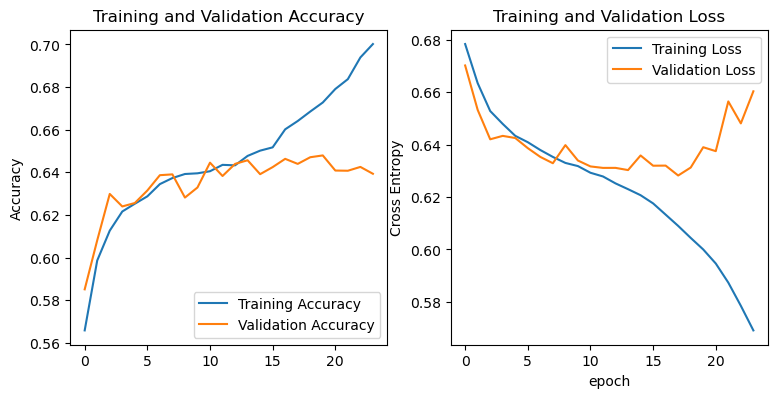

In [20]:
show_history_fit(history)

165/165 [==============================] - 19s 111ms/step - loss: 0.6344 - accuracy: 0.6449
tf.Tensor([1 0 0 ... 1 0 1], shape=(10532,), dtype=int64)
tf.Tensor([1 0 1 ... 1 0 1], shape=(10532,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.6275    0.5663    0.5953      4858
           1     0.6573    0.7122    0.6836      5674

    accuracy                         0.6449     10532
   macro avg     0.6424    0.6392    0.6395     10532
weighted avg     0.6436    0.6449    0.6429     10532



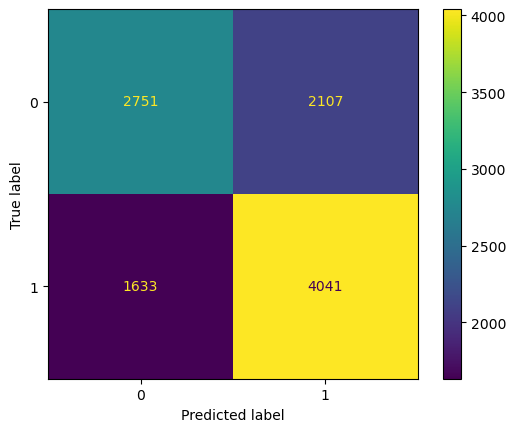

In [21]:
load_best_model_and_evaluate(path_model, test_ds)

In [22]:
input = tf.keras.Input(shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS))
x = layers.Rescaling(1./255)(input)
x = layers.Conv2D(32, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(64, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(128, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(512, (3, 3), activation='relu')(x)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.4)(x)
x = layers.Dense(1024, activation='relu')(x)
x = layers.Dropout(0.4)(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.3)(x)
output = layers.Dense(NUM_CLASSES, activation='softmax')(x)

model = tf.keras.Model(inputs=input, outputs = output)

compile_model(model, 'adam', 0.0001)

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 rescaling_2 (Rescaling)     (None, 250, 250, 3)       0         
                                                                 
 conv2d_11 (Conv2D)          (None, 248, 248, 32)      896       
                                                                 
 max_pooling2d_7 (MaxPooling  (None, 124, 124, 32)     0         
 2D)                                                             
                                                                 
 conv2d_12 (Conv2D)          (None, 122, 122, 64)      18496     
                                                                 
 max_pooling2d_8 (MaxPooling  (None, 61, 61, 64)       0         
 2D)                                                       

In [23]:
path_model = general_path_models+'/extra_binary_models_sc/ex2_scratch_DP_bis_32_2x256_512_dp_epoch_30_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model)

Epoch 1/30
626/627 [============================>.] - ETA: 0s - loss: 0.6832 - accuracy: 0.5566
Epoch 00001: val_loss improved from inf to 0.65978, saving model to ./extra_binary_models_sc\ex2_scratch_DP_bis_32_2x256_512_dp_epoch_30_adam_1e-4.h5
627/627 [==============================] - 97s 152ms/step - loss: 0.6832 - accuracy: 0.5567 - val_loss: 0.6598 - val_accuracy: 0.6089
Epoch 2/30
626/627 [============================>.] - ETA: 0s - loss: 0.6586 - accuracy: 0.6077
Epoch 00002: val_loss improved from 0.65978 to 0.64800, saving model to ./extra_binary_models_sc\ex2_scratch_DP_bis_32_2x256_512_dp_epoch_30_adam_1e-4.h5
627/627 [==============================] - 113s 179ms/step - loss: 0.6585 - accuracy: 0.6078 - val_loss: 0.6480 - val_accuracy: 0.6250
Epoch 3/30
626/627 [============================>.] - ETA: 0s - loss: 0.6496 - accuracy: 0.6196
Epoch 00003: val_loss improved from 0.64800 to 0.64410, saving model to ./extra_binary_models_sc\ex2_scratch_DP_bis_32_2x256_512_dp_epoch_3

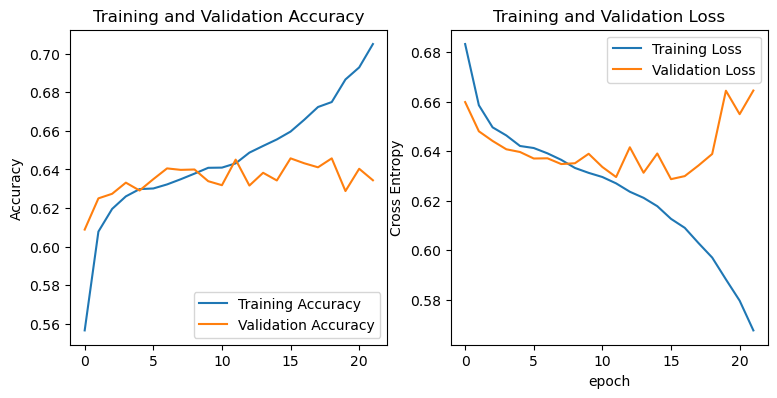

In [26]:
show_history_fit(history)

165/165 [==============================] - 21s 118ms/step - loss: 0.6351 - accuracy: 0.6403
tf.Tensor([1 0 1 ... 0 0 1], shape=(10532,), dtype=int64)
tf.Tensor([1 1 1 ... 1 0 1], shape=(10532,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.6217    0.5626    0.5907      4858
           1     0.6537    0.7069    0.6793      5674

    accuracy                         0.6403     10532
   macro avg     0.6377    0.6347    0.6350     10532
weighted avg     0.6389    0.6403    0.6384     10532



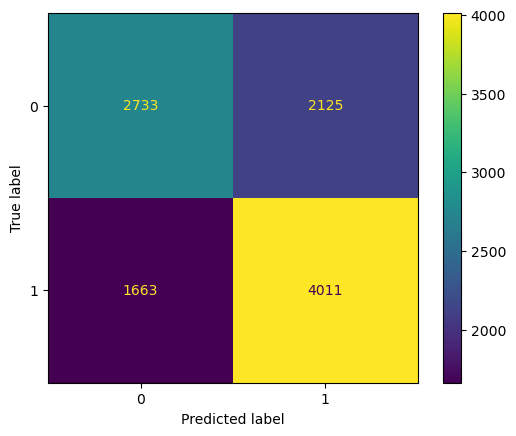

In [25]:
load_best_model_and_evaluate(path_model, test_ds)

### Experiment 4

In [111]:
input = tf.keras.Input(shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS))
x = layers.Rescaling(1./255)(input)
x = layers.Conv2D(filters=96, kernel_size=(11,11), strides=(4,4), activation='relu')(x)
x = layers.BatchNormalization()(x)
x = layers.MaxPool2D(pool_size=(3,3), strides=(2,2))(x)
x = layers.Conv2D(filters=256, kernel_size=(5,5), strides=(1,1), activation='relu', padding="same")(x)
x = layers.MaxPool2D(pool_size=(3,3), strides=(2,2))(x)
x = layers.Conv2D(filters=384, kernel_size=(3,3), strides=(1,1), activation='relu', padding="same")(x)
x = layers.BatchNormalization()(x)
x = layers.Conv2D(filters=384, kernel_size=(3,3), strides=(1,1), activation='relu', padding="same")(x)
x = layers.GlobalAveragePooling2D()(x)
#x = layers.Dropout(0.3)(x)
x = layers.Dense(1000, activation='relu')(x)
x = layers.Dropout(0.4)(x)
x = layers.Dense(256, activation='relu')(x)
x = layers.Dropout(0.3)(x)
output = layers.Dense(NUM_CLASSES, activation='softmax')(x)

model = tf.keras.Model(inputs=input, outputs = output)


compile_model(model, 'adam', 0.0001)

Model: "model_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_18 (InputLayer)       [(None, 250, 250, 3)]     0         
                                                                 
 rescaling_3 (Rescaling)     (None, 250, 250, 3)       0         
                                                                 
 conv2d_123 (Conv2D)         (None, 60, 60, 96)        34944     
                                                                 
 batch_normalization_106 (Ba  (None, 60, 60, 96)       384       
 tchNormalization)                                               
                                                                 
 max_pooling2d_15 (MaxPoolin  (None, 29, 29, 96)       0         
 g2D)                                                            
                                                                 
 conv2d_124 (Conv2D)         (None, 29, 29, 256)       614

In [112]:
path_model = general_path_models+'/extra_binary_models_sc/ACNN_GLOBAL_scratch_DP_bis_32_2x256_512_dp_epoch_30_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model)

Epoch 1/30
627/627 [==============================] - ETA: 0s - loss: 0.6793 - accuracy: 0.5817
Epoch 00001: val_loss improved from inf to 0.67901, saving model to ./extra_binary_models_sc\ACNN_GLOBAL_scratch_DP_bis_32_2x256_512_dp_epoch_30_adam_1e-4.h5
627/627 [==============================] - 97s 151ms/step - loss: 0.6793 - accuracy: 0.5817 - val_loss: 0.6790 - val_accuracy: 0.5871
Epoch 2/30
626/627 [============================>.] - ETA: 0s - loss: 0.6558 - accuracy: 0.6101
Epoch 00002: val_loss improved from 0.67901 to 0.67060, saving model to ./extra_binary_models_sc\ACNN_GLOBAL_scratch_DP_bis_32_2x256_512_dp_epoch_30_adam_1e-4.h5
627/627 [==============================] - 161s 256ms/step - loss: 0.6559 - accuracy: 0.6101 - val_loss: 0.6706 - val_accuracy: 0.6119
Epoch 3/30
626/627 [============================>.] - ETA: 0s - loss: 0.6512 - accuracy: 0.6161
Epoch 00003: val_loss did not improve from 0.67060
627/627 [==============================] - 143s 226ms/step - loss: 0.651

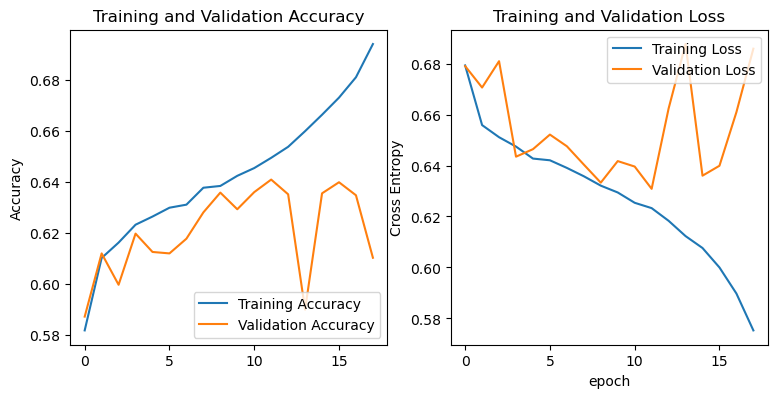

In [113]:
show_history_fit(history)

165/165 [==============================] - 38s 212ms/step - loss: 0.6344 - accuracy: 0.6399
tf.Tensor([1 0 1 ... 0 1 1], shape=(10532,), dtype=int64)
tf.Tensor([0 1 0 ... 0 1 1], shape=(10532,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.5957    0.6822    0.6360      4858
           1     0.6893    0.6036    0.6436      5674

    accuracy                         0.6399     10532
   macro avg     0.6425    0.6429    0.6398     10532
weighted avg     0.6461    0.6399    0.6401     10532



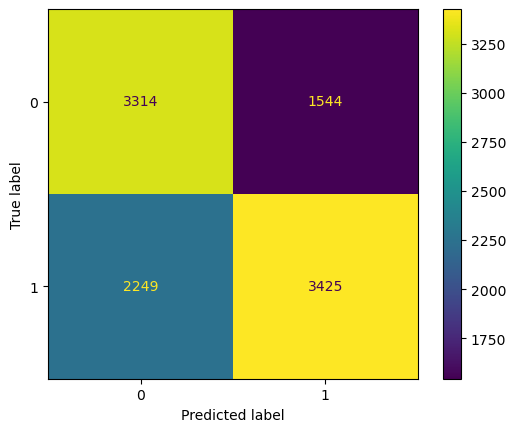

In [114]:
load_best_model_and_evaluate(path_model, test_ds)